# Deep Q Learning with Supervised Initialized Model


Early versions of this notebook tried to train an agent to navigate Wumpus World using a very simple model initialized from random weights.  There were two problems I faced.

1) The training took a long time, and the loss function varied allot, so it was hard to know if I had the correct training parameters, like learning rate.

2) I did not know if the model architecture was appropriate enough to actually solve Wumpus World.

To address these problems, I decided that I would use supervised learning to discover an appropriate neural network architecture.  Then, I decapitated that model to turn the softmax output into a linear output to calculate the value function.  Using the wieghts learned through supervised learning, I tried to get the model to perform even better.

As you will see from below, the reinforcement learning strategies I used would either 1) result in no improvement or degradation of the model's performance; 2) It would change the weights to make overall performance even worse.


# Approach
As in the supervised learning approach in the other notebook, I structured the code to make use of tune.  As mentioned in the other notebook, the hope was to make more efficient use of my computer resources (my laptop on a linux virtual machine).

You will see, that I initialize the model weights with a model checkpoint.

In [1]:
import os
os.chdir(os.getcwd() + "/..")

In [2]:
import numpy as np
np.random.seed(5)
from wumpusWorld.Bayes import *
from wumpusWorld.environment.Environment import *
from wumpusWorld.visualizer.visualizer import *
import plotly.graph_objs as go
import wumpusWorld.agent.causal_graphs as cg

In [3]:
import torch
from IPython.display import clear_output
import random
from matplotlib import pylab as plt

In [4]:
from wumpusWorld.agent.DeepQAgent import *

In [5]:
from __future__ import print_function
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from functools import partial
from torch.utils.data import random_split
from torch.optim.lr_scheduler import StepLR
import copy
from collections import deque

In [6]:
from ray import tune
from ray.tune import CLIReporter
from ray.tune.schedulers import ASHAScheduler

In [7]:
from collections import deque
import json
import copy

In [8]:
import numpy as np
import torch
from IPython.display import clear_output
import random
from matplotlib import pylab as plt

In [9]:
from torch.utils.tensorboard import SummaryWriter

In [10]:
from ray import tune
from ray.tune import CLIReporter
from ray.tune.schedulers import ASHAScheduler

To construct a feature vector with the available information, I just make a function that accepts the agent, deep_agent and percept, and convert the relevant information into a vector.

In [11]:
def create_feature_vector(agent: Agent, deep_agent: DeepQAgent, percept: Percept):
    agent_location = np.zeros((4,4))
    agent_visited = np.zeros((4,4))
    stench_smell = np.zeros((4,4))
    breeze_felt = np.zeros((4,4))
    orientation = []
    for item in deep_agent.G.nodes.items():
        agent_location[item[1]['x'], item[1]['y']] = 0
        agent_visited[item[1]['x'], item[1]['y']] = float(item[1]['visited'])
        stench_smell[item[1]['x'], item[1]['y']] = 1.0 if item[1]['stench'] else 0.0
        breeze_felt[item[1]['x'], item[1]['y']] = 1.0 if item[1]['breeze'] else 0.0

    spatial_info = np.dstack((agent_location, agent_visited, stench_smell, breeze_felt))    
    orientation_info = np.array([float(agent.orientation == 'North'),
                           float(agent.orientation == 'East'),
                           float(agent.orientation == 'South'),
                           float(agent.orientation == 'West')])
    discrete_info = np.array([float(agent.hasGold),
                             float(percept.glitter),
                             float(agent.hasArrow),
                             float(percept.scream)])
    return np.concatenate((spatial_info.reshape(-1), orientation_info[:], discrete_info[:]))

In [12]:
def generate_spatial_obsevations(agent: Agent, deep_agent: DeepQAgent, percept: Percept) -> DeepQAgent:
    for node in deep_agent.G.nodes.items():
        node[1]['current_location'] = node[1]['x'] == agent.location.x and node[1]['y'] == agent.location.y
    deep_agent.G.nodes[agent.location.x + agent.location.y * 4]['breeze'] = percept.breeze
    deep_agent.G.nodes[agent.location.x + agent.location.y * 4]['stench'] = percept.stench
    deep_agent.G.nodes[agent.location.x + agent.location.y * 4]['visited'] = True    
    return deep_agent

In [13]:
action_set = {
    0: Forward(),
    1: TurnLeft(),
    2: TurnRight(),
    3: Shoot(),
    4: Grab(),
    5: Climb()
}

Make note of the model below, which was designed to allow the construction of a model with different depths and different widths at each layer.

In [14]:
class Agent_Net(nn.Module):
    @staticmethod
    def create_layer_list(config):
        layers = [config['l_in'], config['l1']]
        if not config["l2"] == 0:
            layers.append(config["l2"])
        if not config["l3"] == 0:
            layers.append(config["l3"])
        if not config["l4"] == 0:
            layers.append(config["l4"])           
        if not config["l5"] == 0:
            layers.append(config["l5"])                 
        layers.append(config['l_out'])
        return layers
    
    def __init__(self, config):
        super(Agent_Net, self).__init__()    
        self.linear = nn.ModuleList()        
        layers = self.create_layer_list(config)

        for (dim1, dim2) in list(zip(layers[:-1], layers[1:])):
            self.linear.append(nn.Linear(dim1, dim2))
            
    def forward(self, x):
        for layer in self.linear[:-1]:
            x = layer(x)
            x = F.relu(x)

        #x = self.linear[-1](x)
        output = self.linear[-1](x)
        #output = F.log_softmax(x, dim=1)
        return output

The test function tries to measure the performance of the model based on how successful the performance of the model was when executing an actual game.  

In [15]:
def test(args, config, model):
    success = 0
    not_success = 0
    rewards = []
    success_moves = []
    deaths = 0
    aborts = 0
    num = 1000
    errors = 0
    max_move_termination = 0
    for i in range(args.test_batch_size):
        deep_agent, agent, env, percept = initialize_game(config)
        moves = 0
        #print("episode : " + str(i))
        while not env.terminated and moves < args.max_moves:

            state = create_feature_vector(agent, 
                                       generate_spatial_obsevations(agent, deep_agent, percept), 
                                       percept)                   
            
            state_ = torch.from_numpy(state.reshape((1, config["l_in"]))).float()
            
            moves += 1
            qval = model(state_) # computes Q values from the input state in order to select an action
            qval_ = qval.data.numpy()
            action_ = np.argmax(qval_)

            action = action_set[action_]        
            agent, percept = env.applyAction(action, percept, agent)          


        if agent.hasGold and agent.isAlive:
            success += 1    
            success_moves.append(moves)
        elif not agent.isAlive:
            not_success += 1
            deaths += 1
        elif not moves < args.max_moves:
            max_move_termination += 1
            not_success += 1            
        elif agent.isAlive and not agent.hasGold:
            not_success += 1
            aborts += 1
        else:
            errors += 1
            not_success += 1
        rewards.append(percept.reward)
    return success, not_success, deaths, aborts, errors, max_move_termination, rewards, success_moves

Here are some functions mostly to clean up the code.

In [16]:
def generate_state(feature_vector, config):
    state_ = feature_vector + np.random.rand(1, config["l_in"])/100.0
    return torch.from_numpy(state_).float()

def load_data(batch_size, replay):
    minibatch = random.sample(replay, batch_size) # randomly samples a subset of the replay list
    state1_batch = torch.cat([s1 for (s1,a,r,s2,d) in minibatch]) # separates out the components of each experience into separate mini-batch tensors
    action_batch = torch.Tensor([a for (s1,a,r,s2,d) in minibatch])
    reward_batch = torch.Tensor([r for (s1,a,r,s2,d) in minibatch])            
    state2_batch = torch.cat([s2 for (s1,a,r,s2,d) in minibatch])
    done_batch = torch.Tensor([d for (s1,a,r,s2,d) in minibatch])
    return state1_batch, action_batch, reward_batch, state2_batch, done_batch

# Unlike the get_state_action() function which can iteratively return the experience as determined by the 
# Bayesian agent, here, we are relying on the model we are training to contribute it's prediction of "best"
# action.  Thus, the training loop is a bit more complicated.

def initialize_game(config):
    allowClimbWithoutGold = config["allowClimbWithoutGold"]
    deep_agent = DeepQAgent(gridWidth=4, gridHeight=4, dangerThreshold=0.49, allowClimbWithoutGold=allowClimbWithoutGold)
    prob = Bayes.Probability(0.2)
    agent = deep_agent.create_Agent()
    env = Environment.create_FourByFourRandomEnvironment(4, 4, prob, allowClimbWithoutGold=allowClimbWithoutGold)
    percept = Percept.create_Percept(env.isStench(Coords(0, 0)),
                                    env.isBreeze(Coords(0,0)),
                                    env.isGlitter(Coords(0,0)))
    return deep_agent, agent, env, percept

Below is the main training function.  I use a closer with args to create a function which is only parameterized by config.  This specific function signiture is required by tune.

In [17]:
def make_trainer(args):

    def train_agent_model(config, checkpoint_dir=None, data_dir=None):         
        model = Agent_Net(config)
        device = "cpu"
        if torch.cuda.is_available():
            device = "cuda:0"
            if gpus_per_trial > 1:
                model = nn.DataParallel(best_trained_model)
        model.to(device)    

        model_state, optimizer_state = torch.load(os.path.join(
            args.intial_model_checkpoint_dir, "checkpoint"))
        model.load_state_dict(model_state)

        model2 = copy.deepcopy(model) #make a new copy of the model
        model2.load_state_dict(model.state_dict()) #copy over the original model parameters

        loss_fn = torch.nn.MSELoss() 
        optimizer = torch.optim.Adam(model.parameters(), lr=config['learning_rate'])
        
        if checkpoint_dir:
            model_state, optimizer_state, step = torch.load(os.path.join(checkpoint_dir, "checkpoint"))
            model.load_state_dict(model_state)
            optimizer.load_state_dict(optimizer_state)
        else:
            step = 0

        replay = deque(maxlen = config['mem_size']) # creates the memory replay as a deque list    
             
        for epoch in range(args.epochs):
            deep_agent, agent, env, percept = initialize_game(config)

            feature_vector = create_feature_vector(agent, 
                                                   generate_spatial_obsevations(agent, deep_agent, percept), 
                                                   percept)
            state1 = generate_state(feature_vector, config)

            mov = 0
            losses = []  
            while (not env.terminated) or mov < args.max_moves: 
                #j+=1
                mov += 1
                qval = model(state1) # computes Q values from the input state in order to select an action
                qval_ = qval.data.numpy()
                if (random.random() < config["epsilon"]): # selects an action using the epsilon-greedy strategy
                    action_ = np.random.randint(0,6)
                else:
                    action_ = np.argmax(qval_)

                action = action_set[action_]        
                agent, percept = env.applyAction(action, percept, agent)          

                feature_vector = create_feature_vector(agent, 
                                                       generate_spatial_obsevations(agent, deep_agent, percept), 
                                                       percept)

                state2 = generate_state(feature_vector, config)

                reward = percept.reward
                done = True if reward > 0 else False
                exp =  (state1, action_, reward, state2, done) # creates an experience of state, reward, action and the next state as a tuple
                replay.append(exp) # adds the experience to the experience replay list
                state1 = state2

                if len(replay) > config["batch_size"] and len(replay) > args.test_batch_size: # if the replay list is at least as long as the mini-batch size, begins the mini-batch training                  
                    state1_batch, action_batch, reward_batch, state2_batch, done_batch = load_data(config["batch_size"], replay)
                    
                    Q1 = model(state1_batch) # recomputes Q values for the mini-batch states to get gradients
                    with torch.no_grad():
                        Q2 = model2(state2_batch) # computes Q values for the mini-batch of next states, but doesn't compute gradients
 
                    Y = reward_batch + config["gamma"] * ((1-done_batch) * torch.max(Q2,dim=1)[0]) # computes the target Q values we want to DQN to learn
                    X = Q1.gather(dim=1,index=action_batch.long().unsqueeze(dim=1)).squeeze()
                    loss = loss_fn(X, Y.detach())
                    print(epoch, loss.item())
                    clear_output(wait=True)
                    optimizer.zero_grad() 
                    loss.backward()
                    losses.append(loss.item())
                    optimizer.step()
                    
                    if step % args.sync_freq == 0: 
                        model2.load_state_dict(model.state_dict())
                        
                    step +=1
                    if step % args.log_interval:  
                        tune.report(training_loss=sum(losses)/len(losses))
                    if step % args.test_interval:
                        success, not_success, deaths, aborts, errors, max_move_terminations, rewards, success_moves = test(args, config, model)
                        tune.report(training_loss=sum(losses)/len(losses),
                                    success_rate=success/(success + not_success),
                                    death_rate=deaths/(success + not_success),
                                    abort_rate=aborts/(success + not_success),
                                    max_move_termination_rate=max_move_terminations/(success + not_success),
                                    average_rewards=sum(rewards)/len(rewards),
                                    max_reward=max(rewards), 
                                    success_moves=sum(success_moves)/len(success_moves))

            with tune.checkpoint_dir(epoch) as checkpoint_dir:
                path = os.path.join(checkpoint_dir, "checkpoint")
                torch.save((model.state_dict(), optimizer.state_dict()), path)
        
    return train_agent_model

Below, you can see how the training session was parameterized.  You can also see the directories used to load the inital model weights.  I used the same starting weights for all training sessions.  

Further, you can see from the config dict that I used a combination of grid search and random search to choose the hyperparameters for each training session.

In [18]:
best_dir = '/home/ntanti/ray_results/agent_training_trial_005/train_agent_model_02d57_00003_3_allowClimbWithoutGold=True,batch_size=500,l1=100,l2=500,l3=0,l4=0,l5=400,l_in=72,l_out=6,learning__2020-12-07_00-12-56/'

with open(best_dir + "params.json") as f:
    initial_config = json.load(f)

class args:
    pass

args.test_batch_size = 500
args.max_moves = 200
args.sync_freq = 500 # set the update frequency for synchronizing the target model parameters to the main DQN
args.epochs=50
args.no_cuda = False
args.dry_run = False
args.seed = 1
args.log_interval = 50
args.test_interval = 500
args.save_model = False
args.num_samples =20
args.intial_model_checkpoint_dir = best_dir + 'checkpoint_601/'


config = {
    "gamma": tune.uniform(0.0,1.0),
    "epsilon": tune.choice([0.0, 0.001, 0.01, 0.05, 0.1, 0.15, 0.2]),
    "l1": initial_config["l1"],
    "l2": initial_config["l2"],
    "l3": initial_config["l3"],
    "l4": initial_config["l4"],
    "l5": initial_config["l5"],
    "l_in": initial_config["l_in"],
    "l_out": initial_config["l_out"],    
    "batch_size": tune.sample_from(lambda _: 100*np.random.randint(1, 5)),
    "mem_size": tune.choice([10000]), # sets the total size of the experience replay memory
    "learning_rate": tune.loguniform(1e-5, 1e-2),
    "allowClimbWithoutGold": tune.choice([True, False])    
}



In [19]:
train_agent_model = make_trainer(args)

And finally, the actual execution of the code is below.  args.num_samples is simply the number of samples from hyperaparameter space that are choosen. My poor estimation of execution time forced me to manually interrupt the kernel. 

In [21]:
result = tune.run(
    train_agent_model,
    name="DeepQ_agent_training_trial_005",    
    resources_per_trial={"cpu": 1},
    config=config,
    num_samples=args.num_samples
)

2020-12-07 13:42:02,494	INFO services.py:1092 -- View the Ray dashboard at http://127.0.0.1:8265


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size
train_agent_model_0ca9e_00000,RUNNING,,True,400,0.15,0.221993,0.00311877,10000


(pid=122485) /home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729047590/work/c10/cuda/CUDAFunctions.cpp:100.)
(pid=122485)   return torch._C._cuda_getDeviceCount() > 0
(pid=122483) /home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729047590/work/c10/cuda/CUDAFunctions.cpp:100.)
(pid=122483)   return torch._C._cuda_getDeviceCount() > 0
(pid=122484) /home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/to

(pid=122485) 2 6026.81982421875
(pid=122485) 
Result for train_agent_model_0ca9e_00002:
  date: 2020-12-07_13-42-07
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 1
  node_ip: 192.168.247.132
  pid: 122485
  should_checkpoint: true
  time_since_restore: 0.4569547176361084
  time_this_iter_s: 0.4569547176361084
  time_total_s: 0.4569547176361084
  timestamp: 1607377327
  timesteps_since_restore: 0
  training_iteration: 1
  training_loss: 6026.81982421875
  trial_id: 0ca9e_00002
  
Result for train_agent_model_0ca9e_00001:
  date: 2020-12-07_13-42-08
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 1
  node_ip: 1

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,1,0.79331,327.155,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,1,0.607606,5406.66,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,2,38.073,6026.82,0.274,0.292
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,1,0.907785,88495.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 3578.474365234375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.42
  average_rewards: -272.362
  date: 2020-12-07_13-42-50
  death_rate: 0.266
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 2
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 153.30573248407643
  success_rate: 0.314
  time_since_restore: 43.23153567314148
  time_this_iter_s: 42.623929500579834
  time_total_s: 43.23153567314148
  timestamp: 1607377370
  timesteps_since_restore: 0
  training_iteration: 2
  training_loss: 5406.65869140625
  trial_id: 0ca9e_00001
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,1,0.79331,327.155,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,2,43.2315,5406.66,0.314,0.266
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,3,38.1572,4802.65,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,1,0.907785,88495.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122484) 2 16266.3486328125
(pid=122484) 
Result for train_agent_model_0ca9e_00000:
  abort_rate: 0.64
  average_rewards: -141.248
  date: 2020-12-07_13-43-02
  death_rate: 0.118
  done: false
  experiment_id: c7745132852a44448177f51645b0a2ae
  experiment_tag: 0_allowClimbWithoutGold=True,batch_size=400,epsilon=0.15,gamma=0.22199,learning_rate=0.0031188,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 2
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122483
  success_moves: 133.06611570247935
  success_rate: 0.242
  time_since_restore: 54.65672779083252
  time_this_iter_s: 53.863418102264404
  time_total_s: 54.65672779083252
  timestamp: 1607377382
  timesteps_since_restore: 0
  training_iteration: 2
  training_loss: 327.15521240234375
  trial_id: 0ca9e_00000
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,2,54.6567,327.155,0.242,0.118
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,3,43.2865,10836.5,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,3,38.1572,4802.65,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,1,0.907785,88495.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122483) 2 194.6417999267578
(pid=122483) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -372.806
  date: 2020-12-07_13-43-18
  death_rate: 0.3
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 2
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 155.29457364341084
  success_rate: 0.258
  time_since_restore: 70.81887221336365
  time_this_iter_s: 69.91108751296997
  time_total_s: 70.81887221336365
  timestamp: 1607377398
  timesteps_since_restore: 0
  training_iteration: 2
  training_loss: 88495.640625
  trial_id: 0ca9e_00003
  
(pid=122482) 0 98668.1015625
(pid=122482) 


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,3,54.7032,260.899,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,3,43.2865,10836.5,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,3,38.1572,4802.65,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,2,70.8189,88495.6,0.258,0.3
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.436
  average_rewards: -309.624
  date: 2020-12-07_13-43-23
  death_rate: 0.314
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 4
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 146.344
  success_rate: 0.25
  time_since_restore: 75.96940207481384
  time_this_iter_s: 37.81222653388977
  time_total_s: 75.96940207481384
  timestamp: 1607377403
  timesteps_since_restore: 0
  training_iteration: 4
  training_loss: 4802.6470947265625
  trial_id: 0ca9e_00002
  
(pid=122485) 2 977.351318359375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.442
  average_rewards: -266.504
  date: 2020-12-07_13-43-25
  death_rate: 0.28
  done: false
  experiment_id: f8b4045d721e4674

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,3,54.7032,260.899,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,4,78.3241,10836.5,0.278,0.28
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,5,76.0115,3527.55,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,3,70.9041,93581.9,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122484) 2 11134.87890625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.472
  average_rewards: -235.004
  date: 2020-12-07_13-44-09
  death_rate: 0.254
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 6
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 139.91970802919707
  success_rate: 0.274
  time_since_restore: 122.08609199523926
  time_this_iter_s: 46.074580907821655
  time_total_s: 122.08609199523926
  timestamp: 1607377449
  timesteps_since_restore: 0
  training_iteration: 6
  training_loss: 3527.5485026041665
  trial_id: 0ca9e_00002
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,3,54.7032,260.899,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,5,78.3728,10936,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,6,122.086,3527.55,0.274,0.254
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,3,70.9041,93581.9,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 3445.482177734375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.418
  average_rewards: -312.618
  date: 2020-12-07_13-44-14
  death_rate: 0.31
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 6
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 153.27941176470588
  success_rate: 0.272
  time_since_restore: 127.4130699634552
  time_this_iter_s: 49.040308237075806
  time_total_s: 127.4130699634552
  timestamp: 1607377454
  timesteps_since_restore: 0
  training_iteration: 6
  training_loss: 10935.962076822916
  trial_id: 0ca9e_00001
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,3,54.7032,260.899,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,6,127.413,10936,0.272,0.31
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,7,122.183,3507.03,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,3,70.9041,93581.9,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122484) 2 5308.31005859375
(pid=122484) 
Result for train_agent_model_0ca9e_00000:
  abort_rate: 0.792
  average_rewards: -83.17
  date: 2020-12-07_13-44-27
  death_rate: 0.042
  done: false
  experiment_id: c7745132852a44448177f51645b0a2ae
  experiment_tag: 0_allowClimbWithoutGold=True,batch_size=400,epsilon=0.15,gamma=0.22199,learning_rate=0.0031188,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 4
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122483
  success_moves: 104.43373493975903
  success_rate: 0.166
  time_since_restore: 139.81550788879395
  time_this_iter_s: 85.11235404014587
  time_total_s: 139.81550788879395
  timestamp: 1607377467
  timesteps_since_restore: 0
  training_iteration: 4
  training_loss: 260.8985061645508
  trial_id: 0ca9e_00000
  
(pid=122483) 2 93.07987213134766
(pid=122483) 


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,4,139.816,260.899,0.166,0.042
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,7,127.464,9529.05,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,7,122.183,3507.03,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,3,70.9041,93581.9,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -336.524
  date: 2020-12-07_13-44-56
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 4
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.67407407407407
  success_rate: 0.27
  time_since_restore: 168.2402741909027
  time_this_iter_s: 97.33616161346436
  time_total_s: 168.2402741909027
  timestamp: 1607377496
  timesteps_since_restore: 0
  training_iteration: 4
  training_loss: 93581.87109375
  trial_id: 0ca9e_00003
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,5,139.997,204.959,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,7,127.464,9529.05,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,7,122.183,3507.03,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,4,168.24,93581.9,0.27,0.288
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122482) 0 90666.7890625
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.414
  average_rewards: -249.646
  date: 2020-12-07_13-45-05
  death_rate: 0.272
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 8
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 142.51592356687897
  success_rate: 0.314
  time_since_restore: 177.72898411750793
  time_this_iter_s: 55.545939922332764
  time_total_s: 177.72898411750793
  timestamp: 1607377505
  timesteps_since_restore: 0
  training_iteration: 8
  training_loss: 3507.0319213867188
  trial_id: 0ca9e_00002
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,5,139.997,204.959,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,7,127.464,9529.05,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,8,177.729,3507.03,0.314,0.272
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,5,168.271,92610.2,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 6080.50439453125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.44
  average_rewards: -299.968
  date: 2020-12-07_13-45-08
  death_rate: 0.308
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 8
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 140.52380952380952
  success_rate: 0.252
  time_since_restore: 180.85994124412537
  time_this_iter_s: 53.3963418006897
  time_total_s: 180.85994124412537
  timestamp: 1607377508
  timesteps_since_restore: 0
  training_iteration: 8
  training_loss: 9529.049072265625
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5839.53076171875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.45
  average_rewards: -225.98
  date: 2020-12-07_13-45-42
  death_rate:

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,5,139.997,204.959,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,9,180.896,8791.15,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,10,215.245,4021.73,0.298,0.252
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,5,168.271,92610.2,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 6198.10546875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.488
  average_rewards: -258.956
  date: 2020-12-07_13-45-43
  death_rate: 0.266
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 10
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 142.0650406504065
  success_rate: 0.246
  time_since_restore: 216.27404284477234
  time_this_iter_s: 35.37848687171936
  time_total_s: 216.27404284477234
  timestamp: 1607377543
  timesteps_since_restore: 0
  training_iteration: 10
  training_loss: 8791.14541015625
  trial_id: 0ca9e_00001
  
(pid=122484) 2 185.955078125
(pid=122484) 
Result for train_agent_model_0ca9e_00000:
  abort_rate: 0.85
  average_rewards: -133.396
  date: 2020-12-07_13-45-46
  death_rate: 0.

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,7,219.174,166.977,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,11,216.32,7356.95,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,11,215.382,4384.46,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,6,236.449,92610.2,0.27,0.3
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.384
  average_rewards: -300.216
  date: 2020-12-07_13-46-13
  death_rate: 0.32
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 12
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 142.65540540540542
  success_rate: 0.296
  time_since_restore: 246.26512503623962
  time_this_iter_s: 29.94550895690918
  time_total_s: 246.26512503623962
  timestamp: 1607377573
  timesteps_since_restore: 0
  training_iteration: 12
  training_loss: 7356.947021484375
  trial_id: 0ca9e_00001
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,7,219.174,166.977,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,12,246.265,7356.95,0.296,0.32
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,11,215.382,4384.46,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,7,236.498,92044.9,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122484) 2 5296.12939453125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.488
  average_rewards: -205.688
  date: 2020-12-07_13-46-14
  death_rate: 0.224
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 12
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 139.93055555555554
  success_rate: 0.288
  time_since_restore: 247.27393984794617
  time_this_iter_s: 31.892241716384888
  time_total_s: 247.27393984794617
  timestamp: 1607377574
  timesteps_since_restore: 0
  training_iteration: 12
  training_loss: 4384.4562581380205
  trial_id: 0ca9e_00002
  
(pid=122485) 2 6185.2724609375
(pid=122485) 
Result for train_agent_model_0ca9e_00000:
  abort_rate: 0.94
  average_rewards: -114.676
  date: 2020-12-07_13-46-55
  dea

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,8,287.617,166.977,0.06,0
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,13,246.3,7062.54,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,13,247.343,4641.72,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,7,236.498,92044.9,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.454
  average_rewards: -328.338
  date: 2020-12-07_13-46-55
  death_rate: 0.32
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 14
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 147.31858407079645
  success_rate: 0.226
  time_since_restore: 287.8177864551544
  time_this_iter_s: 41.517855405807495
  time_total_s: 287.8177864551544
  timestamp: 1607377615
  timesteps_since_restore: 0
  training_iteration: 14
  training_loss: 7062.544503348215
  trial_id: 0ca9e_00001
  
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.428
  average_rewards: -295.802
  date: 2020-12-07_13-46-55
  death_rate: 0.308
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag:

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,9,287.681,139.18,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,15,287.9,6192.93,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,15,288.053,4830.22,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,8,306.656,92044.9,0.268,0.292
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122482) 0 91753.4375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.448
  average_rewards: -276.7
  date: 2020-12-07_13-47-26
  death_rate: 0.282
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 16
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 146.23703703703703
  success_rate: 0.27
  time_since_restore: 319.48111510276794
  time_this_iter_s: 31.42846179008484
  time_total_s: 319.48111510276794
  timestamp: 1607377646
  timesteps_since_restore: 0
  training_iteration: 16
  training_loss: 4830.218048095703
  trial_id: 0ca9e_00002
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,9,287.681,139.18,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,15,287.9,6192.93,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,16,319.481,4830.22,0.27,0.282
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,9,306.691,91986.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 3659.829345703125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.492
  average_rewards: -295.802
  date: 2020-12-07_13-47-29
  death_rate: 0.268
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 16
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 161.46666666666667
  success_rate: 0.24
  time_since_restore: 322.1116886138916
  time_this_iter_s: 34.21139311790466
  time_total_s: 322.1116886138916
  timestamp: 1607377649
  timesteps_since_restore: 0
  training_iteration: 16
  training_loss: 6192.934811592102
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5317.31396484375
(pid=122484) 
Result for train_agent_model_0ca9e_00000:
  abort_rate: 0.94
  average_rewards: -138.452
  date: 2020-12-07_13-48-00
  death_ra

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,10,353.084,139.18,0.06,0
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,17,322.143,6095.64,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,17,319.53,4700.17,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,9,306.691,91986.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.474
  average_rewards: -225.494
  date: 2020-12-07_13-48-02
  death_rate: 0.256
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 18
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 128.83703703703705
  success_rate: 0.27
  time_since_restore: 355.3274359703064
  time_this_iter_s: 35.7973256111145
  time_total_s: 355.3274359703064
  timestamp: 1607377682
  timesteps_since_restore: 0
  training_iteration: 18
  training_loss: 4700.174858940973
  trial_id: 0ca9e_00002
  
(pid=122485) 2 6231.85009765625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.466
  average_rewards: -330.21
  date: 2020-12-07_13-48-07
  death_rate: 0.296
  done: false
  experiment_id: f8b40

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,11,353.228,118.937,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,18,359.978,6095.64,0.238,0.296
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,19,355.366,4853.34,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,9,306.691,91986.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122484) 2 5809.595703125
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -330.504
  date: 2020-12-07_13-48-17
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 10
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.77304964539007
  success_rate: 0.282
  time_since_restore: 369.9847266674042
  time_this_iter_s: 63.293907165527344
  time_total_s: 369.9847266674042
  timestamp: 1607377697
  timesteps_since_restore: 0
  training_iteration: 10
  training_loss: 91986.628125
  trial_id: 0ca9e_00003
  
(pid=122482) 0 97085.5703125
(pid=122482) 


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,11,353.228,118.937,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,19,360.03,6067.04,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,19,355.366,4853.34,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,10,369.985,91986.6,0.282,0.274
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.454
  average_rewards: -267.724
  date: 2020-12-07_13-48-34
  death_rate: 0.296
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 20
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 129.6
  success_rate: 0.25
  time_since_restore: 387.1908118724823
  time_this_iter_s: 27.160672903060913
  time_total_s: 387.1908118724823
  timestamp: 1607377714
  timesteps_since_restore: 0
  training_iteration: 20
  training_loss: 6067.038816070557
  trial_id: 0ca9e_00001
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,11,353.228,118.937,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,20,387.191,6067.04,0.25,0.296
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,19,355.366,4853.34,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,11,370.022,92836.5,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122484) 2 11041.9287109375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.46
  average_rewards: -242.948
  date: 2020-12-07_13-48-35
  death_rate: 0.26
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 20
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 138.13571428571427
  success_rate: 0.28
  time_since_restore: 388.222754240036
  time_this_iter_s: 32.85661482810974
  time_total_s: 388.222754240036
  timestamp: 1607377715
  timesteps_since_restore: 0
  training_iteration: 20
  training_loss: 4853.3423828125
  trial_id: 0ca9e_00002
  
(pid=122485) 2 3876.494384765625
(pid=122485) 
Result for train_agent_model_0ca9e_00000:
  abort_rate: 0.962
  average_rewards: -136.52
  date: 2020-12-07_13-48-56
  death_rate: 

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,12,409.189,118.937,0.038,0
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,21,387.235,6519.3,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,21,388.263,4764.54,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,11,370.022,92836.5,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122483) 2 17.282039642333984
(pid=122483) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.406
  average_rewards: -326.548
  date: 2020-12-07_13-49-07
  death_rate: 0.316
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 22
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 157.17985611510792
  success_rate: 0.278
  time_since_restore: 420.3704218864441
  time_this_iter_s: 32.107154846191406
  time_total_s: 420.3704218864441
  timestamp: 1607377747
  timesteps_since_restore: 0
  training_iteration: 22
  training_loss: 4764.538019353693
  trial_id: 0ca9e_00002
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,13,409.229,104.415,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,21,387.235,6519.3,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,22,420.37,4764.54,0.278,0.316
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,11,370.022,92836.5,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 6246.4931640625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.454
  average_rewards: -257.312
  date: 2020-12-07_13-49-09
  death_rate: 0.252
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 22
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 150.36054421768708
  success_rate: 0.294
  time_since_restore: 422.02528405189514
  time_this_iter_s: 34.79072117805481
  time_total_s: 422.02528405189514
  timestamp: 1607377749
  timesteps_since_restore: 0
  training_iteration: 22
  training_loss: 6519.301533785733
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5332.23388671875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.41
  average_rewards: -316.256
  date: 2020-12-07_13-49-15
  death_r

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,13,409.229,104.415,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,23,422.064,6420.38,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,23,420.466,4888.03,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,12,427.547,92836.5,0.316,0.274
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122482) 0 93586.578125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.474
  average_rewards: -287.204
  date: 2020-12-07_13-49-33
  death_rate: 0.294
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 24
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 143.5
  success_rate: 0.232
  time_since_restore: 446.5130159854889
  time_this_iter_s: 26.046557426452637
  time_total_s: 446.5130159854889
  timestamp: 1607377773
  timesteps_since_restore: 0
  training_iteration: 24
  training_loss: 4888.034281412761
  trial_id: 0ca9e_00002
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,13,409.229,104.415,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,23,422.064,6420.38,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,24,446.513,4888.03,0.232,0.294
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,13,427.66,92943.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 6397.056640625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.462
  average_rewards: -269.186
  date: 2020-12-07_13-49-36
  death_rate: 0.29
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 24
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 135.01612903225808
  success_rate: 0.248
  time_since_restore: 449.18134593963623
  time_this_iter_s: 27.1173734664917
  time_total_s: 449.18134593963623
  timestamp: 1607377776
  timesteps_since_restore: 0
  training_iteration: 24
  training_loss: 6420.379229863484
  trial_id: 0ca9e_00001
  
(pid=122484) 2 147.1286163330078
(pid=122484) 
Result for train_agent_model_0ca9e_00000:
  abort_rate: 0.938
  average_rewards: -135.848
  date: 2020-12-07_13-49-50
  death_ra

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,14,462.89,104.415,0.062,0
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,25,449.215,5937.82,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,25,446.562,5004.11,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,13,427.66,92943.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122483) 2 17.854694366455078
(pid=122483) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.432
  average_rewards: -257.44
  date: 2020-12-07_13-50-01
  death_rate: 0.282
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 26
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 139.4965034965035
  success_rate: 0.286
  time_since_restore: 473.9184203147888
  time_this_iter_s: 27.3568856716156
  time_total_s: 473.9184203147888
  timestamp: 1607377801
  timesteps_since_restore: 0
  training_iteration: 26
  training_loss: 5004.112924429087
  trial_id: 0ca9e_00002
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,15,462.956,93.5952,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,25,449.215,5937.82,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,26,473.918,5004.11,0.286,0.282
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,13,427.66,92943.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 6321.73828125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.44
  average_rewards: -253.778
  date: 2020-12-07_13-50-09
  death_rate: 0.274
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 26
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 135.54545454545453
  success_rate: 0.286
  time_since_restore: 481.53721261024475
  time_this_iter_s: 32.32202196121216
  time_total_s: 481.53721261024475
  timestamp: 1607377809
  timesteps_since_restore: 0
  training_iteration: 26
  training_loss: 5937.821490361141
  trial_id: 0ca9e_00001
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,15,462.956,93.5952,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,26,481.537,5937.82,0.286,0.274
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,27,473.961,5098.23,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,13,427.66,92943.6,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122484) 2 5299.38623046875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.468
  average_rewards: -331.096
  date: 2020-12-07_13-50-15
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 14
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.97794117647058
  success_rate: 0.272
  time_since_restore: 487.53496408462524
  time_this_iter_s: 59.87509322166443
  time_total_s: 487.53496408462524
  timestamp: 1607377815
  timesteps_since_restore: 0
  training_iteration: 14
  training_loss: 92943.61272321429
  trial_id: 0ca9e_00003
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,15,462.956,93.5952,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,27,481.594,5892.22,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,27,473.961,5098.23,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,14,487.535,92943.6,0.272,0.26
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122482) 0 103273.0
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.464
  average_rewards: -283.698
  date: 2020-12-07_13-50-30
  death_rate: 0.286
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 28
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 144.432
  success_rate: 0.25
  time_since_restore: 502.68982911109924
  time_this_iter_s: 28.729026794433594
  time_total_s: 502.68982911109924
  timestamp: 1607377830
  timesteps_since_restore: 0
  training_iteration: 28
  training_loss: 5098.229021344866
  trial_id: 0ca9e_00002
  
(pid=122485) 2 6372.61376953125
(pid=122485) 


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,15,462.956,93.5952,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,27,481.594,5892.22,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,28,502.69,5098.23,0.25,0.286
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,15,487.559,94234.8,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.43
  average_rewards: -286.882
  date: 2020-12-07_13-50-36
  death_rate: 0.298
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 28
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 146.06617647058823
  success_rate: 0.272
  time_since_restore: 509.2723262310028
  time_this_iter_s: 27.6782066822052
  time_total_s: 509.2723262310028
  timestamp: 1607377836
  timesteps_since_restore: 0
  training_iteration: 28
  training_loss: 5892.218971797398
  trial_id: 0ca9e_00001
  


Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,15,462.956,93.5952,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,28,509.272,5892.22,0.272,0.298
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,29,502.746,5183.19,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,15,487.559,94234.8,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122484) 2 166.09902954101562
(pid=122484) 
Result for train_agent_model_0ca9e_00000:
  abort_rate: 0.96
  average_rewards: -122.532
  date: 2020-12-07_13-50-37
  death_rate: 0.0
  done: false
  experiment_id: c7745132852a44448177f51645b0a2ae
  experiment_tag: 0_allowClimbWithoutGold=True,batch_size=400,epsilon=0.15,gamma=0.22199,learning_rate=0.0031188,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 16
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122483
  success_moves: 200.0
  success_rate: 0.04
  time_since_restore: 509.976699590683
  time_this_iter_s: 47.02039051055908
  time_total_s: 509.976699590683
  timestamp: 1607377837
  timesteps_since_restore: 0
  training_iteration: 16
  training_loss: 93.59516072273254
  trial_id: 0ca9e_00000
  
(pid=122483) 2 18.56818199157715
(pid=122483) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.464
  average_rewards: -271.628
  date: 2020-12-07_13-50-59
  death_rate: 0.274
  do

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,17,510.022,85.2588,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,29,509.301,5510.48,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,30,532.201,5183.19,0.262,0.274
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,15,487.559,94234.8,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


(pid=122485) 2 6308.4736328125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.428
  average_rewards: -332.684
  date: 2020-12-07_13-51-04
  death_rate: 0.34
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 30
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 142.18965517241378
  success_rate: 0.232
  time_since_restore: 536.9712090492249
  time_this_iter_s: 27.670206785202026
  time_total_s: 536.9712090492249
  timestamp: 1607377864
  timesteps_since_restore: 0
  training_iteration: 30
  training_loss: 5510.477642313639
  trial_id: 0ca9e_00001
  
(pid=122484) 2 141.81204223632812
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.422
  average_rewards: -325.478
  date: 2020-12-07_13-51-13
  death_

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,17,510.022,85.2588,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,31,537.001,5174.94,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,31,532.264,5253.52,,
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,16,545.815,94234.8,0.298,0.28
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.43
  average_rewards: -261.072
  date: 2020-12-07_13-51-28
  death_rate: 0.278
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 32
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 144.5958904109589
  success_rate: 0.292
  time_since_restore: 560.8459284305573
  time_this_iter_s: 28.582112312316895
  time_total_s: 560.8459284305573
  timestamp: 1607377888
  timesteps_since_restore: 0
  training_iteration: 32
  training_loss: 5253.518356323242
  trial_id: 0ca9e_00002
  


(pid=122483) 2020-12-07 13:51:28,220	ERROR function_runner.py:254 -- Runner Thread raised error.
(pid=122483) Traceback (most recent call last):
(pid=122483)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 248, in run
(pid=122483)     self._entrypoint()
(pid=122483)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 316, in entrypoint
(pid=122483)     self._status_reporter.get_checkpoint())
(pid=122483)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 575, in _trainable_func
(pid=122483)     output = fn()
(pid=122483)   File "<ipython-input-17-738904b79507>", line 101, in train_agent_model
(pid=122483) ZeroDivisionError: division by zero
(pid=122483) Exception in thread Thread-2:
(pid=122483) Traceback (most recent call last):
(pid=122483)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7

Trial name,status,loc,allowClimbWithoutGold,batch_size,epsilon,gamma,learning_rate,mem_size,iter,total time (s),training_loss,success_rate,death_rate
train_agent_model_0ca9e_00000,RUNNING,192.168.247.132:122483,True,400,0.15,0.221993,0.00311877,10000,17,510.022,85.2588,,
train_agent_model_0ca9e_00001,RUNNING,192.168.247.132:122484,True,200,0.1,0.363737,0.0002919,10000,31,537.001,5174.94,,
train_agent_model_0ca9e_00002,RUNNING,192.168.247.132:122485,True,400,0.01,0.611744,0.000115455,10000,32,560.846,5253.52,0.292,0.278
train_agent_model_0ca9e_00003,RUNNING,192.168.247.132:122482,False,100,0.05,0.486638,3.65733e-05,10000,17,545.838,94081.7,,
train_agent_model_0ca9e_00004,PENDING,,True,100,0.001,0.0807413,0.00287355,10000,,,,,


2020-12-07 13:51:28,426	ERROR trial_runner.py:793 -- Trial train_agent_model_0ca9e_00000: Error processing event.
Traceback (most recent call last):
  File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/trial_runner.py", line 726, in _process_trial
    result = self.trial_executor.fetch_result(trial)
  File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/ray_trial_executor.py", line 489, in fetch_result
    result = ray.get(trial_future[0], timeout=DEFAULT_GET_TIMEOUT)
  File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/worker.py", line 1452, in get
    raise value.as_instanceof_cause()
ray.exceptions.RayTaskError(TuneError): ray::ImplicitFunc.train() (pid=122483, ip=192.168.247.132)
  File "python/ray/_raylet.pyx", line 482, in ray._raylet.execute_task
  File "python/ray/_raylet.pyx", line 436, in ray._raylet.execute_task.function_executor
  File "/home/ntanti/anaconda3/envs/openai_env37/lib/py

(pid=122485) 2 3914.390625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.45
  average_rewards: -303.184
  date: 2020-12-07_13-51-29
  death_rate: 0.312
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 32
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 143.2941176470588
  success_rate: 0.238
  time_since_restore: 562.4009909629822
  time_this_iter_s: 25.40016007423401
  time_total_s: 562.4009909629822
  timestamp: 1607377889
  timesteps_since_restore: 0
  training_iteration: 32
  training_loss: 5174.936042308807
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5289.06640625
(pid=122484) 


(pid=123704) /home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729047590/work/c10/cuda/CUDAFunctions.cpp:100.)
(pid=123704)   return torch._C._cuda_getDeviceCount() > 0


(pid=123704) 0 85811.4375
(pid=123704) 
Result for train_agent_model_0ca9e_00004:
  date: 2020-12-07_13-51-32
  done: false
  experiment_id: aa861e86293b42fda499d02c04fe69c0
  experiment_tag: 4_allowClimbWithoutGold=True,batch_size=100,epsilon=0.001,gamma=0.080741,learning_rate=0.0028735,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 1
  node_ip: 192.168.247.132
  pid: 123704
  time_since_restore: 0.5243265628814697
  time_this_iter_s: 0.5243265628814697
  time_total_s: 0.5243265628814697
  timestamp: 1607377892
  timesteps_since_restore: 0
  training_iteration: 1
  training_loss: 85811.4375
  trial_id: 0ca9e_00004
  
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.484
  average_rewards: -256.388
  date: 2020-12-07_13-51-55
  death_rate: 0.272
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iteration

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.468
  average_rewards: -255.378
  date: 2020-12-07_13-51-56
  death_rate: 0.274
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 34
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 137.4418604651163
  success_rate: 0.258
  time_since_restore: 589.1111617088318
  time_this_iter_s: 28.224533796310425
  time_total_s: 589.1111617088318
  timestamp: 1607377916
  timesteps_since_restore: 0
  training_iteration: 34
  training_loss: 5174.74613683364
  trial_id: 0ca9e_00002
  
(pid=122485) 2 3765.698974609375
(pid=122485) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.518
  average_rewards: -206.174
  date: 2020-12-07_13-52-06
  death_rate: 0.196
  done: false
  experiment_id: aa

(pid=123704) 0 85035.4921875
(pid=123704) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.436
  average_rewards: -333.416
  date: 2020-12-07_13-52-12
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 18
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.4825174825175
  success_rate: 0.286
  time_since_restore: 605.0471699237823
  time_this_iter_s: 59.209118366241455
  time_total_s: 605.0471699237823
  timestamp: 1607377932
  timesteps_since_restore: 0
  training_iteration: 18
  training_loss: 94081.70138888889
  trial_id: 0ca9e_00003
  


(pid=122482) 0 91407.640625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.43
  average_rewards: -271.482
  date: 2020-12-07_13-52-25
  death_rate: 0.28
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 36
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 148.2896551724138
  success_rate: 0.29
  time_since_restore: 617.961517572403
  time_this_iter_s: 30.177680253982544
  time_total_s: 617.961517572403
  timestamp: 1607377945
  timesteps_since_restore: 0
  training_iteration: 36
  training_loss: 5186.769157833523
  trial_id: 0ca9e_00001
  


(pid=122484) 2 152.16331481933594
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.458
  average_rewards: -222.274
  date: 2020-12-07_13-52-26
  death_rate: 0.25
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 36
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 138.06849315068493
  success_rate: 0.292
  time_since_restore: 618.9487385749817
  time_this_iter_s: 29.785772562026978
  time_total_s: 618.9487385749817
  timestamp: 1607377946
  timesteps_since_restore: 0
  training_iteration: 36
  training_loss: 5096.465738932292
  trial_id: 0ca9e_00002
  
(pid=122485) 2 6616.19921875
(pid=122485) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.642
  average_rewards: -117.76
  date: 2020-12-07_13-52-56
  death_r

(pid=123704) 0 89764.609375
(pid=123704) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.394
  average_rewards: -326.45
  date: 2020-12-07_13-53-00
  death_rate: 0.332
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 38
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 148.06569343065692
  success_rate: 0.274
  time_since_restore: 653.2688708305359
  time_this_iter_s: 35.2498984336853
  time_total_s: 653.2688708305359
  timestamp: 1607377980
  timesteps_since_restore: 0
  training_iteration: 38
  training_loss: 4921.78990293804
  trial_id: 0ca9e_00001
  
(pid=122484) 2 158.13677978515625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.478
  average_rewards: -249.524
  date: 2020-12-07_13-53-01
  death_rate: 

(pid=122482) 0 101490.609375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.426
  average_rewards: -290.366
  date: 2020-12-07_13-53-29
  death_rate: 0.3
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 40
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 146.56934306569343
  success_rate: 0.274
  time_since_restore: 682.0200538635254
  time_this_iter_s: 28.71818232536316
  time_total_s: 682.0200538635254
  timestamp: 1607378009
  timesteps_since_restore: 0
  training_iteration: 40
  training_loss: 4683.607246780395
  trial_id: 0ca9e_00001
  


(pid=122484) 2 148.0297393798828
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.452
  average_rewards: -288.64
  date: 2020-12-07_13-53-31
  death_rate: 0.288
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 40
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 148.41538461538462
  success_rate: 0.26
  time_since_restore: 684.0838687419891
  time_this_iter_s: 30.450289487838745
  time_total_s: 684.0838687419891
  timestamp: 1607378011
  timesteps_since_restore: 0
  training_iteration: 40
  training_loss: 4984.4422607421875
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4103.47705078125
(pid=122485) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.624
  average_rewards: -123.13
  date: 2020-12-07_13-53-41
  death

(pid=123704) 0 85345.53125
(pid=123704) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.45
  average_rewards: -294.062
  date: 2020-12-07_13-53-59
  death_rate: 0.298
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 42
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 143.62698412698413
  success_rate: 0.252
  time_since_restore: 712.2489125728607
  time_this_iter_s: 30.179397583007812
  time_total_s: 712.2489125728607
  timestamp: 1607378039
  timesteps_since_restore: 0
  training_iteration: 42
  training_loss: 4467.62736547561
  trial_id: 0ca9e_00001
  


(pid=122484) 2 147.90985107421875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.458
  average_rewards: -251.976
  date: 2020-12-07_13-54-02
  death_rate: 0.258
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 42
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 147.2887323943662
  success_rate: 0.284
  time_since_restore: 714.7939901351929
  time_this_iter_s: 30.661497831344604
  time_total_s: 714.7939901351929
  timestamp: 1607378042
  timesteps_since_restore: 0
  training_iteration: 42
  training_loss: 4942.491536458333
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4040.808837890625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.426
  average_rewards: -313.698
  date: 2020-12-07_13-54-12
  de

(pid=122482) 0 85980.03125
(pid=122482) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.586
  average_rewards: -204.826
  date: 2020-12-07_13-54-15
  death_rate: 0.202
  done: false
  experiment_id: aa861e86293b42fda499d02c04fe69c0
  experiment_tag: 4_allowClimbWithoutGold=True,batch_size=100,epsilon=0.001,gamma=0.080741,learning_rate=0.0028735,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 8
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 123704
  success_moves: 127.38679245283019
  success_rate: 0.212
  time_since_restore: 163.8073239326477
  time_this_iter_s: 34.154195070266724
  time_total_s: 163.8073239326477
  timestamp: 1607378055
  timesteps_since_restore: 0
  training_iteration: 8
  training_loss: 86489.267578125
  trial_id: 0ca9e_00004
  
(pid=123704) 0 86873.9296875
(pid=123704) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.434
  average_rewards: -289.162
  date: 2020-12-07_13-54-28
  death_rate: 0.3

(pid=122484) 2 5837.6630859375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.42
  average_rewards: -294.518
  date: 2020-12-07_13-54-35
  death_rate: 0.284
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 44
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 155.7972972972973
  success_rate: 0.296
  time_since_restore: 747.856721162796
  time_this_iter_s: 33.02104139328003
  time_total_s: 747.856721162796
  timestamp: 1607378075
  timesteps_since_restore: 0
  training_iteration: 44
  training_loss: 4901.5059592507105
  trial_id: 0ca9e_00002
  


(pid=122485) 2 3850.683837890625
(pid=122485) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.646
  average_rewards: -221.91
  date: 2020-12-07_13-54-54
  death_rate: 0.192
  done: false
  experiment_id: aa861e86293b42fda499d02c04fe69c0
  experiment_tag: 4_allowClimbWithoutGold=True,batch_size=100,epsilon=0.001,gamma=0.080741,learning_rate=0.0028735,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 10
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 123704
  success_moves: 126.0
  success_rate: 0.162
  time_since_restore: 202.60806918144226
  time_this_iter_s: 38.75468635559082
  time_total_s: 202.60806918144226
  timestamp: 1607378094
  timesteps_since_restore: 0
  training_iteration: 10
  training_loss: 86566.2
  trial_id: 0ca9e_00004
  
(pid=123704) 0 72427.546875
(pid=123704) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.466
  average_rewards: -263.056
  date: 2020-12-07_13-54-59
  death_rate: 0.266
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 46
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 145.52985074626866
  success_rate: 0.268
  time_since_restore: 771.9525942802429
  time_this_iter_s: 30.907642126083374
  time_total_s: 771.9525942802429
  timestamp: 1607378099
  timesteps_since_restore: 0
  training_iteration: 46
  training_loss: 4339.3803309565
  trial_id: 0ca9e_00001
  


(pid=122484) 2 10439.619140625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.464
  average_rewards: -233.512
  date: 2020-12-07_13-55-06
  death_rate: 0.244
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 46
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 145.94520547945206
  success_rate: 0.292
  time_since_restore: 778.8545916080475
  time_this_iter_s: 30.916687726974487
  time_total_s: 778.8545916080475
  timestamp: 1607378106
  timesteps_since_restore: 0
  training_iteration: 46
  training_loss: 4855.818040930707
  trial_id: 0ca9e_00002
  


(pid=122485) 2 6746.9462890625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -296.546
  date: 2020-12-07_13-55-15
  death_rate: 0.232
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 24
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.56521739130434
  success_rate: 0.276
  time_since_restore: 787.5639395713806
  time_this_iter_s: 62.58034157752991
  time_total_s: 787.5639395713806
  timestamp: 1607378115
  timesteps_since_restore: 0
  training_iteration: 24
  training_loss: 93801.1328125
  trial_id: 0ca9e_00003
  


(pid=122482) 0 86909.03125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.472
  average_rewards: -276.01
  date: 2020-12-07_13-55-29
  death_rate: 0.292
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 48
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 129.90677966101694
  success_rate: 0.236
  time_since_restore: 802.1629993915558
  time_this_iter_s: 30.17995595932007
  time_total_s: 802.1629993915558
  timestamp: 1607378129
  timesteps_since_restore: 0
  training_iteration: 48
  training_loss: 4593.556948026021
  trial_id: 0ca9e_00001
  


(pid=122484) 2 11023.41015625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.482
  average_rewards: -241.264
  date: 2020-12-07_13-55-37
  death_rate: 0.248
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 48
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 143.13333333333333
  success_rate: 0.27
  time_since_restore: 809.6724390983582
  time_this_iter_s: 30.730822563171387
  time_total_s: 809.6724390983582
  timestamp: 1607378137
  timesteps_since_restore: 0
  training_iteration: 48
  training_loss: 4934.615051269531
  trial_id: 0ca9e_00002
  


(pid=122485) 2 6563.22021484375
(pid=122485) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.7
  average_rewards: -151.332
  date: 2020-12-07_13-55-40
  death_rate: 0.102
  done: false
  experiment_id: aa861e86293b42fda499d02c04fe69c0
  experiment_tag: 4_allowClimbWithoutGold=True,batch_size=100,epsilon=0.001,gamma=0.080741,learning_rate=0.0028735,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 12
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 123704
  success_moves: 139.72727272727272
  success_rate: 0.198
  time_since_restore: 249.17028069496155
  time_this_iter_s: 46.52817511558533
  time_total_s: 249.17028069496155
  timestamp: 1607378140
  timesteps_since_restore: 0
  training_iteration: 12
  training_loss: 84209.7578125
  trial_id: 0ca9e_00004
  
(pid=123704) 0 85425.3125
(pid=123704) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.456
  average_rewards: -284.448
  date: 2020-12-07_13-55-59
  death_rate: 0.

(pid=122484) 2 5351.57177734375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.486
  average_rewards: -264.08
  date: 2020-12-07_13-56-06
  death_rate: 0.262
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 50
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 148.17460317460316
  success_rate: 0.252
  time_since_restore: 839.2728731632233
  time_this_iter_s: 29.546852350234985
  time_total_s: 839.2728731632233
  timestamp: 1607378166
  timesteps_since_restore: 0
  training_iteration: 50
  training_loss: 4999.7592578125
  trial_id: 0ca9e_00002
  


(pid=122485) 2 4116.6669921875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -353.174
  date: 2020-12-07_13-56-16
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 26
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 157.37037037037038
  success_rate: 0.27
  time_since_restore: 848.5216102600098
  time_this_iter_s: 60.931962728500366
  time_total_s: 848.5216102600098
  timestamp: 1607378176
  timesteps_since_restore: 0
  training_iteration: 26
  training_loss: 93270.97115384616
  trial_id: 0ca9e_00003
  


(pid=122482) 0 96657.7265625
(pid=122482) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.694
  average_rewards: -186.23
  date: 2020-12-07_13-56-25
  death_rate: 0.124
  done: false
  experiment_id: aa861e86293b42fda499d02c04fe69c0
  experiment_tag: 4_allowClimbWithoutGold=True,batch_size=100,epsilon=0.001,gamma=0.080741,learning_rate=0.0028735,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 14
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 123704
  success_moves: 148.92307692307693
  success_rate: 0.182
  time_since_restore: 293.3371567726135
  time_this_iter_s: 44.1167893409729
  time_total_s: 293.3371567726135
  timestamp: 1607378185
  timesteps_since_restore: 0
  training_iteration: 14
  training_loss: 84383.40848214286
  trial_id: 0ca9e_00004
  


(pid=123704) 0 80261.4296875
(pid=123704) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.514
  average_rewards: -261.962
  date: 2020-12-07_13-56-31
  death_rate: 0.252
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 52
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 143.89743589743588
  success_rate: 0.234
  time_since_restore: 864.0314366817474
  time_this_iter_s: 32.065582036972046
  time_total_s: 864.0314366817474
  timestamp: 1607378191
  timesteps_since_restore: 0
  training_iteration: 52
  training_loss: 4870.0134110083945
  trial_id: 0ca9e_00001
  


(pid=122484) 2 168.55972290039062
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.426
  average_rewards: -282.866
  date: 2020-12-07_13-56-37
  death_rate: 0.29
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 52
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 145.91549295774647
  success_rate: 0.284
  time_since_restore: 870.2115430831909
  time_this_iter_s: 30.8586528301239
  time_total_s: 870.2115430831909
  timestamp: 1607378197
  timesteps_since_restore: 0
  training_iteration: 52
  training_loss: 4965.794170673077
  trial_id: 0ca9e_00002
  


(pid=122485) 2 4268.609375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.53
  average_rewards: -306.822
  date: 2020-12-07_13-56-58
  death_rate: 0.302
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 54
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 133.51190476190476
  success_rate: 0.168
  time_since_restore: 891.3535006046295
  time_this_iter_s: 27.287853479385376
  time_total_s: 891.3535006046295
  timestamp: 1607378218
  timesteps_since_restore: 0
  training_iteration: 54
  training_loss: 4695.885496634024
  trial_id: 0ca9e_00001
  


(pid=122484) 2 154.40924072265625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.438
  average_rewards: -261.278
  date: 2020-12-07_13-57-11
  death_rate: 0.268
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 54
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 143.79591836734693
  success_rate: 0.294
  time_since_restore: 904.2350037097931
  time_this_iter_s: 33.96637201309204
  time_total_s: 904.2350037097931
  timestamp: 1607378231
  timesteps_since_restore: 0
  training_iteration: 54
  training_loss: 4939.972511574074
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4244.630859375
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -336.804
  date: 2020-12-07_13-57-14
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 28
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.01492537313433
  success_rate: 0.268
  time_since_restore: 906.6382975578308
  time_this_iter_s: 58.09348154067993
  time_total_s: 906.6382975578308
  timestamp: 1607378234
  timesteps_since_restore: 0
  training_iteration: 28
  training_loss: 93512.88225446429
  trial_id: 0ca9e_00003
  
(pid=122482) 0 84761.421875
(pid=122482) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.782
  average_rewards: -197.74
  date: 2020-12-07_13-57-15
  death_rate: 0.084
  done: false
  experiment_id: aa861e

(pid=122484) 2 5797.115234375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.472
  average_rewards: -226.368
  date: 2020-12-07_13-57-39
  death_rate: 0.262
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 56
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 127.5187969924812
  success_rate: 0.266
  time_since_restore: 932.0694375038147
  time_this_iter_s: 27.786943435668945
  time_total_s: 932.0694375038147
  timestamp: 1607378259
  timesteps_since_restore: 0
  training_iteration: 56
  training_loss: 4915.138881138393
  trial_id: 0ca9e_00002
  


(pid=122485) 2 4334.38232421875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.532
  average_rewards: -276.022
  date: 2020-12-07_13-58-03
  death_rate: 0.25
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 58
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 152.40366972477065
  success_rate: 0.218
  time_since_restore: 955.9327483177185
  time_this_iter_s: 32.99078440666199
  time_total_s: 955.9327483177185
  timestamp: 1607378283
  timesteps_since_restore: 0
  training_iteration: 58
  training_loss: 4577.256306352287
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5297.138671875
(pid=122484) 


Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.814
  average_rewards: -198.262
  date: 2020-12-07_13-58-07
  death_rate: 0.08
  done: false
  experiment_id: aa861e86293b42fda499d02c04fe69c0
  experiment_tag: 4_allowClimbWithoutGold=True,batch_size=100,epsilon=0.001,gamma=0.080741,learning_rate=0.0028735,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 18
  max_move_termination_rate: 0.0
  max_reward: 985
  node_ip: 192.168.247.132
  pid: 123704
  success_moves: 185.43396226415095
  success_rate: 0.106
  time_since_restore: 395.390971660614
  time_this_iter_s: 51.27602553367615
  time_total_s: 395.390971660614
  timestamp: 1607378287
  timesteps_since_restore: 0
  training_iteration: 18
  training_loss: 84798.3828125
  trial_id: 0ca9e_00004
  
(pid=123704) 0 75770.96875
(pid=123704) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.486
  average_rewards: -263.104
  date: 2020-12-07_13-58-09
  death_rate: 0.258
  done: false
  experiment_id: 0d2018849a554

(pid=122485) 2 4263.3505859375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.446
  average_rewards: -377.958
  date: 2020-12-07_13-58-09
  death_rate: 0.318
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 30
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.58474576271186
  success_rate: 0.236
  time_since_restore: 961.9197325706482
  time_this_iter_s: 55.2544686794281
  time_total_s: 961.9197325706482
  timestamp: 1607378289
  timesteps_since_restore: 0
  training_iteration: 30
  training_loss: 92929.4515625
  trial_id: 0ca9e_00003
  
(pid=122482) 0 94730.6328125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.538
  average_rewards: -280.462
  date: 2020-12-07_13-58-36
  death_rate: 0

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.456
  average_rewards: -273.796
  date: 2020-12-07_13-58-37
  death_rate: 0.29
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 60
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 137.79527559055117
  success_rate: 0.254
  time_since_restore: 989.572957277298
  time_this_iter_s: 27.588422060012817
  time_total_s: 989.572957277298
  timestamp: 1607378317
  timesteps_since_restore: 0
  training_iteration: 60
  training_loss: 4874.054052734375
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7036.77294921875
(pid=122485) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.778
  average_rewards: -187.934
  date: 2020-12-07_13-58-51
  death_rate: 0.092
  done: false
  experiment_id: aa86

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -309.33
  date: 2020-12-07_13-59-06
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 32
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 132.74285714285713
  success_rate: 0.28
  time_since_restore: 1018.5278000831604
  time_this_iter_s: 56.580941677093506
  time_total_s: 1018.5278000831604
  timestamp: 1607378346
  timesteps_since_restore: 0
  training_iteration: 32
  training_loss: 93042.025390625
  trial_id: 0ca9e_00003
  


(pid=122482) 0 98046.71875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.54
  average_rewards: -231.494
  date: 2020-12-07_13-59-07
  death_rate: 0.234
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 62
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 133.47787610619469
  success_rate: 0.226
  time_since_restore: 1020.3345952033997
  time_this_iter_s: 31.8304660320282
  time_total_s: 1020.3345952033997
  timestamp: 1607378347
  timesteps_since_restore: 0
  training_iteration: 62
  training_loss: 4626.305231648107
  trial_id: 0ca9e_00001
  
(pid=122484) 2 82.54528045654297
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.448
  average_rewards: -282.666
  date: 2020-12-07_13-59-10
  death_rate:

(pid=123704) 0 89475.6796875
(pid=123704) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.482
  average_rewards: -239.334
  date: 2020-12-07_13-59-39
  death_rate: 0.254
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 64
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 139.0
  success_rate: 0.264
  time_since_restore: 1052.0208313465118
  time_this_iter_s: 28.772904634475708
  time_total_s: 1052.0208313465118
  timestamp: 1607378379
  timesteps_since_restore: 0
  training_iteration: 64
  training_loss: 4997.649002075195
  trial_id: 0ca9e_00002
  


(pid=122485) 2 6850.77294921875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.536
  average_rewards: -264.994
  date: 2020-12-07_13-59-40
  death_rate: 0.256
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 64
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 135.29807692307693
  success_rate: 0.208
  time_since_restore: 1052.9884314537048
  time_this_iter_s: 32.62204051017761
  time_total_s: 1052.9884314537048
  timestamp: 1607378380
  timesteps_since_restore: 0
  training_iteration: 64
  training_loss: 4484.31273317337
  trial_id: 0ca9e_00001
  
(pid=122484) 2 191.5505828857422
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.406
  average_rewards: -326.224
  date: 2020-12-07_14-00-01
  death

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.466
  average_rewards: -285.482
  date: 2020-12-07_14-00-10
  death_rate: 0.278
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 66
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 151.8671875
  success_rate: 0.256
  time_since_restore: 1082.6323750019073
  time_this_iter_s: 30.557217359542847
  time_total_s: 1082.6323750019073
  timestamp: 1607378410
  timesteps_since_restore: 0
  training_iteration: 66
  training_loss: 5053.804273200758
  trial_id: 0ca9e_00002
  


(pid=122485) 2 4468.8544921875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.54
  average_rewards: -302.76
  date: 2020-12-07_14-00-11
  death_rate: 0.28
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 66
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 144.24444444444444
  success_rate: 0.18
  time_since_restore: 1083.5620286464691
  time_this_iter_s: 30.538190126419067
  time_total_s: 1083.5620286464691
  timestamp: 1607378411
  timesteps_since_restore: 0
  training_iteration: 66
  training_loss: 4354.229031649503
  trial_id: 0ca9e_00001
  
(pid=122484) 2 109.96057891845703
(pid=122484) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.824
  average_rewards: -171.59
  date: 2020-12-07_14-00-17
  death_ra

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.43
  average_rewards: -314.866
  date: 2020-12-07_14-00-40
  death_rate: 0.31
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 68
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 151.36153846153846
  success_rate: 0.26
  time_since_restore: 1113.2429132461548
  time_this_iter_s: 30.558067798614502
  time_total_s: 1113.2429132461548
  timestamp: 1607378440
  timesteps_since_restore: 0
  training_iteration: 68
  training_loss: 5036.599867876838
  trial_id: 0ca9e_00002
  


(pid=122485) 2 6880.6435546875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.564
  average_rewards: -317.034
  date: 2020-12-07_14-00-41
  death_rate: 0.29
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 68
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 139.43835616438355
  success_rate: 0.146
  time_since_restore: 1113.5980246067047
  time_this_iter_s: 30.00283646583557
  time_total_s: 1113.5980246067047
  timestamp: 1607378441
  timesteps_since_restore: 0
  training_iteration: 68
  training_loss: 4229.397606569178
  trial_id: 0ca9e_00001
  
(pid=122484) 2 208.62564086914062
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.45
  average_rewards: -343.286
  date: 2020-12-07_14-00-57
  death_

(pid=122482) 0 108397.5625
(pid=122482) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.832
  average_rewards: -181.396
  date: 2020-12-07_14-00-57
  death_rate: 0.086
  done: false
  experiment_id: aa861e86293b42fda499d02c04fe69c0
  experiment_tag: 4_allowClimbWithoutGold=True,batch_size=100,epsilon=0.001,gamma=0.080741,learning_rate=0.0028735,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 26
  max_move_termination_rate: 0.0
  max_reward: 985
  node_ip: 192.168.247.132
  pid: 123704
  success_moves: 185.8780487804878
  success_rate: 0.082
  time_since_restore: 566.1615533828735
  time_this_iter_s: 40.933653354644775
  time_total_s: 566.1615533828735
  timestamp: 1607378457
  timesteps_since_restore: 0
  training_iteration: 26
  training_loss: 84384.43088942308
  trial_id: 0ca9e_00004
  
(pid=123704) 0 86221.3984375
(pid=123704) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.458
  average_rewards: -286.25
  date: 2020-12-07_14-01-11
  death_rate: 0

(pid=122485) 2 7102.7470703125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.534
  average_rewards: -257.69
  date: 2020-12-07_14-01-12
  death_rate: 0.26
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 70
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 126.95145631067962
  success_rate: 0.206
  time_since_restore: 1144.9393346309662
  time_this_iter_s: 31.310415983200073
  time_total_s: 1144.9393346309662
  timestamp: 1607378472
  timesteps_since_restore: 0
  training_iteration: 70
  training_loss: 4114.518407549177
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5877.27880859375
(pid=122484) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.82
  average_rewards: -158.054
  date: 2020-12-07_14-01-42
  death_ra

(pid=123704) 0 79734.203125
(pid=123704) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.45
  average_rewards: -264.456
  date: 2020-12-07_14-01-43
  death_rate: 0.262
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 72
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 149.20833333333334
  success_rate: 0.288
  time_since_restore: 1176.5170857906342
  time_this_iter_s: 32.87683439254761
  time_total_s: 1176.5170857906342
  timestamp: 1607378503
  timesteps_since_restore: 0
  training_iteration: 72
  training_loss: 5145.216281467014
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7117.12744140625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.572
  average_rewards: -261.472
  date: 2020-12-07_14-01-45
  death_ra

(pid=122482) 0 101651.5078125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.486
  average_rewards: -241.446
  date: 2020-12-07_14-02-14
  death_rate: 0.26
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 74
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 132.3228346456693
  success_rate: 0.254
  time_since_restore: 1206.5469670295715
  time_this_iter_s: 29.966782808303833
  time_total_s: 1206.5469670295715
  timestamp: 1607378534
  timesteps_since_restore: 0
  training_iteration: 74
  training_loss: 5198.5111776815875
  trial_id: 0ca9e_00002
  


(pid=122485) 2 6989.5849609375
(pid=122485) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.864
  average_rewards: -133.23
  date: 2020-12-07_14-02-19
  death_rate: 0.05
  done: false
  experiment_id: aa861e86293b42fda499d02c04fe69c0
  experiment_tag: 4_allowClimbWithoutGold=True,batch_size=100,epsilon=0.001,gamma=0.080741,learning_rate=0.0028735,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 30
  max_move_termination_rate: 0.0
  max_reward: 985
  node_ip: 192.168.247.132
  pid: 123704
  success_moves: 173.06976744186048
  success_rate: 0.086
  time_since_restore: 647.4448795318604
  time_this_iter_s: 36.94082736968994
  time_total_s: 647.4448795318604
  timestamp: 1607378539
  timesteps_since_restore: 0
  training_iteration: 30
  training_loss: 84196.88020833333
  trial_id: 0ca9e_00004
  


(pid=123704) 0 81473.4375
(pid=123704) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.572
  average_rewards: -253.394
  date: 2020-12-07_14-02-19
  death_rate: 0.238
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 74
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 132.8736842105263
  success_rate: 0.19
  time_since_restore: 1212.0553886890411
  time_this_iter_s: 34.346561670303345
  time_total_s: 1212.0553886890411
  timestamp: 1607378539
  timesteps_since_restore: 0
  training_iteration: 74
  training_loss: 4207.791245950235
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10940.0537109375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.464
  average_rewards: -267.11
  date: 2020-12-07_14-02-41
  death_rate: 0

(pid=122485) 2 7068.6376953125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.588
  average_rewards: -222.982
  date: 2020-12-07_14-02-53
  death_rate: 0.22
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 76
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 121.63541666666667
  success_rate: 0.192
  time_since_restore: 1246.4425818920135
  time_this_iter_s: 34.35353899002075
  time_total_s: 1246.4425818920135
  timestamp: 1607378573
  timesteps_since_restore: 0
  training_iteration: 76
  training_loss: 4384.9560476604265
  trial_id: 0ca9e_00001
  
(pid=122484) 2 104.92977905273438
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -332.02
  date: 2020-12-07_14-02-54
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 40
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.4090909090909
  success_rate: 0.264
  time_since_restore: 1246.5426137447357
  time_this_iter_s: 57.91493487358093
  time_total_s: 1246.5426137447357
  timestamp: 1607378574
  timesteps_since_restore: 0
  training_iteration: 40
  training_loss: 94619.321875
  trial_id: 0ca9e_00003
  
(pid=122482) 0 97367.1875
(pid=122482) 
Result for train_agent_model_0ca9e_00004:
  abort_rate: 0.932
  average_rewards: -92.588
  date: 2020-12-07_14-02-56
  death_rate: 0.008
  done: false
  experiment_id: aa861e86293b42

(pid=123704) 2020-12-07 14:02:57,588	ERROR function_runner.py:254 -- Runner Thread raised error.
(pid=123704) Traceback (most recent call last):
(pid=123704)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 248, in run
(pid=123704)     self._entrypoint()
(pid=123704)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 316, in entrypoint
(pid=123704)     self._status_reporter.get_checkpoint())
(pid=123704)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 575, in _trainable_func
(pid=123704)     output = fn()
(pid=123704)   File "<ipython-input-17-738904b79507>", line 101, in train_agent_model
(pid=123704) ZeroDivisionError: division by zero
(pid=123704) Exception in thread Thread-2:
(pid=123704) Traceback (most recent call last):
(pid=123704)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7

Result for train_agent_model_0ca9e_00005:
  date: 2020-12-07_14-03-00
  done: false
  experiment_id: 870794f6769b4eec87f1c3f8e19b3771
  experiment_tag: 5_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.24254,learning_rate=0.0043633,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 1
  node_ip: 192.168.247.132
  pid: 124459
  should_checkpoint: true
  time_since_restore: 0.5620582103729248
  time_this_iter_s: 0.5620582103729248
  time_total_s: 0.5620582103729248
  timestamp: 1607378580
  timesteps_since_restore: 0
  training_iteration: 1
  training_loss: 1168.004638671875
  trial_id: 0ca9e_00005
  
(pid=124459) 2 1168.004638671875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.484
  average_rewards: -249.466
  date: 2020-12-07_14-03-11
  death_rate: 0.264
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 78
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 137.68253968253967
  success_rate: 0.252
  time_since_restore: 1263.9252934455872
  time_this_iter_s: 29.450512409210205
  time_total_s: 1263.9252934455872
  timestamp: 1607378591
  timesteps_since_restore: 0
  training_iteration: 78
  training_loss: 5292.388108473558
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7180.66015625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.602
  average_rewards: -259.116
  date: 2020-12-07_14-03-25
  death_rate: 0.232
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 78
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 144.09638554216866
  success_rate: 0.166
  time_since_restore: 1278.234263420105
  time_this_iter_s: 31.72666358947754
  time_total_s: 1278.234263420105
  timestamp: 1607378605
  timesteps_since_restore: 0
  training_iteration: 78
  training_loss: 4275.211784362793
  trial_id: 0ca9e_00001
  


(pid=122484) 2 5223.251953125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.454
  average_rewards: -215.28
  date: 2020-12-07_14-03-43
  death_rate: 0.244
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 80
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 132.56953642384107
  success_rate: 0.302
  time_since_restore: 1296.4987556934357
  time_this_iter_s: 32.502835512161255
  time_total_s: 1296.4987556934357
  timestamp: 1607378623
  timesteps_since_restore: 0
  training_iteration: 80
  training_loss: 5339.594909667969
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4623.6318359375
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.424
  average_rewards: -375.906
  date: 2020-12-07_14-03-47
  death_rate: 0.33
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 42
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 139.0081300813008
  success_rate: 0.246
  time_since_restore: 1299.2419803142548
  time_this_iter_s: 52.671910762786865
  time_total_s: 1299.2419803142548
  timestamp: 1607378627
  timesteps_since_restore: 0
  training_iteration: 42
  training_loss: 94750.17261904762
  trial_id: 0ca9e_00003
  
(pid=122482) 0 89536.4296875
(pid=122482) 
Result for train_agent_model_0ca9e_00005:
  abort_rate: 0.506
  average_rewards: -358.59
  date: 2020-12-07_14-03-56
  death_rate: 0.29
  done: false
  experiment_id: 87079

(pid=124459) 2 1168.325439453125
(pid=124459) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.564
  average_rewards: -272.116
  date: 2020-12-07_14-04-04
  death_rate: 0.226
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 80
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 157.72380952380954
  success_rate: 0.21
  time_since_restore: 1316.9505393505096
  time_this_iter_s: 38.62800741195679
  time_total_s: 1316.9505393505096
  timestamp: 1607378644
  timesteps_since_restore: 0
  training_iteration: 80
  training_loss: 4298.912788581848
  trial_id: 0ca9e_00001
  


(pid=122484) 2 10957.17578125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.48
  average_rewards: -267.126
  date: 2020-12-07_14-04-17
  death_rate: 0.262
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 82
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 145.15503875968992
  success_rate: 0.258
  time_since_restore: 1330.0425317287445
  time_this_iter_s: 33.50165104866028
  time_total_s: 1330.0425317287445
  timestamp: 1607378657
  timesteps_since_restore: 0
  training_iteration: 82
  training_loss: 5322.132395674543
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7323.54638671875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.638
  average_rewards: -255.728
  date: 2020-12-07_14-04-40
  death_rate: 0.228
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 82
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 113.43283582089552
  success_rate: 0.134
  time_since_restore: 1352.7777733802795
  time_this_iter_s: 35.785441398620605
  time_total_s: 1352.7777733802795
  timestamp: 1607378680
  timesteps_since_restore: 0
  training_iteration: 82
  training_loss: 4461.309446939608
  trial_id: 0ca9e_00001
  


(pid=122484) 2 82.0146255493164
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.424
  average_rewards: -342.814
  date: 2020-12-07_14-04-42
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 44
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.02158273381295
  success_rate: 0.278
  time_since_restore: 1354.4225323200226
  time_this_iter_s: 55.15623688697815
  time_total_s: 1354.4225323200226
  timestamp: 1607378682
  timesteps_since_restore: 0
  training_iteration: 44
  training_loss: 94513.18430397728
  trial_id: 0ca9e_00003
  
(pid=122482) 0 89751.6484375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.504
  average_rewards: -288.474
  date: 2020-12-07_14-04-50
  death

(pid=122485) 2 4927.3095703125
(pid=122485) 
Result for train_agent_model_0ca9e_00005:
  abort_rate: 0.75
  average_rewards: -259.078
  date: 2020-12-07_14-05-09
  death_rate: 0.128
  done: false
  experiment_id: 870794f6769b4eec87f1c3f8e19b3771
  experiment_tag: 5_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.24254,learning_rate=0.0043633,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 4
  max_move_termination_rate: 0.0
  max_reward: 985
  node_ip: 192.168.247.132
  pid: 124459
  success_moves: 133.55737704918033
  success_rate: 0.122
  time_since_restore: 129.48327112197876
  time_this_iter_s: 72.89615178108215
  time_total_s: 129.48327112197876
  timestamp: 1607378709
  timesteps_since_restore: 0
  training_iteration: 4
  training_loss: 1168.1650390625
  trial_id: 0ca9e_00005
  


(pid=124459) 2 6170.3818359375
(pid=124459) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.602
  average_rewards: -282.37
  date: 2020-12-07_14-05-12
  death_rate: 0.256
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 84
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 129.49295774647888
  success_rate: 0.142
  time_since_restore: 1384.645842075348
  time_this_iter_s: 31.8320791721344
  time_total_s: 1384.645842075348
  timestamp: 1607378712
  timesteps_since_restore: 0
  training_iteration: 84
  training_loss: 4357.040522620791
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10946.7373046875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.516
  average_rewards: -260.334
  date: 2020-12-07_14-05-20
  death_rate

(pid=122485) 2 7115.7255859375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.448
  average_rewards: -389.556
  date: 2020-12-07_14-05-41
  death_rate: 0.3
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 46
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 164.97619047619048
  success_rate: 0.252
  time_since_restore: 1413.333509683609
  time_this_iter_s: 58.88061022758484
  time_total_s: 1413.333509683609
  timestamp: 1607378741
  timesteps_since_restore: 0
  training_iteration: 46
  training_loss: 94306.16100543478
  trial_id: 0ca9e_00003
  
(pid=122482) 0 104728.15625
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.616
  average_rewards: -236.83
  date: 2020-12-07_14-05-45
  death_rate: 0.218
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 86
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 125.50602409638554
  success_rate: 0.166
  time_since_restore: 1418.3630814552307
  time_this_iter_s: 33.679009199142456
  time_total_s: 1418.3630814552307
  timestamp: 1607378745
  timesteps_since_restore: 0
  training_iteration: 86
  training_loss: 4510.289284994436
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5239.91015625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.456
  average_rewards: -270.106
  date: 2020-12-07_14-05-51
  death_rate: 0.28
  done: false
  experiment_id: 0d2018

(pid=122485) 2 4595.34716796875
(pid=122485) 
Result for train_agent_model_0ca9e_00005:
  abort_rate: 0.774
  average_rewards: -214.95
  date: 2020-12-07_14-06-22
  death_rate: 0.096
  done: false
  experiment_id: 870794f6769b4eec87f1c3f8e19b3771
  experiment_tag: 5_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.24254,learning_rate=0.0043633,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 6
  max_move_termination_rate: 0.0
  max_reward: 985
  node_ip: 192.168.247.132
  pid: 124459
  success_moves: 113.96923076923076
  success_rate: 0.13
  time_since_restore: 202.06248569488525
  time_this_iter_s: 72.535804271698
  time_total_s: 202.06248569488525
  timestamp: 1607378782
  timesteps_since_restore: 0
  training_iteration: 6
  training_loss: 2835.5706380208335
  trial_id: 0ca9e_00005
  
(pid=124459) 2 971.66064453125
(pid=124459) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.518
  average_rewards: -244.764
  date: 2020-12-07_14-06-22
  death_rate: 0.236
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 90
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 150.2520325203252
  success_rate: 0.246
  time_since_restore: 1454.9498867988586
  time_this_iter_s: 31.252155542373657
  time_total_s: 1454.9498867988586
  timestamp: 1607378782
  timesteps_since_restore: 0
  training_iteration: 90
  training_loss: 5381.541265190972
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7434.27734375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.668
  average_rewards: -233.962
  date: 2020-12-07_14-06-24
  death_rate: 0.192
  done: false
  experiment_id: f8b

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.524
  average_rewards: -228.258
  date: 2020-12-07_14-06-52
  death_rate: 0.238
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 92
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 135.1596638655462
  success_rate: 0.238
  time_since_restore: 1484.8396377563477
  time_this_iter_s: 29.825672149658203
  time_total_s: 1484.8396377563477
  timestamp: 1607378812
  timesteps_since_restore: 0
  training_iteration: 92
  training_loss: 5426.165962550951
  trial_id: 0ca9e_00002
  


(pid=122485) 2 4942.62451171875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.636
  average_rewards: -224.744
  date: 2020-12-07_14-07-01
  death_rate: 0.192
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 90
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 139.38372093023256
  success_rate: 0.172
  time_since_restore: 1494.221078634262
  time_this_iter_s: 37.35919809341431
  time_total_s: 1494.221078634262
  timestamp: 1607378821
  timesteps_since_restore: 0
  training_iteration: 90
  training_loss: 4543.199539862739
  trial_id: 0ca9e_00001
  


(pid=122484) 2 10928.2265625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.488
  average_rewards: -259.008
  date: 2020-12-07_14-07-26
  death_rate: 0.244
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 94
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 154.12686567164178
  success_rate: 0.268
  time_since_restore: 1518.8895332813263
  time_this_iter_s: 33.99180555343628
  time_total_s: 1518.8895332813263
  timestamp: 1607378846
  timesteps_since_restore: 0
  training_iteration: 94
  training_loss: 5415.877846575798
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7372.44384765625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.392
  average_rewards: -377.608
  date: 2020-12-07_14-07-33
  death_rate: 0.324
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 50
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.1267605633803
  success_rate: 0.284
  time_since_restore: 1525.870092868805
  time_this_iter_s: 54.24051117897034
  time_total_s: 1525.870092868805
  timestamp: 1607378853
  timesteps_since_restore: 0
  training_iteration: 50
  training_loss: 94714.875625
  trial_id: 0ca9e_00003
  


(pid=122482) 0 95548.8984375
(pid=122482) 
Result for train_agent_model_0ca9e_00005:
  abort_rate: 0.834
  average_rewards: -190.008
  date: 2020-12-07_14-07-38
  death_rate: 0.054
  done: false
  experiment_id: 870794f6769b4eec87f1c3f8e19b3771
  experiment_tag: 5_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.24254,learning_rate=0.0043633,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 8
  max_move_termination_rate: 0.0
  max_reward: 985
  node_ip: 192.168.247.132
  pid: 124459
  success_moves: 113.83928571428571
  success_rate: 0.112
  time_since_restore: 278.349960565567
  time_this_iter_s: 76.25763630867004
  time_total_s: 278.349960565567
  timestamp: 1607378858
  timesteps_since_restore: 0
  training_iteration: 8
  training_loss: 2369.5931396484375
  trial_id: 0ca9e_00005
  


(pid=124459) 2 6450.90478515625
(pid=124459) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.636
  average_rewards: -178.776
  date: 2020-12-07_14-07-39
  death_rate: 0.166
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 92
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 124.27272727272727
  success_rate: 0.198
  time_since_restore: 1532.011910200119
  time_this_iter_s: 37.75588536262512
  time_total_s: 1532.011910200119
  timestamp: 1607378859
  timesteps_since_restore: 0
  training_iteration: 92
  training_loss: 4682.004475137462
  trial_id: 0ca9e_00001
  
(pid=122484) 2 16123.7626953125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.462
  average_rewards: -239.994
  date: 2020-12-07_14-07-58
  death_r

(pid=122485) 2 4877.91552734375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.638
  average_rewards: -211.554
  date: 2020-12-07_14-08-15
  death_rate: 0.178
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 94
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 143.2391304347826
  success_rate: 0.184
  time_since_restore: 1568.0992131233215
  time_this_iter_s: 36.0574688911438
  time_total_s: 1568.0992131233215
  timestamp: 1607378895
  timesteps_since_restore: 0
  training_iteration: 94
  training_loss: 4925.446139396505
  trial_id: 0ca9e_00001
  


(pid=122484) 2 125.6409683227539
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.506
  average_rewards: -222.674
  date: 2020-12-07_14-08-31
  death_rate: 0.226
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 98
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 142.67910447761193
  success_rate: 0.268
  time_since_restore: 1584.4981746673584
  time_this_iter_s: 33.02467608451843
  time_total_s: 1584.4981746673584
  timestamp: 1607378911
  timesteps_since_restore: 0
  training_iteration: 98
  training_loss: 5444.828942123724
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7459.48876953125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -360.934
  date: 2020-12-07_14-08-32
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 52
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.4765625
  success_rate: 0.256
  time_since_restore: 1585.0680847167969
  time_this_iter_s: 59.16882348060608
  time_total_s: 1585.0680847167969
  timestamp: 1607378912
  timesteps_since_restore: 0
  training_iteration: 52
  training_loss: 94746.95342548077
  trial_id: 0ca9e_00003
  
(pid=122482) 0 99816.40625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.646
  average_rewards: -189.786
  date: 2020-12-07_14-08-53
  death_rate: 0.

Result for train_agent_model_0ca9e_00005:
  abort_rate: 0.87
  average_rewards: -214.808
  date: 2020-12-07_14-08-58
  death_rate: 0.052
  done: false
  experiment_id: 870794f6769b4eec87f1c3f8e19b3771
  experiment_tag: 5_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.24254,learning_rate=0.0043633,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 10
  max_move_termination_rate: 0.0
  max_reward: 985
  node_ip: 192.168.247.132
  pid: 124459
  success_moves: 130.71794871794873
  success_rate: 0.078
  time_since_restore: 358.54100942611694
  time_this_iter_s: 80.15698337554932
  time_total_s: 358.54100942611694
  timestamp: 1607378938
  timesteps_since_restore: 0
  training_iteration: 10
  training_loss: 3185.85546875
  trial_id: 0ca9e_00005
  


(pid=124459) 2 11592.451171875
(pid=124459) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.48
  average_rewards: -250.14
  date: 2020-12-07_14-09-03
  death_rate: 0.262
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 99
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 137.66666666666666
  success_rate: 0.258
  time_since_restore: 1616.1560063362122
  time_this_iter_s: 31.65783166885376
  time_total_s: 1616.1560063362122
  timestamp: 1607378943
  timesteps_since_restore: 0
  training_iteration: 99
  training_loss: 5485.122138671875
  trial_id: 0ca9e_00002
  
(pid=122485) 2 5041.0439453125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.632
  average_rewards: -233.104
  date: 2020-12-07_14-09-29
  death_r

(pid=122484) 2 10969.865234375
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.476
  average_rewards: -327.582
  date: 2020-12-07_14-09-31
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 54
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.0703125
  success_rate: 0.256
  time_since_restore: 1643.5487678050995
  time_this_iter_s: 58.447590589523315
  time_total_s: 1643.5487678050995
  timestamp: 1607378971
  timesteps_since_restore: 0
  training_iteration: 54
  training_loss: 94934.7109375
  trial_id: 0ca9e_00003
  
(pid=122482) 0 103094.578125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.44
  average_rewards: -273.962
  date: 2020-12-07_14-09-34
  death_rate: 0.288

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.51
  average_rewards: -287.62
  date: 2020-12-07_14-10-05
  death_rate: 0.274
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 103
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 145.10185185185185
  success_rate: 0.216
  time_since_restore: 1678.3066890239716
  time_this_iter_s: 31.535077571868896
  time_total_s: 1678.3066890239716
  timestamp: 1607379005
  timesteps_since_restore: 0
  training_iteration: 103
  training_loss: 5523.029400165265
  trial_id: 0ca9e_00002
  
(pid=122485) 2 5117.37646484375
(pid=122485) 
Result for train_agent_model_0ca9e_00005:
  abort_rate: 0.866
  average_rewards: -248.96
  date: 2020-12-07_14-10-21
  death_rate: 0.062
  done: false
  experiment_id: 

(pid=124459) 2 889.167236328125
(pid=124459) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -315.906
  date: 2020-12-07_14-10-26
  death_rate: 0.28
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 56
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.01438848920864
  success_rate: 0.278
  time_since_restore: 1698.742992401123
  time_this_iter_s: 55.17008399963379
  time_total_s: 1698.742992401123
  timestamp: 1607379026
  timesteps_since_restore: 0
  training_iteration: 56
  training_loss: 95226.134765625
  trial_id: 0ca9e_00003
  


(pid=122482) 0 102080.453125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.524
  average_rewards: -281.966
  date: 2020-12-07_14-10-39
  death_rate: 0.244
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 105
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 165.18965517241378
  success_rate: 0.232
  time_since_restore: 1711.5735833644867
  time_this_iter_s: 33.22698760032654
  time_total_s: 1711.5735833644867
  timestamp: 1607379039
  timesteps_since_restore: 0
  training_iteration: 105
  training_loss: 5515.375571196934
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4971.564453125
(pid=122485) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.684
  average_rewards: -225.154
  date: 2020-12-07_14-10-40
  death_rate: 0.182
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 101
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 124.77611940298507
  success_rate: 0.134
  time_since_restore: 1712.6941287517548
  time_this_iter_s: 38.08308935165405
  time_total_s: 1712.6941287517548
  timestamp: 1607379040
  timesteps_since_restore: 0
  training_iteration: 101
  training_loss: 5185.356218375412
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10927.2861328125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.552
  average_rewards: -220.16
  date: 2020-12-07_14-11-14
  death_rate: 0.214
  done: false
  experiment_id: 0

(pid=122485) 2 5162.607421875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.7
  average_rewards: -208.282
  date: 2020-12-07_14-11-19
  death_rate: 0.172
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 103
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 106.09375
  success_rate: 0.128
  time_since_restore: 1752.4329698085785
  time_this_iter_s: 39.70258975028992
  time_total_s: 1752.4329698085785
  timestamp: 1607379079
  timesteps_since_restore: 0
  training_iteration: 103
  training_loss: 5295.777947499202
  trial_id: 0ca9e_00001
  


(pid=122484) 2 5234.09228515625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -349.112
  date: 2020-12-07_14-11-25
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 58
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.34883720930233
  success_rate: 0.258
  time_since_restore: 1757.6704223155975
  time_this_iter_s: 58.89212679862976
  time_total_s: 1757.6704223155975
  timestamp: 1607379085
  timesteps_since_restore: 0
  training_iteration: 58
  training_loss: 95462.4905711207
  trial_id: 0ca9e_00003
  
(pid=122482) 0 105774.890625
(pid=122482) 


Result for train_agent_model_0ca9e_00005:
  abort_rate: 0.912
  average_rewards: -184.808
  date: 2020-12-07_14-11-46
  death_rate: 0.0
  done: false
  experiment_id: 870794f6769b4eec87f1c3f8e19b3771
  experiment_tag: 5_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.24254,learning_rate=0.0043633,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 14
  max_move_termination_rate: 0.0
  max_reward: 985
  node_ip: 192.168.247.132
  pid: 124459
  success_moves: 160.52272727272728
  success_rate: 0.088
  time_since_restore: 525.9812870025635
  time_this_iter_s: 85.18259191513062
  time_total_s: 525.9812870025635
  timestamp: 1607379106
  timesteps_since_restore: 0
  training_iteration: 14
  training_loss: 4058.699393136161
  trial_id: 0ca9e_00005
  


(pid=124459) 2 6344.712890625
(pid=124459) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.46
  average_rewards: -271.436
  date: 2020-12-07_14-11-46
  death_rate: 0.272
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 109
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 145.66417910447763
  success_rate: 0.268
  time_since_restore: 1779.308470249176
  time_this_iter_s: 32.31402397155762
  time_total_s: 1779.308470249176
  timestamp: 1607379106
  timesteps_since_restore: 0
  training_iteration: 109
  training_loss: 5499.074129971591
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7467.82763671875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.718
  average_rewards: -243.016
  date: 2020-12-07_14-11-59
  death_

(pid=122484) 2 5272.4580078125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.502
  average_rewards: -235.316
  date: 2020-12-07_14-12-20
  death_rate: 0.228
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 111
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 147.13333333333333
  success_rate: 0.27
  time_since_restore: 1812.9170224666595
  time_this_iter_s: 33.55386185646057
  time_total_s: 1812.9170224666595
  timestamp: 1607379140
  timesteps_since_restore: 0
  training_iteration: 111
  training_loss: 5534.230442592076
  trial_id: 0ca9e_00002
  


(pid=122485) 2 5070.81103515625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.426
  average_rewards: -351.472
  date: 2020-12-07_14-12-23
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 60
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.54794520547946
  success_rate: 0.292
  time_since_restore: 1816.1650614738464
  time_this_iter_s: 58.459670066833496
  time_total_s: 1816.1650614738464
  timestamp: 1607379143
  timesteps_since_restore: 0
  training_iteration: 60
  training_loss: 95806.23723958334
  trial_id: 0ca9e_00003
  
(pid=122482) 0 100119.6796875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.694
  average_rewards: -222.182
  date: 2020-12-07_14-12-37
  dea

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.51
  average_rewards: -240.598
  date: 2020-12-07_14-12-54
  death_rate: 0.24
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 113
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 139.688
  success_rate: 0.25
  time_since_restore: 1846.5249755382538
  time_this_iter_s: 33.526578426361084
  time_total_s: 1846.5249755382538
  timestamp: 1607379174
  timesteps_since_restore: 0
  training_iteration: 113
  training_loss: 5526.1002775493425
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7722.962890625
(pid=122485) 
Result for train_agent_model_0ca9e_00005:
  abort_rate: 0.938
  average_rewards: -206.246
  date: 2020-12-07_14-13-13
  death_rate: 0.0
  done: false
  experiment_id: 870794f6769b4eec87f1c3f8e19b3771
  experiment_tag: 5_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.24254,learning_rate=0.0043633,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 16
  max_move_termination_rate: 0.0
  max_reward: -200
  node_ip: 192.168.247.132
  pid: 124459
  success_moves: 200.0
  success_rate: 0.062
  time_since_restore: 613.2437858581543
  time_this_iter_s: 87.21722316741943
  time_total_s: 613.2437858581543
  timestamp: 1607379193
  timesteps_since_restore: 0
  training_iteration: 16
  training_loss: 4344.451080322266
  trial_id: 0ca9e_00005
  
(pid=124459) 2 1101.722412109375
(pid=124459) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.68
  average_rewards: -235.196
  date: 2020-12-07_14-13-13
  death_rate: 0.2
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 109
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 112.86666666666666
  success_rate: 0.12
  time_since_restore: 1866.427497625351
  time_this_iter_s: 35.99503040313721
  time_total_s: 1866.427497625351
  timestamp: 1607379193
  timesteps_since_restore: 0
  training_iteration: 109
  training_loss: 5293.120181967995
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10908.1474609375
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.424
  average_rewards: -353.478
  date: 2020-12-07_14-13-18
  death_rate: 0.306
  done: false
  experiment_id: 37e34e

(pid=122482) 0 93870.953125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.516
  average_rewards: -252.332
  date: 2020-12-07_14-13-28
  death_rate: 0.24
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 115
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 146.24590163934425
  success_rate: 0.244
  time_since_restore: 1880.9526348114014
  time_this_iter_s: 34.32783579826355
  time_total_s: 1880.9526348114014
  timestamp: 1607379208
  timesteps_since_restore: 0
  training_iteration: 115
  training_loss: 5563.977219154095
  trial_id: 0ca9e_00002
  


(pid=122485) 2 2643.824462890625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.716
  average_rewards: -252.702
  date: 2020-12-07_14-13-53
  death_rate: 0.186
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 111
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 136.69387755102042
  success_rate: 0.098
  time_since_restore: 1905.8300261497498
  time_this_iter_s: 39.37351965904236
  time_total_s: 1905.8300261497498
  timestamp: 1607379233
  timesteps_since_restore: 0
  training_iteration: 111
  training_loss: 5393.388526235308
  trial_id: 0ca9e_00001
  


(pid=122484) 2 10448.134765625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.532
  average_rewards: -226.654
  date: 2020-12-07_14-14-03
  death_rate: 0.224
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 117
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 138.2622950819672
  success_rate: 0.244
  time_since_restore: 1915.5449261665344
  time_this_iter_s: 34.51958775520325
  time_total_s: 1915.5449261665344
  timestamp: 1607379243
  timesteps_since_restore: 0
  training_iteration: 117
  training_loss: 5514.483104641155
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7435.60498046875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.43
  average_rewards: -349.44
  date: 2020-12-07_14-14-14
  death_rate: 0.304
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 64
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.57894736842104
  success_rate: 0.266
  time_since_restore: 1926.6439247131348
  time_this_iter_s: 55.411691427230835
  time_total_s: 1926.6439247131348
  timestamp: 1607379254
  timesteps_since_restore: 0
  training_iteration: 64
  training_loss: 95880.5546875
  trial_id: 0ca9e_00003
  


(pid=122482) 0 107567.15625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.712
  average_rewards: -225.304
  date: 2020-12-07_14-14-33
  death_rate: 0.166
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 113
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 136.54098360655738
  success_rate: 0.122
  time_since_restore: 1946.0785682201385
  time_this_iter_s: 40.203630447387695
  time_total_s: 1946.0785682201385
  timestamp: 1607379273
  timesteps_since_restore: 0
  training_iteration: 113
  training_loss: 5482.068284821092
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5314.0205078125
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.512
  average_rewards: -227.114
  date: 2020-12-07_14-14-38
  death_rate: 0.234
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 119
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 135.01574803149606
  success_rate: 0.254
  time_since_restore: 1951.2043116092682
  time_this_iter_s: 35.60683798789978
  time_total_s: 1951.2043116092682
  timestamp: 1607379278
  timesteps_since_restore: 0
  training_iteration: 119
  training_loss: 5546.5018025716145
  trial_id: 0ca9e_00002
  


(pid=122485) 2 5028.244140625



(pid=124459) 2020-12-07 14:14:40,155	ERROR function_runner.py:254 -- Runner Thread raised error.
(pid=124459) Traceback (most recent call last):
(pid=124459)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 248, in run
(pid=124459)     self._entrypoint()
(pid=124459)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 316, in entrypoint
(pid=124459)     self._status_reporter.get_checkpoint())
(pid=124459)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7/site-packages/ray/tune/function_runner.py", line 575, in _trainable_func
(pid=124459)     output = fn()
(pid=124459)   File "<ipython-input-17-738904b79507>", line 101, in train_agent_model
(pid=124459) ZeroDivisionError: division by zero
(pid=124459) Exception in thread Thread-2:
(pid=124459) Traceback (most recent call last):
(pid=124459)   File "/home/ntanti/anaconda3/envs/openai_env37/lib/python3.7

Result for train_agent_model_0ca9e_00006:
  date: 2020-12-07_14-14-43
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 1
  node_ip: 192.168.247.132
  pid: 125793
  time_since_restore: 0.5179181098937988
  time_this_iter_s: 0.5179181098937988
  time_total_s: 0.5179181098937988
  timestamp: 1607379283
  timesteps_since_restore: 0
  training_iteration: 1
  training_loss: 89579.0
  trial_id: 0ca9e_00006
  
(pid=125793) 0 89579.0



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.688
  average_rewards: -216.558
  date: 2020-12-07_14-15-14
  death_rate: 0.18
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 115
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 114.86363636363636
  success_rate: 0.132
  time_since_restore: 1986.8086066246033
  time_this_iter_s: 40.66801166534424
  time_total_s: 1986.8086066246033
  timestamp: 1607379314
  timesteps_since_restore: 0
  training_iteration: 115
  training_loss: 5479.170909355426
  trial_id: 0ca9e_00001
  


(pid=122484) 2 5263.5400390625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -318.934
  date: 2020-12-07_14-15-17
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 66
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.09859154929578
  success_rate: 0.284
  time_since_restore: 1989.2449657917023
  time_this_iter_s: 62.56055545806885
  time_total_s: 1989.2449657917023
  timestamp: 1607379317
  timesteps_since_restore: 0
  training_iteration: 66
  training_loss: 96234.69412878787
  trial_id: 0ca9e_00003
  
(pid=122482) 0 83470.0390625
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.55
  average_rewards: -271.834
  date: 2020-12-07_14-15-17
  death_ra

(pid=125793) 0 86876.2578125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.664
  average_rewards: -283.496
  date: 2020-12-07_14-15-51
  death_rate: 0.224
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 117
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 137.66071428571428
  success_rate: 0.112
  time_since_restore: 2024.3038413524628
  time_this_iter_s: 37.44936800003052
  time_total_s: 2024.3038413524628
  timestamp: 1607379351
  timesteps_since_restore: 0
  training_iteration: 117
  training_loss: 5475.516148841987
  trial_id: 0ca9e_00001
  


(pid=122484) 2 129.55274963378906
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.496
  average_rewards: -272.138
  date: 2020-12-07_14-15-52
  death_rate: 0.244
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 123
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 158.73846153846154
  success_rate: 0.26
  time_since_restore: 2025.1152832508087
  time_this_iter_s: 34.9280731678009
  time_total_s: 2025.1152832508087
  timestamp: 1607379352
  timesteps_since_restore: 0
  training_iteration: 123
  training_loss: 5569.337996944304
  trial_id: 0ca9e_00002
  
(pid=122485) 2 5089.70751953125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -336.984
  date: 2020-12-07_14-16-14
  d

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.54
  average_rewards: -294.118
  date: 2020-12-07_14-16-32
  death_rate: 0.23
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 125
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 173.43478260869566
  success_rate: 0.23
  time_since_restore: 2064.5366184711456
  time_this_iter_s: 39.38305616378784
  time_total_s: 2064.5366184711456
  timestamp: 1607379392
  timesteps_since_restore: 0
  training_iteration: 125
  training_loss: 5561.724814763144
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7465.2451171875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.792
  average_rewards: -152.508
  date: 2020-12-07_14-16-38
  death_rate: 0.084
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 119
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 124.93548387096774
  success_rate: 0.124
  time_since_restore: 2070.9642205238342
  time_this_iter_s: 46.61205816268921
  time_total_s: 2070.9642205238342
  timestamp: 1607379398
  timesteps_since_restore: 0
  training_iteration: 119
  training_loss: 5386.416758855184
  trial_id: 0ca9e_00001
  


(pid=122484) 2 10996.47265625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -339.322
  date: 2020-12-07_14-16-40
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 4
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.34108527131784
  success_rate: 0.258
  time_since_restore: 117.66702961921692
  time_this_iter_s: 57.5005042552948
  time_total_s: 117.66702961921692
  timestamp: 1607379400
  timesteps_since_restore: 0
  training_iteration: 4
  training_loss: 88227.62890625
  trial_id: 0ca9e_00006
  
(pid=125793) 0 90200.703125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.514
  average_rewards: -276.462
  date: 2020-12-07_14-17-06
  death_rate: 0.2

(pid=122485) 2 5090.27978515625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -327.388
  date: 2020-12-07_14-17-12
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 70
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.25735294117646
  success_rate: 0.272
  time_since_restore: 2104.2422382831573
  time_this_iter_s: 57.593472480773926
  time_total_s: 2104.2422382831573
  timestamp: 1607379432
  timesteps_since_restore: 0
  training_iteration: 70
  training_loss: 95968.65066964286
  trial_id: 0ca9e_00003
  


(pid=122482) 0 121793.5
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.798
  average_rewards: -132.828
  date: 2020-12-07_14-17-25
  death_rate: 0.068
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 121
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 127.68656716417911
  success_rate: 0.134
  time_since_restore: 2118.215422153473
  time_this_iter_s: 47.18924045562744
  time_total_s: 2118.215422153473
  timestamp: 1607379445
  timesteps_since_restore: 0
  training_iteration: 121
  training_loss: 5478.384888320673
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5788.09130859375
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -307.83
  date: 2020-12-07_14-17-39
  death_rate: 0.258
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 6
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.3134328358209
  success_rate: 0.268
  time_since_restore: 176.3933629989624
  time_this_iter_s: 58.69072914123535
  time_total_s: 176.3933629989624
  timestamp: 1607379459
  timesteps_since_restore: 0
  training_iteration: 6
  training_loss: 88885.3203125
  trial_id: 0ca9e_00006
  
(pid=125793) 0 97434.3671875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.5
  average_rewards: -283.972
  date: 2020-12-07_14-17-42
  death_rate: 0.24
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 129
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 169.03846153846155
  success_rate: 0.26
  time_since_restore: 2135.4997498989105
  time_this_iter_s: 36.43782901763916
  time_total_s: 2135.4997498989105
  timestamp: 1607379462
  timesteps_since_restore: 0
  training_iteration: 129
  training_loss: 5583.75674203726
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4802.921875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.468
  average_rewards: -336.982
  date: 2020-12-07_14-18-08
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.81
  average_rewards: -145.836
  date: 2020-12-07_14-18-12
  death_rate: 0.062
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 123
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 148.5
  success_rate: 0.128
  time_since_restore: 2165.2991812229156
  time_this_iter_s: 47.048622131347656
  time_total_s: 2165.2991812229156
  timestamp: 1607379492
  timesteps_since_restore: 0
  training_iteration: 123
  training_loss: 5483.380153163786
  trial_id: 0ca9e_00001
  
(pid=122484) 2 16067.8720703125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.528
  average_rewards: -266.376
  date: 2020-12-07_14-18-19
  death_rate: 0.23
  done: false
  experiment_id: 0d2018849a554a

(pid=122485) 2 2529.4990234375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -278.668
  date: 2020-12-07_14-18-38
  death_rate: 0.234
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 8
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.425
  success_rate: 0.32
  time_since_restore: 235.31437397003174
  time_this_iter_s: 58.873690366744995
  time_total_s: 235.31437397003174
  timestamp: 1607379518
  timesteps_since_restore: 0
  training_iteration: 8
  training_loss: 91022.58203125
  trial_id: 0ca9e_00006
  


(pid=125793) 0 92840.6796875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.548
  average_rewards: -282.428
  date: 2020-12-07_14-18-56
  death_rate: 0.23
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 133
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 172.5045045045045
  success_rate: 0.222
  time_since_restore: 2209.0876157283783
  time_this_iter_s: 37.04466509819031
  time_total_s: 2209.0876157283783
  timestamp: 1607379536
  timesteps_since_restore: 0
  training_iteration: 133
  training_loss: 5526.516554191931
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7597.09375
(pid=122485) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.792
  average_rewards: -138.938
  date: 2020-12-07_14-18-59
  death_rate: 0.076
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 125
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 120.78787878787878
  success_rate: 0.132
  time_since_restore: 2212.0268082618713
  time_this_iter_s: 46.69169211387634
  time_total_s: 2212.0268082618713
  timestamp: 1607379539
  timesteps_since_restore: 0
  training_iteration: 125
  training_loss: 5651.387961372497
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5776.609375
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -316.812
  date: 2020-12-07_14-19-06
  death_rate: 0.272
  done: false
  experiment_id: 37e34e

(pid=122482) 0 94417.8203125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.544
  average_rewards: -253.124
  date: 2020-12-07_14-19-34
  death_rate: 0.212
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 135
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 164.0737704918033
  success_rate: 0.244
  time_since_restore: 2246.802906036377
  time_this_iter_s: 37.67069482803345
  time_total_s: 2246.802906036377
  timestamp: 1607379574
  timesteps_since_restore: 0
  training_iteration: 135
  training_loss: 5556.966218836167
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7340.78955078125


(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -349.58
  date: 2020-12-07_14-19-34
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 10
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.16666666666666
  success_rate: 0.264
  time_since_restore: 291.69058299064636
  time_this_iter_s: 56.329241037368774
  time_total_s: 291.69058299064636
  timestamp: 1607379574
  timesteps_since_restore: 0
  training_iteration: 10
  training_loss: 91386.2015625
  trial_id: 0ca9e_00006
  
(pid=125793) 0 87714.4375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.8
  average_rewards: -131.772
  date: 2020-12-07_14-19-44
  death_rate: 0.068
  done: false
  experiment_

(pid=122484) 2 82.13892364501953
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -337.778
  date: 2020-12-07_14-20-03
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 76
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 134.8230769230769
  success_rate: 0.26
  time_since_restore: 2275.2486696243286
  time_this_iter_s: 56.08176922798157
  time_total_s: 2275.2486696243286
  timestamp: 1607379603
  timesteps_since_restore: 0
  training_iteration: 76
  training_loss: 96918.65727796052
  trial_id: 0ca9e_00003
  
(pid=122482) 0 102056.2578125
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.576
  average_rewards: -262.576
  date: 2020-12-07_14-20-14
  death_rate: 0.196
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 137
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 176.56140350877192
  success_rate: 0.228
  time_since_restore: 2286.855371236801
  time_this_iter_s: 39.96087145805359
  time_total_s: 2286.855371236801
  timestamp: 1607379614
  timesteps_since_restore: 0
  training_iteration: 137
  training_loss: 5582.818730893342
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7426.50146484375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.812
  average_rewards: -133.496
  date: 2020-12-07_14-20-27
  death_rate: 0.074
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 129
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 118.47368421052632
  success_rate: 0.114
  time_since_restore: 2299.9195120334625
  time_this_iter_s: 42.495057106018066
  time_total_s: 2299.9195120334625
  timestamp: 1607379627
  timesteps_since_restore: 0
  training_iteration: 129
  training_loss: 5567.633690232497
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10990.87890625
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.426
  average_rewards: -352.012
  date: 2020-12-07_14-20-28
  death_rate: 0.316
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 12
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 134.31782945736435
  success_rate: 0.258
  time_since_restore: 345.10177397727966
  time_this_iter_s: 53.34454894065857
  time_total_s: 345.10177397727966
  timestamp: 1607379628
  timesteps_since_restore: 0
  training_iteration: 12
  training_loss: 90774.24088541667
  trial_id: 0ca9e_00006
  
(pid=125793) 0 95211.5703125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.532
  average_rewards: -291.314
  date: 2020-12-07_14-20-50
  death_rate: 0.248
  done: false
  experiment_id: 0d

(pid=122485) 2 4777.5380859375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.43
  average_rewards: -347.466
  date: 2020-12-07_14-20-59
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 78
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.5441176470588
  success_rate: 0.272
  time_since_restore: 2331.4927723407745
  time_this_iter_s: 56.20661020278931
  time_total_s: 2331.4927723407745
  timestamp: 1607379659
  timesteps_since_restore: 0
  training_iteration: 78
  training_loss: 97050.390625
  trial_id: 0ca9e_00003
  


(pid=122482) 0 112196.0390625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.826
  average_rewards: -144.95
  date: 2020-12-07_14-21-18
  death_rate: 0.06
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 131
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 135.35087719298247
  success_rate: 0.114
  time_since_restore: 2350.6086065769196
  time_this_iter_s: 50.62542915344238
  time_total_s: 2350.6086065769196
  timestamp: 1607379678
  timesteps_since_restore: 0
  training_iteration: 131
  training_loss: 5649.804072293368
  trial_id: 0ca9e_00001
  


(pid=122484) 2 73.31141662597656
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -344.652
  date: 2020-12-07_14-21-25
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 14
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.09448818897638
  success_rate: 0.254
  time_since_restore: 402.4296953678131
  time_this_iter_s: 57.2964243888855
  time_total_s: 402.4296953678131
  timestamp: 1607379685
  timesteps_since_restore: 0
  training_iteration: 14
  training_loss: 91408.14508928571
  trial_id: 0ca9e_00006
  


(pid=125793) 0 89891.9296875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.542
  average_rewards: -277.796
  date: 2020-12-07_14-21-26
  death_rate: 0.242
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 141
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 157.87962962962962
  success_rate: 0.216
  time_since_restore: 2359.038116455078
  time_this_iter_s: 36.45925521850586
  time_total_s: 2359.038116455078
  timestamp: 1607379686
  timesteps_since_restore: 0
  training_iteration: 141
  training_loss: 5597.444112428477
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7344.6982421875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.44
  average_rewards: -358.738
  date: 2020-12-07_14-21-53
  death_ra

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.816
  average_rewards: -135.98
  date: 2020-12-07_14-22-05
  death_rate: 0.07
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 133
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 111.52631578947368
  success_rate: 0.114
  time_since_restore: 2397.488138437271
  time_this_iter_s: 46.83416676521301
  time_total_s: 2397.488138437271
  timestamp: 1607379725
  timesteps_since_restore: 0
  training_iteration: 133
  training_loss: 5566.572838626691
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10400.775390625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.532
  average_rewards: -295.194
  date: 2020-12-07_14-22-06
  death_rate: 0.224
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 143
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 182.74590163934425
  success_rate: 0.244
  time_since_restore: 2398.7090978622437
  time_this_iter_s: 39.626959562301636
  time_total_s: 2398.7090978622437
  timestamp: 1607379726
  timesteps_since_restore: 0
  training_iteration: 143
  training_loss: 5621.7115308973525
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4877.11181640625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.424
  average_rewards: -347.23
  date: 2020-12-07_14-22-18
  death_rate: 0.304
  done: false
  experiment_i

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.5
  average_rewards: -313.13
  date: 2020-12-07_14-22-43
  death_rate: 0.26
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 145
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 172.80833333333334
  success_rate: 0.24
  time_since_restore: 2435.5313260555267
  time_this_iter_s: 36.7382595539093
  time_total_s: 2435.5313260555267
  timestamp: 1607379763
  timesteps_since_restore: 0
  training_iteration: 145
  training_loss: 5611.511534808433
  trial_id: 0ca9e_00002
  
(pid=122485) 2 2502.826171875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.438
  average_rewards: -300.748
  date: 2020-12-07_14-22-49
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 82
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 130.2027972027972
  success_rate: 0.286
  time_since_restore: 2441.5320081710815
  time_this_iter_s: 55.32670760154724
  time_total_s: 2441.5320081710815
  timestamp: 1607379769
  timesteps_since_restore: 0
  training_iteration: 82
  training_loss: 97510.34546493902
  trial_id: 0ca9e_00003
  


(pid=122482) 0 114937.6796875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.802
  average_rewards: -138.096
  date: 2020-12-07_14-22-50
  death_rate: 0.066
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 135
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 138.28787878787878
  success_rate: 0.132
  time_since_restore: 2443.185914516449
  time_this_iter_s: 45.640252351760864
  time_total_s: 2443.185914516449
  timestamp: 1607379770
  timesteps_since_restore: 0
  training_iteration: 135
  training_loss: 5637.664052626666
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10428.396484375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -325.79
  date: 2020-12-07_14-23-12
  death_rat


(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.566
  average_rewards: -309.276
  date: 2020-12-07_14-23-23
  death_rate: 0.242
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 147
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 174.19791666666666
  success_rate: 0.192
  time_since_restore: 2476.0243639945984
  time_this_iter_s: 40.4160852432251
  time_total_s: 2476.0243639945984
  timestamp: 1607379803
  timesteps_since_restore: 0
  training_iteration: 147
  training_loss: 5569.502273147171
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7099.978515625
(pid=122485) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.792
  average_rewards: -152.044
  date: 2020-12-07_14-23-39
  death_rate: 0.072
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 137
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 145.7941176470588
  success_rate: 0.136
  time_since_restore: 2492.0724470615387
  time_this_iter_s: 48.85527038574219
  time_total_s: 2492.0724470615387
  timestamp: 1607379819
  timesteps_since_restore: 0
  training_iteration: 137
  training_loss: 5707.094957434613
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5268.70068359375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -384.992
  date: 2020-12-07_14-23-46
  death_rate: 0.312
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 84
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.31578947368422
  success_rate: 0.228
  time_since_restore: 2498.488399028778
  time_this_iter_s: 56.91248822212219
  time_total_s: 2498.488399028778
  timestamp: 1607379826
  timesteps_since_restore: 0
  training_iteration: 84
  training_loss: 97925.28199404762
  trial_id: 0ca9e_00003
  


(pid=122482) 0 112857.078125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.544
  average_rewards: -304.688
  date: 2020-12-07_14-24-00
  death_rate: 0.254
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 149
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 167.98019801980197
  success_rate: 0.202
  time_since_restore: 2512.6035912036896
  time_this_iter_s: 36.534520626068115
  time_total_s: 2512.6035912036896
  timestamp: 1607379840
  timesteps_since_restore: 0
  training_iteration: 149
  training_loss: 5589.908623046875
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7205.71044921875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.44
  average_rewards: -352.714
  date: 2020-12-07_14-24-08
  death_rate: 0.29
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 20
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.1851851851852
  success_rate: 0.27
  time_since_restore: 565.2613952159882
  time_this_iter_s: 56.46306371688843
  time_total_s: 565.2613952159882
  timestamp: 1607379848
  timesteps_since_restore: 0
  training_iteration: 20
  training_loss: 90975.65390625
  trial_id: 0ca9e_00006
  


(pid=125793) 0 95502.21875
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.792
  average_rewards: -130.294
  date: 2020-12-07_14-24-29
  death_rate: 0.062
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 139
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 125.58904109589041
  success_rate: 0.146
  time_since_restore: 2541.988231897354
  time_this_iter_s: 49.862715005874634
  time_total_s: 2541.988231897354
  timestamp: 1607379869
  timesteps_since_restore: 0
  training_iteration: 139
  training_loss: 5700.832182094029
  trial_id: 0ca9e_00001
  


(pid=122484) 2 5320.60986328125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.588
  average_rewards: -274.226
  date: 2020-12-07_14-24-37
  death_rate: 0.21
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 151
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 177.2970297029703
  success_rate: 0.202
  time_since_restore: 2550.390136241913
  time_this_iter_s: 37.71343684196472
  time_total_s: 2550.390136241913
  timestamp: 1607379877
  timesteps_since_restore: 0
  training_iteration: 151
  training_loss: 5611.169173391242
  trial_id: 0ca9e_00002
  


(pid=122485) 2 5000.14794921875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -345.402
  date: 2020-12-07_14-24-43
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 86
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.35114503816794
  success_rate: 0.262
  time_since_restore: 2555.748873949051
  time_this_iter_s: 57.197208642959595
  time_total_s: 2555.748873949051
  timestamp: 1607379883
  timesteps_since_restore: 0
  training_iteration: 86
  training_loss: 98272.53306686046
  trial_id: 0ca9e_00003
  
(pid=122482) 0 108927.5625
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.49
  average_rewards: -321.86
  date: 2020-12-07_14-25-08
  death_rate: 0.258
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 22
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.53968253968253
  success_rate: 0.252
  time_since_restore: 625.5265560150146
  time_this_iter_s: 60.18670034408569
  time_total_s: 625.5265560150146
  timestamp: 1607379908
  timesteps_since_restore: 0
  training_iteration: 22
  training_loss: 91387.15980113637
  trial_id: 0ca9e_00006
  
(pid=125793) 0 94048.5078125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.586
  average_rewards: -258.346
  date: 2020-12-07_14-25-13
  death_rate: 0.21
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 153
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 169.92156862745097
  success_rate: 0.204
  time_since_restore: 2585.869211435318
  time_this_iter_s: 35.352354288101196
  time_total_s: 2585.869211435318
  timestamp: 1607379913
  timesteps_since_restore: 0
  training_iteration: 153
  training_loss: 5603.233832817573
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4861.15478515625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.81
  average_rewards: -179.086
  date: 2020-12-07_14-25-17
  death_rate: 0.088
  done: false
  experiment_id: f

(pid=122484) 2 5802.310546875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -318.126
  date: 2020-12-07_14-25-41
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 88
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.25185185185185
  success_rate: 0.27
  time_since_restore: 2614.0386555194855
  time_this_iter_s: 58.238337993621826
  time_total_s: 2614.0386555194855
  timestamp: 1607379941
  timesteps_since_restore: 0
  training_iteration: 88
  training_loss: 98514.69282670454
  trial_id: 0ca9e_00003
  
(pid=122482) 0 108983.296875
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.582
  average_rewards: -261.246
  date: 2020-12-07_14-25-55
  death_rate: 0.2
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 155
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 170.10091743119267
  success_rate: 0.218
  time_since_restore: 2627.8261806964874
  time_this_iter_s: 41.91614317893982
  time_total_s: 2627.8261806964874
  timestamp: 1607379955
  timesteps_since_restore: 0
  training_iteration: 155
  training_loss: 5593.719998873197
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7487.07080078125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.41
  average_rewards: -367.568
  date: 2020-12-07_14-26-02
  death_rate: 0.314
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 24
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 148.44927536231884
  success_rate: 0.276
  time_since_restore: 679.6069419384003
  time_this_iter_s: 54.05143427848816
  time_total_s: 679.6069419384003
  timestamp: 1607379962
  timesteps_since_restore: 0
  training_iteration: 24
  training_loss: 91608.93880208333
  trial_id: 0ca9e_00006
  


(pid=125793) 0 100875.296875
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.812
  average_rewards: -148.906
  date: 2020-12-07_14-26-07
  death_rate: 0.068
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 143
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 128.86666666666667
  success_rate: 0.12
  time_since_restore: 2639.9263689517975
  time_this_iter_s: 49.985105752944946
  time_total_s: 2639.9263689517975
  timestamp: 1607379967
  timesteps_since_restore: 0
  training_iteration: 143
  training_loss: 5696.960738288031
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5204.1474609375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.606
  average_rewards: -244.298
  date: 2020-12-07_14-26-35
  death_r

(pid=122485) 2 7369.3017578125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -327.776
  date: 2020-12-07_14-26-40
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 90
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.50344827586207
  success_rate: 0.29
  time_since_restore: 2672.3302762508392
  time_this_iter_s: 58.250160455703735
  time_total_s: 2672.3302762508392
  timestamp: 1607380000
  timesteps_since_restore: 0
  training_iteration: 90
  training_loss: 98747.32847222222
  trial_id: 0ca9e_00003
  
(pid=122482) 0 107669.9609375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.832
  average_rewards: -90.38
  date: 2020-12-07_14-26-57
  death_r

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -366.896
  date: 2020-12-07_14-26-57
  death_rate: 0.316
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 26
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.46218487394958
  success_rate: 0.238
  time_since_restore: 734.4850604534149
  time_this_iter_s: 54.83708596229553
  time_total_s: 734.4850604534149
  timestamp: 1607380017
  timesteps_since_restore: 0
  training_iteration: 26
  training_loss: 92321.73557692308
  trial_id: 0ca9e_00006
  
(pid=125793) 0 96483.21875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.58
  average_rewards: -255.464
  date: 2020-12-07_14-27-16
  death_rate: 0.2
  done: false
  experiment_id: 0d2018849

(pid=122485) 2 7397.0693359375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.486
  average_rewards: -321.798
  date: 2020-12-07_14-27-38
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 92
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.4015748031496
  success_rate: 0.254
  time_since_restore: 2731.135393381119
  time_this_iter_s: 58.775909423828125
  time_total_s: 2731.135393381119
  timestamp: 1607380058
  timesteps_since_restore: 0
  training_iteration: 92
  training_loss: 98941.29874320653
  trial_id: 0ca9e_00003
  
(pid=122482) 0 94743.609375
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.852
  average_rewards: -89.306
  date: 2020-12-07_14-27-45
  death_rate: 0.02
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 147
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 121.203125
  success_rate: 0.128
  time_since_restore: 2738.036499977112
  time_this_iter_s: 47.98121666908264
  time_total_s: 2738.036499977112
  timestamp: 1607380065
  timesteps_since_restore: 0
  training_iteration: 147
  training_loss: 5760.73419436893
  trial_id: 0ca9e_00001
  


(pid=122484) 2 11018.76953125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -298.374
  date: 2020-12-07_14-27-55
  death_rate: 0.258
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 28
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.94405594405595
  success_rate: 0.286
  time_since_restore: 791.9091727733612
  time_this_iter_s: 57.35593342781067
  time_total_s: 791.9091727733612
  timestamp: 1607380075
  timesteps_since_restore: 0
  training_iteration: 28
  training_loss: 92618.984375
  trial_id: 0ca9e_00006
  
(pid=125793) 0 97942.78125
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.642
  average_rewards: -235.038
  date: 2020-12-07_14-27-57
  death_rate: 0.168
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 161
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 171.92631578947368
  success_rate: 0.19
  time_since_restore: 2749.821236848831
  time_this_iter_s: 40.47704744338989
  time_total_s: 2749.821236848831
  timestamp: 1607380077
  timesteps_since_restore: 0
  training_iteration: 161
  training_loss: 5661.279034649884
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7578.6064453125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -311.824
  date: 2020-12-07_14-28-35
  death_rate: 0.272
  done: false
  experiment_id: 37

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.868
  average_rewards: -114.856
  date: 2020-12-07_14-28-40
  death_rate: 0.014
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 149
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 144.10169491525423
  success_rate: 0.118
  time_since_restore: 2793.2018456459045
  time_this_iter_s: 55.12048816680908
  time_total_s: 2793.2018456459045
  timestamp: 1607380120
  timesteps_since_restore: 0
  training_iteration: 149
  training_loss: 5830.841332194011
  trial_id: 0ca9e_00001
  


(pid=122484) 2 10895.5673828125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.722
  average_rewards: -212.828
  date: 2020-12-07_14-28-42
  death_rate: 0.128
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 163
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 166.70666666666668
  success_rate: 0.15
  time_since_restore: 2795.416559934616
  time_this_iter_s: 45.55427098274231
  time_total_s: 2795.416559934616
  timestamp: 1607380122
  timesteps_since_restore: 0
  training_iteration: 163
  training_loss: 5684.661076243331
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4910.0888671875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -323.462
  date: 2020-12-07_14-28-52
  death

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.45
  average_rewards: -347.82
  date: 2020-12-07_14-29-31
  death_rate: 0.296
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 96
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.83464566929135
  success_rate: 0.254
  time_since_restore: 2843.943269968033
  time_this_iter_s: 56.48549008369446
  time_total_s: 2843.943269968033
  timestamp: 1607380171
  timesteps_since_restore: 0
  training_iteration: 96
  training_loss: 98839.54964192708
  trial_id: 0ca9e_00003
  


(pid=122482) 0 117779.6875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.66
  average_rewards: -222.818
  date: 2020-12-07_14-29-33
  death_rate: 0.138
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 165
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 169.55445544554456
  success_rate: 0.202
  time_since_restore: 2845.805187225342
  time_this_iter_s: 50.346221923828125
  time_total_s: 2845.805187225342
  timestamp: 1607380173
  timesteps_since_restore: 0
  training_iteration: 165
  training_loss: 5675.3288809535015
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7610.80126953125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -132.624
  date: 2020-12-07_14-29-36
  death_ra

(pid=122484) 2 10392.240234375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.492
  average_rewards: -297.052
  date: 2020-12-07_14-29-53
  death_rate: 0.23
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 32
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.33812949640287
  success_rate: 0.278
  time_since_restore: 910.4043011665344
  time_this_iter_s: 61.4102623462677
  time_total_s: 910.4043011665344
  timestamp: 1607380193
  timesteps_since_restore: 0
  training_iteration: 32
  training_loss: 92688.2490234375
  trial_id: 0ca9e_00006
  
(pid=125793) 0 93537.1796875
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.768
  average_rewards: -215.936
  date: 2020-12-07_14-30-20
  death_rate: 0.104
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 167
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 197.078125
  success_rate: 0.128
  time_since_restore: 2892.8835463523865
  time_this_iter_s: 47.02910614013672
  time_total_s: 2892.8835463523865
  timestamp: 1607380220
  timesteps_since_restore: 0
  training_iteration: 167
  training_loss: 5698.370218912761
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7551.88623046875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.864
  average_rewards: -143.982
  date: 2020-12-07_14-30-29
  death_rate: 0.024
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 153
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 179.21428571428572
  success_rate: 0.112
  time_since_restore: 2902.2115609645844
  time_this_iter_s: 52.89276146888733
  time_total_s: 2902.2115609645844
  timestamp: 1607380229
  timesteps_since_restore: 0
  training_iteration: 153
  training_loss: 5955.855941970627
  trial_id: 0ca9e_00001
  


(pid=122484) 2 10921.3427734375
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.486
  average_rewards: -299.818
  date: 2020-12-07_14-30-35
  death_rate: 0.23
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 98
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.11267605633802
  success_rate: 0.284
  time_since_restore: 2907.6662192344666
  time_this_iter_s: 63.678571701049805
  time_total_s: 2907.6662192344666
  timestamp: 1607380235
  timesteps_since_restore: 0
  training_iteration: 98
  training_loss: 99226.08306760204
  trial_id: 0ca9e_00003
  
(pid=122482) 0 100117.1796875
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -315.14
  date: 2020-12-07_14-30-52
  death_rate: 0.258
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 34
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.47517730496455
  success_rate: 0.282
  time_since_restore: 968.8454222679138
  time_this_iter_s: 58.368032932281494
  time_total_s: 968.8454222679138
  timestamp: 1607380252
  timesteps_since_restore: 0
  training_iteration: 34
  training_loss: 92738.18612132352
  trial_id: 0ca9e_00006
  


(pid=125793) 0 96717.78125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.734
  average_rewards: -205.738
  date: 2020-12-07_14-31-10
  death_rate: 0.102
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 169
  max_move_termination_rate: 0.0
  max_reward: 990
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 186.14634146341464
  success_rate: 0.164
  time_since_restore: 2942.679945230484
  time_this_iter_s: 49.72421169281006
  time_total_s: 2942.679945230484
  timestamp: 1607380270
  timesteps_since_restore: 0
  training_iteration: 169
  training_loss: 5720.176289636948
  trial_id: 0ca9e_00002
  


(pid=122485) 2 5006.68798828125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -129.09
  date: 2020-12-07_14-31-22
  death_rate: 0.02
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 155
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 161.9607843137255
  success_rate: 0.102
  time_since_restore: 2954.45508480072
  time_this_iter_s: 52.18911623954773
  time_total_s: 2954.45508480072
  timestamp: 1607380282
  timesteps_since_restore: 0
  training_iteration: 155
  training_loss: 6019.516029553536
  trial_id: 0ca9e_00001
  


(pid=122484) 2 5242.10546875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -327.558
  date: 2020-12-07_14-31-33
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 99
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.7
  success_rate: 0.26
  time_since_restore: 2965.6244661808014
  time_this_iter_s: 57.95824694633484
  time_total_s: 2965.6244661808014
  timestamp: 1607380293
  timesteps_since_restore: 0
  training_iteration: 99
  training_loss: 99243.905
  trial_id: 0ca9e_00003
  


(pid=122482) 0 94083.3203125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.45
  average_rewards: -278.398
  date: 2020-12-07_14-31-49
  death_rate: 0.26
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 36
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 125.86206896551724
  success_rate: 0.29
  time_since_restore: 1025.911122560501
  time_this_iter_s: 57.03286695480347
  time_total_s: 1025.911122560501
  timestamp: 1607380309
  timesteps_since_restore: 0
  training_iteration: 36
  training_loss: 92959.27473958333
  trial_id: 0ca9e_00006
  
(pid=125793) 0 109431.546875
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.708
  average_rewards: -215.154
  date: 2020-12-07_14-32-01
  death_rate: 0.1
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 171
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 192.19791666666666
  success_rate: 0.192
  time_since_restore: 2993.923355102539
  time_this_iter_s: 51.17433166503906
  time_total_s: 2993.923355102539
  timestamp: 1607380321
  timesteps_since_restore: 0
  training_iteration: 171
  training_loss: 5711.87991403979
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4996.40771484375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.868
  average_rewards: -146.526
  date: 2020-12-07_14-32-13
  death_rate: 0.028
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 157
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 185.07692307692307
  success_rate: 0.104
  time_since_restore: 3005.891549348831
  time_this_iter_s: 51.365933895111084
  time_total_s: 3005.891549348831
  timestamp: 1607380333
  timesteps_since_restore: 0
  training_iteration: 157
  training_loss: 6009.675389543364
  trial_id: 0ca9e_00001
  
(pid=122484) 2 104.00445556640625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -312.238
  date: 2020-12-07_14-32-32
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 101
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.75539568345323
  success_rate: 0.278
  time_since_restore: 3024.2674746513367
  time_this_iter_s: 58.61170434951782
  time_total_s: 3024.2674746513367
  timestamp: 1607380352
  timesteps_since_restore: 0
  training_iteration: 101
  training_loss: 99142.71706495098
  trial_id: 0ca9e_00003
  
(pid=122482) 0 115824.7421875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.394
  average_rewards: -343.252
  date: 2020-12-07_14-32-43
  death_rate: 0.296
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 38
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.18709677419355
  success_rate: 0.31
  time_since_restore: 1080.4667103290558
  time_this_iter_s: 54.50273299217224
  time_total_s: 1080.4667103290558
  timestamp: 1607380363
  timesteps_since_restore: 0
  training_iteration: 38
  training_loss: 93826.23643092105
  trial_id: 0ca9e_00006
  
(pid=125793) 0 109747.9375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.688
  average_rewards: -215.698
  date: 2020-12-07_14-32-52
  death_rate: 0.106
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 173
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 189.10679611650485
  success_rate: 0.206
  time_since_restore: 3045.3196034431458
  time_this_iter_s: 51.3587532043457
  time_total_s: 3045.3196034431458
  timestamp: 1607380372
  timesteps_since_restore: 0
  training_iteration: 173
  training_loss: 5703.656095658225
  trial_id: 0ca9e_00002
  


(pid=122485) 2 4807.17919921875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.854
  average_rewards: -124.024
  date: 2020-12-07_14-33-05
  death_rate: 0.02
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 159
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 166.14285714285714
  success_rate: 0.126
  time_since_restore: 3057.826008796692
  time_this_iter_s: 51.89207673072815
  time_total_s: 3057.826008796692
  timestamp: 1607380385
  timesteps_since_restore: 0
  training_iteration: 159
  training_loss: 5935.854502868652
  trial_id: 0ca9e_00001
  


(pid=122484) 2 5242.27685546875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.45
  average_rewards: -331.35
  date: 2020-12-07_14-33-28
  death_rate: 0.29
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 103
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 134.96923076923076
  success_rate: 0.26
  time_since_restore: 3080.605438232422
  time_this_iter_s: 56.29676389694214
  time_total_s: 3080.605438232422
  timestamp: 1607380408
  timesteps_since_restore: 0
  training_iteration: 103
  training_loss: 99463.52524038461
  trial_id: 0ca9e_00003
  
(pid=122482) 0 99264.1015625
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.396
  average_rewards: -349.624
  date: 2020-12-07_14-33-38
  death_rate: 0.306
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 40
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.95302013422818
  success_rate: 0.298
  time_since_restore: 1135.297532081604
  time_this_iter_s: 54.78873610496521
  time_total_s: 1135.297532081604
  timestamp: 1607380418
  timesteps_since_restore: 0
  training_iteration: 40
  training_loss: 94622.321484375
  trial_id: 0ca9e_00006
  
(pid=125793) 0 99788.96875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.674
  average_rewards: -218.554
  date: 2020-12-07_14-33-45
  death_rate: 0.112
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 175
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 187.7663551401869
  success_rate: 0.214
  time_since_restore: 3097.684989929199
  time_this_iter_s: 52.27181529998779
  time_total_s: 3097.684989929199
  timestamp: 1607380425
  timesteps_since_restore: 0
  training_iteration: 175
  training_loss: 5693.468858198686
  trial_id: 0ca9e_00002
  


(pid=122485) 2 2298.06201171875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.874
  average_rewards: -129.676
  date: 2020-12-07_14-33-59
  death_rate: 0.014
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 161
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 172.30357142857142
  success_rate: 0.112
  time_since_restore: 3112.3116002082825
  time_this_iter_s: 54.454057931900024
  time_total_s: 3112.3116002082825
  timestamp: 1607380439
  timesteps_since_restore: 0
  training_iteration: 161
  training_loss: 5927.291815863715
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10882.4384765625
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -347.066
  date: 2020-12-07_14-34-25
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 105
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.544
  success_rate: 0.25
  time_since_restore: 3137.7507688999176
  time_this_iter_s: 57.11051797866821
  time_total_s: 3137.7507688999176
  timestamp: 1607380465
  timesteps_since_restore: 0
  training_iteration: 105
  training_loss: 99459.76252948113
  trial_id: 0ca9e_00003
  


(pid=122482) 0 116586.6796875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.724
  average_rewards: -194.734
  date: 2020-12-07_14-34-36
  death_rate: 0.084
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 177
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 192.1875
  success_rate: 0.192
  time_since_restore: 3148.7549023628235
  time_this_iter_s: 51.027647495269775
  time_total_s: 3148.7549023628235
  timestamp: 1607380476
  timesteps_since_restore: 0
  training_iteration: 177
  training_loss: 5655.318219474192
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7009.55517578125
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.448
  average_rewards: -316.834
  date: 2020-12-07_14-34-38
  death_rate: 0.248
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 42
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 154.68421052631578
  success_rate: 0.304
  time_since_restore: 1195.4552702903748
  time_this_iter_s: 60.11934423446655
  time_total_s: 1195.4552702903748
  timestamp: 1607380478
  timesteps_since_restore: 0
  training_iteration: 42
  training_loss: 94868.35230654762
  trial_id: 0ca9e_00006
  
(pid=125793) 0 101913.75
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.868
  average_rewards: -143.506
  date: 2020-12-07_14-34-58
  death_rate: 0.012
  done: false
  experiment_id: f8b404

(pid=122484) 2 10873.0791015625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.448
  average_rewards: -332.398
  date: 2020-12-07_14-35-22
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 107
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.47727272727272
  success_rate: 0.264
  time_since_restore: 3194.5604038238525
  time_this_iter_s: 56.75696563720703
  time_total_s: 3194.5604038238525
  timestamp: 1607380522
  timesteps_since_restore: 0
  training_iteration: 107
  training_loss: 99776.92766203704
  trial_id: 0ca9e_00003
  


(pid=122482) 0 129086.6484375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.718
  average_rewards: -213.376
  date: 2020-12-07_14-35-28
  death_rate: 0.1
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 179
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 191.78021978021977
  success_rate: 0.182
  time_since_restore: 3200.9965381622314
  time_this_iter_s: 52.186681270599365
  time_total_s: 3200.9965381622314
  timestamp: 1607380528
  timesteps_since_restore: 0
  training_iteration: 179
  training_loss: 5670.365296766493
  trial_id: 0ca9e_00002
  


(pid=122485) 2 4785.6064453125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -306.892
  date: 2020-12-07_14-35-37
  death_rate: 0.26
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 44
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.45578231292518
  success_rate: 0.294
  time_since_restore: 1254.5202124118805
  time_this_iter_s: 59.03516221046448
  time_total_s: 1254.5202124118805
  timestamp: 1607380537
  timesteps_since_restore: 0
  training_iteration: 44
  training_loss: 95188.59765625
  trial_id: 0ca9e_00006
  
(pid=125793) 0 88947.6015625
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.862
  average_rewards: -142.842
  date: 2020-12-07_14-35-53
  death_rate: 0.022
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 165
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 179.93103448275863
  success_rate: 0.116
  time_since_restore: 3225.544396877289
  time_this_iter_s: 54.348222970962524
  time_total_s: 3225.544396877289
  timestamp: 1607380553
  timesteps_since_restore: 0
  training_iteration: 165
  training_loss: 6046.580176663686
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10894.5146484375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -309.514
  date: 2020-12-07_14-36-20
  death_rate: 0.272
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 109
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 132.6044776119403
  success_rate: 0.268
  time_since_restore: 3252.6809442043304
  time_this_iter_s: 58.08008289337158
  time_total_s: 3252.6809442043304
  timestamp: 1607380580
  timesteps_since_restore: 0
  training_iteration: 109
  training_loss: 100309.83167613637
  trial_id: 0ca9e_00003
  
(pid=122482) 0 96695.9765625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.704
  average_rewards: -229.142
  date: 2020-12-07_14-36-21
  death_rate: 0.116
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 181
  max_move_termination_rate: 0.0
  max_reward: 990
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 187.46666666666667
  success_rate: 0.18
  time_since_restore: 3253.652236700058
  time_this_iter_s: 52.59612536430359
  time_total_s: 3253.652236700058
  timestamp: 1607380581
  timesteps_since_restore: 0
  training_iteration: 181
  training_loss: 5660.64267202524
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7309.201171875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -319.676
  date: 2020-12-07_14-36-35
  death_rate: 0.258
  done: false
  experiment_id: 6d462

(pid=125793) 0 90209.2421875
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.866
  average_rewards: -130.86
  date: 2020-12-07_14-36-48
  death_rate: 0.014
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 167
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 167.68333333333334
  success_rate: 0.12
  time_since_restore: 3280.6421179771423
  time_this_iter_s: 55.069668769836426
  time_total_s: 3280.6421179771423
  timestamp: 1607380608
  timesteps_since_restore: 0
  training_iteration: 167
  training_loss: 6104.293682280041
  trial_id: 0ca9e_00001
  
(pid=122484) 2 101.44770812988281
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.74
  average_rewards: -186.64
  date: 2020-12-07_14-37-10
  death_rate: 0.088
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 183
  max_move_termination_rate: 0.0
  max_reward: 990
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 184.7674418604651
  success_rate: 0.172
  time_since_restore: 3302.530573606491
  time_this_iter_s: 48.837319135665894
  time_total_s: 3302.530573606491
  timestamp: 1607380630
  timesteps_since_restore: 0
  training_iteration: 183
  training_loss: 5678.561786154042
  trial_id: 0ca9e_00002
  


(pid=122485) 2 7366.142578125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -312.858
  date: 2020-12-07_14-37-19
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 111
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.12121212121212
  success_rate: 0.264
  time_since_restore: 3311.760831594467
  time_this_iter_s: 59.05011963844299
  time_total_s: 3311.760831594467
  timestamp: 1607380639
  timesteps_since_restore: 0
  training_iteration: 111
  training_loss: 100245.29854910714
  trial_id: 0ca9e_00003
  


(pid=122482) 0 123235.59375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -371.8
  date: 2020-12-07_14-37-29
  death_rate: 0.32
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 48
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.216
  success_rate: 0.25
  time_since_restore: 1366.6816515922546
  time_this_iter_s: 54.099562883377075
  time_total_s: 1366.6816515922546
  timestamp: 1607380649
  timesteps_since_restore: 0
  training_iteration: 48
  training_loss: 94721.0830078125
  trial_id: 0ca9e_00006
  


(pid=125793) 0 96439.5078125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.868
  average_rewards: -137.592
  date: 2020-12-07_14-37-44
  death_rate: 0.014
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 169
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 180.28813559322035
  success_rate: 0.118
  time_since_restore: 3337.002452135086
  time_this_iter_s: 56.30151915550232
  time_total_s: 3337.002452135086
  timestamp: 1607380664
  timesteps_since_restore: 0
  training_iteration: 169
  training_loss: 6033.671964937098
  trial_id: 0ca9e_00001
  


(pid=122484) 2 5219.3037109375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.728
  average_rewards: -201.39
  date: 2020-12-07_14-38-04
  death_rate: 0.08
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 185
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 192.20833333333334
  success_rate: 0.192
  time_since_restore: 3357.186815738678
  time_this_iter_s: 54.57668375968933
  time_total_s: 3357.186815738678
  timestamp: 1607380684
  timesteps_since_restore: 0
  training_iteration: 185
  training_loss: 5696.707816175235
  trial_id: 0ca9e_00002
  
(pid=122485) 2 4809.0673828125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.434
  average_rewards: -328.942
  date: 2020-12-07_14-38-15
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 113
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.53191489361703
  success_rate: 0.282
  time_since_restore: 3368.082281589508
  time_this_iter_s: 56.28791260719299
  time_total_s: 3368.082281589508
  timestamp: 1607380695
  timesteps_since_restore: 0
  training_iteration: 113
  training_loss: 100648.63706140351
  trial_id: 0ca9e_00003
  
(pid=122482) 0 114879.5703125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -349.494
  date: 2020-12-07_14-38-27
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 50
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 152.67910447761193
  success_rate: 0.268
  time_since_restore: 1424.0856337547302
  time_this_iter_s: 57.37679076194763
  time_total_s: 1424.0856337547302
  timestamp: 1607380707
  timesteps_since_restore: 0
  training_iteration: 50
  training_loss: 94789.82
  trial_id: 0ca9e_00006
  
(pid=125793) 0 92563.9765625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.876
  average_rewards: -129.886
  date: 2020-12-07_14-38-38
  death_rate: 0.014
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 171
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 168.25454545454545
  success_rate: 0.11
  time_since_restore: 3391.260909318924
  time_this_iter_s: 54.221553325653076
  time_total_s: 3391.260909318924
  timestamp: 1607380718
  timesteps_since_restore: 0
  training_iteration: 171
  training_loss: 6024.202566634777
  trial_id: 0ca9e_00001
  


(pid=122484) 2 5245.80126953125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.73
  average_rewards: -176.224
  date: 2020-12-07_14-38-57
  death_rate: 0.07
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 187
  max_move_termination_rate: 0.0
  max_reward: 990
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 186.89
  success_rate: 0.2
  time_since_restore: 3409.992160320282
  time_this_iter_s: 52.75378894805908
  time_total_s: 3409.992160320282
  timestamp: 1607380737
  timesteps_since_restore: 0
  training_iteration: 187
  training_loss: 5687.264832841589
  trial_id: 0ca9e_00002
  
(pid=122485) 2 5046.73388671875
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -324.446
  date: 2020-12-07_14-39-13
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 115
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.53488372093022
  success_rate: 0.258
  time_since_restore: 3426.064213991165
  time_this_iter_s: 57.899144887924194
  time_total_s: 3426.064213991165
  timestamp: 1607380753
  timesteps_since_restore: 0
  training_iteration: 115
  training_loss: 100893.99797952586
  trial_id: 0ca9e_00003
  


(pid=122482) 0 96194.546875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.406
  average_rewards: -357.158
  date: 2020-12-07_14-39-23
  death_rate: 0.304
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 52
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.86896551724138
  success_rate: 0.29
  time_since_restore: 1479.9118950366974
  time_this_iter_s: 55.791269302368164
  time_total_s: 1479.9118950366974
  timestamp: 1607380763
  timesteps_since_restore: 0
  training_iteration: 52
  training_loss: 94704.21063701923
  trial_id: 0ca9e_00006
  


(pid=125793) 0 100922.8125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.862
  average_rewards: -144.982
  date: 2020-12-07_14-39-33
  death_rate: 0.024
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 173
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 176.17543859649123
  success_rate: 0.114
  time_since_restore: 3446.048025369644
  time_this_iter_s: 54.74724197387695
  time_total_s: 3446.048025369644
  timestamp: 1607380773
  timesteps_since_restore: 0
  training_iteration: 173
  training_loss: 6015.255425288759
  trial_id: 0ca9e_00001
  


(pid=122484) 2 75.20350646972656
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.754
  average_rewards: -196.116
  date: 2020-12-07_14-39-49
  death_rate: 0.08
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 189
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 193.24096385542168
  success_rate: 0.166
  time_since_restore: 3462.5098514556885
  time_this_iter_s: 52.446834087371826
  time_total_s: 3462.5098514556885
  timestamp: 1607380789
  timesteps_since_restore: 0
  training_iteration: 189
  training_loss: 5680.5224018297695
  trial_id: 0ca9e_00002
  


(pid=122485) 2 1935.54052734375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.482
  average_rewards: -315.976
  date: 2020-12-07_14-40-13
  death_rate: 0.256
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 117
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.00763358778627
  success_rate: 0.262
  time_since_restore: 3485.324956893921
  time_this_iter_s: 59.2320020198822
  time_total_s: 3485.324956893921
  timestamp: 1607380813
  timesteps_since_restore: 0
  training_iteration: 117
  training_loss: 100814.34626588984
  trial_id: 0ca9e_00003
  
(pid=122482) 0 103429.421875
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.426
  average_rewards: -303.722
  date: 2020-12-07_14-40-21
  death_rate: 0.262
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 54
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.33333333333334
  success_rate: 0.312
  time_since_restore: 1538.461895942688
  time_this_iter_s: 58.516157388687134
  time_total_s: 1538.461895942688
  timestamp: 1607380821
  timesteps_since_restore: 0
  training_iteration: 54
  training_loss: 94934.52922453704
  trial_id: 0ca9e_00006
  


(pid=125793) 0 91796.65625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -148.24
  date: 2020-12-07_14-40-28
  death_rate: 0.02
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 175
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 179.79166666666666
  success_rate: 0.096
  time_since_restore: 3501.4152812957764
  time_this_iter_s: 55.33262228965759
  time_total_s: 3501.4152812957764
  timestamp: 1607380828
  timesteps_since_restore: 0
  training_iteration: 175
  training_loss: 5947.754835302179
  trial_id: 0ca9e_00001
  


(pid=122484) 2 10917.9697265625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.734
  average_rewards: -204.71
  date: 2020-12-07_14-40-43
  death_rate: 0.086
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 191
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 191.6888888888889
  success_rate: 0.18
  time_since_restore: 3516.3348536491394
  time_this_iter_s: 53.76765751838684
  time_total_s: 3516.3348536491394
  timestamp: 1607380843
  timesteps_since_restore: 0
  training_iteration: 191
  training_loss: 5641.51217397054
  trial_id: 0ca9e_00002
  
(pid=122485) 2 7292.4775390625
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.446
  average_rewards: -355.87
  date: 2020-12-07_14-41-10
  death_rate: 0.294
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 119
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.26923076923077
  success_rate: 0.26
  time_since_restore: 3542.869087457657
  time_this_iter_s: 57.50043082237244
  time_total_s: 3542.869087457657
  timestamp: 1607380870
  timesteps_since_restore: 0
  training_iteration: 119
  training_loss: 100857.930859375
  trial_id: 0ca9e_00003
  


(pid=122482) 0 117430.78125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.432
  average_rewards: -357.76
  date: 2020-12-07_14-41-18
  death_rate: 0.296
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 56
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.875
  success_rate: 0.272
  time_since_restore: 1595.241951227188
  time_this_iter_s: 56.74731683731079
  time_total_s: 1595.241951227188
  timestamp: 1607380878
  timesteps_since_restore: 0
  training_iteration: 56
  training_loss: 94822.46233258929
  trial_id: 0ca9e_00006
  


(pid=125793) 0 95597.09375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -142.588
  date: 2020-12-07_14-41-24
  death_rate: 0.014
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 177
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 185.07692307692307
  success_rate: 0.104
  time_since_restore: 3556.7889211177826
  time_this_iter_s: 55.3335018157959
  time_total_s: 3556.7889211177826
  timestamp: 1607380884
  timesteps_since_restore: 0
  training_iteration: 177
  training_loss: 6003.599946439936
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5201.68896484375
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.748
  average_rewards: -196.09
  date: 2020-12-07_14-41-35
  death_rate: 0.082
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 193
  max_move_termination_rate: 0.0
  max_reward: 990
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 193.3764705882353
  success_rate: 0.17
  time_since_restore: 3568.445592403412
  time_this_iter_s: 52.06792902946472
  time_total_s: 3568.445592403412
  timestamp: 1607380895
  timesteps_since_restore: 0
  training_iteration: 193
  training_loss: 5658.5324354663335
  trial_id: 0ca9e_00002
  
(pid=122485) 2 2262.24072265625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.474
  average_rewards: -347.53
  date: 2020-12-07_14-42-08
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 121
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.49166666666667
  success_rate: 0.24
  time_since_restore: 3601.196145772934
  time_this_iter_s: 58.28754687309265
  time_total_s: 3601.196145772934
  timestamp: 1607380928
  timesteps_since_restore: 0
  training_iteration: 121
  training_loss: 101129.61693135246
  trial_id: 0ca9e_00003
  


(pid=122482) 0 114241.3203125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -354.336
  date: 2020-12-07_14-42-15
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 58
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.84677419354838
  success_rate: 0.248
  time_since_restore: 1652.1372356414795
  time_this_iter_s: 56.84893798828125
  time_total_s: 1652.1372356414795
  timestamp: 1607380935
  timesteps_since_restore: 0
  training_iteration: 58
  training_loss: 94849.17376077586
  trial_id: 0ca9e_00006
  


(pid=125793) 0 110475.65625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.87
  average_rewards: -137.324
  date: 2020-12-07_14-42-17
  death_rate: 0.018
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 179
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 175.75
  success_rate: 0.112
  time_since_restore: 3610.415721654892
  time_this_iter_s: 53.584431886672974
  time_total_s: 3610.415721654892
  timestamp: 1607380937
  timesteps_since_restore: 0
  training_iteration: 179
  training_loss: 5994.6898244222
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5243.89990234375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.712
  average_rewards: -207.214
  date: 2020-12-07_14-42-29
  death_rate: 0.092
  don

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.502
  average_rewards: -296.142
  date: 2020-12-07_14-43-10
  death_rate: 0.238
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 123
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 139.1846153846154
  success_rate: 0.26
  time_since_restore: 3662.5828096866608
  time_this_iter_s: 61.35332679748535
  time_total_s: 3662.5828096866608
  timestamp: 1607380990
  timesteps_since_restore: 0
  training_iteration: 123
  training_loss: 101341.09601814517
  trial_id: 0ca9e_00003
  
(pid=122482) 0 107063.0078125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.862
  average_rewards: -143.304
  date: 2020-12-07_14-43-11
  death_rate: 0.018
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 181
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 183.83333333333334
  success_rate: 0.12
  time_since_restore: 3664.4166378974915
  time_this_iter_s: 53.971601724624634
  time_total_s: 3664.4166378974915
  timestamp: 1607380991
  timesteps_since_restore: 0
  training_iteration: 181
  training_loss: 5986.439385718042
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5798.15380859375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -348.664
  date: 2020-12-07_14-43-14
  death_rate: 0.29
  done: false
  experiment_id: 6

(pid=122485) 2 7185.62939453125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -313.424
  date: 2020-12-07_14-44-08
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 125
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.91044776119404
  success_rate: 0.268
  time_since_restore: 3720.655301809311
  time_this_iter_s: 58.026872873306274
  time_total_s: 3720.655301809311
  timestamp: 1607381048
  timesteps_since_restore: 0
  training_iteration: 125
  training_loss: 101431.92001488095
  trial_id: 0ca9e_00003
  


(pid=122482) 0 111224.21875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.868
  average_rewards: -127.828
  date: 2020-12-07_14-44-08
  death_rate: 0.008
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 183
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 168.70967741935485
  success_rate: 0.124
  time_since_restore: 3721.141195297241
  time_this_iter_s: 56.69365191459656
  time_total_s: 3721.141195297241
  timestamp: 1607381048
  timesteps_since_restore: 0
  training_iteration: 183
  training_loss: 5984.392803357995
  trial_id: 0ca9e_00001
  
(pid=122484) 2 83.01593017578125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -314.74
  date: 2020-12-07_14-44-11
  death_rat

(pid=122485) 3 2123.16015625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.418
  average_rewards: -357.988
  date: 2020-12-07_14-45-05
  death_rate: 0.302
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 127
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.31428571428572
  success_rate: 0.28
  time_since_restore: 3777.6282122135162
  time_this_iter_s: 56.94752740859985
  time_total_s: 3777.6282122135162
  timestamp: 1607381105
  timesteps_since_restore: 0
  training_iteration: 127
  training_loss: 101584.92468261719
  trial_id: 0ca9e_00003
  


(pid=122482) 0 100098.1015625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.85
  average_rewards: -136.624
  date: 2020-12-07_14-45-08
  death_rate: 0.006
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 185
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 175.75
  success_rate: 0.144
  time_since_restore: 3781.062680244446
  time_this_iter_s: 59.89215326309204
  time_total_s: 3781.062680244446
  timestamp: 1607381108
  timesteps_since_restore: 0
  training_iteration: 185
  training_loss: 5920.93713805496
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5228.31396484375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -322.376
  date: 2020-12-07_14-45-11
  death_rate: 0.27
  don

(pid=125793) 0 102761.7734375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.8
  average_rewards: -161.058
  date: 2020-12-07_14-45-14
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 200
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 187.85714285714286
  success_rate: 0.154
  time_since_restore: 3786.6675987243652
  time_this_iter_s: 54.28333115577698
  time_total_s: 3786.6675987243652
  timestamp: 1607381114
  timesteps_since_restore: 0
  training_iteration: 200
  training_loss: 2123.16015625
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4847.373046875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.45
  average_rewards: -291.96
  date: 2020-12-07_14-46-02
  death_rate: 0

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.88
  average_rewards: -135.98
  date: 2020-12-07_14-46-04
  death_rate: 0.006
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 187
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 182.98245614035088
  success_rate: 0.114
  time_since_restore: 3836.844773054123
  time_this_iter_s: 55.752472162246704
  time_total_s: 3836.844773054123
  timestamp: 1607381164
  timesteps_since_restore: 0
  training_iteration: 187
  training_loss: 5913.568806425054
  trial_id: 0ca9e_00001
  
(pid=122484) 2 10865.9677734375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.44
  average_rewards: -368.866
  date: 2020-12-07_14-46-07
  death_rate: 0.304
  done: false
  experiment_id: 6d46

(pid=125793) 0 94224.1015625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.82
  average_rewards: -153.314
  date: 2020-12-07_14-46-08
  death_rate: 0.036
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 202
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 187.01388888888889
  success_rate: 0.144
  time_since_restore: 3840.7084126472473
  time_this_iter_s: 53.99685025215149
  time_total_s: 3840.7084126472473
  timestamp: 1607381168
  timesteps_since_restore: 0
  training_iteration: 202
  training_loss: 3485.2666015625
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4631.57177734375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -122.01
  date: 2020-12-07_14-46-57
  death_ra

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.82
  average_rewards: -155.194
  date: 2020-12-07_14-47-03
  death_rate: 0.036
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 204
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 189.61111111111111
  success_rate: 0.144
  time_since_restore: 3895.5956349372864
  time_this_iter_s: 54.8409161567688
  time_total_s: 3895.5956349372864
  timestamp: 1607381223
  timesteps_since_restore: 0
  training_iteration: 204
  training_loss: 3867.3683268229165
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7257.3525390625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -331.212
  date: 2020-12-07_14-47-03
  death_rate: 0.266
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 131
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.37956204379563
  success_rate: 0.274
  time_since_restore: 3895.4331579208374
  time_this_iter_s: 60.69444227218628
  time_total_s: 3895.4331579208374
  timestamp: 1607381223
  timesteps_since_restore: 0
  training_iteration: 131
  training_loss: 101720.69602272728
  trial_id: 0ca9e_00003
  
(pid=122482) 0 107763.2265625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -319.716
  date: 2020-12-07_14-47-08
  dea

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -145.236
  date: 2020-12-07_14-47-49
  death_rate: 0.026
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 191
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 179.79166666666666
  success_rate: 0.096
  time_since_restore: 3942.222783088684
  time_this_iter_s: 51.7401909828186
  time_total_s: 3942.222783088684
  timestamp: 1607381269
  timesteps_since_restore: 0
  training_iteration: 191
  training_loss: 6070.735016187032
  trial_id: 0ca9e_00001
  


(pid=122484) 2 118.90019226074219
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -159.032
  date: 2020-12-07_14-48-00
  death_rate: 0.034
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 206
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 185.79746835443038
  success_rate: 0.158
  time_since_restore: 3953.220059156418
  time_this_iter_s: 57.54431080818176
  time_total_s: 3953.220059156418
  timestamp: 1607381280
  timesteps_since_restore: 0
  training_iteration: 206
  training_loss: 4714.8643798828125
  trial_id: 0ca9e_00002
  


(pid=122485) 3 2258.5908203125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.484
  average_rewards: -343.09
  date: 2020-12-07_14-48-02
  death_rate: 0.272
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 133
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.9672131147541
  success_rate: 0.244
  time_since_restore: 3954.6335973739624
  time_this_iter_s: 59.17183756828308
  time_total_s: 3954.6335973739624
  timestamp: 1607381282
  timesteps_since_restore: 0
  training_iteration: 133
  training_loss: 101810.88304570895
  trial_id: 0ca9e_00003
  
(pid=122482) 0 98004.4375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -339.8
  date: 2020-12-07_14-48-04
  death_rate

(pid=122484) 2 68.61270141601562
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.392
  average_rewards: -383.352
  date: 2020-12-07_14-48-56
  death_rate: 0.328
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 135
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.97142857142856
  success_rate: 0.28
  time_since_restore: 4008.9648838043213
  time_this_iter_s: 54.305639028549194
  time_total_s: 4008.9648838043213
  timestamp: 1607381336
  timesteps_since_restore: 0
  training_iteration: 135
  training_loss: 101754.90590533089
  trial_id: 0ca9e_00003
  


(pid=122482) 0 115541.609375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -151.062
  date: 2020-12-07_14-49-01
  death_rate: 0.024
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 208
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 188.86904761904762
  success_rate: 0.168
  time_since_restore: 4013.524294614792
  time_this_iter_s: 60.2323477268219
  time_total_s: 4013.524294614792
  timestamp: 1607381341
  timesteps_since_restore: 0
  training_iteration: 208
  training_loss: 4223.60966796875
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7266.13818359375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.462
  average_rewards: -331.76
  date: 2020-12-07_14-49-04
  death_rat

(pid=125793) 0 103266.4375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -139.346
  date: 2020-12-07_14-49-40
  death_rate: 0.014
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 195
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 179.36170212765958
  success_rate: 0.094
  time_since_restore: 4052.9392948150635
  time_this_iter_s: 55.516186237335205
  time_total_s: 4052.9392948150635
  timestamp: 1607381380
  timesteps_since_restore: 0
  training_iteration: 195
  training_loss: 5948.755861710529
  trial_id: 0ca9e_00001
  
(pid=122484) 2 109.23629760742188
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -349.59
  date: 2020-12-07_14-49-54
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 137
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.93939393939394
  success_rate: 0.264
  time_since_restore: 4066.35573220253
  time_this_iter_s: 57.35470414161682
  time_total_s: 4066.35573220253
  timestamp: 1607381394
  timesteps_since_restore: 0
  training_iteration: 137
  training_loss: 101954.71320199275
  trial_id: 0ca9e_00003
  


(pid=122482) 0 114967.578125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.78
  average_rewards: -167.732
  date: 2020-12-07_14-49-58
  death_rate: 0.042
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 210
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 193.69662921348313
  success_rate: 0.178
  time_since_restore: 4070.6369729042053
  time_this_iter_s: 57.07083034515381
  time_total_s: 4070.6369729042053
  timestamp: 1607381398
  timesteps_since_restore: 0
  training_iteration: 210
  training_loss: 4730.69775390625
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4610.43994140625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.448
  average_rewards: -339.168
  date: 2020-12-07_14-50-03
  death_

(pid=125793) 0 100003.453125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -140.074
  date: 2020-12-07_14-50-36
  death_rate: 0.014
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 197
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 178.44444444444446
  success_rate: 0.108
  time_since_restore: 4108.631205320358
  time_this_iter_s: 55.647029876708984
  time_total_s: 4108.631205320358
  timestamp: 1607381436
  timesteps_since_restore: 0
  training_iteration: 197
  training_loss: 5889.770815608477
  trial_id: 0ca9e_00001
  
(pid=122484) 2 5243.232421875
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.828
  average_rewards: -172.076
  date: 2020-12-07_14-50-54
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 212
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 4126.934223413467
  time_this_iter_s: 56.25512361526489
  time_total_s: 4126.934223413467
  timestamp: 1607381454
  timesteps_since_restore: 0
  training_iteration: 212
  training_loss: 4713.51806640625
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7272.93701171875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.498
  average_rewards: -337.316
  date: 2020-12-07_14-50-56
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 139
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.9
  success_rate: 0.24
  time_since_restore: 4128.437659740448
  time_this_iter_s: 62.05659556388855
  time_total_s: 4128.437659740448
  timestamp: 1607381456
  timesteps_since_restore: 0
  training_iteration: 139
  training_loss: 102140.61127232143
  trial_id: 0ca9e_00003
  
(pid=122482) 0 116633.578125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -327.286
  date: 2020-12-07_14-51-01
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed4043

(pid=125793) 0 96931.390625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.848
  average_rewards: -138.174
  date: 2020-12-07_14-51-31
  death_rate: 0.018
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 198
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 176.83582089552237
  success_rate: 0.134
  time_since_restore: 4164.436327934265
  time_this_iter_s: 55.80512261390686
  time_total_s: 4164.436327934265
  timestamp: 1607381491
  timesteps_since_restore: 0
  training_iteration: 198
  training_loss: 5883.305431671142
  trial_id: 0ca9e_00001
  


(pid=122484) 3 10892.1962890625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -340.234
  date: 2020-12-07_14-51-51
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 141
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.49242424242425
  success_rate: 0.264
  time_since_restore: 4183.954763412476
  time_this_iter_s: 55.492647647857666
  time_total_s: 4183.954763412476
  timestamp: 1607381511
  timesteps_since_restore: 0
  training_iteration: 141
  training_loss: 102344.73756602113
  trial_id: 0ca9e_00003
  


(pid=122482) 0 121790.9921875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.786
  average_rewards: -175.462
  date: 2020-12-07_14-51-52
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 214
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.49397590361446
  success_rate: 0.166
  time_since_restore: 4185.138599872589
  time_this_iter_s: 58.128050804138184
  time_total_s: 4185.138599872589
  timestamp: 1607381512
  timesteps_since_restore: 0
  training_iteration: 214
  training_loss: 5033.4454345703125
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4492.869140625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.424
  average_rewards: -348.212
  date: 2020-12-07_14-51-58
  death

(pid=125793) 0 103213.53125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.876
  average_rewards: -145.634
  date: 2020-12-07_14-52-27
  death_rate: 0.028
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 200
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 159.58333333333334
  success_rate: 0.096
  time_since_restore: 4219.8688678741455
  time_this_iter_s: 55.37263488769531
  time_total_s: 4219.8688678741455
  timestamp: 1607381547
  timesteps_since_restore: 0
  training_iteration: 200
  training_loss: 10892.1962890625
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5256.01318359375
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -356.626
  date: 2020-12-07_14-52-51
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 143
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.632
  success_rate: 0.25
  time_since_restore: 4244.08643746376
  time_this_iter_s: 60.10912466049194
  time_total_s: 4244.08643746376
  timestamp: 1607381571
  timesteps_since_restore: 0
  training_iteration: 143
  training_loss: 102614.82443576389
  trial_id: 0ca9e_00003
  
(pid=122482) 0 107693.40625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -170.268
  date: 2020-12-07_14-52-54
  death_rate: 0.036
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 216
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 197.47297297297297
  success_rate: 0.148
  time_since_restore: 4247.438081979752
  time_this_iter_s: 62.22097826004028
  time_total_s: 4247.438081979752
  timestamp: 1607381574
  timesteps_since_restore: 0
  training_iteration: 216
  training_loss: 4973.381401909723
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4515.35986328125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.408
  average_rewards: -356.006
  date: 2020-12-07_14-52-58
  death_rate: 0.3
  done: false
  experiment_id: 6d

(pid=125793) 0 104645.078125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -135.786
  date: 2020-12-07_14-53-26
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 202
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 185.45
  success_rate: 0.08
  time_since_restore: 4279.173204660416
  time_this_iter_s: 59.27258348464966
  time_total_s: 4279.173204660416
  timestamp: 1607381606
  timesteps_since_restore: 0
  training_iteration: 202
  training_loss: 8074.104736328125
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5244.68994140625
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.796
  average_rewards: -174.91
  date: 2020-12-07_14-53-51
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 218
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 197.63291139240508
  success_rate: 0.158
  time_since_restore: 4304.416424512863
  time_this_iter_s: 56.897432804107666
  time_total_s: 4304.416424512863
  timestamp: 1607381631
  timesteps_since_restore: 0
  training_iteration: 218
  training_loss: 4927.579248046875
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7297.6806640625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -332.966
  date: 2020-12-07_14-53-52
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 145
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.36496350364965
  success_rate: 0.274
  time_since_restore: 4305.038318634033
  time_this_iter_s: 60.90989136695862
  time_total_s: 4305.038318634033
  timestamp: 1607381632
  timesteps_since_restore: 0
  training_iteration: 145
  training_loss: 102684.39404965754
  trial_id: 0ca9e_00003
  
(pid=122482) 0 107007.078125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.472
  average_rewards: -346.428
  date: 2020-12-07_14-53-57
  death_rate: 0.27
  done: false
  experiment_id: 6d

(pid=125793) 0 101197.9921875
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -137.852
  date: 2020-12-07_14-54-23
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 204
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 4335.841448068619
  time_this_iter_s: 56.64070653915405
  time_total_s: 4335.841448068619
  timestamp: 1607381663
  timesteps_since_restore: 0
  training_iteration: 204
  training_loss: 7130.966471354167
  trial_id: 0ca9e_00001
  
(pid=122484) 3 54.21760177612305
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.768
  average_rewards: -166.054
  date: 2020-12-07_14-54-51
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 220
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.0531914893617
  success_rate: 0.188
  time_since_restore: 4364.082318067551
  time_this_iter_s: 59.62065410614014
  time_total_s: 4364.082318067551
  timestamp: 1607381691
  timesteps_since_restore: 0
  training_iteration: 220
  training_loss: 5143.043013139205
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7302.4912109375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.504
  average_rewards: -338.676
  date: 2020-12-07_14-54-53
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 147
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.47899159663865
  success_rate: 0.238
  time_since_restore: 4365.774902820587
  time_this_iter_s: 60.70469808578491
  time_total_s: 4365.774902820587
  timestamp: 1607381693
  timesteps_since_restore: 0
  training_iteration: 147
  training_loss: 102742.80869932432
  trial_id: 0ca9e_00003
  
(pid=122482) 0 113133.15625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.412
  average_rewards: -349.812
  date: 2020-12-07_14-54-55
  death_

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.804
  average_rewards: -150.738
  date: 2020-12-07_14-55-49
  death_rate: 0.03
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 222
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 188.73493975903614
  success_rate: 0.166
  time_since_restore: 4422.4518048763275
  time_this_iter_s: 58.29380440711975
  time_total_s: 4422.4518048763275
  timestamp: 1607381749
  timesteps_since_restore: 0
  training_iteration: 222
  training_loss: 5322.9970296223955
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4581.96142578125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -331.71
  date: 2020-12-07_14-55-50
  death_rate: 0.29
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 149
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 133.8984375
  success_rate: 0.256
  time_since_restore: 4422.492158651352
  time_this_iter_s: 56.68867492675781
  time_total_s: 4422.492158651352
  timestamp: 1607381750
  timesteps_since_restore: 0
  training_iteration: 149
  training_loss: 102881.34666666666
  trial_id: 0ca9e_00003
  
(pid=122482) 0 115130.6328125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -286.898
  date: 2020-12-07_14-55-53
  death_rate: 0

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.824
  average_rewards: -162.166
  date: 2020-12-07_14-57-25
  death_rate: 0.038
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 224
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 191.8695652173913
  success_rate: 0.138
  time_since_restore: 4518.314595937729
  time_this_iter_s: 95.80126523971558
  time_total_s: 4518.314595937729
  timestamp: 1607381845
  timesteps_since_restore: 0
  training_iteration: 224
  training_loss: 5265.994290865385
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7193.64892578125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -378.158
  date: 2020-12-07_14-57-30
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 151
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 161.04065040650406
  success_rate: 0.246
  time_since_restore: 4522.39734005928
  time_this_iter_s: 99.87663888931274
  time_total_s: 4522.39734005928
  timestamp: 1607381850
  timesteps_since_restore: 0
  training_iteration: 151
  training_loss: 103042.521484375
  trial_id: 0ca9e_00003
  
(pid=122482) 0 129061.25
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.438
  average_rewards: -353.608
  date: 2020-12-07_14-57-35
  death_rate: 0.282
  done: false
  experiment_id: 6d4627143

(pid=125793) 0 115963.65625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -148.182
  date: 2020-12-07_14-58-09
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 210
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 4562.350935935974
  time_this_iter_s: 93.34185552597046
  time_total_s: 4562.350935935974
  timestamp: 1607381889
  timesteps_since_restore: 0
  training_iteration: 210
  training_loss: 4454.690492630005
  trial_id: 0ca9e_00001
  


(pid=122484) 3 16024.71875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.8
  average_rewards: -152.758
  date: 2020-12-07_14-58-45
  death_rate: 0.034
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 226
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.9879518072289
  success_rate: 0.166
  time_since_restore: 4597.669021844864
  time_this_iter_s: 79.23153591156006
  time_total_s: 4597.669021844864
  timestamp: 1607381925
  timesteps_since_restore: 0
  training_iteration: 226
  training_loss: 5403.68390764509
  trial_id: 0ca9e_00002
  
(pid=122485) 3 2132.067138671875
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.422
  average_rewards: -324.638
  date: 2020-12-07_14-58-52
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 153
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.7027027027027
  success_rate: 0.296
  time_since_restore: 4604.758010387421
  time_this_iter_s: 82.31068801879883
  time_total_s: 4604.758010387421
  timestamp: 1607381932
  timesteps_since_restore: 0
  training_iteration: 153
  training_loss: 103380.42704951299
  trial_id: 0ca9e_00003
  
(pid=122482) 0 122867.3203125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -279.038
  date: 2020-12-07_14-59-08
  death_rate: 0.228
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 90
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.85625
  success_rate: 0.32
  time_since_restore: 2664.8508830070496
  time_this_iter_s: 93.03507995605469
  time_total_s: 2664.8508830070496
  timestamp: 1607381948
  timesteps_since_restore: 0
  training_iteration: 90
  training_loss: 97462.71857638888
  trial_id: 0ca9e_00006
  
(pid=125793) 0 106446.9296875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.874
  average_rewards: -146.924
  date: 2020-12-07_14-59-41
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 212
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 4654.099152803421
  time_this_iter_s: 91.6901478767395
  time_total_s: 4654.099152803421
  timestamp: 1607381981
  timesteps_since_restore: 0
  training_iteration: 212
  training_loss: 6107.55167225429
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5206.18115234375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.824
  average_rewards: -152.258
  date: 2020-12-07_15-00-09
  death_rate: 0.03
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 228
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 187.1917808219178
  success_rate: 0.146
  time_since_restore: 4681.863087892532
  time_this_iter_s: 84.03799939155579
  time_total_s: 4681.863087892532
  timestamp: 1607382009
  timesteps_since_restore: 0
  training_iteration: 228
  training_loss: 5185.576123046875
  trial_id: 0ca9e_00002
  
(pid=122485) 3 2218.564453125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -323.884
  date: 2020-12-07_15-00-17
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 155
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.77697841726618
  success_rate: 0.278
  time_since_restore: 4689.792979955673
  time_this_iter_s: 84.97136402130127
  time_total_s: 4689.792979955673
  timestamp: 1607382017
  timesteps_since_restore: 0
  training_iteration: 155
  training_loss: 103630.25901442308
  trial_id: 0ca9e_00003
  


(pid=122482) 0 117948.90625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -317.752
  date: 2020-12-07_15-00-21
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 92
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 133.58461538461538
  success_rate: 0.26
  time_since_restore: 2738.210263490677
  time_this_iter_s: 73.3116672039032
  time_total_s: 2738.210263490677
  timestamp: 1607382021
  timesteps_since_restore: 0
  training_iteration: 92
  training_loss: 97658.02751358696
  trial_id: 0ca9e_00006
  
(pid=125793) 0 106246.890625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -141.624
  date: 2020-12-07_15-00-57
  death_rate: 0.0

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.812
  average_rewards: -153.796
  date: 2020-12-07_15-01-24
  death_rate: 0.03
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 230
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.53164556962025
  success_rate: 0.158
  time_since_restore: 4756.652432203293
  time_this_iter_s: 74.72313570976257
  time_total_s: 4756.652432203293
  timestamp: 1607382084
  timesteps_since_restore: 0
  training_iteration: 230
  training_loss: 5000.137893676758
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4747.376953125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -370.69
  date: 2020-12-07_15-01-32
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 157
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 159.4140625
  success_rate: 0.256
  time_since_restore: 4765.023668289185
  time_this_iter_s: 75.19444918632507
  time_total_s: 4765.023668289185
  timestamp: 1607382092
  timesteps_since_restore: 0
  training_iteration: 157
  training_loss: 103811.5077136076
  trial_id: 0ca9e_00003
  


(pid=122482) 0 99034.859375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -342.98
  date: 2020-12-07_15-01-34
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 94
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 154.12925170068027
  success_rate: 0.294
  time_since_restore: 2811.1091532707214
  time_this_iter_s: 72.84879422187805
  time_total_s: 2811.1091532707214
  timestamp: 1607382094
  timesteps_since_restore: 0
  training_iteration: 94
  training_loss: 97840.7692819149
  trial_id: 0ca9e_00006
  
(pid=125793) 0 105339.0390625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -151.488
  date: 2020-12-07_15-02-03
  death_rate

(pid=122484) 3 5224.0595703125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.784
  average_rewards: -165.734
  date: 2020-12-07_15-02-28
  death_rate: 0.024
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 232
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 198.05208333333334
  success_rate: 0.192
  time_since_restore: 4820.866428136826
  time_this_iter_s: 64.14048933982849
  time_total_s: 4820.866428136826
  timestamp: 1607382148
  timesteps_since_restore: 0
  training_iteration: 232
  training_loss: 4985.269603056066
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4807.845703125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.436
  average_rewards: -380.206
  date: 2020-12-07_15-02-31
  death_rate: 0.306
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 96
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 156.94573643410854
  success_rate: 0.258
  time_since_restore: 2868.417498111725
  time_this_iter_s: 57.27796268463135
  time_total_s: 2868.417498111725
  timestamp: 1607382151
  timesteps_since_restore: 0
  training_iteration: 96
  training_loss: 97996.98323567708
  trial_id: 0ca9e_00006
  
(pid=125793) 0 105976.8125
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.472
  average_rewards: -297.604
  date: 2020-12-07_15-02-33
  death_rate:

(pid=122482) 0 118024.453125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.88
  average_rewards: -142.62
  date: 2020-12-07_15-03-02
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 218
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 4855.266604185104
  time_this_iter_s: 59.29665970802307
  time_total_s: 4855.266604185104
  timestamp: 1607382182
  timesteps_since_restore: 0
  training_iteration: 218
  training_loss: 5840.081776046753
  trial_id: 0ca9e_00001
  
(pid=122484) 3 83.80523681640625
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.82
  average_rewards: -158.532
  date: 2020-12-07_15-03-26
  death_rate: 0.03
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 234
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 197.50666666666666
  success_rate: 0.15
  time_since_restore: 4879.462846517563
  time_this_iter_s: 58.54776430130005
  time_total_s: 4879.462846517563
  timestamp: 1607382206
  timesteps_since_restore: 0
  training_iteration: 234
  training_loss: 4975.4127197265625
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4583.52001953125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -291.698
  date: 2020-12-07_15-03-33
  death_rate: 0.238
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 98
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.22297297297297
  success_rate: 0.296
  time_since_restore: 2930.1132266521454
  time_this_iter_s: 61.665505170822144
  time_total_s: 2930.1132266521454
  timestamp: 1607382213
  timesteps_since_restore: 0
  training_iteration: 98
  training_loss: 98159.83689413265
  trial_id: 0ca9e_00006
  


(pid=125793) 0 116673.671875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.474
  average_rewards: -304.492
  date: 2020-12-07_15-03-35
  death_rate: 0.248
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 161
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.3453237410072
  success_rate: 0.278
  time_since_restore: 4887.673928260803
  time_this_iter_s: 61.75368642807007
  time_total_s: 4887.673928260803
  timestamp: 1607382215
  timesteps_since_restore: 0
  training_iteration: 161
  training_loss: 103928.00520833333
  trial_id: 0ca9e_00003
  
(pid=122482) 0 125542.7265625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -139.152
  date: 2020-12-07_15-03-59
  death_r

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.788
  average_rewards: -158.32
  date: 2020-12-07_15-04-29
  death_rate: 0.024
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 236
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 194.03191489361703
  success_rate: 0.188
  time_since_restore: 4941.705597877502
  time_this_iter_s: 62.15342330932617
  time_total_s: 4941.705597877502
  timestamp: 1607382269
  timesteps_since_restore: 0
  training_iteration: 236
  training_loss: 4954.786788137336
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4683.4560546875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.432
  average_rewards: -306.474
  date: 2020-12-07_15-04-31
  death_rate: 0.262
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 99
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.30065359477123
  success_rate: 0.306
  time_since_restore: 2988.0236899852753
  time_this_iter_s: 57.91046333312988
  time_total_s: 2988.0236899852753
  timestamp: 1607382271
  timesteps_since_restore: 0
  training_iteration: 99
  training_loss: 98530.11359375
  trial_id: 0ca9e_00006
  
(pid=125793) 0 106068.0234375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -270.008
  date: 2020-12-07_15-04-36
  death_rate: 0.232
  done: false
  experiment_id: 37e3

(pid=122482) 0 116258.0
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.888
  average_rewards: -140.882
  date: 2020-12-07_15-04-58
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 222
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 4970.93084526062
  time_this_iter_s: 58.72772693634033
  time_total_s: 4970.93084526062
  timestamp: 1607382298
  timesteps_since_restore: 0
  training_iteration: 222
  training_loss: 5308.80964756012
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10350.048828125
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -150.798
  date: 2020-12-07_15-05-27
  death_rate: 0.026
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 238
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.9879518072289
  success_rate: 0.166
  time_since_restore: 4999.717957496643
  time_this_iter_s: 57.91871213912964
  time_total_s: 4999.717957496643
  timestamp: 1607382327
  timesteps_since_restore: 0
  training_iteration: 238
  training_loss: 4941.220251464843
  trial_id: 0ca9e_00002
  
(pid=122485) 3 2323.198486328125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.414
  average_rewards: -361.95
  date: 2020-12-07_15-05-28
  death_rate: 0.31
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 101
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.18840579710144
  success_rate: 0.276
  time_since_restore: 3045.3167090415955
  time_this_iter_s: 57.260207414627075
  time_total_s: 3045.3167090415955
  timestamp: 1607382328
  timesteps_since_restore: 0
  training_iteration: 101
  training_loss: 98677.91574754902
  trial_id: 0ca9e_00006
  
(pid=125793) 0 114078.7421875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.49
  average_rewards: -342.152
  date: 2020-12-07_15-05-40
  death_rate: 0.256
  done: false
  experiment_id: 3

(pid=122482) 0 135117.96875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.858
  average_rewards: -144.13
  date: 2020-12-07_15-05-59
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 224
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.142
  time_since_restore: 5032.284343957901
  time_this_iter_s: 61.30938005447388
  time_total_s: 5032.284343957901
  timestamp: 1607382359
  timesteps_since_restore: 0
  training_iteration: 224
  training_loss: 5696.597276834341
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5739.451171875
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.802
  average_rewards: -166.788
  date: 2020-12-07_15-06-27
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 240
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.02666666666667
  success_rate: 0.15
  time_since_restore: 5059.622210025787
  time_this_iter_s: 59.81551933288574
  time_total_s: 5059.622210025787
  timestamp: 1607382387
  timesteps_since_restore: 0
  training_iteration: 240
  training_loss: 4816.552548363095
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4585.35888671875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -294.836
  date: 2020-12-07_15-06-33
  death_rate: 0.254
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 103
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.23611111111111
  success_rate: 0.288
  time_since_restore: 3109.978506088257
  time_this_iter_s: 64.619215965271
  time_total_s: 3109.978506088257
  timestamp: 1607382393
  timesteps_since_restore: 0
  training_iteration: 103
  training_loss: 98974.08548677884
  trial_id: 0ca9e_00006
  


(pid=125793) 0 118755.578125
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.42
  average_rewards: -375.062
  date: 2020-12-07_15-06-42
  death_rate: 0.312
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 167
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.61940298507463
  success_rate: 0.268
  time_since_restore: 5074.781542062759
  time_this_iter_s: 62.391977071762085
  time_total_s: 5074.781542062759
  timestamp: 1607382402
  timesteps_since_restore: 0
  training_iteration: 167
  training_loss: 104703.41806175595
  trial_id: 0ca9e_00003
  


(pid=122482) 0 104487.3203125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -139.766
  date: 2020-12-07_15-07-03
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 226
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 5095.606200933456
  time_this_iter_s: 63.281421422958374
  time_total_s: 5095.606200933456
  timestamp: 1607382423
  timesteps_since_restore: 0
  training_iteration: 226
  training_loss: 5699.658269337246
  trial_id: 0ca9e_00001
  
(pid=122484) 3


(pid=122484)  5240.6376953125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.806
  average_rewards: -145.106
  date: 2020-12-07_15-07-25
  death_rate: 0.022
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 242
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 191.30232558139534
  success_rate: 0.172
  time_since_restore: 5118.247574567795
  time_this_iter_s: 58.55974555015564
  time_total_s: 5118.247574567795
  timestamp: 1607382445
  timesteps_since_restore: 0
  training_iteration: 242
  training_loss: 4806.04374556108
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7167.4423828125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -322.964
  date: 2020-12-07_15-07-32
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 105
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 134.015625
  success_rate: 0.256
  time_since_restore: 3169.496031999588
  time_this_iter_s: 59.47991728782654
  time_total_s: 3169.496031999588
  timestamp: 1607382452
  timesteps_since_restore: 0
  training_iteration: 105
  training_loss: 99347.32119693396
  trial_id: 0ca9e_00006
  


(pid=125793) 0 108886.0390625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.494
  average_rewards: -316.352
  date: 2020-12-07_15-07-44
  death_rate: 0.248
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 169
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.1705426356589
  success_rate: 0.258
  time_since_restore: 5137.194806814194
  time_this_iter_s: 62.37574815750122
  time_total_s: 5137.194806814194
  timestamp: 1607382464
  timesteps_since_restore: 0
  training_iteration: 169
  training_loss: 104700.87573529412
  trial_id: 0ca9e_00003
  
(pid=122482) 0 121147.78125
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -141.918
  date: 2020-12-07_15-08-00
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 228
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 5153.283854007721
  time_this_iter_s: 57.62611222267151
  time_total_s: 5153.283854007721
  timestamp: 1607382480
  timesteps_since_restore: 0
  training_iteration: 228
  training_loss: 5669.056897735596
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5224.27490234375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.804
  average_rewards: -173.7
  date: 2020-12-07_15-08-22
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 244
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 192.6184210526316
  success_rate: 0.152
  time_since_restore: 5174.967572927475
  time_this_iter_s: 56.65418028831482
  time_total_s: 5174.967572927475
  timestamp: 1607382502
  timesteps_since_restore: 0
  training_iteration: 244
  training_loss: 4908.713251528533
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7353.1474609375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.422
  average_rewards: -353.096
  date: 2020-12-07_15-08-26
  death_rate: 0.308
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 107
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.5037037037037
  success_rate: 0.27
  time_since_restore: 3223.237446784973
  time_this_iter_s: 53.71125268936157
  time_total_s: 3223.237446784973
  timestamp: 1607382506
  timesteps_since_restore: 0
  training_iteration: 107
  training_loss: 99523.96412037036
  trial_id: 0ca9e_00006
  
(pid=125793) 0 113200.3203125
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -312.268
  date: 2020-12-07_15-08-45
  death_r

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -140.552
  date: 2020-12-07_15-09-14
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 230
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 5226.981438159943
  time_this_iter_s: 73.65121555328369
  time_total_s: 5226.981438159943
  timestamp: 1607382554
  timesteps_since_restore: 0
  training_iteration: 230
  training_loss: 5641.258023023605
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10292.8037109375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.802
  average_rewards: -153.058
  date: 2020-12-07_15-09-44
  death_rate: 0.03
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 246
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 186.64285714285714
  success_rate: 0.168
  time_since_restore: 5257.334336519241
  time_this_iter_s: 82.3241662979126
  time_total_s: 5257.334336519241
  timestamp: 1607382584
  timesteps_since_restore: 0
  training_iteration: 246
  training_loss: 5010.564676920573
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4709.04541015625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -326.692
  date: 2020-12-07_15-09-51
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 109
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.78195488721803
  success_rate: 0.266
  time_since_restore: 3308.070165157318
  time_this_iter_s: 84.80158281326294
  time_total_s: 3308.070165157318
  timestamp: 1607382591
  timesteps_since_restore: 0
  training_iteration: 109
  training_loss: 99772.62514204545
  trial_id: 0ca9e_00006
  


(pid=125793) 0 103392.171875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.426
  average_rewards: -342.35
  date: 2020-12-07_15-10-09
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 173
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.96527777777777
  success_rate: 0.288
  time_since_restore: 5281.68483376503
  time_this_iter_s: 83.41076898574829
  time_total_s: 5281.68483376503
  timestamp: 1607382609
  timesteps_since_restore: 0
  training_iteration: 173
  training_loss: 104990.15184985632
  trial_id: 0ca9e_00003
  


(pid=122482) 0 141248.03125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.874
  average_rewards: -141.482
  date: 2020-12-07_15-10-24
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 232
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 5296.93904876709
  time_this_iter_s: 69.9293839931488
  time_total_s: 5296.93904876709
  timestamp: 1607382624
  timesteps_since_restore: 0
  training_iteration: 232
  training_loss: 5914.878357606775
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5182.7548828125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.826
  average_rewards: -144.524
  date: 2020-12-07_15-10-37
  death_rate: 0.032
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 248
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 189.46478873239437
  success_rate: 0.142
  time_since_restore: 5310.067734241486
  time_this_iter_s: 52.63462471961975
  time_total_s: 5310.067734241486
  timestamp: 1607382637
  timesteps_since_restore: 0
  training_iteration: 248
  training_loss: 4998.50390625
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4706.8095703125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -310.564
  date: 2020-12-07_15-10-46
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 111
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.14285714285714
  success_rate: 0.294
  time_since_restore: 3363.4167363643646
  time_this_iter_s: 55.30750846862793
  time_total_s: 3363.4167363643646
  timestamp: 1607382646
  timesteps_since_restore: 0
  training_iteration: 111
  training_loss: 99837.25990513393
  trial_id: 0ca9e_00006
  


(pid=125793) 0 109928.796875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -356.08
  date: 2020-12-07_15-11-11
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 175
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 158.92592592592592
  success_rate: 0.27
  time_since_restore: 5343.760125398636
  time_this_iter_s: 62.048094034194946
  time_total_s: 5343.760125398636
  timestamp: 1607382671
  timesteps_since_restore: 0
  training_iteration: 175
  training_loss: 105402.17320667613
  trial_id: 0ca9e_00003
  
(pid=122482) 0 117053.2265625
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.888
  average_rewards: -144.87
  date: 2020-12-07_15-11-23
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 234
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 5356.372390270233
  time_this_iter_s: 59.397395849227905
  time_total_s: 5356.372390270233
  timestamp: 1607382683
  timesteps_since_restore: 0
  training_iteration: 234
  training_loss: 5874.2048312293155
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5243.46826171875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.83
  average_rewards: -177.52
  date: 2020-12-07_15-11-32
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 250
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.4915254237288
  success_rate: 0.118
  time_since_restore: 5365.44232583046
  time_this_iter_s: 55.29983329772949
  time_total_s: 5365.44232583046
  timestamp: 1607382692
  timesteps_since_restore: 0
  training_iteration: 250
  training_loss: 4987.284893329327
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4318.47705078125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -306.578
  date: 2020-12-07_15-11-44
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 113
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.53020134228188
  success_rate: 0.298
  time_since_restore: 3421.5647592544556
  time_this_iter_s: 58.11419868469238
  time_total_s: 3421.5647592544556
  timestamp: 1607382704
  timesteps_since_restore: 0
  training_iteration: 113
  training_loss: 100014.30441337719
  trial_id: 0ca9e_00006
  
(pid=125793) 0 111344.25
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.43
  average_rewards: -340.31
  date: 2020-12-07_15-12-10
  death_rate: 0.304
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 177
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.01503759398497
  success_rate: 0.266
  time_since_restore: 5402.791079759598
  time_this_iter_s: 58.97798824310303
  time_total_s: 5402.791079759598
  timestamp: 1607382730
  timesteps_since_restore: 0
  training_iteration: 177
  training_loss: 105533.08391853933
  trial_id: 0ca9e_00003
  


(pid=122482) 0 123937.890625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -139.004
  date: 2020-12-07_15-12-32
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 236
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 5425.083490848541
  time_this_iter_s: 68.66573452949524
  time_total_s: 5425.083490848541
  timestamp: 1607382752
  timesteps_since_restore: 0
  training_iteration: 236
  training_loss: 5841.008169676128
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5176.7412109375
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -174.192
  date: 2020-12-07_15-12-43
  death_rate: 0.04
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 252
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 197.53947368421052
  success_rate: 0.152
  time_since_restore: 5436.140460252762
  time_this_iter_s: 70.6481544971466
  time_total_s: 5436.140460252762
  timestamp: 1607382763
  timesteps_since_restore: 0
  training_iteration: 252
  training_loss: 4962.514232494213
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4767.2333984375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -342.676
  date: 2020-12-07_15-13-02
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 115
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.65384615384616
  success_rate: 0.26
  time_since_restore: 3499.432363986969
  time_this_iter_s: 77.83629941940308
  time_total_s: 3499.432363986969
  timestamp: 1607382782
  timesteps_since_restore: 0
  training_iteration: 115
  training_loss: 100209.64830280172
  trial_id: 0ca9e_00006
  


(pid=125793) 0 105674.6015625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.432
  average_rewards: -310.434
  date: 2020-12-07_15-13-31
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 179
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.4078947368421
  success_rate: 0.304
  time_since_restore: 5483.761648654938
  time_this_iter_s: 80.9162209033966
  time_total_s: 5483.761648654938
  timestamp: 1607382811
  timesteps_since_restore: 0
  training_iteration: 179
  training_loss: 105737.58177083333
  trial_id: 0ca9e_00003
  
(pid=122482) 0 138620.40625
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.872
  average_rewards: -137.436
  date: 2020-12-07_15-13-52
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 238
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 5504.531669139862
  time_this_iter_s: 79.40321207046509
  time_total_s: 5504.531669139862
  timestamp: 1607382832
  timesteps_since_restore: 0
  training_iteration: 238
  training_loss: 5807.794821739197
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5176.98486328125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.79
  average_rewards: -175.094
  date: 2020-12-07_15-14-01
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 254
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.49397590361446
  success_rate: 0.166
  time_since_restore: 5514.3493039608
  time_this_iter_s: 78.131920337677
  time_total_s: 5514.3493039608
  timestamp: 1607382841
  timesteps_since_restore: 0
  training_iteration: 254
  training_loss: 4955.5399169921875
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4305.32470703125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.426
  average_rewards: -366.44
  date: 2020-12-07_15-14-22
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 117
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 159.13475177304966
  success_rate: 0.282
  time_since_restore: 3579.5967371463776
  time_this_iter_s: 80.10496997833252
  time_total_s: 3579.5967371463776
  timestamp: 1607382862
  timesteps_since_restore: 0
  training_iteration: 117
  training_loss: 100302.27462923729
  trial_id: 0ca9e_00006
  
(pid=125793) 0 101702.703125
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -307.136
  date: 2020-12-07_15-14-50
  death_rate: 0.266
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 181
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 139.22602739726028
  success_rate: 0.292
  time_since_restore: 5563.1039686203
  time_this_iter_s: 79.2627637386322
  time_total_s: 5563.1039686203
  timestamp: 1607382890
  timesteps_since_restore: 0
  training_iteration: 181
  training_loss: 106098.93149038461
  trial_id: 0ca9e_00003
  
(pid=122482) 0 124319.7109375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.866
  average_rewards: -148.0
  date: 2020-12-07_15-15-17
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 240
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.134
  time_since_restore: 5589.45222401619
  time_this_iter_s: 84.88797068595886
  time_total_s: 5589.45222401619
  timestamp: 1607382917
  timesteps_since_restore: 0
  training_iteration: 240
  training_loss: 5777.756252288818
  trial_id: 0ca9e_00001
  
(pid=122484) 3 45.04258728027344



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.806
  average_rewards: -161.546
  date: 2020-12-07_15-15-24
  death_rate: 0.024
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 256
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.6
  success_rate: 0.17
  time_since_restore: 5597.3339903354645
  time_this_iter_s: 82.84523153305054
  time_total_s: 5597.3339903354645
  timestamp: 1607382924
  timesteps_since_restore: 0
  training_iteration: 256
  training_loss: 4933.118702855603
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4491.587890625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -310.8
  date: 2020-12-07_15-15-50
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 119
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.1095890410959
  success_rate: 0.292
  time_since_restore: 3667.473084449768
  time_this_iter_s: 87.78874850273132
  time_total_s: 3667.473084449768
  timestamp: 1607382950
  timesteps_since_restore: 0
  training_iteration: 119
  training_loss: 100325.61510416666
  trial_id: 0ca9e_00006
  


(pid=125793) 0 105968.609375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.468
  average_rewards: -311.96
  date: 2020-12-07_15-16-17
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 183
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.66176470588235
  success_rate: 0.272
  time_since_restore: 5649.8403215408325
  time_this_iter_s: 86.70152950286865
  time_total_s: 5649.8403215408325
  timestamp: 1607382977
  timesteps_since_restore: 0
  training_iteration: 183
  training_loss: 106296.98344089674
  trial_id: 0ca9e_00003
  
(pid=122482) 0 120911.859375
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -136.502
  date: 2020-12-07_15-16-42
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 242
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 5674.589806318283
  time_this_iter_s: 85.07970356941223
  time_total_s: 5674.589806318283
  timestamp: 1607383002
  timesteps_since_restore: 0
  training_iteration: 242
  training_loss: 5517.178358424793
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10863.69921875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -166.982
  date: 2020-12-07_15-16-46
  death_rate: 0.042
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 258
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.02666666666667
  success_rate: 0.15
  time_since_restore: 5679.05189538002
  time_this_iter_s: 81.66033339500427
  time_total_s: 5679.05189538002
  timestamp: 1607383006
  timesteps_since_restore: 0
  training_iteration: 258
  training_loss: 4918.401009114584
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4497.38525390625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.438
  average_rewards: -338.138
  date: 2020-12-07_15-17-17
  death_rate: 0.284
  done: false
  experiment_id: 6d4

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.484
  average_rewards: -300.502
  date: 2020-12-07_15-17-45
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 185
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 131.36434108527132
  success_rate: 0.258
  time_since_restore: 5737.714941740036
  time_this_iter_s: 87.84786891937256
  time_total_s: 5737.714941740036
  timestamp: 1607383065
  timesteps_since_restore: 0
  training_iteration: 185
  training_loss: 106454.13264448925
  trial_id: 0ca9e_00003
  


(pid=122482) 0 138926.421875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -141.62
  date: 2020-12-07_15-18-09
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 244
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 5761.677376270294
  time_this_iter_s: 87.02722644805908
  time_total_s: 5761.677376270294
  timestamp: 1607383089
  timesteps_since_restore: 0
  training_iteration: 244
  training_loss: 5749.635787134585
  trial_id: 0ca9e_00001
  
(pid=122484) 3 22.893409729003906
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.786
  average_rewards: -163.084
  date: 2020-12-07_15-18-11
  death_rate: 0.038
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 260
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 191.5
  success_rate: 0.176
  time_since_restore: 5763.78596663475
  time_this_iter_s: 84.68631792068481
  time_total_s: 5763.78596663475
  timestamp: 1607383091
  timesteps_since_restore: 0
  training_iteration: 260
  training_loss: 4904.819855720766
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4638.40234375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.442
  average_rewards: -308.942
  date: 2020-12-07_15-18-38
  death_rate: 0.268
  done: false
  experiment_id: 6d46271438ed40439b

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -350.03
  date: 2020-12-07_15-19-11
  death_rate: 0.266
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 187
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 155.55371900826447
  success_rate: 0.242
  time_since_restore: 5823.610479354858
  time_this_iter_s: 85.8339033126831
  time_total_s: 5823.610479354858
  timestamp: 1607383151
  timesteps_since_restore: 0
  training_iteration: 187
  training_loss: 106799.58252992021
  trial_id: 0ca9e_00003
  
(pid=122482) 0 118262.7578125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.81
  average_rewards: -163.436
  date: 2020-12-07_15-19-33
  death_rate: 0.03
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 262
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.325
  success_rate: 0.16
  time_since_restore: 5845.817574739456
  time_this_iter_s: 81.96044778823853
  time_total_s: 5845.817574739456
  timestamp: 1607383173
  timesteps_since_restore: 0
  training_iteration: 262
  training_loss: 4896.49430847168
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4646.15673828125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.874
  average_rewards: -143.898
  date: 2020-12-07_15-19-34
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 246
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 5847.25986123085
  time_this_iter_s: 85.53397965431213
  time_total_s: 5847.25986123085
  timestamp: 1607383174
  timesteps_since_restore: 0
  training_iteration: 246
  training_loss: 5511.021521409352
  trial_id: 0ca9e_00001
  
(pid=122484) 3 95.52995300292969
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.386
  average_rewards: -364.064
  date: 2020-12-07_15-19-57
  death_rate: 0.31
  don

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.422
  average_rewards: -368.96
  date: 2020-12-07_15-20-28
  death_rate: 0.316
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 189
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.77862595419847
  success_rate: 0.262
  time_since_restore: 5900.582026004791
  time_this_iter_s: 76.90563583374023
  time_total_s: 5900.582026004791
  timestamp: 1607383228
  timesteps_since_restore: 0
  training_iteration: 189
  training_loss: 106920.24753289473
  trial_id: 0ca9e_00003
  
(pid=122482) 0 123438.5234375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.818
  average_rewards: -153.842
  date: 2020-12-07_15-20-49
  death_rate: 0.028
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 264
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.14285714285714
  success_rate: 0.154
  time_since_restore: 5921.767160177231
  time_this_iter_s: 75.83860063552856
  time_total_s: 5921.767160177231
  timestamp: 1607383249
  timesteps_since_restore: 0
  training_iteration: 264
  training_loss: 4888.908321496212
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7214.0419921875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -140.088
  date: 2020-12-07_15-20-55
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 248
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 5928.027195930481
  time_this_iter_s: 80.72907066345215
  time_total_s: 5928.027195930481
  timestamp: 1607383255
  timesteps_since_restore: 0
  training_iteration: 248
  training_loss: 5294.401858673095
  trial_id: 0ca9e_00001
  


(pid=122484) 3 10286.6826171875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -306.566
  date: 2020-12-07_15-21-18
  death_rate: 0.262
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 127
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.0074074074074
  success_rate: 0.27
  time_since_restore: 3995.3711035251617
  time_this_iter_s: 81.07134795188904
  time_total_s: 3995.3711035251617
  timestamp: 1607383278
  timesteps_since_restore: 0
  training_iteration: 127
  training_loss: 101070.07397460938
  trial_id: 0ca9e_00006
  
(pid=125793) 0 113511.609375
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -300.064
  date: 2020-12-07_15-21-52
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 191
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.44776119402985
  success_rate: 0.268
  time_since_restore: 5984.399076223373
  time_this_iter_s: 83.77437233924866
  time_total_s: 5984.399076223373
  timestamp: 1607383312
  timesteps_since_restore: 0
  training_iteration: 191
  training_loss: 107092.31290690105
  trial_id: 0ca9e_00003
  


(pid=122482) 0 109733.3984375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -136.194
  date: 2020-12-07_15-22-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 250
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 6006.147514104843
  time_this_iter_s: 78.07598924636841
  time_total_s: 6006.147514104843
  timestamp: 1607383333
  timesteps_since_restore: 0
  training_iteration: 250
  training_loss: 5486.412657077496
  trial_id: 0ca9e_00001
  
(pid=122484) 3 36.595359802246094
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -170.846
  date: 2020-12-07_15-22-13
  death_rate: 0.036
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 266
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 197.03174603174602
  success_rate: 0.126
  time_since_restore: 6006.2877542972565
  time_this_iter_s: 84.41230630874634
  time_total_s: 6006.2877542972565
  timestamp: 1607383333
  timesteps_since_restore: 0
  training_iteration: 266
  training_loss: 4957.294605928309
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7243.51513671875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.448
  average_rewards: -311.764
  date: 2020-12-07_15-22-39
  death_rate: 0.26
  done: false
  experiment_id:

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -325.76
  date: 2020-12-07_15-23-16
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 193
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.27857142857144
  success_rate: 0.28
  time_since_restore: 6068.768264055252
  time_this_iter_s: 84.33537673950195
  time_total_s: 6068.768264055252
  timestamp: 1607383396
  timesteps_since_restore: 0
  training_iteration: 193
  training_loss: 107119.54059278351
  trial_id: 0ca9e_00003
  
(pid=122482) 0 123732.9296875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -135.204
  date: 2020-12-07_15-23-31
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 252
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 6084.16929602623
  time_this_iter_s: 77.96428680419922
  time_total_s: 6084.16929602623
  timestamp: 1607383411
  timesteps_since_restore: 0
  training_iteration: 252
  training_loss: 5284.567571993227
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5748.82763671875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.814
  average_rewards: -161.222
  date: 2020-12-07_15-23-33
  death_rate: 0.032
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 268
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.14285714285714
  success_rate: 0.154
  time_since_restore: 6086.171417236328
  time_this_iter_s: 79.78231000900269
  time_total_s: 6086.171417236328
  timestamp: 1607383413
  timesteps_since_restore: 0
  training_iteration: 268
  training_loss: 5022.615192522321
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4610.87109375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -323.984
  date: 2020-12-07_15-23-54
  death_rate: 0.29
  done: false
  experiment_id: 6d46

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.476
  average_rewards: -289.958
  date: 2020-12-07_15-24-38
  death_rate: 0.236
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 195
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.54166666666666
  success_rate: 0.288
  time_since_restore: 6151.143093347549
  time_this_iter_s: 82.32290458679199
  time_total_s: 6151.143093347549
  timestamp: 1607383478
  timesteps_since_restore: 0
  training_iteration: 195
  training_loss: 107289.06497130102
  trial_id: 0ca9e_00003
  
(pid=122482) 0 119826.7265625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -157.408
  date: 2020-12-07_15-24-47
  death_rate: 0.042
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 270
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 185.04
  success_rate: 0.15
  time_since_restore: 6160.124139070511
  time_this_iter_s: 73.9084050655365
  time_total_s: 6160.124139070511
  timestamp: 1607383487
  timesteps_since_restore: 0
  training_iteration: 270
  training_loss: 5011.1778564453125
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7025.3798828125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.888
  average_rewards: -141.032
  date: 2020-12-07_15-24-51
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 254
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 6164.336179971695
  time_this_iter_s: 80.1278486251831
  time_total_s: 6164.336179971695
  timestamp: 1607383491
  timesteps_since_restore: 0
  training_iteration: 254
  training_loss: 5301.148288590567
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10814.333984375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.45
  average_rewards: -380.824
  date: 2020-12-07_15-25-14
  death_rate: 0.304
  done:

(pid=125793) 0 109473.109375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.416
  average_rewards: -341.9
  date: 2020-12-07_15-25-57
  death_rate: 0.294
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 197
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.58620689655172
  success_rate: 0.29
  time_since_restore: 6229.804162979126
  time_this_iter_s: 78.61798334121704
  time_total_s: 6229.804162979126
  timestamp: 1607383557
  timesteps_since_restore: 0
  training_iteration: 197
  training_loss: 107415.70801767676
  trial_id: 0ca9e_00003
  
(pid=122482) 0 128737.2734375
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -141.626
  date: 2020-12-07_15-26-08
  death_rate: 0.016
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 272
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 188.86904761904762
  success_rate: 0.168
  time_since_restore: 6240.780982494354
  time_this_iter_s: 80.53840780258179
  time_total_s: 6240.780982494354
  timestamp: 1607383568
  timesteps_since_restore: 0
  training_iteration: 272
  training_loss: 5065.615749049831
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4578.142578125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -151.122
  date: 2020-12-07_15-26-19
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 256
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 6251.774130344391
  time_this_iter_s: 87.36275577545166
  time_total_s: 6251.774130344391
  timestamp: 1607383579
  timesteps_since_restore: 0
  training_iteration: 256
  training_loss: 5491.258140169341
  trial_id: 0ca9e_00001
  


(pid=122484) 3 58.03581619262695
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -323.042
  date: 2020-12-07_15-26-34
  death_rate: 0.274
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 135
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 139.72388059701493
  success_rate: 0.268
  time_since_restore: 4311.228098392487
  time_this_iter_s: 79.80862402915955
  time_total_s: 4311.228098392487
  timestamp: 1607383594
  timesteps_since_restore: 0
  training_iteration: 135
  training_loss: 101720.4903492647
  trial_id: 0ca9e_00006
  
(pid=125793) 0 109808.2578125
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.474
  average_rewards: -340.464
  date: 2020-12-07_15-27-21
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 198
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.15322580645162
  success_rate: 0.248
  time_since_restore: 6313.309413194656
  time_this_iter_s: 83.5052502155304
  time_total_s: 6313.309413194656
  timestamp: 1607383641
  timesteps_since_restore: 0
  training_iteration: 198
  training_loss: 107628.923671875
  trial_id: 0ca9e_00003
  
(pid=122482) 0 130438.671875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -150.964
  date: 2020-12-07_15-27-35
  death_rate: 0.018
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 274
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 191.4022988505747
  success_rate: 0.174
  time_since_restore: 6328.376983165741
  time_this_iter_s: 87.54392838478088
  time_total_s: 6328.376983165741
  timestamp: 1607383655
  timesteps_since_restore: 0
  training_iteration: 274
  training_loss: 5052.787507709704
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7040.16357421875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -141.854
  date: 2020-12-07_15-27-45
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 258
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 6337.855865240097
  time_this_iter_s: 86.0240581035614
  time_total_s: 6337.855865240097
  timestamp: 1607383665
  timesteps_since_restore: 0
  training_iteration: 258
  training_loss: 5310.150729370117
  trial_id: 0ca9e_00001
  


(pid=122484) 3 15926.4677734375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.492
  average_rewards: -339.828
  date: 2020-12-07_15-27-59
  death_rate: 0.274
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 137
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.23931623931625
  success_rate: 0.234
  time_since_restore: 4396.062762498856
  time_this_iter_s: 84.799076795578
  time_total_s: 4396.062762498856
  timestamp: 1607383679
  timesteps_since_restore: 0
  training_iteration: 137
  training_loss: 101837.70437047101
  trial_id: 0ca9e_00006
  
(pid=125793) 0 110299.1484375
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.428
  average_rewards: -340.686
  date: 2020-12-07_15-28-45
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 200
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.9047619047619
  success_rate: 0.294
  time_since_restore: 6397.6373064517975
  time_this_iter_s: 84.2496817111969
  time_total_s: 6397.6373064517975
  timestamp: 1607383725
  timesteps_since_restore: 0
  training_iteration: 200
  training_loss: 107854.76276299504
  trial_id: 0ca9e_00003
  
(pid=122482) 0 131716.484375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -150.952
  date: 2020-12-07_15-28-57
  death_rate: 0.038
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 276
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 176.98461538461538
  success_rate: 0.13
  time_since_restore: 6410.194759607315
  time_this_iter_s: 81.76294755935669
  time_total_s: 6410.194759607315
  timestamp: 1607383737
  timesteps_since_restore: 0
  training_iteration: 276
  training_loss: 5103.745868389423
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4751.25927734375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -143.334
  date: 2020-12-07_15-29-10
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 260
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 6423.378931283951
  time_this_iter_s: 85.43131566047668
  time_total_s: 6423.378931283951
  timestamp: 1607383750
  timesteps_since_restore: 0
  training_iteration: 260
  training_loss: 5652.612569501323
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5138.88916015625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.44
  average_rewards: -338.716
  date: 2020-12-07_15-29-22
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 139
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.33812949640287
  success_rate: 0.278
  time_since_restore: 4479.44370174408
  time_this_iter_s: 83.28527569770813
  time_total_s: 4479.44370174408
  timestamp: 1607383762
  timesteps_since_restore: 0
  training_iteration: 139
  training_loss: 101958.58214285714
  trial_id: 0ca9e_00006
  


(pid=125793) 0 118259.6328125
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -318.828
  date: 2020-12-07_15-30-03
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 202
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 134.45454545454547
  success_rate: 0.264
  time_since_restore: 6475.236815929413
  time_this_iter_s: 77.5638792514801
  time_total_s: 6475.236815929413
  timestamp: 1607383803
  timesteps_since_restore: 0
  training_iteration: 202
  training_loss: 108088.70121017157
  trial_id: 0ca9e_00003
  
(pid=122482) 0 140453.390625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.826
  average_rewards: -160.142
  date: 2020-12-07_15-30-18
  death_rate: 0.022
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 278
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.0921052631579
  success_rate: 0.152
  time_since_restore: 6491.284289598465
  time_this_iter_s: 80.98868036270142
  time_total_s: 6491.284289598465
  timestamp: 1607383818
  timesteps_since_restore: 0
  training_iteration: 278
  training_loss: 5094.933703613281
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4692.03564453125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -140.8
  date: 2020-12-07_15-30-29
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 262
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 6502.4055988788605
  time_this_iter_s: 78.98604393005371
  time_total_s: 6502.4055988788605
  timestamp: 1607383829
  timesteps_since_restore: 0
  training_iteration: 262
  training_loss: 5636.55871295929
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5727.115234375
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -400.188
  date: 2020-12-07_15-30-37
  death_rate: 0.334
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 141
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 151.4453781512605
  success_rate: 0.238
  time_since_restore: 4553.741623163223
  time_this_iter_s: 74.23326349258423
  time_total_s: 4553.741623163223
  timestamp: 1607383837
  timesteps_since_restore: 0
  training_iteration: 141
  training_loss: 102188.17440580986
  trial_id: 0ca9e_00006
  


(pid=125793) 0 117082.140625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -329.192
  date: 2020-12-07_15-31-24
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 204
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.0144927536232
  success_rate: 0.276
  time_since_restore: 6556.607206821442
  time_this_iter_s: 81.32355618476868
  time_total_s: 6556.607206821442
  timestamp: 1607383884
  timesteps_since_restore: 0
  training_iteration: 204
  training_loss: 108402.92149575242
  trial_id: 0ca9e_00003
  
(pid=122482) 0 145484.90625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -147.164
  date: 2020-12-07_15-31-51
  death_rate: 0.032
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 280
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 178.9625
  success_rate: 0.16
  time_since_restore: 6583.9385850429535
  time_this_iter_s: 92.58542823791504
  time_total_s: 6583.9385850429535
  timestamp: 1607383911
  timesteps_since_restore: 0
  training_iteration: 280
  training_loss: 5085.106921684452
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4592.41162109375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -148.384
  date: 2020-12-07_15-32-23
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 264
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 6615.762531280518
  time_this_iter_s: 113.29543995857239
  time_total_s: 6615.762531280518
  timestamp: 1607383943
  timesteps_since_restore: 0
  training_iteration: 264
  training_loss: 5639.302849971887
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5181.46484375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -296.006
  date: 2020-12-07_15-32-28
  death_rate: 0.246
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 143
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.72413793103448
  success_rate: 0.29
  time_since_restore: 4665.131271123886
  time_this_iter_s: 111.34311175346375
  time_total_s: 4665.131271123886
  timestamp: 1607383948
  timesteps_since_restore: 0
  training_iteration: 143
  training_loss: 102395.03504774306
  trial_id: 0ca9e_00006
  


(pid=125793) 0 118947.859375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -322.284
  date: 2020-12-07_15-33-28
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 206
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.53284671532847
  success_rate: 0.274
  time_since_restore: 6680.4905297756195
  time_this_iter_s: 123.75434398651123
  time_total_s: 6680.4905297756195
  timestamp: 1607384008
  timesteps_since_restore: 0
  training_iteration: 206
  training_loss: 108759.47904146634
  trial_id: 0ca9e_00003
  
(pid=122482) 0 145170.265625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.806
  average_rewards: -156.642
  date: 2020-12-07_15-33-41
  death_rate: 0.032
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 282
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.76543209876544
  success_rate: 0.162
  time_since_restore: 6693.935742616653
  time_this_iter_s: 109.90068984031677
  time_total_s: 6693.935742616653
  timestamp: 1607384021
  timesteps_since_restore: 0
  training_iteration: 282
  training_loss: 5073.376081194197
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7100.25830078125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -148.196
  date: 2020-12-07_15-34-25
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 266
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 6738.380168199539
  time_this_iter_s: 122.52184200286865
  time_total_s: 6738.380168199539
  timestamp: 1607384065
  timesteps_since_restore: 0
  training_iteration: 266
  training_loss: 5625.837026259478
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5146.9638671875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.506
  average_rewards: -298.018
  date: 2020-12-07_15-34-26
  death_rate: 0.234
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 145
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.3
  success_rate: 0.26
  time_since_restore: 4783.159471273422
  time_this_iter_s: 117.88449549674988
  time_total_s: 4783.159471273422
  timestamp: 1607384066
  timesteps_since_restore: 0
  training_iteration: 145
  training_loss: 102621.78606592465
  trial_id: 0ca9e_00006
  
(pid=125793) 0 113714.40625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -352.944
  date: 2020-12-07_15-35-18
  death_rate: 0.29
  done: false
  experiment_id: 37e34e8c2a9c45d8

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.83
  average_rewards: -155.752
  date: 2020-12-07_15-35-38
  death_rate: 0.02
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 284
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 190.02666666666667
  success_rate: 0.15
  time_since_restore: 6810.946995973587
  time_this_iter_s: 116.94961142539978
  time_total_s: 6810.946995973587
  timestamp: 1607384138
  timesteps_since_restore: 0
  training_iteration: 284
  training_loss: 5120.512876998547
  trial_id: 0ca9e_00002
  
(pid=122485) 3 2155.3681640625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -358.196
  date: 2020-12-07_15-36-12
  death_rate: 0.294
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 147
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.96946564885496
  success_rate: 0.262
  time_since_restore: 4889.609038591385
  time_this_iter_s: 106.36402225494385
  time_total_s: 4889.609038591385
  timestamp: 1607384172
  timesteps_since_restore: 0
  training_iteration: 147
  training_loss: 102771.68633868243
  trial_id: 0ca9e_00006
  
(pid=125793) 0 123729.1015625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -144.042
  date: 2020-12-07_15-36-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 268
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 6845.749945402145
  time_this_iter_s: 107.20727109909058
  time_total_s: 6845.749945402145
  timestamp: 1607384173
  timesteps_since_restore: 0
  training_iteration: 268
  training_loss: 5612.154936000279
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5144.0986328125
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -290.17
  date: 2020-12-07_15-37-18
  death_rate: 0.236
  done: false
  experiment_id: 37e34e8c2a9c45d8a216

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.786
  average_rewards: -164.332
  date: 2020-12-07_15-37-33
  death_rate: 0.036
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 286
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 197.8988764044944
  success_rate: 0.178
  time_since_restore: 6925.899916410446
  time_this_iter_s: 114.8364474773407
  time_total_s: 6925.899916410446
  timestamp: 1607384253
  timesteps_since_restore: 0
  training_iteration: 286
  training_loss: 5053.123224431818
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4313.30322265625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -139.404
  date: 2020-12-07_15-38-12
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 270
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 6964.961865663528
  time_this_iter_s: 119.15132784843445
  time_total_s: 6964.961865663528
  timestamp: 1607384292
  timesteps_since_restore: 0
  training_iteration: 270
  training_loss: 5599.153372022841
  trial_id: 0ca9e_00001
  
(pid=122484) 3 71.96495819091797


(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -347.676
  date: 2020-12-07_15-38-17
  death_rate: 0.274
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 149
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 155.1970802919708
  success_rate: 0.274
  time_since_restore: 5013.722658634186
  time_this_iter_s: 124.07939791679382
  time_total_s: 5013.722658634186
  timestamp: 1607384297
  timesteps_since_restore: 0
  training_iteration: 149
  training_loss: 103051.11854166667
  trial_id: 0ca9e_00006
  
(pid=125793) 0 112448.5625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.512
  average_rewards: -329.838
  date: 2020-12-07_15-39-13
  death_rate: 0.256
  done: false
  expe

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.806
  average_rewards: -169.174
  date: 2020-12-07_15-39-20
  death_rate: 0.028
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 288
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.49397590361446
  success_rate: 0.166
  time_since_restore: 7033.095362186432
  time_this_iter_s: 107.08145546913147
  time_total_s: 7033.095362186432
  timestamp: 1607384360
  timesteps_since_restore: 0
  training_iteration: 288
  training_loss: 5036.682779947917
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7049.142578125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -146.926
  date: 2020-12-07_15-39-38
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 272
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 7051.304101705551
  time_this_iter_s: 86.26173138618469
  time_total_s: 7051.304101705551
  timestamp: 1607384378
  timesteps_since_restore: 0
  training_iteration: 272
  training_loss: 5449.769901378735
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5155.98974609375
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -291.404
  date: 2020-12-07_15-39-45
  death_rate: 0.238
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 151
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.99324324324326
  success_rate: 0.296
  time_since_restore: 5102.203808546066
  time_this_iter_s: 88.43968939781189
  time_total_s: 5102.203808546066
  timestamp: 1607384385
  timesteps_since_restore: 0
  training_iteration: 151
  training_loss: 103174.76912006579
  trial_id: 0ca9e_00006
  


(pid=125793) 0 121910.171875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.472
  average_rewards: -337.444
  date: 2020-12-07_15-40-23
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 214
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.68503937007873
  success_rate: 0.254
  time_since_restore: 7095.535386800766
  time_this_iter_s: 69.94970488548279
  time_total_s: 7095.535386800766
  timestamp: 1607384423
  timesteps_since_restore: 0
  training_iteration: 214
  training_loss: 109812.95732060185
  trial_id: 0ca9e_00003
  
(pid=122482) 0 117850.9375
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.8
  average_rewards: -167.042
  date: 2020-12-07_15-40-38
  death_rate: 0.03
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 290
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 193.4
  success_rate: 0.17
  time_since_restore: 7111.336296081543
  time_this_iter_s: 78.14716386795044
  time_total_s: 7111.336296081543
  timestamp: 1607384438
  timesteps_since_restore: 0
  training_iteration: 290
  training_loss: 5080.431905995245
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4419.29052734375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -137.004
  date: 2020-12-07_15-41-00
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 274
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 7133.016070365906
  time_this_iter_s: 81.6680064201355
  time_total_s: 7133.016070365906
  timestamp: 1607384460
  timesteps_since_restore: 0
  training_iteration: 274
  training_loss: 5442.0388446607085
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5145.5205078125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.438
  average_rewards: -308.682
  date: 2020-12-07_15-41-09
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 153
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.45751633986927
  success_rate: 0.306
  time_since_restore: 5186.337470769882
  time_this_iter_s: 84.07560324668884
  time_total_s: 5186.337470769882
  timestamp: 1607384469
  timesteps_since_restore: 0
  training_iteration: 153
  training_loss: 103418.08603896105
  trial_id: 0ca9e_00006
  


(pid=125793) 0 122006.859375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.434
  average_rewards: -337.532
  date: 2020-12-07_15-41-40
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 216
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.97857142857143
  success_rate: 0.28
  time_since_restore: 7172.401553153992
  time_this_iter_s: 76.7868595123291
  time_total_s: 7172.401553153992
  timestamp: 1607384500
  timesteps_since_restore: 0
  training_iteration: 216
  training_loss: 109886.70025802753
  trial_id: 0ca9e_00003
  
(pid=122482) 0 119404.2734375
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.81
  average_rewards: -148.11
  date: 2020-12-07_15-41-47
  death_rate: 0.034
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 292
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 185.6153846153846
  success_rate: 0.156
  time_since_restore: 7180.438986539841
  time_this_iter_s: 69.04064846038818
  time_total_s: 7180.438986539841
  timestamp: 1607384507
  timesteps_since_restore: 0
  training_iteration: 292
  training_loss: 5066.365068151596
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4446.1162109375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -142.084
  date: 2020-12-07_15-42-05
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 276
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 7197.679896593094
  time_this_iter_s: 64.5593249797821
  time_total_s: 7197.679896593094
  timestamp: 1607384525
  timesteps_since_restore: 0
  training_iteration: 276
  training_loss: 5434.43581038255
  trial_id: 0ca9e_00001
  


(pid=122484) 3 15895.1962890625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -319.344
  date: 2020-12-07_15-42-13
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 155
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.79710144927537
  success_rate: 0.276
  time_since_restore: 5250.435920476913
  time_this_iter_s: 64.04680132865906
  time_total_s: 5250.435920476913
  timestamp: 1607384533
  timesteps_since_restore: 0
  training_iteration: 155
  training_loss: 103656.40364583333
  trial_id: 0ca9e_00006
  


(pid=125793) 0 120366.1328125
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -354.14
  date: 2020-12-07_15-42-45
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 218
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 157.92424242424244
  success_rate: 0.264
  time_since_restore: 7237.896147727966
  time_this_iter_s: 65.4548077583313
  time_total_s: 7237.896147727966
  timestamp: 1607384565
  timesteps_since_restore: 0
  training_iteration: 218
  training_loss: 109973.22365056818
  trial_id: 0ca9e_00003
  
(pid=122482) 0


(pid=122482)  120370.9609375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.82
  average_rewards: -150.93
  date: 2020-12-07_15-42-50
  death_rate: 0.02
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 294
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 192.9875
  success_rate: 0.16
  time_since_restore: 7243.453899860382
  time_this_iter_s: 62.96494722366333
  time_total_s: 7243.453899860382
  timestamp: 1607384570
  timesteps_since_restore: 0
  training_iteration: 294
  training_loss: 5053.443216959636
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7021.673828125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -138.31
  date: 2020-12-07_15-43-06
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 278
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 7259.075131416321
  time_this_iter_s: 61.34376382827759
  time_total_s: 7259.075131416321
  timestamp: 1607384586
  timesteps_since_restore: 0
  training_iteration: 278
  training_loss: 5695.9548223495485
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5710.75439453125
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.442
  average_rewards: -354.296
  date: 2020-12-07_15-43-15
  death_rate: 0.294
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 157
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.86363636363637
  success_rate: 0.264
  time_since_restore: 5311.969451665878
  time_this_iter_s: 61.496984004974365
  time_total_s: 5311.969451665878
  timestamp: 1607384595
  timesteps_since_restore: 0
  training_iteration: 157
  training_loss: 103867.91920490506
  trial_id: 0ca9e_00006
  


(pid=125793) 0 119750.6328125
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -364.852
  date: 2020-12-07_15-43-48
  death_rate: 0.296
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 220
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.992
  success_rate: 0.25
  time_since_restore: 7300.436001777649
  time_this_iter_s: 62.498390674591064
  time_total_s: 7300.436001777649
  timestamp: 1607384628
  timesteps_since_restore: 0
  training_iteration: 220
  training_loss: 110066.89695945945
  trial_id: 0ca9e_00003
  


(pid=122482) 0 149029.125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.826
  average_rewards: -159.566
  date: 2020-12-07_15-43-52
  death_rate: 0.024
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 296
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.15
  time_since_restore: 7305.497303009033
  time_this_iter_s: 61.9803946018219
  time_total_s: 7305.497303009033
  timestamp: 1607384632
  timesteps_since_restore: 0
  training_iteration: 296
  training_loss: 5093.611188616072
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6922.41259765625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.932
  average_rewards: -138.084
  date: 2020-12-07_15-44-07
  death_rate: 0.0
  done: f

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.448
  average_rewards: -345.66
  date: 2020-12-07_15-44-17
  death_rate: 0.29
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 159
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.3740458015267
  success_rate: 0.262
  time_since_restore: 5373.780662536621
  time_this_iter_s: 61.782185792922974
  time_total_s: 5373.780662536621
  timestamp: 1607384657
  timesteps_since_restore: 0
  training_iteration: 159
  training_loss: 104066.453125
  trial_id: 0ca9e_00006
  


(pid=125793) 0 125976.171875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -327.516
  date: 2020-12-07_15-44-52
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 222
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.18796992481202
  success_rate: 0.266
  time_since_restore: 7364.913526296616
  time_this_iter_s: 64.45042085647583
  time_total_s: 7364.913526296616
  timestamp: 1607384692
  timesteps_since_restore: 0
  training_iteration: 222
  training_loss: 110414.77399553571
  trial_id: 0ca9e_00003
  
(pid=122482) 0 130816.40625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.824
  average_rewards: -162.354
  date: 2020-12-07_15-44-56
  death_rate: 0.034
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 297
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 194.73239436619718
  success_rate: 0.142
  time_since_restore: 7369.200621128082
  time_this_iter_s: 63.70331811904907
  time_total_s: 7369.200621128082
  timestamp: 1607384696
  timesteps_since_restore: 0
  training_iteration: 297
  training_loss: 5130.187216796875
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4428.7314453125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -139.536
  date: 2020-12-07_15-45-09
  death_rate: 0.0
  done: false
  experiment_id: f8b

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -284.368
  date: 2020-12-07_15-45-19
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 161
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 128.55
  success_rate: 0.28
  time_since_restore: 5435.936640262604
  time_this_iter_s: 62.11984825134277
  time_total_s: 5435.936640262604
  timestamp: 1607384719
  timesteps_since_restore: 0
  training_iteration: 161
  training_loss: 104336.94347993827
  trial_id: 0ca9e_00006
  


(pid=125793) 0 113768.6015625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.808
  average_rewards: -154.262
  date: 2020-12-07_15-45-54
  death_rate: 0.026
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 299
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 197.74698795180723
  success_rate: 0.166
  time_since_restore: 7427.38553071022
  time_this_iter_s: 58.082547664642334
  time_total_s: 7427.38553071022
  timestamp: 1607384754
  timesteps_since_restore: 0
  training_iteration: 299
  training_loss: 5116.433182061887
  trial_id: 0ca9e_00002
  


(pid=122485) 3 2161.0439453125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -293.356
  date: 2020-12-07_15-45-57
  death_rate: 0.246
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 224
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.5448717948718
  success_rate: 0.312
  time_since_restore: 7430.091003656387
  time_this_iter_s: 65.10258293151855
  time_total_s: 7430.091003656387
  timestamp: 1607384757
  timesteps_since_restore: 0
  training_iteration: 224
  training_loss: 110595.31941371682
  trial_id: 0ca9e_00003
  
(pid=122482) 0 120117.6875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -134.476
  date: 2020-12-07_15-46-07
  death_ra

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.462
  average_rewards: -308.71
  date: 2020-12-07_15-46-23
  death_rate: 0.244
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 163
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.40136054421768
  success_rate: 0.294
  time_since_restore: 5499.7524383068085
  time_this_iter_s: 63.76263976097107
  time_total_s: 5499.7524383068085
  timestamp: 1607384783
  timesteps_since_restore: 0
  training_iteration: 163
  training_loss: 104451.96370045732
  trial_id: 0ca9e_00006
  


(pid=125793) 0 122283.15625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.844
  average_rewards: -144.592
  date: 2020-12-07_15-46-56
  death_rate: 0.014
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 301
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 192.09859154929578
  success_rate: 0.142
  time_since_restore: 7489.146853208542
  time_this_iter_s: 61.6919629573822
  time_total_s: 7489.146853208542
  timestamp: 1607384816
  timesteps_since_restore: 0
  training_iteration: 301
  training_loss: 5059.59877366286
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4510.85302734375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.448
  average_rewards: -320.592
  date: 2020-12-07_15-47-00
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 226
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.10344827586206
  success_rate: 0.29
  time_since_restore: 7492.656276226044
  time_this_iter_s: 62.52960276603699
  time_total_s: 7492.656276226044
  timestamp: 1607384820
  timesteps_since_restore: 0
  training_iteration: 226
  training_loss: 110678.84895833333
  trial_id: 0ca9e_00003
  
(pid=122482) 0 131677.84375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -146.334
  date: 2020-12-07_15-47-09
  death_

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -354.174
  date: 2020-12-07_15-47-23
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 165
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 156.8695652173913
  success_rate: 0.276
  time_since_restore: 5560.195755004883
  time_this_iter_s: 60.40326762199402
  time_total_s: 5560.195755004883
  timestamp: 1607384843
  timesteps_since_restore: 0
  training_iteration: 165
  training_loss: 104666.79734563253
  trial_id: 0ca9e_00006
  
(pid=125793) 0 113120.0390625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.792
  average_rewards: -154.642
  date: 2020-12-07_15-47-57
  death_rate: 0.022
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 303
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 191.95698924731184
  success_rate: 0.186
  time_since_restore: 7550.005710840225
  time_this_iter_s: 60.81958341598511
  time_total_s: 7550.005710840225
  timestamp: 1607384877
  timesteps_since_restore: 0
  training_iteration: 303
  training_loss: 5049.245080336085
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4154.2939453125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.436
  average_rewards: -329.312
  date: 2020-12-07_15-47-59
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 228
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.58333333333334
  success_rate: 0.288
  time_since_restore: 7552.004878759384
  time_this_iter_s: 59.3225793838501
  time_total_s: 7552.004878759384
  timestamp: 1607384879
  timesteps_since_restore: 0
  training_iteration: 228
  training_loss: 110861.44891304348
  trial_id: 0ca9e_00003
  
(pid=122482) 0 138486.859375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.902
  average_rewards: -144.11
  date: 2020-12-07_15-48-09
  death_r

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.404
  average_rewards: -324.59
  date: 2020-12-07_15-48-17
  death_rate: 0.308
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 167
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 129.29861111111111
  success_rate: 0.288
  time_since_restore: 5614.053939819336
  time_this_iter_s: 53.83116674423218
  time_total_s: 5614.053939819336
  timestamp: 1607384897
  timesteps_since_restore: 0
  training_iteration: 167
  training_loss: 104767.43117559524
  trial_id: 0ca9e_00006
  


(pid=125793) 0 115501.140625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.796
  average_rewards: -157.356
  date: 2020-12-07_15-48-58
  death_rate: 0.026
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 305
  max_move_termination_rate: 0.0
  max_reward: 988
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 195.79775280898878
  success_rate: 0.178
  time_since_restore: 7611.253878593445
  time_this_iter_s: 61.170668840408325
  time_total_s: 7611.253878593445
  timestamp: 1607384938
  timesteps_since_restore: 0
  training_iteration: 305
  training_loss: 5032.671911168982
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4668.4404296875
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.472
  average_rewards: -350.958
  date: 2020-12-07_15-49-03
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 230
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 160.5530303030303
  success_rate: 0.264
  time_since_restore: 7615.570109605789
  time_this_iter_s: 63.54101872444153
  time_total_s: 7615.570109605789
  timestamp: 1607384943
  timesteps_since_restore: 0
  training_iteration: 230
  training_loss: 111099.59900323275
  trial_id: 0ca9e_00003
  
(pid=122482) 0 137561.5
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -150.43
  date: 2020-12-07_15-49-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d72

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -384.828
  date: 2020-12-07_15-49-16
  death_rate: 0.312
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 169
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.34545454545454
  success_rate: 0.22
  time_since_restore: 5673.3854784965515
  time_this_iter_s: 59.26704239845276
  time_total_s: 5673.3854784965515
  timestamp: 1607384956
  timesteps_since_restore: 0
  training_iteration: 169
  training_loss: 104893.71011029412
  trial_id: 0ca9e_00006
  
(pid=125793) 0 118725.1796875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.824
  average_rewards: -166.194
  date: 2020-12-07_15-49-59
  death_rate: 0.03
  done: false
  experiment_id: 

(pid=122485) 3 4485.52734375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.424
  average_rewards: -328.312
  date: 2020-12-07_15-50-01
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 232
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.61379310344827
  success_rate: 0.29
  time_since_restore: 7674.1827692985535
  time_this_iter_s: 58.557942628860474
  time_total_s: 7674.1827692985535
  timestamp: 1607385001
  timesteps_since_restore: 0
  training_iteration: 232
  training_loss: 111325.76909722222
  trial_id: 0ca9e_00003
  
(pid=122482) 0 123006.0625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -142.082
  date: 2020-12-07_15-50-12
  death_r

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.472
  average_rewards: -325.334
  date: 2020-12-07_15-50-17
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 171
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.40441176470588
  success_rate: 0.272
  time_since_restore: 5734.70335650444
  time_this_iter_s: 61.27964448928833
  time_total_s: 5734.70335650444
  timestamp: 1607385017
  timesteps_since_restore: 0
  training_iteration: 171
  training_loss: 105054.54115188954
  trial_id: 0ca9e_00006
  


(pid=125793) 0 122142.5
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -325.572
  date: 2020-12-07_15-51-00
  death_rate: 0.28
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 234
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.9236641221374
  success_rate: 0.262
  time_since_restore: 7732.659368753433
  time_this_iter_s: 58.44119691848755
  time_total_s: 7732.659368753433
  timestamp: 1607385060
  timesteps_since_restore: 0
  training_iteration: 234
  training_loss: 111424.75463453389
  trial_id: 0ca9e_00003
  
(pid=122482) 0 121793.7421875
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.81
  average_rewards: -160.526
  date: 2020-12-07_15-51-01
  death_rate: 0.018
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 309
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.172
  time_since_restore: 7734.446232318878
  time_this_iter_s: 62.842562675476074
  time_total_s: 7734.446232318878
  timestamp: 1607385061
  timesteps_since_restore: 0
  training_iteration: 309
  training_loss: 5016.3973388671875
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4102.24755859375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -147.976
  date: 2020-12-07_15-51-15
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e4674

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.426
  average_rewards: -342.252
  date: 2020-12-07_15-51-16
  death_rate: 0.288
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 173
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.6993006993007
  success_rate: 0.286
  time_since_restore: 5793.501186609268
  time_this_iter_s: 58.754332542419434
  time_total_s: 5793.501186609268
  timestamp: 1607385076
  timesteps_since_restore: 0
  training_iteration: 173
  training_loss: 105250.95447198275
  trial_id: 0ca9e_00006
  
(pid=125793) 0 120772.7265625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -363.708
  date: 2020-12-07_15-51-58
  death_rate: 0.298
  done: false
  experiment_id: 

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.848
  average_rewards: -157.81
  date: 2020-12-07_15-52-00
  death_rate: 0.022
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 311
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.13
  time_since_restore: 7793.350996732712
  time_this_iter_s: 58.846951723098755
  time_total_s: 7793.350996732712
  timestamp: 1607385120
  timesteps_since_restore: 0
  training_iteration: 311
  training_loss: 5000.359623423794
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6867.509765625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.398
  average_rewards: -348.522
  date: 2020-12-07_15-52-12
  death_rate: 0.302
  done: false
  experiment_id: 6d46271438ed40439

(pid=125793) 0 130529.7109375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.902
  average_rewards: -145.5
  date: 2020-12-07_15-52-14
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 296
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 7807.2757449150085
  time_this_iter_s: 59.23001527786255
  time_total_s: 7807.2757449150085
  timestamp: 1607385134
  timesteps_since_restore: 0
  training_iteration: 296
  training_loss: 5845.3238115894555
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5147.2236328125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -157.436
  date: 2020-12-07_15-52-58
  death_rate: 0.026
  don

(pid=122485) 3 4360.203125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -311.064
  date: 2020-12-07_15-53-00
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 238
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.94814814814814
  success_rate: 0.27
  time_since_restore: 7852.667712688446
  time_this_iter_s: 61.7569739818573
  time_total_s: 7852.667712688446
  timestamp: 1607385180
  timesteps_since_restore: 0
  training_iteration: 238
  training_loss: 111723.27688802083
  trial_id: 0ca9e_00003
  
(pid=122482) 0 114867.59375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.408
  average_rewards: -358.01
  date: 2020-12-07_15-53-10
  death_rate: 0

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -146.618
  date: 2020-12-07_15-53-15
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 297
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 7868.37450504303
  time_this_iter_s: 61.09876012802124
  time_total_s: 7868.37450504303
  timestamp: 1607385195
  timesteps_since_restore: 0
  training_iteration: 297
  training_loss: 5831.361808013916
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5665.845703125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -162.708
  date: 2020-12-07_15-53-54
  death_rate: 0.034
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 315
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 7906.781929254532
  time_this_iter_s: 55.55661678314209
  time_total_s: 7906.781929254532
  timestamp: 1607385234
  timesteps_since_restore: 0
  training_iteration: 315
  training_loss: 5021.156125860699
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6962.61767578125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -358.19
  date: 2020-12-07_15-54-01
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 240
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.64705882352942
  success_rate: 0.238
  time_since_restore: 7913.688227415085
  time_this_iter_s: 60.985737562179565
  time_total_s: 7913.688227415085
  timestamp: 1607385241
  timesteps_since_restore: 0
  training_iteration: 240
  training_loss: 111749.26297778926
  trial_id: 0ca9e_00003
  


(pid=122482) 0 132380.59375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.496
  average_rewards: -307.644
  date: 2020-12-07_15-54-10
  death_rate: 0.246
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 179
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.8217054263566
  success_rate: 0.258
  time_since_restore: 5967.22945189476
  time_this_iter_s: 60.22934150695801
  time_total_s: 5967.22945189476
  timestamp: 1607385250
  timesteps_since_restore: 0
  training_iteration: 179
  training_loss: 105929.40251736112
  trial_id: 0ca9e_00006
  
(pid=125793) 0 126467.1328125
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.866
  average_rewards: -141.164
  date: 2020-12-07_15-54-14
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 299
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.134
  time_since_restore: 7927.325367450714
  time_this_iter_s: 58.90920376777649
  time_total_s: 7927.325367450714
  timestamp: 1607385254
  timesteps_since_restore: 0
  training_iteration: 299
  training_loss: 5828.116394192565
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5114.2060546875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.802
  average_rewards: -155.414
  date: 2020-12-07_15-54-55
  death_rate: 0.014
  done: false
  experiment_id: 0d2018849a554a61bf0

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -348.12
  date: 2020-12-07_15-55-02
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 242
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.51470588235293
  success_rate: 0.272
  time_since_restore: 7975.20708489418
  time_this_iter_s: 61.489380836486816
  time_total_s: 7975.20708489418
  timestamp: 1607385302
  timesteps_since_restore: 0
  training_iteration: 242
  training_loss: 111918.37224641393
  trial_id: 0ca9e_00003
  


(pid=122482) 0 152066.265625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.382
  average_rewards: -322.528
  date: 2020-12-07_15-55-06
  death_rate: 0.302
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 181
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.67088607594937
  success_rate: 0.316
  time_since_restore: 6023.033351898193
  time_this_iter_s: 55.765015840530396
  time_total_s: 6023.033351898193
  timestamp: 1607385306
  timesteps_since_restore: 0
  training_iteration: 181
  training_loss: 106155.09186126373
  trial_id: 0ca9e_00006
  
(pid=125793) 0 124120.1015625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -136.982
  date: 2020-12-07_15-55-12
  death

(pid=122484) 3 5672.17822265625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.834
  average_rewards: -146.72
  date: 2020-12-07_15-55-54
  death_rate: 0.014
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 319
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.152
  time_since_restore: 8027.4918739795685
  time_this_iter_s: 58.94119453430176
  time_total_s: 8027.4918739795685
  timestamp: 1607385354
  timesteps_since_restore: 0
  training_iteration: 319
  training_loss: 5042.037557633197
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7180.35888671875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.448
  average_rewards: -289.942
  date: 2020-12-07_15-56-04
  death_rate: 0.262
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 183
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 130.89655172413794
  success_rate: 0.29
  time_since_restore: 6081.217490673065
  time_this_iter_s: 58.12961173057556
  time_total_s: 6081.217490673065
  timestamp: 1607385364
  timesteps_since_restore: 0
  training_iteration: 183
  training_loss: 106350.36370584239
  trial_id: 0ca9e_00006
  


(pid=125793) 0 129536.5625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -312.424
  date: 2020-12-07_15-56-05
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 244
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.1056338028169
  success_rate: 0.284
  time_since_restore: 8037.293887853622
  time_this_iter_s: 62.05805706977844
  time_total_s: 8037.293887853622
  timestamp: 1607385365
  timesteps_since_restore: 0
  training_iteration: 244
  training_loss: 112244.7778836382
  trial_id: 0ca9e_00003
  
(pid=122482) 0 138559.15625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -140.276
  date: 2020-12-07_15-56-11
  death_rate: 

(pid=122484) 3 10723.5341796875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.806
  average_rewards: -157.164
  date: 2020-12-07_15-56-56
  death_rate: 0.018
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 321
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.176
  time_since_restore: 8089.032667636871
  time_this_iter_s: 61.49703335762024
  time_total_s: 8089.032667636871
  timestamp: 1607385416
  timesteps_since_restore: 0
  training_iteration: 321
  training_loss: 5076.526611328125
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7127.81689453125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -338.252
  date: 2020-12-07_15-57-03
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 185
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.54032258064515
  success_rate: 0.248
  time_since_restore: 6140.148751735687
  time_this_iter_s: 58.88418674468994
  time_total_s: 6140.148751735687
  timestamp: 1607385423
  timesteps_since_restore: 0
  training_iteration: 185
  training_loss: 106599.67767137097
  trial_id: 0ca9e_00006
  


(pid=125793) 0 139341.546875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.44
  average_rewards: -325.828
  date: 2020-12-07_15-57-05
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 246
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.02797202797203
  success_rate: 0.286
  time_since_restore: 8097.296643972397
  time_this_iter_s: 59.96578121185303
  time_total_s: 8097.296643972397
  timestamp: 1607385425
  timesteps_since_restore: 0
  training_iteration: 246
  training_loss: 112456.9906123992
  trial_id: 0ca9e_00003
  
(pid=122482) 0 129818.7734375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -147.96
  date: 2020-12-07_15-57-13
  death_rat

(pid=122484) 3 33.008819580078125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.852
  average_rewards: -143.814
  date: 2020-12-07_15-57-58
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 323
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.148
  time_since_restore: 8150.738905906677
  time_this_iter_s: 61.65168905258179
  time_total_s: 8150.738905906677
  timestamp: 1607385478
  timesteps_since_restore: 0
  training_iteration: 323
  training_loss: 5109.086774553572
  trial_id: 0ca9e_00002
  


(pid=122485) 3 7054.58056640625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -357.904
  date: 2020-12-07_15-58-02
  death_rate: 0.288
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 187
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 151.46456692913387
  success_rate: 0.254
  time_since_restore: 6198.8075177669525
  time_this_iter_s: 58.6182816028595
  time_total_s: 6198.8075177669525
  timestamp: 1607385482
  timesteps_since_restore: 0
  training_iteration: 187
  training_loss: 106947.99542885639
  trial_id: 0ca9e_00006
  
(pid=125793) 0 134625.59375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -349.9
  date: 2020-12-07_15-58-05
  death_

(pid=122482) 0 143237.25
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -147.542
  date: 2020-12-07_15-58-15
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 307
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 8167.779791355133
  time_this_iter_s: 61.344667196273804
  time_total_s: 8167.779791355133
  timestamp: 1607385495
  timesteps_since_restore: 0
  training_iteration: 307
  training_loss: 5795.942970553311
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10781.2490234375
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -140.87
  date: 2020-12-07_15-58-59
  death_rate: 0.006
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 325
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.136
  time_since_restore: 8211.938448905945
  time_this_iter_s: 61.12094497680664
  time_total_s: 8211.938448905945
  timestamp: 1607385539
  timesteps_since_restore: 0
  training_iteration: 325
  training_loss: 5139.4851150512695
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4808.36669921875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.412
  average_rewards: -352.066
  date: 2020-12-07_15-59-02
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 189
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 153.33783783783784
  success_rate: 0.296
  time_since_restore: 6258.91054725647
  time_this_iter_s: 60.071589946746826
  time_total_s: 6258.91054725647
  timestamp: 1607385542
  timesteps_since_restore: 0
  training_iteration: 189
  training_loss: 107239.33856907894
  trial_id: 0ca9e_00006
  
(pid=125793) 0 117962.640625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.474
  average_rewards: -295.632
  date: 2020-12-07_15-59-11
  death_rate: 0.234
  done: false
  experiment_id: 37

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -145.306
  date: 2020-12-07_15-59-18
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 309
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 8230.672112226486
  time_this_iter_s: 62.84682774543762
  time_total_s: 8230.672112226486
  timestamp: 1607385558
  timesteps_since_restore: 0
  training_iteration: 309
  training_loss: 5884.966292926243
  trial_id: 0ca9e_00001
  


(pid=122484) 3 41.57585525512695
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.448
  average_rewards: -336.16
  date: 2020-12-07_15-59-58
  death_rate: 0.296
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 191
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 133.96875
  success_rate: 0.256
  time_since_restore: 6314.925343990326
  time_this_iter_s: 55.986273527145386
  time_total_s: 6314.925343990326
  timestamp: 1607385598
  timesteps_since_restore: 0
  training_iteration: 191
  training_loss: 107351.03963216145
  trial_id: 0ca9e_00006
  
(pid=125793) 0 123757.6171875
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.854
  average_rewards: -147.428
  date: 2020-12-07_16-00-01
  death_rate: 0.004
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 327
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.142
  time_since_restore: 8273.717782974243
  time_this_iter_s: 61.7027804851532
  time_total_s: 8273.717782974243
  timestamp: 1607385601
  timesteps_since_restore: 0
  training_iteration: 327
  training_loss: 5134.390985576923
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1614.2784423828125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.448
  average_rewards: -312.302
  date: 2020-12-07_16-00-12
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c4

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.866
  average_rewards: -136.838
  date: 2020-12-07_16-00-15
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 311
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.134
  time_since_restore: 8287.805239200592
  time_this_iter_s: 57.04740905761719
  time_total_s: 8287.805239200592
  timestamp: 1607385615
  timesteps_since_restore: 0
  training_iteration: 311
  training_loss: 5782.450671212715
  trial_id: 0ca9e_00001
  
(pid=122484) 3 34.291160583496094
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.422
  average_rewards: -304.384
  date: 2020-12-07_16-00-58
  death_rate: 0.268
  done: false
  experiment_id: 6d46271438ed4043

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -149.008
  date: 2020-12-07_16-01-06
  death_rate: 0.006
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 329
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.162
  time_since_restore: 8339.336327314377
  time_this_iter_s: 65.57275104522705
  time_total_s: 8339.336327314377
  timestamp: 1607385666
  timesteps_since_restore: 0
  training_iteration: 329
  training_loss: 5081.055947043679
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4456.34375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -139.684
  date: 2020-12-07_16-01-17
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 313
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 8349.572918891907
  time_this_iter_s: 61.73199439048767
  time_total_s: 8349.572918891907
  timestamp: 1607385677
  timesteps_since_restore: 0
  training_iteration: 313
  training_loss: 5683.344472753591
  trial_id: 0ca9e_00001
  


(pid=122484) 3 10194.416015625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.452
  average_rewards: -301.394
  date: 2020-12-07_16-01-18
  death_rate: 0.244
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 254
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.32894736842104
  success_rate: 0.304
  time_since_restore: 8350.6865401268
  time_this_iter_s: 65.9554512500763
  time_total_s: 8350.6865401268
  timestamp: 1607385678
  timesteps_since_restore: 0
  training_iteration: 254
  training_loss: 113209.2783203125
  trial_id: 0ca9e_00003
  
(pid=122482) 0 123770.3671875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.472
  average_rewards: -353.402
  date: 2020-12-07_16-01-59
  death_rate

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -142.83
  date: 2020-12-07_16-02-09
  death_rate: 0.006
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 331
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.136
  time_since_restore: 8402.323083400726
  time_this_iter_s: 62.93719148635864
  time_total_s: 8402.323083400726
  timestamp: 1607385729
  timesteps_since_restore: 0
  training_iteration: 331
  training_loss: 5071.731884401236
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4426.1689453125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -140.714
  date: 2020-12-07_16-02-19
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 315
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 8411.784786462784
  time_this_iter_s: 62.169206857681274
  time_total_s: 8411.784786462784
  timestamp: 1607385739
  timesteps_since_restore: 0
  training_iteration: 315
  training_loss: 5759.803312463276
  trial_id: 0ca9e_00001
  


(pid=122484) 3 10194.625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -320.478
  date: 2020-12-07_16-02-19
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 256
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.5182481751825
  success_rate: 0.274
  time_since_restore: 8411.967851400375
  time_this_iter_s: 61.25705862045288
  time_total_s: 8411.967851400375
  timestamp: 1607385739
  timesteps_since_restore: 0
  training_iteration: 256
  training_loss: 113291.1472262597
  trial_id: 0ca9e_00003
  
(pid=122482) 0 146923.78125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -343.652
  date: 2020-12-07_16-03-04
  death_rate: 0.

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.892
  average_rewards: -143.136
  date: 2020-12-07_16-03-16
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 333
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 8469.338005542755
  time_this_iter_s: 66.97442173957825
  time_total_s: 8469.338005542755
  timestamp: 1607385796
  timesteps_since_restore: 0
  training_iteration: 333
  training_loss: 5062.238311767578
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4362.01318359375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.888
  average_rewards: -139.584
  date: 2020-12-07_16-03-21
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 317
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 8474.19122004509
  time_this_iter_s: 62.30749011039734
  time_total_s: 8474.19122004509
  timestamp: 1607385801
  timesteps_since_restore: 0
  training_iteration: 317
  training_loss: 5833.717007255555
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5107.92041015625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.47
  average_rewards: -363.908
  date: 2020-12-07_16-03-25
  death_rate: 0.28
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e3

(pid=122482) 0 146014.6875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.462
  average_rewards: -372.228
  date: 2020-12-07_16-04-05
  death_rate: 0.296
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 198
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 153.7603305785124
  success_rate: 0.242
  time_since_restore: 6561.828853130341
  time_this_iter_s: 60.91186285018921
  time_total_s: 6561.828853130341
  timestamp: 1607385845
  timesteps_since_restore: 0
  training_iteration: 198
  training_loss: 108023.156640625
  trial_id: 0ca9e_00006
  
(pid=125793) 0 120999.9375
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.872
  average_rewards: -144.546
  date: 2020-12-07_16-04-20
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 335
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 8533.51732993126
  time_this_iter_s: 64.13077187538147
  time_total_s: 8533.51732993126
  timestamp: 1607385860
  timesteps_since_restore: 0
  training_iteration: 335
  training_loss: 5052.0901215041895
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4067.698486328125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.922
  average_rewards: -139.55
  date: 2020-12-07_16-04-21
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 319
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.078
  time_since_restore: 8534.285830497742
  time_this_iter_s: 60.063188314437866
  time_total_s: 8534.285830497742
  timestamp: 1607385861
  timesteps_since_restore: 0
  training_iteration: 319
  training_loss: 5821.818702385074
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10698.78515625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.438
  average_rewards: -326.374
  date: 2020-12-07_16-04-24
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.878
  average_rewards: -137.948
  date: 2020-12-07_16-05-26
  death_rate: 0.002
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 337
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 8599.065176725388
  time_this_iter_s: 65.50606918334961
  time_total_s: 8599.065176725388
  timestamp: 1607385926
  timesteps_since_restore: 0
  training_iteration: 337
  training_loss: 5038.027383858817
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6947.681640625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -138.958
  date: 2020-12-07_16-05-26
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 321
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 8599.412899255753
  time_this_iter_s: 65.0884940624237
  time_total_s: 8599.412899255753
  timestamp: 1607385926
  timesteps_since_restore: 0
  training_iteration: 321
  training_loss: 5900.479451640959
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5118.94091796875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.45
  average_rewards: -346.474
  date: 2020-12-07_16-05-29
  death_rate: 0.294
  done: false
  experiment_id: 37e34e8c2a9c45d8a216

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -141.438
  date: 2020-12-07_16-06-31
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 323
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 8663.919424772263
  time_this_iter_s: 64.47367024421692
  time_total_s: 8663.919424772263
  timestamp: 1607385991
  timesteps_since_restore: 0
  training_iteration: 323
  training_loss: 5888.074078090607
  trial_id: 0ca9e_00001
  
(pid=122484) 3 15789.7021484375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.854
  average_rewards: -137.788
  date: 2020-12-07_16-06-31
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 339
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.146
  time_since_restore: 8664.228994369507
  time_this_iter_s: 65.07498574256897
  time_total_s: 8664.228994369507
  timestamp: 1607385991
  timesteps_since_restore: 0
  training_iteration: 339
  training_loss: 5064.923922686509
  trial_id: 0ca9e_00002
  
(pid=122485) 3 7065.9033203125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.508
  average_rewards: -355.356
  date: 2020-12-07_16-06-38
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a

(pid=122482) 1 142875.28125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -351.4
  date: 2020-12-07_16-07-27
  death_rate: 0.306
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 204
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.28787878787878
  success_rate: 0.264
  time_since_restore: 6764.015718698502
  time_this_iter_s: 80.24253106117249
  time_total_s: 6764.015718698502
  timestamp: 1607386047
  timesteps_since_restore: 0
  training_iteration: 204
  training_loss: 108477.8791717233
  trial_id: 0ca9e_00006
  
(pid=125793) 0 129444.2421875
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.872
  average_rewards: -139.346
  date: 2020-12-07_16-07-49
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 325
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 8741.528722763062
  time_this_iter_s: 77.55008459091187
  time_total_s: 8741.528722763062
  timestamp: 1607386069
  timesteps_since_restore: 0
  training_iteration: 325
  training_loss: 6042.787016689777
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5107.8916015625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -148.696
  date: 2020-12-07_16-07-53
  death_rate: 0.004
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 341
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.138
  time_since_restore: 8746.112089395523
  time_this_iter_s: 81.81240725517273
  time_total_s: 8746.112089395523
  timestamp: 1607386073
  timesteps_since_restore: 0
  training_iteration: 341
  training_loss: 5092.715303209093
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4080.749755859375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.432
  average_rewards: -354.28
  date: 2020-12-07_16-07-53
  death_rate: 0.31
  done: false
  experiment_id: 37e34e8c2a9c45d

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -138.726
  date: 2020-12-07_16-08-44
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 327
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 8796.909962892532
  time_this_iter_s: 55.34981560707092
  time_total_s: 8796.909962892532
  timestamp: 1607386124
  timesteps_since_restore: 0
  training_iteration: 327
  training_loss: 6028.404010303204
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5092.02392578125
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.432
  average_rewards: -350.196
  date: 2020-12-07_16-08-51
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 268
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 153.9788732394366
  success_rate: 0.284
  time_since_restore: 8804.051790475845
  time_this_iter_s: 58.03494644165039
  time_total_s: 8804.051790475845
  timestamp: 1607386131
  timesteps_since_restore: 0
  training_iteration: 268
  training_loss: 133691.9609375
  trial_id: 0ca9e_00003
  


(pid=122482) 1 160002.421875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.848
  average_rewards: -145.132
  date: 2020-12-07_16-08-52
  death_rate: 0.004
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 343
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.148
  time_since_restore: 8804.946912527084
  time_this_iter_s: 58.7939829826355
  time_total_s: 8804.946912527084
  timestamp: 1607386132
  timesteps_since_restore: 0
  training_iteration: 343
  training_loss: 5078.852761464576
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4204.78955078125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.45
  average_rewards: -335.694
  date: 2020-12-07_16-09-22
  death_rate: 0.266
  do

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.874
  average_rewards: -142.214
  date: 2020-12-07_16-09-40
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 329
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 8852.765562295914
  time_this_iter_s: 55.823371171951294
  time_total_s: 8852.765562295914
  timestamp: 1607386180
  timesteps_since_restore: 0
  training_iteration: 329
  training_loss: 6014.216433264993
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5075.94677734375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.428
  average_rewards: -369.95
  date: 2020-12-07_16-09-49
  death_rate: 0.306
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 270
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.24812030075188
  success_rate: 0.266
  time_since_restore: 8861.447551965714
  time_this_iter_s: 57.332651138305664
  time_total_s: 8861.447551965714
  timestamp: 1607386189
  timesteps_since_restore: 0
  training_iteration: 270
  training_loss: 140269.576171875
  trial_id: 0ca9e_00003
  


(pid=122482) 1 131670.984375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.86
  average_rewards: -141.956
  date: 2020-12-07_16-09-51
  death_rate: 0.002
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 345
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.138
  time_since_restore: 8863.646153211594
  time_this_iter_s: 58.64459753036499
  time_total_s: 8863.646153211594
  timestamp: 1607386191
  timesteps_since_restore: 0
  training_iteration: 345
  training_loss: 5067.041096455342
  trial_id: 0ca9e_00002
  
(pid=122485) 3 2083.261474609375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.476
  average_rewards: -321.538
  date: 2020-12-07_16-10-20
  death_rate: 0.26
  d

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.872
  average_rewards: -142.974
  date: 2020-12-07_16-10-39
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 331
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 8911.8080432415
  time_this_iter_s: 59.01030468940735
  time_total_s: 8911.8080432415
  timestamp: 1607386239
  timesteps_since_restore: 0
  training_iteration: 331
  training_loss: 6000.21240854975
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5075.572265625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.432
  average_rewards: -365.716
  date: 2020-12-07_16-10-46
  death_rate: 0.306
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 272
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.90076335877862
  success_rate: 0.262
  time_since_restore: 8918.79042172432
  time_this_iter_s: 57.31106114387512
  time_total_s: 8918.79042172432
  timestamp: 1607386246
  timesteps_since_restore: 0
  training_iteration: 272
  training_loss: 138549.8578125
  trial_id: 0ca9e_00003
  


(pid=122482) 1 153722.90625
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.884
  average_rewards: -142.238
  date: 2020-12-07_16-10-50
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 347
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 8923.420881986618
  time_this_iter_s: 59.733116149902344
  time_total_s: 8923.420881986618
  timestamp: 1607386250
  timesteps_since_restore: 0
  training_iteration: 347
  training_loss: 5027.257368164062
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4311.78369140625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -351.066
  date: 2020-12-07_16-11-18
  death_rate: 0.282
  do

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -150.348
  date: 2020-12-07_16-11-43
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 333
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 8976.034057378769
  time_this_iter_s: 64.17533802986145
  time_total_s: 8976.034057378769
  timestamp: 1607386303
  timesteps_since_restore: 0
  training_iteration: 333
  training_loss: 5986.614759389092
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5628.4951171875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.446
  average_rewards: -304.56
  date: 2020-12-07_16-11-49
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 274
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.86666666666667
  success_rate: 0.3
  time_since_restore: 8981.289499282837
  time_this_iter_s: 62.47018885612488
  time_total_s: 8981.289499282837
  timestamp: 1607386309
  timesteps_since_restore: 0
  training_iteration: 274
  training_loss: 141078.69921875
  trial_id: 0ca9e_00003
  


(pid=122482) 1 119888.5
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -138.784
  date: 2020-12-07_16-11-53
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 349
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.142
  time_since_restore: 8985.596832752228
  time_this_iter_s: 62.102067947387695
  time_total_s: 8985.596832752228
  timestamp: 1607386313
  timesteps_since_restore: 0
  training_iteration: 349
  training_loss: 5017.843240838301
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6627.1318359375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -374.688
  date: 2020-12-07_16-12-17
  death_rate: 0.302
  done: f

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -142.848
  date: 2020-12-07_16-12-45
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 335
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 9037.7674036026
  time_this_iter_s: 61.701372385025024
  time_total_s: 9037.7674036026
  timestamp: 1607386365
  timesteps_since_restore: 0
  training_iteration: 335
  training_loss: 5981.424619647039
  trial_id: 0ca9e_00001
  


(pid=122484) 3 10161.287109375
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.43
  average_rewards: -360.712
  date: 2020-12-07_16-12-49
  death_rate: 0.3
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 276
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.0814814814815
  success_rate: 0.27
  time_since_restore: 9041.827486276627
  time_this_iter_s: 60.47798418998718
  time_total_s: 9041.827486276627
  timestamp: 1607386369
  timesteps_since_restore: 0
  training_iteration: 276
  training_loss: 138051.5279017857
  trial_id: 0ca9e_00003
  
(pid=122482) 1 164929.109375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.874
  average_rewards: -134.024
  date: 2020-12-07_16-12-55
  death_rate:

(pid=122485) 3 6888.06494140625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -346.656
  date: 2020-12-07_16-13-17
  death_rate: 0.294
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 216
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.1900826446281
  success_rate: 0.242
  time_since_restore: 7114.445771217346
  time_this_iter_s: 59.82244038581848
  time_total_s: 7114.445771217346
  timestamp: 1607386397
  timesteps_since_restore: 0
  training_iteration: 216
  training_loss: 109807.15990538991
  trial_id: 0ca9e_00006
  
(pid=125793) 0 137980.515625
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -140.854
  date: 2020-12-07_16-13-50
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 337
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 9102.801987409592
  time_this_iter_s: 65.00538659095764
  time_total_s: 9102.801987409592
  timestamp: 1607386430
  timesteps_since_restore: 0
  training_iteration: 337
  training_loss: 6041.136940928868
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10100.6005859375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.47
  average_rewards: -364.454
  date: 2020-12-07_16-13-54
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 278
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.890756302521
  success_rate: 0.238
  time_since_restore: 9106.52934384346
  time_this_iter_s: 64.67686891555786
  time_total_s: 9106.52934384346
  timestamp: 1607386434
  timesteps_since_restore: 0
  training_iteration: 278
  training_loss: 141411.2255859375
  trial_id: 0ca9e_00003
  
(pid=122482) 1 137138.34375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.874
  average_rewards: -145.458
  date: 2020-12-07_16-14-05
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a

(pid=122485) 3 6642.18994140625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -377.572
  date: 2020-12-07_16-14-23
  death_rate: 0.312
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 218
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.58196721311475
  success_rate: 0.244
  time_since_restore: 7180.454044818878
  time_this_iter_s: 65.96342158317566
  time_total_s: 7180.454044818878
  timestamp: 1607386463
  timesteps_since_restore: 0
  training_iteration: 218
  training_loss: 110063.28132102273
  trial_id: 0ca9e_00006
  
(pid=125793) 0 126913.3515625
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -142.596
  date: 2020-12-07_16-14-56
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 339
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 9169.334522724152
  time_this_iter_s: 66.49303007125854
  time_total_s: 9169.334522724152
  timestamp: 1607386496
  timesteps_since_restore: 0
  training_iteration: 339
  training_loss: 6098.312485224764
  trial_id: 0ca9e_00001
  


(pid=122484) 3 10095.8955078125
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -349.338
  date: 2020-12-07_16-14-58
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 280
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.3671875
  success_rate: 0.256
  time_since_restore: 9170.923187971115
  time_this_iter_s: 64.36000323295593
  time_total_s: 9170.923187971115
  timestamp: 1607386498
  timesteps_since_restore: 0
  training_iteration: 280
  training_loss: 140936.4609375
  trial_id: 0ca9e_00003
  
(pid=122482) 1 141348.703125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.856
  average_rewards: -134.912
  date: 2020-12-07_16-15-10
  death_rate: 0.0

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -344.972
  date: 2020-12-07_16-15-30
  death_rate: 0.262
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 220
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 157.9848484848485
  success_rate: 0.264
  time_since_restore: 7247.443474292755
  time_this_iter_s: 66.87052202224731
  time_total_s: 7247.443474292755
  timestamp: 1607386530
  timesteps_since_restore: 0
  training_iteration: 220
  training_loss: 110215.08375563064
  trial_id: 0ca9e_00006
  
(pid=125793) 0 121244.421875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.44
  average_rewards: -340.004
  date: 2020-12-07_16-15-55
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 282
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.78625954198472
  success_rate: 0.262
  time_since_restore: 9228.147399663925
  time_this_iter_s: 57.19702744483948
  time_total_s: 9228.147399663925
  timestamp: 1607386555
  timesteps_since_restore: 0
  training_iteration: 282
  training_loss: 140977.68515625
  trial_id: 0ca9e_00003
  
(pid=122482) 1 144654.296875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -142.846
  date: 2020-12-07_16-15-56
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 341
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 9229.141348600388
  time_this_iter_s: 59.759162187576294
  time_total_s: 9229.141348600388
  timestamp: 1607386556
  timesteps_since_restore: 0
  training_iteration: 341
  training_loss: 6153.834471649594
  trial_id: 0ca9e_00001
  
(pid=122484) 3 66.21076965332031
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.874
  average_rewards: -145.478
  date: 2020-12-07_16-16-14
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.45
  average_rewards: -320.76
  date: 2020-12-07_16-16-26
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 222
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 135.86666666666667
  success_rate: 0.27
  time_since_restore: 7303.1323828697205
  time_this_iter_s: 55.62814450263977
  time_total_s: 7303.1323828697205
  timestamp: 1607386586
  timesteps_since_restore: 0
  training_iteration: 222
  training_loss: 110313.55998883929
  trial_id: 0ca9e_00006
  
(pid=125793) 0 138507.015625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -289.18
  date: 2020-12-07_16-16-53
  death_rate: 0.244
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 284
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.03378378378378
  success_rate: 0.296
  time_since_restore: 9285.6028175354
  time_this_iter_s: 57.431140184402466
  time_total_s: 9285.6028175354
  timestamp: 1607386613
  timesteps_since_restore: 0
  training_iteration: 284
  training_loss: 141311.92258522726
  trial_id: 0ca9e_00003
  
(pid=122482) 1 156274.65625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.876
  average_rewards: -144.47
  date: 2020-12-07_16-16-53
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 343
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.124
  time_since_restore: 9286.347683429718
  time_this_iter_s: 57.177565574645996
  time_total_s: 9286.347683429718
  timestamp: 1607386613
  timesteps_since_restore: 0
  training_iteration: 343
  training_loss: 6070.442366142795
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10682.5888671875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.886
  average_rewards: -140.644
  date: 2020-12-07_16-17-13
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.488
  average_rewards: -341.796
  date: 2020-12-07_16-17-23
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 224
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.9915254237288
  success_rate: 0.236
  time_since_restore: 7360.118282318115
  time_this_iter_s: 56.93763709068298
  time_total_s: 7360.118282318115
  timestamp: 1607386643
  timesteps_since_restore: 0
  training_iteration: 224
  training_loss: 110563.05959623893
  trial_id: 0ca9e_00006
  


(pid=125793) 0 128123.703125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -141.55
  date: 2020-12-07_16-17-50
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 345
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 9343.367348194122
  time_this_iter_s: 56.974750995635986
  time_total_s: 9343.367348194122
  timestamp: 1607386670
  timesteps_since_restore: 0
  training_iteration: 345
  training_loss: 6132.768670210967
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10112.748046875
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -350.754
  date: 2020-12-07_16-17-51
  death_rate: 0.29
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 286
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.77443609022558
  success_rate: 0.266
  time_since_restore: 9343.999053478241
  time_this_iter_s: 58.36321234703064
  time_total_s: 9343.999053478241
  timestamp: 1607386671
  timesteps_since_restore: 0
  training_iteration: 286
  training_loss: 142558.81705729166
  trial_id: 0ca9e_00003
  
(pid=122482) 1 127586.421875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.886
  average_rewards: -140.512
  date: 2020-12-07_16-18-11
  death_rate: 0.0
  done: false
  experiment_id: 0d20

(pid=122485) 3 4392.8251953125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -334.382
  date: 2020-12-07_16-18-17
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 226
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.75
  success_rate: 0.264
  time_since_restore: 7414.543932676315
  time_this_iter_s: 54.38924789428711
  time_total_s: 7414.543932676315
  timestamp: 1607386697
  timesteps_since_restore: 0
  training_iteration: 226
  training_loss: 110717.10032894737
  trial_id: 0ca9e_00006
  


(pid=125793) 0 134859.6875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.448
  average_rewards: -316.376
  date: 2020-12-07_16-18-50
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 288
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.79194630872485
  success_rate: 0.298
  time_since_restore: 9402.921705961227
  time_this_iter_s: 58.87819504737854
  time_total_s: 9402.921705961227
  timestamp: 1607386730
  timesteps_since_restore: 0
  training_iteration: 288
  training_loss: 141407.09435096153
  trial_id: 0ca9e_00003
  
(pid=122482) 1 141462.015625
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -149.67
  date: 2020-12-07_16-18-50
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 347
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 9403.264681100845
  time_this_iter_s: 59.85274267196655
  time_total_s: 9403.264681100845
  timestamp: 1607386730
  timesteps_since_restore: 0
  training_iteration: 347
  training_loss: 6185.835061899821
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10638.0625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.9
  average_rewards: -136.674
  date: 2020-12-07_16-19-09
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -329.81
  date: 2020-12-07_16-19-14
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 228
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.32116788321167
  success_rate: 0.274
  time_since_restore: 7471.556263923645
  time_this_iter_s: 56.94255328178406
  time_total_s: 7471.556263923645
  timestamp: 1607386754
  timesteps_since_restore: 0
  training_iteration: 228
  training_loss: 110927.03586956521
  trial_id: 0ca9e_00006
  
(pid=125793) 0 135726.640625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.426
  average_rewards: -351.98
  date: 2020-12-07_16-19-46
  death_rate: 0.304
  done: false
  experiment_id: 37e

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.888
  average_rewards: -148.012
  date: 2020-12-07_16-19-51
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 349
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 9464.277624607086
  time_this_iter_s: 60.95458436012268
  time_total_s: 9464.277624607086
  timestamp: 1607386791
  timesteps_since_restore: 0
  training_iteration: 349
  training_loss: 6244.417001874824
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5616.14306640625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.894
  average_rewards: -136.89
  date: 2020-12-07_16-20-05
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 365
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 9478.47024846077
  time_this_iter_s: 56.03860664367676
  time_total_s: 9478.47024846077
  timestamp: 1607386805
  timesteps_since_restore: 0
  training_iteration: 365
  training_loss: 5097.3795500255765
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4335.0771484375
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.41
  average_rewards: -338.966
  date: 2020-12-07_16-20-08
  death_rate: 0.302
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 230
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.03472222222223
  success_rate: 0.288
  time_since_restore: 7524.793052434921
  time_this_iter_s: 53.2030816078186
  time_total_s: 7524.793052434921
  timestamp: 1607386808
  timesteps_since_restore: 0
  training_iteration: 230
  training_loss: 111140.82556573275
  trial_id: 0ca9e_00006
  
(pid=125793) 0 124894.34375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.414
  average_rewards: -345.874
  date: 2020-12-07_16-20-38
  death_rate: 0.32
  done: false
  experiment_id: 37e34

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -145.732
  date: 2020-12-07_16-20-49
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 351
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 9522.223551511765
  time_this_iter_s: 57.91550803184509
  time_total_s: 9522.223551511765
  timestamp: 1607386849
  timesteps_since_restore: 0
  training_iteration: 351
  training_loss: 6236.257600115491
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5066.90234375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.448
  average_rewards: -329.9
  date: 2020-12-07_16-21-06
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 232
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.15217391304347
  success_rate: 0.276
  time_since_restore: 7583.2367424964905
  time_this_iter_s: 58.38633131980896
  time_total_s: 7583.2367424964905
  timestamp: 1607386866
  timesteps_since_restore: 0
  training_iteration: 232
  training_loss: 111258.37700320513
  trial_id: 0ca9e_00006
  
(pid=125793) 0 129552.6171875
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.874
  average_rewards: -142.106
  date: 2020-12-07_16-21-06
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 367
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 9539.129110574722
  time_this_iter_s: 60.59393310546875
  time_total_s: 9539.129110574722
  timestamp: 1607386866
  timesteps_since_restore: 0
  training_iteration: 367
  training_loss: 5088.411286477482
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4414.43212890625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.434
  average_rewards: -341.962
  date: 2020-12-07_16-21-35
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -142.842
  date: 2020-12-07_16-21-47
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 353
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 9579.67678308487
  time_this_iter_s: 57.42019462585449
  time_total_s: 9579.67678308487
  timestamp: 1607386907
  timesteps_since_restore: 0
  training_iteration: 353
  training_loss: 6221.265866059523
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5074.85693359375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.902
  average_rewards: -137.14
  date: 2020-12-07_16-22-04
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 369
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 9597.09478187561
  time_this_iter_s: 57.870564222335815
  time_total_s: 9597.09478187561
  timestamp: 1607386924
  timesteps_since_restore: 0
  training_iteration: 369
  training_loss: 5080.574319528979
  trial_id: 0ca9e_00002
  
(pid=122485) 3 2096.726318359375
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -304.32
  date: 2020-12-07_16-22-07
  death_rate: 0.23
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 234
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 157.01273885350318
  success_rate: 0.314
  time_since_restore: 7644.065687417984
  time_this_iter_s: 60.794978857040405
  time_total_s: 7644.065687417984
  timestamp: 1607386927
  timesteps_since_restore: 0
  training_iteration: 234
  training_loss: 111413.41293697034
  trial_id: 0ca9e_00006
  
(pid=125793) 0 140062.375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -351.586
  date: 2020-12-07_16-22-34
  death_rate: 0.274
  done: false
  experiment_id: 37e34

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -147.018
  date: 2020-12-07_16-22-45
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 355
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 9637.872163772583
  time_this_iter_s: 58.15215516090393
  time_total_s: 9637.872163772583
  timestamp: 1607386965
  timesteps_since_restore: 0
  training_iteration: 355
  training_loss: 6206.754360585273
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5046.99951171875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.412
  average_rewards: -301.606
  date: 2020-12-07_16-23-02
  death_rate: 0.274
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 236
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.4203821656051
  success_rate: 0.314
  time_since_restore: 7699.205518245697
  time_this_iter_s: 55.10964107513428
  time_total_s: 7699.205518245697
  timestamp: 1607386982
  timesteps_since_restore: 0
  training_iteration: 236
  training_loss: 111654.16051733193
  trial_id: 0ca9e_00006
  


(pid=125793) 0 129106.78125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.864
  average_rewards: -139.554
  date: 2020-12-07_16-23-02
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 371
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.136
  time_since_restore: 9655.409802436829
  time_this_iter_s: 58.223122358322144
  time_total_s: 9655.409802436829
  timestamp: 1607386982
  timesteps_since_restore: 0
  training_iteration: 371
  training_loss: 5046.277216067259
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6809.4462890625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.448
  average_rewards: -329.452
  date: 2020-12-07_16-23-31
  death_rate: 0.282
  don

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -141.63
  date: 2020-12-07_16-23-42
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 357
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 9695.163161754608
  time_this_iter_s: 57.23435020446777
  time_total_s: 9695.163161754608
  timestamp: 1607387022
  timesteps_since_restore: 0
  training_iteration: 357
  training_loss: 6192.257424974441
  trial_id: 0ca9e_00001
  
(pid=122484) 3 62.24114227294922



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.41
  average_rewards: -338.422
  date: 2020-12-07_16-23-53
  death_rate: 0.308
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 238
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.03546099290782
  success_rate: 0.282
  time_since_restore: 7750.224479436874
  time_this_iter_s: 50.980186223983765
  time_total_s: 7750.224479436874
  timestamp: 1607387033
  timesteps_since_restore: 0
  training_iteration: 238
  training_loss: 111799.5990234375
  trial_id: 0ca9e_00006
  
(pid=125793) 0 144970.25



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.892
  average_rewards: -137.038
  date: 2020-12-07_16-23-58
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 373
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 9711.32326245308
  time_this_iter_s: 55.870458126068115
  time_total_s: 9711.32326245308
  timestamp: 1607387038
  timesteps_since_restore: 0
  training_iteration: 373
  training_loss: 5066.313228260387
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4366.62890625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.476
  average_rewards: -344.09
  date: 2020-12-07_16-24-30
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 299
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 153.5546875
  success_rate: 0.256
  time_since_restore: 9742.57627916336
  time_this_iter_s: 58.656834840774536
  time_total_s: 9742.57627916336
  timestamp: 1607387070
  timesteps_since_restore: 0
  training_iteration: 299
  training_loss: 139256.8277138158
  trial_id: 0ca9e_00003
  
(pid=122482) 1 126589.5390625


(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -144.204
  date: 2020-12-07_16-24-38
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 359
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 9751.156511545181
  time_this_iter_s: 55.96321964263916
  time_total_s: 9751.156511545181
  timestamp: 1607387078
  timesteps_since_restore: 0
  training_iteration: 359
  training_loss: 6116.578211607756
  trial_id: 0ca9e_00001
  


(pid=122484) 3 69.14059448242188
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -342.35
  date: 2020-12-07_16-24-46
  death_rate: 0.298
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 240
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.08759124087592
  success_rate: 0.274
  time_since_restore: 7803.402732372284
  time_this_iter_s: 53.15030121803284
  time_total_s: 7803.402732372284
  timestamp: 1607387086
  timesteps_since_restore: 0
  training_iteration: 240
  training_loss: 112073.73663481405
  trial_id: 0ca9e_00006
  
(pid=125793) 0 140834.875
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.878
  average_rewards: -144.968
  date: 2020-12-07_16-25-00
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 375
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 9773.400188446045
  time_this_iter_s: 62.03742432594299
  time_total_s: 9773.400188446045
  timestamp: 1607387100
  timesteps_since_restore: 0
  training_iteration: 375
  training_loss: 5058.451606664765
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1627.2470703125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -306.994
  date: 2020-12-07_16-25-30
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 301
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.32394366197184
  success_rate: 0.284
  time_since_restore: 9802.995708227158
  time_this_iter_s: 60.3915810585022
  time_total_s: 9802.995708227158
  timestamp: 1607387130
  timesteps_since_restore: 0
  training_iteration: 301
  training_loss: 138623.46328125
  trial_id: 0ca9e_00003
  
(pid=122482) 1 123024.4765625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -145.888
  date: 2020-12-07_16-25-36
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 361
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 9809.275606870651
  time_this_iter_s: 58.082069635391235
  time_total_s: 9809.275606870651
  timestamp: 1607387136
  timesteps_since_restore: 0
  training_iteration: 361
  training_loss: 6042.828972374521
  trial_id: 0ca9e_00001
  


(pid=122484) 3 36.50529861450195
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -353.696
  date: 2020-12-07_16-25-44
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 242
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 153.17557251908397
  success_rate: 0.262
  time_since_restore: 7861.217058420181
  time_this_iter_s: 57.77127766609192
  time_total_s: 7861.217058420181
  timestamp: 1607387144
  timesteps_since_restore: 0
  training_iteration: 242
  training_loss: 112309.48367059426
  trial_id: 0ca9e_00006
  
(pid=125793) 0 139921.75
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.894
  average_rewards: -134.834
  date: 2020-12-07_16-25-56
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 377
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 9829.149708986282
  time_this_iter_s: 55.70483422279358
  time_total_s: 9829.149708986282
  timestamp: 1607387156
  timesteps_since_restore: 0
  training_iteration: 377
  training_loss: 5020.327111816407
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4255.412109375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.488
  average_rewards: -300.862
  date: 2020-12-07_16-26-30
  death_rate: 0.234
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 303
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.23021582733813
  success_rate: 0.278
  time_since_restore: 9863.031600952148
  time_this_iter_s: 59.99270176887512
  time_total_s: 9863.031600952148
  timestamp: 1607387190
  timesteps_since_restore: 0
  training_iteration: 303
  training_loss: 137880.65438988095
  trial_id: 0ca9e_00003
  


(pid=122482) 1 151345.453125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -146.432
  date: 2020-12-07_16-26-33
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 363
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 9866.289630413055
  time_this_iter_s: 56.942955493927
  time_total_s: 9866.289630413055
  timestamp: 1607387193
  timesteps_since_restore: 0
  training_iteration: 363
  training_loss: 5970.463626907533
  trial_id: 0ca9e_00001
  
(pid=122484) 3 67.28131866455078
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.504
  average_rewards: -347.634
  date: 2020-12-07_16-26-42
  death_rate: 0.26
  done:

(pid=125793) 0 128208.296875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.868
  average_rewards: -146.464
  date: 2020-12-07_16-26-58
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 379
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.132
  time_since_restore: 9890.832514762878
  time_this_iter_s: 61.59917068481445
  time_total_s: 9890.832514762878
  timestamp: 1607387218
  timesteps_since_restore: 0
  training_iteration: 379
  training_loss: 5011.921452448918
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4257.376953125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.428
  average_rewards: -333.068
  date: 2020-12-07_16-27-26
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 305
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.42335766423358
  success_rate: 0.274
  time_since_restore: 9919.209533691406
  time_this_iter_s: 56.14249014854431
  time_total_s: 9919.209533691406
  timestamp: 1607387246
  timesteps_since_restore: 0
  training_iteration: 305
  training_loss: 138492.69069602274
  trial_id: 0ca9e_00003
  
(pid=122482) 1 129333.5078125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -144.452
  date: 2020-12-07_16-27-29
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 365
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 9922.308509349823
  time_this_iter_s: 55.98682165145874
  time_total_s: 9922.308509349823
  timestamp: 1607387249
  timesteps_since_restore: 0
  training_iteration: 365
  training_loss: 5900.187647047497
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5048.02197265625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -365.908
  date: 2020-12-07_16-27-38
  death_rate: 0.306
  done: false
  experiment_id: 6d46271438ed40439b

(pid=125793) 0 135019.921875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.886
  average_rewards: -148.844
  date: 2020-12-07_16-28-00
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 381
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 9952.960770606995
  time_this_iter_s: 62.08761191368103
  time_total_s: 9952.960770606995
  timestamp: 1607387280
  timesteps_since_restore: 0
  training_iteration: 381
  training_loss: 5003.719881804093
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6721.8232421875
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.49
  average_rewards: -376.738
  date: 2020-12-07_16-28-23
  death_rate: 0.296
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 307
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.3177570093458
  success_rate: 0.214
  time_since_restore: 9975.348328828812
  time_this_iter_s: 56.106040477752686
  time_total_s: 9975.348328828812
  timestamp: 1607387303
  timesteps_since_restore: 0
  training_iteration: 307
  training_loss: 138094.46535326086
  trial_id: 0ca9e_00003
  
(pid=122482) 1 120452.078125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -153.164
  date: 2020-12-07_16-28-28
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 367
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 9980.55969786644
  time_this_iter_s: 58.21936869621277
  time_total_s: 9980.55969786644
  timestamp: 1607387308
  timesteps_since_restore: 0
  training_iteration: 367
  training_loss: 5890.162168525247
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10626.3388671875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -362.886
  date: 2020-12-07_16-28-35
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439be

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.876
  average_rewards: -144.058
  date: 2020-12-07_16-29-01
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 383
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.124
  time_since_restore: 10013.665786266327
  time_this_iter_s: 60.659586668014526
  time_total_s: 10013.665786266327
  timestamp: 1607387341
  timesteps_since_restore: 0
  training_iteration: 383
  training_loss: 5022.194111485635
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4215.35107421875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -366.914
  date: 2020-12-07_16-29-19
  death_rate: 0.31
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 309
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.71544715447155
  success_rate: 0.246
  time_since_restore: 10031.965111017227
  time_this_iter_s: 56.57760810852051
  time_total_s: 10031.965111017227
  timestamp: 1607387359
  timesteps_since_restore: 0
  training_iteration: 309
  training_loss: 137359.36588541666
  trial_id: 0ca9e_00003
  


(pid=122482) 1 167921.453125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.936
  average_rewards: -149.204
  date: 2020-12-07_16-29-25
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 369
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.064
  time_since_restore: 10038.372524261475
  time_this_iter_s: 57.77539253234863
  time_total_s: 10038.372524261475
  timestamp: 1607387365
  timesteps_since_restore: 0
  training_iteration: 369
  training_loss: 5945.2339906027155
  trial_id: 0ca9e_00001
  


(pid=122484) 3 54.791107177734375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -339.472
  date: 2020-12-07_16-29-31
  death_rate: 0.288
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 250
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.8134328358209
  success_rate: 0.268
  time_since_restore: 8088.612438201904
  time_this_iter_s: 56.28177356719971
  time_total_s: 8088.612438201904
  timestamp: 1607387371
  timesteps_since_restore: 0
  training_iteration: 250
  training_loss: 112887.93836805556
  trial_id: 0ca9e_00006
  


(pid=125793) 0 141568.984375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.864
  average_rewards: -142.292
  date: 2020-12-07_16-30-00
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 385
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.136
  time_since_restore: 10072.93816947937
  time_this_iter_s: 59.22024655342102
  time_total_s: 10072.93816947937
  timestamp: 1607387400
  timesteps_since_restore: 0
  training_iteration: 385
  training_loss: 5013.610674918966
  trial_id: 0ca9e_00002
  
(pid=122485) 3 2046.8017578125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -349.314
  date: 2020-12-07_16-30-18
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 311
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 154.3587786259542
  success_rate: 0.262
  time_since_restore: 10090.879919290543
  time_this_iter_s: 58.87014651298523
  time_total_s: 10090.879919290543
  timestamp: 1607387418
  timesteps_since_restore: 0
  training_iteration: 311
  training_loss: 138581.849375
  trial_id: 0ca9e_00003
  


(pid=122482) 1 133788.3125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -151.184
  date: 2020-12-07_16-30-24
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 371
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 10097.048295736313
  time_this_iter_s: 58.574554204940796
  time_total_s: 10097.048295736313
  timestamp: 1607387424
  timesteps_since_restore: 0
  training_iteration: 371
  training_loss: 5877.527750563348
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5615.0205078125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.496
  average_rewards: -320.62
  date: 2020-12-07_16-30-29
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 252
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.6290322580645
  success_rate: 0.248
  time_since_restore: 8146.033251523972
  time_this_iter_s: 57.38641285896301
  time_total_s: 8146.033251523972
  timestamp: 1607387429
  timesteps_since_restore: 0
  training_iteration: 252
  training_loss: 113113.77337598425
  trial_id: 0ca9e_00006
  
(pid=125793) 0 142673.71875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.894
  average_rewards: -133.654
  date: 2020-12-07_16-30-57
  death_ra

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -373.526
  date: 2020-12-07_16-31-16
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 313
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 162.80620155038758
  success_rate: 0.258
  time_since_restore: 10148.935045480728
  time_this_iter_s: 58.03012251853943
  time_total_s: 10148.935045480728
  timestamp: 1607387476
  timesteps_since_restore: 0
  training_iteration: 313
  training_loss: 138397.48257211538
  trial_id: 0ca9e_00003
  
(pid=122482) 1 156137.625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -145.244
  date: 2020-12-07_16-31-21
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 373
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 10153.686290979385
  time_this_iter_s: 56.58737778663635
  time_total_s: 10153.686290979385
  timestamp: 1607387481
  timesteps_since_restore: 0
  training_iteration: 373
  training_loss: 5874.544713713906
  trial_id: 0ca9e_00001
  
(pid=122484) 3 83.15021514892578
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.478
  average_rewards: -361.166
  date: 2020-12-07_16-31-27
  death_rate: 0.286
  done: false
  experiment_id: 6d46271438ed40

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.884
  average_rewards: -137.844
  date: 2020-12-07_16-31-54
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 389
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 10187.452544212341
  time_this_iter_s: 56.98350429534912
  time_total_s: 10187.452544212341
  timestamp: 1607387514
  timesteps_since_restore: 0
  training_iteration: 389
  training_loss: 4975.616141001384
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1539.2205810546875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -335.76
  date: 2020-12-07_16-32-12
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 315
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.5
  success_rate: 0.272
  time_since_restore: 10205.180413007736
  time_this_iter_s: 56.17011880874634
  time_total_s: 10205.180413007736
  timestamp: 1607387532
  timesteps_since_restore: 0
  training_iteration: 315
  training_loss: 139054.52488425927
  trial_id: 0ca9e_00003
  
(pid=122482) 1 123239.1796875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.888
  average_rewards: -149.6
  date: 2020-12-07_16-32-18
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 375
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 10210.940962553024
  time_this_iter_s: 57.22085881233215
  time_total_s: 10210.940962553024
  timestamp: 1607387538
  timesteps_since_restore: 0
  training_iteration: 375
  training_loss: 5809.472865415423
  trial_id: 0ca9e_00001
  


(pid=122484) 3 61.33673858642578
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.45
  average_rewards: -366.87
  date: 2020-12-07_16-32-24
  death_rate: 0.284
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 256
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 160.91729323308272
  success_rate: 0.266
  time_since_restore: 8261.286850214005
  time_this_iter_s: 57.42252278327942
  time_total_s: 8261.286850214005
  timestamp: 1607387544
  timesteps_since_restore: 0
  training_iteration: 256
  training_loss: 113578.0491763566
  trial_id: 0ca9e_00006
  


(pid=125793) 0 125405.8125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.872
  average_rewards: -143.99
  date: 2020-12-07_16-32-54
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 391
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 10247.315374612808
  time_this_iter_s: 59.80718278884888
  time_total_s: 10247.315374612808
  timestamp: 1607387574
  timesteps_since_restore: 0
  training_iteration: 391
  training_loss: 4940.189382651418
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1522.6243896484375
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -349.41
  date: 2020-12-07_16-33-12
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 317
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.8503937007874
  success_rate: 0.254
  time_since_restore: 10264.55891084671
  time_this_iter_s: 59.35077714920044
  time_total_s: 10264.55891084671
  timestamp: 1607387592
  timesteps_since_restore: 0
  training_iteration: 317
  training_loss: 138489.69112723213
  trial_id: 0ca9e_00003
  
(pid=122482) 1 126274.0234375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -153.164
  date: 2020-12-07_16-33-21
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 377
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 10273.657771348953
  time_this_iter_s: 62.68311285972595
  time_total_s: 10273.657771348953
  timestamp: 1607387601
  timesteps_since_restore: 0
  training_iteration: 377
  training_loss: 5745.604686228434
  trial_id: 0ca9e_00001
  


(pid=122484) 3 10611.865234375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -346.702
  date: 2020-12-07_16-33-26
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 258
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.28
  success_rate: 0.25
  time_since_restore: 8322.716980218887
  time_this_iter_s: 61.381468296051025
  time_total_s: 8322.716980218887
  timestamp: 1607387606
  timesteps_since_restore: 0
  training_iteration: 258
  training_loss: 113669.03197115385
  trial_id: 0ca9e_00006
  
(pid=125793) 0 144099.296875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.876
  average_rewards: -140.656
  date: 2020-12-07_16-33-56
  death_rate: 0.0
 

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.5
  average_rewards: -338.184
  date: 2020-12-07_16-34-12
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 319
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 154.5772357723577
  success_rate: 0.246
  time_since_restore: 10324.884241580963
  time_this_iter_s: 60.29199504852295
  time_total_s: 10324.884241580963
  timestamp: 1607387652
  timesteps_since_restore: 0
  training_iteration: 319
  training_loss: 138068.46120689655
  trial_id: 0ca9e_00003
  
(pid=122482) 1 143393.0



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -146.432
  date: 2020-12-07_16-34-17
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 379
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 10330.172815322876
  time_this_iter_s: 56.476322650909424
  time_total_s: 10330.172815322876
  timestamp: 1607387657
  timesteps_since_restore: 0
  training_iteration: 379
  training_loss: 5799.080076867407
  trial_id: 0ca9e_00001
  


(pid=122484) 3 52.0098876953125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.478
  average_rewards: -324.648
  date: 2020-12-07_16-34-24
  death_rate: 0.252
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 260
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 151.6888888888889
  success_rate: 0.27
  time_since_restore: 8380.94861626625
  time_this_iter_s: 58.12920093536377
  time_total_s: 8380.94861626625
  timestamp: 1607387664
  timesteps_since_restore: 0
  training_iteration: 260
  training_loss: 113901.32406965649
  trial_id: 0ca9e_00006
  


(pid=125793) 0 151899.15625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.862
  average_rewards: -140.944
  date: 2020-12-07_16-34-57
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 395
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.138
  time_since_restore: 10369.952184915543
  time_this_iter_s: 60.805100440979004
  time_total_s: 10369.952184915543
  timestamp: 1607387697
  timesteps_since_restore: 0
  training_iteration: 395
  training_loss: 4923.1907441110325
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6739.47119140625
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -381.596
  date: 2020-12-07_16-35-11
  death_rate: 0.296
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 321
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 160.8617886178862
  success_rate: 0.246
  time_since_restore: 10383.785072088242
  time_this_iter_s: 58.85223031044006
  time_total_s: 10383.785072088242
  timestamp: 1607387711
  timesteps_since_restore: 0
  training_iteration: 321
  training_loss: 138245.94583333333
  trial_id: 0ca9e_00003
  


(pid=122482) 1 158298.859375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.862
  average_rewards: -144.848
  date: 2020-12-07_16-35-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 381
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.138
  time_since_restore: 10386.089548826218
  time_this_iter_s: 55.87619161605835
  time_total_s: 10386.089548826218
  timestamp: 1607387713
  timesteps_since_restore: 0
  training_iteration: 381
  training_loss: 5736.611922637276
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10004.4521484375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -363.528
  date: 2020-12-07_16-35-20
  death_rate: 0.3
  don

(pid=125793) 0 136166.453125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.864
  average_rewards: -141.516
  date: 2020-12-07_16-35-56
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 396
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.136
  time_since_restore: 10429.12102651596
  time_this_iter_s: 59.16884160041809
  time_total_s: 10429.12102651596
  timestamp: 1607387756
  timesteps_since_restore: 0
  training_iteration: 396
  training_loss: 4941.353548583985
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6383.58203125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.442
  average_rewards: -305.508
  date: 2020-12-07_16-36-07
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 323
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.80555555555554
  success_rate: 0.288
  time_since_restore: 10440.152339458466
  time_this_iter_s: 56.33817410469055
  time_total_s: 10440.152339458466
  timestamp: 1607387767
  timesteps_since_restore: 0
  training_iteration: 323
  training_loss: 138892.8140120968
  trial_id: 0ca9e_00003
  
(pid=122482) 1 111025.7890625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -151.976
  date: 2020-12-07_16-36-11
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 383
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 10443.477358102798
  time_this_iter_s: 57.35795617103577
  time_total_s: 10443.477358102798
  timestamp: 1607387771
  timesteps_since_restore: 0
  training_iteration: 383
  training_loss: 5782.502677753408
  trial_id: 0ca9e_00001
  
(pid=122484) 3 70.34403228759766
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -335.284
  date: 2020-12-07_16-36-14
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439b

(pid=125793) 0 135634.09375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.878
  average_rewards: -138.944
  date: 2020-12-07_16-36-55
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 398
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 10487.785774946213
  time_this_iter_s: 58.597973346710205
  time_total_s: 10487.785774946213
  timestamp: 1607387815
  timesteps_since_restore: 0
  training_iteration: 398
  training_loss: 4955.633038511371
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4261.119140625
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -316.732
  date: 2020-12-07_16-37-05
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 325
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 131.28682170542635
  success_rate: 0.258
  time_since_restore: 10497.416314601898
  time_this_iter_s: 57.227959871292114
  time_total_s: 10497.416314601898
  timestamp: 1607387825
  timesteps_since_restore: 0
  training_iteration: 325
  training_loss: 138021.96948242188
  trial_id: 0ca9e_00003
  


(pid=122482) 1 148217.265625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -149.996
  date: 2020-12-07_16-37-09
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 385
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 10501.618732690811
  time_this_iter_s: 58.10954284667969
  time_total_s: 10501.618732690811
  timestamp: 1607387829
  timesteps_since_restore: 0
  training_iteration: 385
  training_loss: 5721.735032588877
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10608.89453125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.432
  average_rewards: -342.452
  date: 2020-12-07_16-37-09
  death_rate: 0.288
  done:

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -324.718
  date: 2020-12-07_16-38-02
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 327
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.41726618705036
  success_rate: 0.278
  time_since_restore: 10554.790712356567
  time_this_iter_s: 57.344732999801636
  time_total_s: 10554.790712356567
  timestamp: 1607387882
  timesteps_since_restore: 0
  training_iteration: 327
  training_loss: 138330.91785037878
  trial_id: 0ca9e_00003
  


(pid=122482) 1 125348.0703125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -348.91
  date: 2020-12-07_16-38-05
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 268
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 154.38194444444446
  success_rate: 0.288
  time_since_restore: 8602.079165935516
  time_this_iter_s: 55.56613373756409
  time_total_s: 8602.079165935516
  timestamp: 1607387885
  timesteps_since_restore: 0
  training_iteration: 268
  training_loss: 114612.5972800926
  trial_id: 0ca9e_00006
  
(pid=125793) 0 157004.890625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -149.204
  date: 2020-12-07_16-38-06
  death_rat

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -364.878
  date: 2020-12-07_16-38-59
  death_rate: 0.302
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 329
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.35245901639345
  success_rate: 0.244
  time_since_restore: 10612.173339128494
  time_this_iter_s: 57.3499493598938
  time_total_s: 10612.173339128494
  timestamp: 1607387939
  timesteps_since_restore: 0
  training_iteration: 329
  training_loss: 137949.06939338235
  trial_id: 0ca9e_00003
  


(pid=122482) 1 148470.84375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -308.088
  date: 2020-12-07_16-39-01
  death_rate: 0.264
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 270
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 135.33582089552237
  success_rate: 0.268
  time_since_restore: 8658.479168653488
  time_this_iter_s: 56.3638653755188
  time_total_s: 8658.479168653488
  timestamp: 1607387941
  timesteps_since_restore: 0
  training_iteration: 270
  training_loss: 114924.30531939339
  trial_id: 0ca9e_00006
  
(pid=125793) 0 125064.5234375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -152.372
  date: 2020-12-07_16-39-04
  death_ra

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.472
  average_rewards: -342.484
  date: 2020-12-07_16-39-57
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 272
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.1451612903226
  success_rate: 0.248
  time_since_restore: 8713.911275863647
  time_this_iter_s: 55.398844957351685
  time_total_s: 8713.911275863647
  timestamp: 1607387997
  timesteps_since_restore: 0
  training_iteration: 272
  training_loss: 114998.32151003649
  trial_id: 0ca9e_00006
  


(pid=125793) 0 147009.59375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -141.68
  date: 2020-12-07_16-39-59
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 391
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 10671.981153011322
  time_this_iter_s: 55.1204674243927
  time_total_s: 10671.981153011322
  timestamp: 1607387999
  timesteps_since_restore: 0
  training_iteration: 391
  training_loss: 5764.251915843216
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5058.3408203125
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.5
  average_rewards: -329.588
  date: 2020-12-07_16-40-00
  death_rate: 0.25
  done: fa

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.438
  average_rewards: -357.3
  date: 2020-12-07_16-40-54
  death_rate: 0.286
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 274
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 155.2463768115942
  success_rate: 0.276
  time_since_restore: 8771.020857810974
  time_this_iter_s: 57.06285905838013
  time_total_s: 8771.020857810974
  timestamp: 1607388054
  timesteps_since_restore: 0
  training_iteration: 274
  training_loss: 115230.28725090579
  trial_id: 0ca9e_00006
  
(pid=125793) 0 150282.0625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.448
  average_rewards: -353.588
  date: 2020-12-07_16-40-58
  death_rate: 0.288
  done: false
  experiment_id: 37e34e

(pid=122482) 1 119641.15625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -153.164
  date: 2020-12-07_16-41-01
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 393
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 10733.812862157822
  time_this_iter_s: 61.80238485336304
  time_total_s: 10733.812862157822
  timestamp: 1607388061
  timesteps_since_restore: 0
  training_iteration: 393
  training_loss: 5757.048741399026
  trial_id: 0ca9e_00001
  
(pid=122484) 3 44.640586853027344
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.878
  average_rewards: -133.184
  date: 2020-12-07_16-41-46
  death_rate: 0.0
  do

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -355.774
  date: 2020-12-07_16-41-49
  death_rate: 0.288
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 276
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 152.30827067669173
  success_rate: 0.266
  time_since_restore: 8826.685847043991
  time_this_iter_s: 55.60995173454285
  time_total_s: 8826.685847043991
  timestamp: 1607388109
  timesteps_since_restore: 0
  training_iteration: 276
  training_loss: 115482.45829586331
  trial_id: 0ca9e_00006
  
(pid=125793) 0 144392.546875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.488
  average_rewards: -334.772
  date: 2020-12-07_16-41-58
  death_rate: 0.256
  done: false
  experiment_id: 3

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -147.224
  date: 2020-12-07_16-41-59
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 395
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 10791.626000404358
  time_this_iter_s: 57.74230718612671
  time_total_s: 10791.626000404358
  timestamp: 1607388119
  timesteps_since_restore: 0
  training_iteration: 395
  training_loss: 5699.347648928864
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5031.40478515625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -328.912
  date: 2020-12-07_16-42-45
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed404

(pid=125793) 0 148592.078125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.866
  average_rewards: -145.318
  date: 2020-12-07_16-42-48
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 410
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.134
  time_since_restore: 10840.526247739792
  time_this_iter_s: 61.56134867668152
  time_total_s: 10840.526247739792
  timestamp: 1607388168
  timesteps_since_restore: 0
  training_iteration: 410
  training_loss: 4866.970795533367
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4218.20947265625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -144.056
  date: 2020-12-07_16-42-56
  death_rate: 0.0
  do

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.484
  average_rewards: -303.87
  date: 2020-12-07_16-42-57
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 337
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 130.15748031496062
  success_rate: 0.254
  time_since_restore: 10849.27351641655
  time_this_iter_s: 58.593857526779175
  time_total_s: 10849.27351641655
  timestamp: 1607388177
  timesteps_since_restore: 0
  training_iteration: 337
  training_loss: 137200.18873355264
  trial_id: 0ca9e_00003
  
(pid=122482) 1 111856.6015625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -282.77
  date: 2020-12-07_16-43-44
  death_rate: 0.242
  done: false
  experiment_id: 6

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.856
  average_rewards: -138.716
  date: 2020-12-07_16-43-48
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 412
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.144
  time_since_restore: 10900.701840162277
  time_this_iter_s: 60.135093688964844
  time_total_s: 10900.701840162277
  timestamp: 1607388228
  timesteps_since_restore: 0
  training_iteration: 412
  training_loss: 4860.963746247468
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4436.43798828125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.44
  average_rewards: -330.942
  date: 2020-12-07_16-43-53
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45

(pid=122482) 1 147288.234375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -151.976
  date: 2020-12-07_16-43-54
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 398
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 10907.34400177002
  time_this_iter_s: 58.34035539627075
  time_total_s: 10907.34400177002
  timestamp: 1607388234
  timesteps_since_restore: 0
  training_iteration: 398
  training_loss: 5636.893305825715
  trial_id: 0ca9e_00001
  
(pid=122484) 3 9979.8330078125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -338.4
  date: 2020-12-07_16-44-41
  death_rate: 0.272
  done: 

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.844
  average_rewards: -140.954
  date: 2020-12-07_16-44-47
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 414
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.156
  time_since_restore: 10960.288217544556
  time_this_iter_s: 59.52551817893982
  time_total_s: 10960.288217544556
  timestamp: 1607388287
  timesteps_since_restore: 0
  training_iteration: 414
  training_loss: 4857.069014523007
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4113.98974609375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -350.588
  date: 2020-12-07_16-44-50
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 341
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.0420168067227
  success_rate: 0.238
  time_since_restore: 10962.673728704453
  time_this_iter_s: 56.70462703704834
  time_total_s: 10962.673728704453
  timestamp: 1607388290
  timesteps_since_restore: 0
  training_iteration: 341
  training_loss: 136818.8001953125
  trial_id: 0ca9e_00003
  
(pid=122482) 1 118168.6171875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -150.392
  date: 2020-12-07_16-44-52
  dea

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.44
  average_rewards: -380.086
  date: 2020-12-07_16-45-38
  death_rate: 0.3
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 284
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 160.1
  success_rate: 0.26
  time_since_restore: 9055.495424032211
  time_this_iter_s: 57.114343881607056
  time_total_s: 9055.495424032211
  timestamp: 1607388338
  timesteps_since_restore: 0
  training_iteration: 284
  training_loss: 116409.3861451049
  trial_id: 0ca9e_00006
  


(pid=125793) 0 136545.015625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.866
  average_rewards: -134.886
  date: 2020-12-07_16-45-45
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 416
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.134
  time_since_restore: 11018.482078790665
  time_this_iter_s: 58.1501145362854
  time_total_s: 11018.482078790665
  timestamp: 1607388345
  timesteps_since_restore: 0
  training_iteration: 416
  training_loss: 4850.313748446378
  trial_id: 0ca9e_00002
  


(pid=122485) 3 6670.02978515625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.436
  average_rewards: -366.96
  date: 2020-12-07_16-45-48
  death_rate: 0.296
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 343
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 155.26119402985074
  success_rate: 0.268
  time_since_restore: 11020.767081260681
  time_this_iter_s: 58.06224727630615
  time_total_s: 11020.767081260681
  timestamp: 1607388348
  timesteps_since_restore: 0
  training_iteration: 343
  training_loss: 136363.91768292684
  trial_id: 0ca9e_00003
  
(pid=122482) 1 132182.453125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.88
  average_rewards: -145.64
  date: 2020-12-07_16-45-49
  death

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.884
  average_rewards: -143.162
  date: 2020-12-07_16-46-45
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 418
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 11077.901861429214
  time_this_iter_s: 59.369242429733276
  time_total_s: 11077.901861429214
  timestamp: 1607388405
  timesteps_since_restore: 0
  training_iteration: 418
  training_loss: 4866.707586614935
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4056.0361328125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -149.996
  date: 2020-12-07_16-46-46
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 404
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 11078.916776418686
  time_this_iter_s: 56.797444581985474
  time_total_s: 11078.916776418686
  timestamp: 1607388406
  timesteps_since_restore: 0
  training_iteration: 404
  training_loss: 5571.326740191533
  trial_id: 0ca9e_00001
  
(pid=122484) 3 86.20172882080078
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -307.212
  date: 2020-12-07_16-46-46
  death_rate: 0.254
  d

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -354.418
  date: 2020-12-07_16-47-43
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 347
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.5873015873016
  success_rate: 0.252
  time_since_restore: 11136.026417255402
  time_this_iter_s: 57.1303927898407
  time_total_s: 11136.026417255402
  timestamp: 1607388463
  timesteps_since_restore: 0
  training_iteration: 347
  training_loss: 136441.8379360465
  trial_id: 0ca9e_00003
  


(pid=122482) 1 122429.75
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.886
  average_rewards: -144.68
  date: 2020-12-07_16-47-46
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 420
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 11138.580037117004
  time_this_iter_s: 60.62067246437073
  time_total_s: 11138.580037117004
  timestamp: 1607388466
  timesteps_since_restore: 0
  training_iteration: 420
  training_loss: 4859.469448634556
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1636.747802734375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -151.184
  date: 2020-12-07_16-47-46
  death_rate: 0.0
  done: 

(pid=125793) 0 142620.625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.45
  average_rewards: -349.542
  date: 2020-12-07_16-49-00
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 349
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.7906976744186
  success_rate: 0.258
  time_since_restore: 11213.059267520905
  time_this_iter_s: 76.97650504112244
  time_total_s: 11213.059267520905
  timestamp: 1607388540
  timesteps_since_restore: 0
  training_iteration: 349
  training_loss: 136123.38139204544
  trial_id: 0ca9e_00003
  


(pid=122482) 1 126468.6015625
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.868
  average_rewards: -143.594
  date: 2020-12-07_16-49-08
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 422
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.132
  time_since_restore: 11220.847296953201
  time_this_iter_s: 82.20663499832153
  time_total_s: 11220.847296953201
  timestamp: 1607388548
  timesteps_since_restore: 0
  training_iteration: 422
  training_loss: 4830.949788051369
  trial_id: 0ca9e_00002
  


(pid=122485) 3 4405.17919921875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -150.788
  date: 2020-12-07_16-49-08
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 408
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 11221.233559131622
  time_this_iter_s: 82.38100337982178
  time_total_s: 11221.233559131622
  timestamp: 1607388548
  timesteps_since_restore: 0
  training_iteration: 408
  training_loss: 5566.55555437196
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5003.38525390625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.436
  average_rewards: -330.808
  date: 2020-12-07_16-49-55
  death_rate: 0.286
  d

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.5
  average_rewards: -318.632
  date: 2020-12-07_16-50-10
  death_rate: 0.248
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 351
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.65079365079364
  success_rate: 0.252
  time_since_restore: 11282.76169204712
  time_this_iter_s: 69.68336868286133
  time_total_s: 11282.76169204712
  timestamp: 1607388610
  timesteps_since_restore: 0
  training_iteration: 351
  training_loss: 135908.83072916666
  trial_id: 0ca9e_00003
  
(pid=122482) 1 110448.7265625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.87
  average_rewards: -138.56
  date: 2020-12-07_16-50-16
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 424
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.13
  time_since_restore: 11288.583012342453
  time_this_iter_s: 67.68139839172363
  time_total_s: 11288.583012342453
  timestamp: 1607388616
  timesteps_since_restore: 0
  training_iteration: 424
  training_loss: 4827.214958324767
  trial_id: 0ca9e_00002
  


(pid=122485) 3 3945.840576171875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -151.184
  date: 2020-12-07_16-50-17
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 410
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 11290.003830194473
  time_this_iter_s: 68.73454141616821
  time_total_s: 11290.003830194473
  timestamp: 1607388617
  timesteps_since_restore: 0
  training_iteration: 410
  training_loss: 5561.292280535831
  trial_id: 0ca9e_00001
  
(pid=122484) 3 34.474605560302734
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.472
  average_rewards: -354.656
  date: 2020-12-07_16-50-56
  death_rate: 0.2

(pid=125793) 0 141384.59375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -338.84
  date: 2020-12-07_16-51-08
  death_rate: 0.294
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 353
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 138.25954198473283
  success_rate: 0.262
  time_since_restore: 11340.992984771729
  time_this_iter_s: 58.20005702972412
  time_total_s: 11340.992984771729
  timestamp: 1607388668
  timesteps_since_restore: 0
  training_iteration: 353
  training_loss: 135355.35020380435
  trial_id: 0ca9e_00003
  
(pid=122482) 1 103631.9375
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.864
  average_rewards: -140.746
  date: 2020-12-07_16-51-18
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 426
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.136
  time_since_restore: 11351.504592895508
  time_this_iter_s: 62.87156701087952
  time_total_s: 11351.504592895508
  timestamp: 1607388678
  timesteps_since_restore: 0
  training_iteration: 426
  training_loss: 4819.550833262568
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3985.861572265625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -151.184
  date: 2020-12-07_16-51-20
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 412
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 11352.480897188187
  time_this_iter_s: 62.4445378780365
  time_total_s: 11352.480897188187
  timestamp: 1607388680
  timesteps_since_restore: 0
  training_iteration: 412
  training_loss: 5510.118042804576
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4992.69287109375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -367.652
  date: 2020-12-07_16-51-52
  death_rate: 0.308
  done: false
  experiment_id: 6d46271438ed4043

(pid=125793) 0 144240.125
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -341.096
  date: 2020-12-07_16-52-12
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 355
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 155.464
  success_rate: 0.25
  time_since_restore: 11404.477686882019
  time_this_iter_s: 63.46086883544922
  time_total_s: 11404.477686882019
  timestamp: 1607388732
  timesteps_since_restore: 0
  training_iteration: 355
  training_loss: 134680.38397606384
  trial_id: 0ca9e_00003
  
(pid=122482) 1 138463.328125
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -140.096
  date: 2020-12-07_16-52-17
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 414
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 11409.706948280334
  time_this_iter_s: 57.19329309463501
  time_total_s: 11409.706948280334
  timestamp: 1607388737
  timesteps_since_restore: 0
  training_iteration: 414
  training_loss: 5505.371022880624
  trial_id: 0ca9e_00001
  
(pid=122484) 3 67.17250061035156
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.882
  average_rewards: -140.2
  date: 2020-12-07_16-52-21
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf

(pid=122485) 3 1798.8543701171875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.496
  average_rewards: -322.412
  date: 2020-12-07_16-52-51
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 297
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 132.57264957264957
  success_rate: 0.234
  time_since_restore: 9488.689139842987
  time_this_iter_s: 59.34280776977539
  time_total_s: 9488.689139842987
  timestamp: 1607388771
  timesteps_since_restore: 0
  training_iteration: 297
  training_loss: 117792.34708333333
  trial_id: 0ca9e_00006
  
(pid=125793) 0 149732.5625
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.504
  average_rewards: -320.928
  date: 2020-12-07_16-53-14
  death_rate: 0.25
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 357
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.260162601626
  success_rate: 0.246
  time_since_restore: 11466.279726982117
  time_this_iter_s: 61.77018713951111
  time_total_s: 11466.279726982117
  timestamp: 1607388794
  timesteps_since_restore: 0
  training_iteration: 357
  training_loss: 134759.1953125
  trial_id: 0ca9e_00003
  
(pid=122482) 1 147165.203125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -149.996
  date: 2020-12-07_16-53-18
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 416
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 11471.043979644775
  time_this_iter_s: 61.308539390563965
  time_total_s: 11471.043979644775
  timestamp: 1607388798
  timesteps_since_restore: 0
  training_iteration: 416
  training_loss: 5455.932854496349
  trial_id: 0ca9e_00001
  
(pid=122484) 3 32.949851989746094
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.89
  average_rewards: -146.622
  date: 2020-12-07_16-53-30
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a6

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -354.444
  date: 2020-12-07_16-53-54
  death_rate: 0.286
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 299
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 148.41463414634146
  success_rate: 0.246
  time_since_restore: 9551.241589069366
  time_this_iter_s: 62.52045011520386
  time_total_s: 9551.241589069366
  timestamp: 1607388834
  timesteps_since_restore: 0
  training_iteration: 299
  training_loss: 118003.87168874172
  trial_id: 0ca9e_00006
  
(pid=125793) 0 156329.953125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -351.872
  date: 2020-12-07_16-54-18
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 359
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 158.52892561983472
  success_rate: 0.242
  time_since_restore: 11530.571200370789
  time_this_iter_s: 64.20536780357361
  time_total_s: 11530.571200370789
  timestamp: 1607388858
  timesteps_since_restore: 0
  training_iteration: 359
  training_loss: 135012.37914540817
  trial_id: 0ca9e_00003
  
(pid=122482) 1 140656.65625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -146.036
  date: 2020-12-07_16-54-19
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 418
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 11531.965403795242
  time_this_iter_s: 60.883418560028076
  time_total_s: 11531.965403795242
  timestamp: 1607388859
  timesteps_since_restore: 0
  training_iteration: 418
  training_loss: 5407.077151771065
  trial_id: 0ca9e_00001
  
(pid=122484) 3 41.22574234008789
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.854
  average_rewards: -139.65
  date: 2020-12-07_16-54-31
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61

(pid=122485) 3 1823.73974609375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.45
  average_rewards: -314.254
  date: 2020-12-07_16-54-52
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 301
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.92957746478874
  success_rate: 0.284
  time_since_restore: 9609.134528398514
  time_this_iter_s: 57.84298849105835
  time_total_s: 9609.134528398514
  timestamp: 1607388892
  timesteps_since_restore: 0
  training_iteration: 301
  training_loss: 118256.01696134868
  trial_id: 0ca9e_00006
  
(pid=125793) 0 148014.140625
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.408
  average_rewards: -363.57
  date: 2020-12-07_16-55-15
  death_rate: 0.318
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 361
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.83211678832117
  success_rate: 0.274
  time_since_restore: 11587.274596214294
  time_this_iter_s: 56.67616295814514
  time_total_s: 11587.274596214294
  timestamp: 1607388915
  timesteps_since_restore: 0
  training_iteration: 361
  training_loss: 135125.2646875
  trial_id: 0ca9e_00003
  
(pid=122482) 1 178475.0



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -142.472
  date: 2020-12-07_16-55-16
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 420
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 11589.12618112564
  time_this_iter_s: 57.13110661506653
  time_total_s: 11589.12618112564
  timestamp: 1607388916
  timesteps_since_restore: 0
  training_iteration: 420
  training_loss: 5359.167764186859
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4983.486328125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.86
  average_rewards: -149.454
  date: 2020-12-07_16-55-36
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf0128

(pid=122485) 3 4202.87353515625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -331.202
  date: 2020-12-07_16-55-51
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 303
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 148.57462686567163
  success_rate: 0.268
  time_since_restore: 9668.315104961395
  time_this_iter_s: 59.140400886535645
  time_total_s: 9668.315104961395
  timestamp: 1607388951
  timesteps_since_restore: 0
  training_iteration: 303
  training_loss: 118450.51450163398
  trial_id: 0ca9e_00006
  
(pid=125793) 0 146675.921875
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.474
  average_rewards: -308.368
  date: 2020-12-07_16-56-13
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 363
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.0
  success_rate: 0.264
  time_since_restore: 11646.060470342636
  time_this_iter_s: 58.76020669937134
  time_total_s: 11646.060470342636
  timestamp: 1607388973
  timesteps_since_restore: 0
  training_iteration: 363
  training_loss: 135975.259497549
  trial_id: 0ca9e_00003
  
(pid=122482) 1 116496.9609375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.88
  average_rewards: -151.58
  date: 2020-12-07_16-56-16
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 422
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 11649.376187324524
  time_this_iter_s: 60.22056221961975
  time_total_s: 11649.376187324524
  timestamp: 1607388976
  timesteps_since_restore: 0
  training_iteration: 422
  training_loss: 5355.843149708436
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4979.46826171875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.888
  average_rewards: -144.976
  date: 2020-12-07_16-56-38
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -329.44
  date: 2020-12-07_16-56-50
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 305
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.015625
  success_rate: 0.256
  time_since_restore: 9726.771794080734
  time_this_iter_s: 58.42085075378418
  time_total_s: 9726.771794080734
  timestamp: 1607389010
  timesteps_since_restore: 0
  training_iteration: 305
  training_loss: 118633.7963676948
  trial_id: 0ca9e_00006
  
(pid=125793) 0 135690.125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -327.812
  date: 2020-12-07_16-57-13
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 365
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.51908396946564
  success_rate: 0.262
  time_since_restore: 11705.888571977615
  time_this_iter_s: 59.77094030380249
  time_total_s: 11705.888571977615
  timestamp: 1607389033
  timesteps_since_restore: 0
  training_iteration: 365
  training_loss: 135600.6768329327
  trial_id: 0ca9e_00003
  
(pid=122482) 1 138429.234375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -144.452
  date: 2020-12-07_16-57-15
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 424
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 11707.5402841568
  time_this_iter_s: 58.1306426525116
  time_total_s: 11707.5402841568
  timestamp: 1607389035
  timesteps_since_restore: 0
  training_iteration: 424
  training_loss: 5352.5416156032625
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5615.71728515625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.896
  average_rewards: -138.462
  date: 2020-12-07_16-57-38
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf012

(pid=122485) 3 6699.67822265625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.442
  average_rewards: -306.836
  date: 2020-12-07_16-57-42
  death_rate: 0.298
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 307
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 115.29230769230769
  success_rate: 0.26
  time_since_restore: 9779.669664382935
  time_this_iter_s: 52.86431288719177
  time_total_s: 9779.669664382935
  timestamp: 1607389062
  timesteps_since_restore: 0
  training_iteration: 307
  training_loss: 118743.83719758065
  trial_id: 0ca9e_00006
  
(pid=125793) 0 161132.625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -371.272
  date: 2020-12-07_16-58-13
  death_rat

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.902
  average_rewards: -157.916
  date: 2020-12-07_16-58-19
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 426
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 11772.178907871246
  time_this_iter_s: 64.55649065971375
  time_total_s: 11772.178907871246
  timestamp: 1607389099
  timesteps_since_restore: 0
  training_iteration: 426
  training_loss: 5354.830099686333
  trial_id: 0ca9e_00001
  


(pid=122484) 3 43.991641998291016
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -139.836
  date: 2020-12-07_16-58-42
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 440
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.142
  time_since_restore: 11794.92549753189
  time_this_iter_s: 63.799383878707886
  time_total_s: 11794.92549753189
  timestamp: 1607389122
  timesteps_since_restore: 0
  training_iteration: 440
  training_loss: 4744.950598544762
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3884.388671875
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -323.09
  date: 2020-12-07_16-58-44
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 309
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.31386861313868
  success_rate: 0.274
  time_since_restore: 9841.13905119896
  time_this_iter_s: 61.43853950500488
  time_total_s: 9841.13905119896
  timestamp: 1607389124
  timesteps_since_restore: 0
  training_iteration: 309
  training_loss: 119015.56019631411
  trial_id: 0ca9e_00006
  
(pid=125793) 0 153991.484375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -342.916
  date: 2020-12-07_16-59-14
  death_rate: 0.272
  done: false
  experiment_id: 37e34

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -150.392
  date: 2020-12-07_16-59-22
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 428
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 11834.626657009125
  time_this_iter_s: 62.415159940719604
  time_total_s: 11834.626657009125
  timestamp: 1607389162
  timesteps_since_restore: 0
  training_iteration: 428
  training_loss: 5309.04700953385
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5616.71826171875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.878
  average_rewards: -138.28
  date: 2020-12-07_16-59-45
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 442
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 11858.306846618652
  time_this_iter_s: 63.3232946395874
  time_total_s: 11858.306846618652
  timestamp: 1607389185
  timesteps_since_restore: 0
  training_iteration: 442
  training_loss: 4737.954160116552
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4103.84619140625
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.494
  average_rewards: -329.858
  date: 2020-12-07_16-59-48
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 311
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.256
  success_rate: 0.25
  time_since_restore: 9904.827634572983
  time_this_iter_s: 63.65237236022949
  time_total_s: 9904.827634572983
  timestamp: 1607389188
  timesteps_since_restore: 0
  training_iteration: 311
  training_loss: 119238.33678343949
  trial_id: 0ca9e_00006
  
(pid=125793) 0 145788.375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -329.122
  date: 2020-12-07_17-00-17
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.876
  average_rewards: -155.54
  date: 2020-12-07_17-00-24
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 430
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.124
  time_since_restore: 11897.426632165909
  time_this_iter_s: 62.719478368759155
  time_total_s: 11897.426632165909
  timestamp: 1607389224
  timesteps_since_restore: 0
  training_iteration: 430
  training_loss: 5311.676678355942
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5641.525390625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -340.398
  date: 2020-12-07_17-00-44
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 313
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.256
  success_rate: 0.25
  time_since_restore: 9960.929998397827
  time_this_iter_s: 56.0450325012207
  time_total_s: 9960.929998397827
  timestamp: 1607389244
  timesteps_since_restore: 0
  training_iteration: 313
  training_loss: 119406.375
  trial_id: 0ca9e_00006
  
(pid=125793) 0 159081.828125
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.856
  average_rewards: -139.784
  date: 2020-12-07_17-00-47
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 444
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.144
  time_since_restore: 11919.55381679535
  time_this_iter_s: 61.2036509513855
  time_total_s: 11919.55381679535
  timestamp: 1607389247
  timesteps_since_restore: 0
  training_iteration: 444
  training_loss: 4732.84038617534
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6605.09521484375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.468
  average_rewards: -305.702
  date: 2020-12-07_17-01-18
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a2

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -144.848
  date: 2020-12-07_17-01-24
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 432
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 11957.293352603912
  time_this_iter_s: 59.83317041397095
  time_total_s: 11957.293352603912
  timestamp: 1607389284
  timesteps_since_restore: 0
  training_iteration: 432
  training_loss: 5314.472006426019
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5617.3193359375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.896
  average_rewards: -132.93
  date: 2020-12-07_17-01-46
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 446
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 11979.068956375122
  time_this_iter_s: 59.4744029045105
  time_total_s: 11979.068956375122
  timestamp: 1607389306
  timesteps_since_restore: 0
  training_iteration: 446
  training_loss: 4747.818424804687
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6535.853515625
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.498
  average_rewards: -307.878
  date: 2020-12-07_17-01-47
  death_rate: 0.24
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 315
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.74809160305344
  success_rate: 0.262
  time_since_restore: 10024.5048661232
  time_this_iter_s: 63.518444776535034
  time_total_s: 10024.5048661232
  timestamp: 1607389307
  timesteps_since_restore: 0
  training_iteration: 315
  training_loss: 119655.90615172956
  trial_id: 0ca9e_00006
  
(pid=125793) 0 153929.90625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -371.88
  date: 2020-12-07_17-02-18
  death_rate: 0.296
  done: false
  experiment_id: 37e34

(pid=122482) 1 114653.828125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -144.848
  date: 2020-12-07_17-02-23
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 434
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 12015.561659812927
  time_this_iter_s: 58.232863426208496
  time_total_s: 12015.561659812927
  timestamp: 1607389343
  timesteps_since_restore: 0
  training_iteration: 434
  training_loss: 5317.016941968132
  trial_id: 0ca9e_00001
  


(pid=122484) 3 56.909141540527344
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.438
  average_rewards: -333.782
  date: 2020-12-07_17-02-45
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 317
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.99295774647888
  success_rate: 0.284
  time_since_restore: 10082.265790939331
  time_this_iter_s: 57.73078417778015
  time_total_s: 10082.265790939331
  timestamp: 1607389365
  timesteps_since_restore: 0
  training_iteration: 317
  training_loss: 119870.11865234375
  trial_id: 0ca9e_00006
  
(pid=125793) 0 169953.125
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.882
  average_rewards: -139.952
  date: 2020-12-07_17-02-48
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 448
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 12041.048809051514
  time_this_iter_s: 61.9237334728241
  time_total_s: 12041.048809051514
  timestamp: 1607389368
  timesteps_since_restore: 0
  training_iteration: 448
  training_loss: 4762.009179493738
  trial_id: 0ca9e_00002
  
(pid=122485) 3 4035.064453125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -344.852
  date: 2020-12-07_17-03-20
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a2

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -145.244
  date: 2020-12-07_17-03-23
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 436
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 12075.566052675247
  time_this_iter_s: 59.96569871902466
  time_total_s: 12075.566052675247
  timestamp: 1607389403
  timesteps_since_restore: 0
  training_iteration: 436
  training_loss: 5273.182710297902
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10541.6484375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.486
  average_rewards: -345.742
  date: 2020-12-07_17-03-45
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439b

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.874
  average_rewards: -144.65
  date: 2020-12-07_17-03-53
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 450
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 12105.606547832489
  time_this_iter_s: 64.51089239120483
  time_total_s: 12105.606547832489
  timestamp: 1607389433
  timesteps_since_restore: 0
  training_iteration: 450
  training_loss: 4756.285205270362
  trial_id: 0ca9e_00002
  


(pid=122485) 3 3915.543212890625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.486
  average_rewards: -288.514
  date: 2020-12-07_17-04-20
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 379
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 123.4296875
  success_rate: 0.256
  time_since_restore: 12132.58001422882
  time_this_iter_s: 59.805255651474
  time_total_s: 12132.58001422882
  timestamp: 1607389460
  timesteps_since_restore: 0
  training_iteration: 379
  training_loss: 135231.12129237287
  trial_id: 0ca9e_00003
  
(pid=122482) 1 116903.8984375
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -157.124
  date: 2020-12-07_17-04-29
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 438
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 12141.684436559677
  time_this_iter_s: 66.08570122718811
  time_total_s: 12141.684436559677
  timestamp: 1607389469
  timesteps_since_restore: 0
  training_iteration: 438
  training_loss: 5316.7237493656885
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5625.5654296875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -340.304
  date: 2020-12-07_17-04-48
  death_rate: 0.286
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 321
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.6083916083916
  success_rate: 0.286
  time_since_restore: 10205.245797157288
  time_this_iter_s: 63.28394913673401
  time_total_s: 10205.245797157288
  timestamp: 1607389488
  timesteps_since_restore: 0
  training_iteration: 321
  training_loss: 120386.86766975309
  trial_id: 0ca9e_00006
  
(pid=125793) 0 162564.015625
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.884
  average_rewards: -135.794
  date: 2020-12-07_17-05-03
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 452
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 12176.479816675186
  time_this_iter_s: 70.81375479698181
  time_total_s: 12176.479816675186
  timestamp: 1607389503
  timesteps_since_restore: 0
  training_iteration: 452
  training_loss: 4749.716908454895
  trial_id: 0ca9e_00002
  


(pid=122485) 3 6604.62890625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -368.162
  date: 2020-12-07_17-05-29
  death_rate: 0.3
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 381
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.1404958677686
  success_rate: 0.242
  time_since_restore: 12201.51541686058
  time_this_iter_s: 68.88111686706543
  time_total_s: 12201.51541686058
  timestamp: 1607389529
  timesteps_since_restore: 0
  training_iteration: 381
  training_loss: 134925.667578125
  trial_id: 0ca9e_00003
  
(pid=122482) 1 145515.8125
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -145.64
  date: 2020-12-07_17-05-37
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 440
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 12210.208577156067
  time_this_iter_s: 68.47132229804993
  time_total_s: 12210.208577156067
  timestamp: 1607389537
  timesteps_since_restore: 0
  training_iteration: 440
  training_loss: 5319.255238548654
  trial_id: 0ca9e_00001
  


(pid=122484) 3 4963.5625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.42
  average_rewards: -346.544
  date: 2020-12-07_17-05-52
  death_rate: 0.306
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 323
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 139.8029197080292
  success_rate: 0.274
  time_since_restore: 10269.545944452286
  time_this_iter_s: 64.23029232025146
  time_total_s: 10269.545944452286
  timestamp: 1607389552
  timesteps_since_restore: 0
  training_iteration: 323
  training_loss: 120645.62317868098
  trial_id: 0ca9e_00006
  
(pid=125793) 0 150436.296875
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.89
  average_rewards: -137.612
  date: 2020-12-07_17-06-13
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 454
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 12245.637218952179
  time_this_iter_s: 69.07706212997437
  time_total_s: 12245.637218952179
  timestamp: 1607389573
  timesteps_since_restore: 0
  training_iteration: 454
  training_loss: 4764.0960712285005
  trial_id: 0ca9e_00002
  


(pid=122485) 3 6905.8720703125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -309.236
  date: 2020-12-07_17-06-39
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 383
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.55714285714285
  success_rate: 0.28
  time_since_restore: 12271.298178434372
  time_this_iter_s: 69.73242163658142
  time_total_s: 12271.298178434372
  timestamp: 1607389599
  timesteps_since_restore: 0
  training_iteration: 383
  training_loss: 135099.2765112705
  trial_id: 0ca9e_00003
  


(pid=122482) 1 138358.4375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.902
  average_rewards: -142.076
  date: 2020-12-07_17-06-43
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 442
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 12276.207875013351
  time_this_iter_s: 65.95367741584778
  time_total_s: 12276.207875013351
  timestamp: 1607389603
  timesteps_since_restore: 0
  training_iteration: 442
  training_loss: 5316.363427666145
  trial_id: 0ca9e_00001
  
(pid=122484) 3 15476.603515625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.484
  average_rewards: -292.614
  date: 2020-12-07_17-07-01
  death_rate: 0.236
  done

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.894
  average_rewards: -136.862
  date: 2020-12-07_17-07-22
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 456
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 12315.390613079071
  time_this_iter_s: 69.68640518188477
  time_total_s: 12315.390613079071
  timestamp: 1607389642
  timesteps_since_restore: 0
  training_iteration: 456
  training_loss: 4780.5712712214545
  trial_id: 0ca9e_00002
  


(pid=122485) 3 1725.7962646484375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.454
  average_rewards: -315.802
  date: 2020-12-07_17-07-46
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 385
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.33098591549296
  success_rate: 0.284
  time_since_restore: 12338.816777229309
  time_this_iter_s: 67.49271774291992
  time_total_s: 12338.816777229309
  timestamp: 1607389666
  timesteps_since_restore: 0
  training_iteration: 385
  training_loss: 135151.84362399194
  trial_id: 0ca9e_00003
  
(pid=122482) 1 121991.2109375
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -148.412
  date: 2020-12-07_17-07-51
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 444
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 12344.026727437973
  time_this_iter_s: 67.78602123260498
  time_total_s: 12344.026727437973
  timestamp: 1607389671
  timesteps_since_restore: 0
  training_iteration: 444
  training_loss: 5398.300847730329
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10516.5810546875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.442
  average_rewards: -344.884
  date: 2020-12-07_17-08-04
  death_rate: 0.286
  done: false
  experiment_id: 6d46271438ed404

(pid=125793) 0 164490.625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.89
  average_rewards: -139.382
  date: 2020-12-07_17-08-29
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 458
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 12382.145311832428
  time_this_iter_s: 66.67351388931274
  time_total_s: 12382.145311832428
  timestamp: 1607389709
  timesteps_since_restore: 0
  training_iteration: 458
  training_loss: 4757.252378041508
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1523.0428466796875
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -358.528
  date: 2020-12-07_17-08-47
  death_rate: 0.306
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 387
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 138.02542372881356
  success_rate: 0.236
  time_since_restore: 12399.623400449753
  time_this_iter_s: 60.76535511016846
  time_total_s: 12399.623400449753
  timestamp: 1607389727
  timesteps_since_restore: 0
  training_iteration: 387
  training_loss: 134942.94469246033
  trial_id: 0ca9e_00003
  
(pid=122482) 1 128082.4921875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -150.392
  date: 2020-12-07_17-09-00
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 446
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 12412.614461421967
  time_this_iter_s: 68.55207824707031
  time_total_s: 12412.614461421967
  timestamp: 1607389740
  timesteps_since_restore: 0
  training_iteration: 446
  training_loss: 5439.247089385986
  trial_id: 0ca9e_00001
  


(pid=122484) 3 4986.86962890625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.44
  average_rewards: -354.996
  date: 2020-12-07_17-09-07
  death_rate: 0.304
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 329
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.59375
  success_rate: 0.256
  time_since_restore: 10464.294088602066
  time_this_iter_s: 62.65657639503479
  time_total_s: 10464.294088602066
  timestamp: 1607389747
  timesteps_since_restore: 0
  training_iteration: 329
  training_loss: 121317.90126129518
  trial_id: 0ca9e_00006
  


(pid=125793) 0 158544.609375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.91
  average_rewards: -136.974
  date: 2020-12-07_17-09-40
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 460
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 12453.436143159866
  time_this_iter_s: 71.23177218437195
  time_total_s: 12453.436143159866
  timestamp: 1607389780
  timesteps_since_restore: 0
  training_iteration: 460
  training_loss: 4732.750790682706
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3920.843017578125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -294.208
  date: 2020-12-07_17-09-56
  death_rate: 0.238
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 389
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.13071895424838
  success_rate: 0.306
  time_since_restore: 12468.897513151169
  time_this_iter_s: 69.24636554718018
  time_total_s: 12468.897513151169
  timestamp: 1607389796
  timesteps_since_restore: 0
  training_iteration: 389
  training_loss: 134835.7501220703
  trial_id: 0ca9e_00003
  


(pid=122482) 1 141302.921875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -147.224
  date: 2020-12-07_17-10-06
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 448
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 12478.825659275055
  time_this_iter_s: 66.16396260261536
  time_total_s: 12478.825659275055
  timestamp: 1607389806
  timesteps_since_restore: 0
  training_iteration: 448
  training_loss: 5435.656792080592
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5604.54443359375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -283.504
  date: 2020-12-07_17-10-09
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 331
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 129.30263157894737
  success_rate: 0.304
  time_since_restore: 10526.627856731415
  time_this_iter_s: 62.22087121009827
  time_total_s: 10526.627856731415
  timestamp: 1607389809
  timesteps_since_restore: 0
  training_iteration: 331
  training_loss: 121540.81568113773
  trial_id: 0ca9e_00006
  
(pid=125793) 0 142478.1875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.92
  average_rewards: -139.948
  date: 2020-12-07_17-10-47
  death_

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -312.886
  date: 2020-12-07_17-11-01
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 391
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 129.89922480620154
  success_rate: 0.258
  time_since_restore: 12534.15618276596
  time_this_iter_s: 65.22516679763794
  time_total_s: 12534.15618276596
  timestamp: 1607389861
  timesteps_since_restore: 0
  training_iteration: 391
  training_loss: 134935.2450721154
  trial_id: 0ca9e_00003
  
(pid=122482) 1 133640.40625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.422
  average_rewards: -351.41
  date: 2020-12-07_17-11-10
  death_rate: 0.306
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 333
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.18382352941177
  success_rate: 0.272
  time_since_restore: 10587.297912359238
  time_this_iter_s: 60.609601974487305
  time_total_s: 10587.297912359238
  timestamp: 1607389870
  timesteps_since_restore: 0
  training_iteration: 333
  training_loss: 121665.44289434524
  trial_id: 0ca9e_00006
  


(pid=125793) 0 153976.375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -150.392
  date: 2020-12-07_17-11-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 450
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 12545.993472337723
  time_this_iter_s: 67.11600995063782
  time_total_s: 12545.993472337723
  timestamp: 1607389873
  timesteps_since_restore: 0
  training_iteration: 450
  training_loss: 5436.986616029514
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10488.4345703125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.89
  average_rewards: -146.876
  date: 2020-12-07_17-11-59
  death_rate: 0.0
  done: f

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -357.032
  date: 2020-12-07_17-12-03
  death_rate: 0.304
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 393
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.91525423728814
  success_rate: 0.236
  time_since_restore: 12596.08481144905
  time_this_iter_s: 61.90379023551941
  time_total_s: 12596.08481144905
  timestamp: 1607389923
  timesteps_since_restore: 0
  training_iteration: 393
  training_loss: 134915.62630208334
  trial_id: 0ca9e_00003
  
(pid=122482) 1 109614.1796875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -329.028
  date: 2020-12-07_17-12-15
  death_rate: 0.272
  done: false
  experiment_id: 6

(pid=125793) 0 156437.125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -142.868
  date: 2020-12-07_17-12-16
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 452
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 12609.180521249771
  time_this_iter_s: 63.12484335899353
  time_total_s: 12609.180521249771
  timestamp: 1607389936
  timesteps_since_restore: 0
  training_iteration: 452
  training_loss: 5476.45105317235
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5588.640625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.902
  average_rewards: -134.536
  date: 2020-12-07_17-13-07
  death_rate: 0.0
  done: false
  ex

(pid=122485) 3 1326.389404296875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.482
  average_rewards: -329.632
  date: 2020-12-07_17-13-11
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 395
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.8951612903226
  success_rate: 0.248
  time_since_restore: 12663.87903881073
  time_this_iter_s: 67.76290345191956
  time_total_s: 12663.87903881073
  timestamp: 1607389991
  timesteps_since_restore: 0
  training_iteration: 395
  training_loss: 134537.9927705224
  trial_id: 0ca9e_00003
  
(pid=122482) 1 131192.96875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -317.724
  date: 2020-12-07_17-13-22
  death_r

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -152.372
  date: 2020-12-07_17-13-28
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 454
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 12681.428406238556
  time_this_iter_s: 72.17424249649048
  time_total_s: 12681.428406238556
  timestamp: 1607390008
  timesteps_since_restore: 0
  training_iteration: 454
  training_loss: 5477.320739775665
  trial_id: 0ca9e_00001
  


(pid=122484) 3 82.49104309082031
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.908
  average_rewards: -138.064
  date: 2020-12-07_17-14-15
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 468
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 12728.279245615005
  time_this_iter_s: 68.26736235618591
  time_total_s: 12728.279245615005
  timestamp: 1607390055
  timesteps_since_restore: 0
  training_iteration: 468
  training_loss: 4672.847377103918
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3856.82470703125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.5
  average_rewards: -280.656
  date: 2020-12-07_17-14-19
  death_rate: 0.236
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 396
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 131.53787878787878
  success_rate: 0.264
  time_since_restore: 12731.41066813469
  time_this_iter_s: 67.53162932395935
  time_total_s: 12731.41066813469
  timestamp: 1607390059
  timesteps_since_restore: 0
  training_iteration: 396
  training_loss: 134488.80124080883
  trial_id: 0ca9e_00003
  
(pid=122482) 1 144084.640625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -363.308
  date: 2020-12-07_17-14-26
  death_rate: 0.3
  done: false
  experiment_id: 6d462

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -144.848
  date: 2020-12-07_17-14-35
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 456
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 12747.49847984314
  time_this_iter_s: 66.02733564376831
  time_total_s: 12747.49847984314
  timestamp: 1607390075
  timesteps_since_restore: 0
  training_iteration: 456
  training_loss: 5435.822049801166
  trial_id: 0ca9e_00001
  


(pid=122484) 3 5579.8486328125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.882
  average_rewards: -141.292
  date: 2020-12-07_17-15-22
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 470
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 12795.500709295273
  time_this_iter_s: 67.15544056892395
  time_total_s: 12795.500709295273
  timestamp: 1607390122
  timesteps_since_restore: 0
  training_iteration: 470
  training_loss: 4666.891007249373
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1621.6207275390625
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.474
  average_rewards: -356.084
  date: 2020-12-07_17-15-24
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 398
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.78991596638656
  success_rate: 0.238
  time_since_restore: 12797.014043569565
  time_this_iter_s: 65.57839155197144
  time_total_s: 12797.014043569565
  timestamp: 1607390124
  timesteps_since_restore: 0
  training_iteration: 398
  training_loss: 134627.87137681158
  trial_id: 0ca9e_00003
  
(pid=122482) 1 111590.6328125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.454
  average_rewards: -364.136
  date: 2020-12-07_17-15-30
  death_rate: 0.298
  done: false
  experiment_id

(pid=125793) 0 158257.578125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.902
  average_rewards: -149.996
  date: 2020-12-07_17-15-44
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 458
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 12817.348452091217
  time_this_iter_s: 69.81124567985535
  time_total_s: 12817.348452091217
  timestamp: 1607390144
  timesteps_since_restore: 0
  training_iteration: 458
  training_loss: 5436.921489366138
  trial_id: 0ca9e_00001
  
(pid=122484) 3 77.58748626708984
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.446
  average_rewards: -347.98
  date: 2020-12-07_17-16-30
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 400
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.1851851851852
  success_rate: 0.27
  time_since_restore: 12862.689210176468
  time_this_iter_s: 65.58950519561768
  time_total_s: 12862.689210176468
  timestamp: 1607390190
  timesteps_since_restore: 0
  training_iteration: 400
  training_loss: 134298.76796875
  trial_id: 0ca9e_00003
  
(pid=122482) 1 123946.2421875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.89
  average_rewards: -141.268
  date: 2020-12-07_17-16-31
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 472
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 12863.79244184494
  time_this_iter_s: 68.21560406684875
  time_total_s: 12863.79244184494
  timestamp: 1607390191
  timesteps_since_restore: 0
  training_iteration: 472
  training_loss: 4644.8238313094425
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3971.4287109375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -371.462
  date: 2020-12-07_17-16-34
  death_rate: 0.298
  done: false
  experiment_id: 6d46271438ed40439b

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -328.326
  date: 2020-12-07_17-17-41
  death_rate: 0.268
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 345
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.2173913043478
  success_rate: 0.276
  time_since_restore: 10978.028044700623
  time_this_iter_s: 66.73740124702454
  time_total_s: 10978.028044700623
  timestamp: 1607390261
  timesteps_since_restore: 0
  training_iteration: 345
  training_loss: 123025.42142600575
  trial_id: 0ca9e_00006
  
(pid=125793) 0 157882.671875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.486
  average_rewards: -348.59
  date: 2020-12-07_17-17-41
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 402
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.50862068965517
  success_rate: 0.232
  time_since_restore: 12933.760900497437
  time_this_iter_s: 71.000403881073
  time_total_s: 12933.760900497437
  timestamp: 1607390261
  timesteps_since_restore: 0
  training_iteration: 402
  training_loss: 134152.95774647887
  trial_id: 0ca9e_00003
  
(pid=122482) 1 110316.75
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.9
  average_rewards: -142.876
  date: 2020-12-07_17-17-43
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a

(pid=122484) 3 69.19096374511719
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -324.092
  date: 2020-12-07_17-18-42
  death_rate: 0.272
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 347
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.40140845070422
  success_rate: 0.284
  time_since_restore: 11039.49867272377
  time_this_iter_s: 61.41989040374756
  time_total_s: 11039.49867272377
  timestamp: 1607390322
  timesteps_since_restore: 0
  training_iteration: 347
  training_loss: 123224.60571428572
  trial_id: 0ca9e_00006
  
(pid=125793) 0 158673.484375
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.476
  average_rewards: -345.63
  date: 2020-12-07_17-18-42
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 404
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.225
  success_rate: 0.24
  time_since_restore: 12995.203875541687
  time_this_iter_s: 61.3365957736969
  time_total_s: 12995.203875541687
  timestamp: 1607390322
  timesteps_since_restore: 0
  training_iteration: 404
  training_loss: 133821.89930555556
  trial_id: 0ca9e_00003
  
(pid=122482) 1 120323.7734375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.898
  average_rewards: -144.038
  date: 2020-12-07_17-18-46
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.902
  average_rewards: -133.226
  date: 2020-12-07_17-19-48
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 478
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 13060.984047174454
  time_this_iter_s: 61.52112436294556
  time_total_s: 13060.984047174454
  timestamp: 1607390388
  timesteps_since_restore: 0
  training_iteration: 478
  training_loss: 4631.5189581255545
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1521.522216796875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.472
  average_rewards: -342.282
  date: 2020-12-07_17-19-49
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 406
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.796992481203
  success_rate: 0.266
  time_since_restore: 13061.517678499222
  time_this_iter_s: 66.2859058380127
  time_total_s: 13061.517678499222
  timestamp: 1607390389
  timesteps_since_restore: 0
  training_iteration: 406
  training_loss: 133636.99347174657
  trial_id: 0ca9e_00003
  
(pid=122482) 1 135519.625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.482
  average_rewards: -315.172
  date: 2020-12-07_17-19-49
  death_rate: 0.246
  done: false
  experiment_id: 6d462

(pid=122484) 3 84.14334869384766
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.44
  average_rewards: -339.626
  date: 2020-12-07_17-20-52
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 408
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.72027972027973
  success_rate: 0.286
  time_since_restore: 13124.807662963867
  time_this_iter_s: 63.26029419898987
  time_total_s: 13124.807662963867
  timestamp: 1607390452
  timesteps_since_restore: 0
  training_iteration: 408
  training_loss: 133662.4344383446
  trial_id: 0ca9e_00003
  
(pid=122482) 1 121281.078125
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.478
  average_rewards: -330.756
  date: 2020-12-07_17-20-53
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 351
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.8046875
  success_rate: 0.256
  time_since_restore: 11170.047420501709
  time_this_iter_s: 63.7432382106781
  time_total_s: 11170.047420501709
  timestamp: 1607390453
  timesteps_since_restore: 0
  training_iteration: 351
  training_loss: 123663.04563912429
  trial_id: 0ca9e_00006
  
(pid=125793) 0 170588.484375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.88
  average_rewards: -145.506
  date: 2020-12-07_17-20-55
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -336.1
  date: 2020-12-07_17-21-57
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 353
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.10526315789474
  success_rate: 0.266
  time_since_restore: 11234.085347414017
  time_this_iter_s: 64.00014638900757
  time_total_s: 11234.085347414017
  timestamp: 1607390517
  timesteps_since_restore: 0
  training_iteration: 353
  training_loss: 123926.6716994382
  trial_id: 0ca9e_00006
  
(pid=125793) 0 170377.4375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -370.822
  date: 2020-12-07_17-21-59
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 410
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 157.13492063492063
  success_rate: 0.252
  time_since_restore: 13191.76234459877
  time_this_iter_s: 66.93096327781677
  time_total_s: 13191.76234459877
  timestamp: 1607390519
  timesteps_since_restore: 0
  training_iteration: 410
  training_loss: 133497.3496875
  trial_id: 0ca9e_00003
  
(pid=122482) 1 113565.3515625
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.894
  average_rewards: -139.27
  date: 2020-12-07_17-22-01
  death_rate: 0.0
  done: false
  experiment_id: 0d20188

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -276.694
  date: 2020-12-07_17-23-03
  death_rate: 0.246
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 355
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 130.24475524475525
  success_rate: 0.286
  time_since_restore: 11299.760094881058
  time_this_iter_s: 65.63500666618347
  time_total_s: 11299.760094881058
  timestamp: 1607390583
  timesteps_since_restore: 0
  training_iteration: 355
  training_loss: 124186.17318435754
  trial_id: 0ca9e_00006
  
(pid=125793) 0 157962.953125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.44
  average_rewards: -366.54
  date: 2020-12-07_17-23-03
  death_rate: 0.304
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 412
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.90625
  success_rate: 0.256
  time_since_restore: 13255.723050355911
  time_this_iter_s: 63.93527173995972
  time_total_s: 13255.723050355911
  timestamp: 1607390583
  timesteps_since_restore: 0
  training_iteration: 412
  training_loss: 133235.08655427632
  trial_id: 0ca9e_00003
  
(pid=122482) 1 132092.265625
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.892
  average_rewards: -136.02
  date: 2020-12-07_17-23-06
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554

(pid=122484) 3 40.316505432128906
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -371.93
  date: 2020-12-07_17-24-04
  death_rate: 0.314
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 414
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.4695652173913
  success_rate: 0.23
  time_since_restore: 13316.701544046402
  time_this_iter_s: 60.93742227554321
  time_total_s: 13316.701544046402
  timestamp: 1607390644
  timesteps_since_restore: 0
  training_iteration: 414
  training_loss: 133220.24472402598
  trial_id: 0ca9e_00003
  
(pid=122482) 1 102105.5390625
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.5
  average_rewards: -327.222
  date: 2020-12-07_17-24-10
  death_rate: 0.252
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 357
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 148.83064516129033
  success_rate: 0.248
  time_since_restore: 11366.825667619705
  time_this_iter_s: 67.00455355644226
  time_total_s: 11366.825667619705
  timestamp: 1607390650
  timesteps_since_restore: 0
  training_iteration: 357
  training_loss: 124373.82196180556
  trial_id: 0ca9e_00006
  


(pid=125793) 0 174209.703125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.874
  average_rewards: -138.72
  date: 2020-12-07_17-24-10
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 486
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 13322.79088973999
  time_this_iter_s: 63.354626178741455
  time_total_s: 13322.79088973999
  timestamp: 1607390650
  timesteps_since_restore: 0
  training_iteration: 486
  training_loss: 4577.49321794181
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3818.497802734375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -153.164
  date: 2020-12-07_17-24-50
  death_rate: 0.0
  done

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -344.684
  date: 2020-12-07_17-25-10
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 416
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.34920634920636
  success_rate: 0.252
  time_since_restore: 13382.456636190414
  time_this_iter_s: 65.6770179271698
  time_total_s: 13382.456636190414
  timestamp: 1607390710
  timesteps_since_restore: 0
  training_iteration: 416
  training_loss: 132821.3382411859
  trial_id: 0ca9e_00003
  
(pid=122482) 1 129842.5625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -314.324
  date: 2020-12-07_17-25-15
  death_rate: 0.272
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 359
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 135.32089552238807
  success_rate: 0.268
  time_since_restore: 11431.847210168839
  time_this_iter_s: 64.9809935092926
  time_total_s: 11431.847210168839
  timestamp: 1607390715
  timesteps_since_restore: 0
  training_iteration: 359
  training_loss: 124649.1583218232
  trial_id: 0ca9e_00006
  
(pid=125793) 0 149869.59375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.892
  average_rewards: -138.164
  date: 2020-12-07_17-25-17
  death_rate: 0.0
  done: false
  experiment_id: 0d201

(pid=122485) 3 3886.89990234375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -145.244
  date: 2020-12-07_17-25-55
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 476
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 13427.8999273777
  time_this_iter_s: 65.32093667984009
  time_total_s: 13427.8999273777
  timestamp: 1607390755
  timesteps_since_restore: 0
  training_iteration: 476
  training_loss: 5196.6251208714075
  trial_id: 0ca9e_00001
  
(pid=122484) 3 47.466888427734375
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.454
  average_rewards: -294.586
  date: 2020-12-07_17-26-14
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 361
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.48275862068965
  success_rate: 0.29
  time_since_restore: 11491.214101314545
  time_this_iter_s: 59.32928442955017
  time_total_s: 11491.214101314545
  timestamp: 1607390774
  timesteps_since_restore: 0
  training_iteration: 361
  training_loss: 124787.73214285714
  trial_id: 0ca9e_00006
  
(pid=125793) 0 175945.625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.488
  average_rewards: -338.512
  date: 2020-12-07_17-26-16
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 418
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 158.48461538461538
  success_rate: 0.26
  time_since_restore: 13448.308757305145
  time_this_iter_s: 65.82819032669067
  time_total_s: 13448.308757305145
  timestamp: 1607390776
  timesteps_since_restore: 0
  training_iteration: 418
  training_loss: 132783.63221914557
  trial_id: 0ca9e_00003
  
(pid=122482) 1 116870.796875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.896
  average_rewards: -132.59
  date: 2020-12-07_17-26-17
  death_rate: 0.0
  done: false
  experiment_id: 0d2

(pid=122484) 3 65.83773803710938
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -338.268
  date: 2020-12-07_17-27-14
  death_rate: 0.284
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 363
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.3846153846154
  success_rate: 0.26
  time_since_restore: 11550.937144517899
  time_this_iter_s: 59.676427125930786
  time_total_s: 11550.937144517899
  timestamp: 1607390834
  timesteps_since_restore: 0
  training_iteration: 363
  training_loss: 125067.28346994535
  trial_id: 0ca9e_00006
  


(pid=125793) 0 158908.703125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.912
  average_rewards: -139.17
  date: 2020-12-07_17-27-18
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 492
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 13511.28375339508
  time_this_iter_s: 61.38421416282654
  time_total_s: 13511.28375339508
  timestamp: 1607390838
  timesteps_since_restore: 0
  training_iteration: 492
  training_loss: 4563.787440944362
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1107.6055908203125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -369.066
  date: 2020-12-07_17-27-18
  death_rate: 0.296
  d

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.442
  average_rewards: -323.89
  date: 2020-12-07_17-28-09
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 365
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 130.60902255639098
  success_rate: 0.266
  time_since_restore: 11605.989597797394
  time_this_iter_s: 55.02213430404663
  time_total_s: 11605.989597797394
  timestamp: 1607390889
  timesteps_since_restore: 0
  training_iteration: 365
  training_loss: 125251.20422894022
  trial_id: 0ca9e_00006
  
(pid=125793) 0 180435.703125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.884
  average_rewards: -138.264
  date: 2020-12-07_17-28-16
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 494
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 13568.628392219543
  time_this_iter_s: 57.30111575126648
  time_total_s: 13568.628392219543
  timestamp: 1607390896
  timesteps_since_restore: 0
  training_iteration: 494
  training_loss: 4540.5915896012475
  trial_id: 0ca9e_00002
  


(pid=122485) 3 1590.27978515625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.508
  average_rewards: -377.348
  date: 2020-12-07_17-28-18
  death_rate: 0.294
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 422
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.3939393939394
  success_rate: 0.198
  time_since_restore: 13570.305851697922
  time_this_iter_s: 59.16221356391907
  time_total_s: 13570.305851697922
  timestamp: 1607390898
  timesteps_since_restore: 0
  training_iteration: 422
  training_loss: 132424.3443287037
  trial_id: 0ca9e_00003
  
(pid=122482) 1 101959.640625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -150.788
  date: 2020-12-07_17-28-54
  death

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -365.592
  date: 2020-12-07_17-29-06
  death_rate: 0.3
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 367
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.45454545454547
  success_rate: 0.242
  time_since_restore: 11663.433176517487
  time_this_iter_s: 57.399704933166504
  time_total_s: 11663.433176517487
  timestamp: 1607390946
  timesteps_since_restore: 0
  training_iteration: 367
  training_loss: 125549.49881756757
  trial_id: 0ca9e_00006
  
(pid=125793) 0 171950.4375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.898
  average_rewards: -131.29
  date: 2020-12-07_17-29-12
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 495
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 13625.138987064362
  time_this_iter_s: 56.510594844818115
  time_total_s: 13625.138987064362
  timestamp: 1607390952
  timesteps_since_restore: 0
  training_iteration: 495
  training_loss: 4520.922844238281
  trial_id: 0ca9e_00002
  


(pid=122485) 3 1454.2550048828125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.472
  average_rewards: -337.186
  date: 2020-12-07_17-29-21
  death_rate: 0.244
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 424
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 164.64084507042253
  success_rate: 0.284
  time_since_restore: 13634.054754972458
  time_this_iter_s: 63.723875761032104
  time_total_s: 13634.054754972458
  timestamp: 1607390961
  timesteps_since_restore: 0
  training_iteration: 424
  training_loss: 132052.82355182926
  trial_id: 0ca9e_00003
  
(pid=122482) 1 117515.1328125
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -142.868
  date: 2020-12-07_17-29-53
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 484
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 13665.490800857544
  time_this_iter_s: 58.57736349105835
  time_total_s: 13665.490800857544
  timestamp: 1607390993
  timesteps_since_restore: 0
  training_iteration: 484
  training_loss: 5121.882414182027
  trial_id: 0ca9e_00001
  
(pid=122484) 3 46.17536544799805



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.448
  average_rewards: -329.984
  date: 2020-12-07_17-30-02
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 369
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.48888888888888
  success_rate: 0.27
  time_since_restore: 11719.6294567585
  time_this_iter_s: 56.1548273563385
  time_total_s: 11719.6294567585
  timestamp: 1607391002
  timesteps_since_restore: 0
  training_iteration: 369
  training_loss: 125798.96622983871
  trial_id: 0ca9e_00006
  


(pid=125793) 0 166843.53125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.884
  average_rewards: -139.726
  date: 2020-12-07_17-30-12
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 497
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 13685.101955890656
  time_this_iter_s: 59.91558527946472
  time_total_s: 13685.101955890656
  timestamp: 1607391012
  timesteps_since_restore: 0
  training_iteration: 497
  training_loss: 4500.613785699504
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1476.7125244140625
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -327.526
  date: 2020-12-07_17-30-21
  death_rate: 0.256
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 426
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.42424242424244
  success_rate: 0.264
  time_since_restore: 13693.973573684692
  time_this_iter_s: 59.8858482837677
  time_total_s: 13693.973573684692
  timestamp: 1607391021
  timesteps_since_restore: 0
  training_iteration: 426
  training_loss: 131877.6706513554
  trial_id: 0ca9e_00003
  


(pid=122482) 1 125708.1796875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.922
  average_rewards: -148.412
  date: 2020-12-07_17-30-51
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 486
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.078
  time_since_restore: 13724.369710206985
  time_this_iter_s: 58.84733867645264
  time_total_s: 13724.369710206985
  timestamp: 1607391051
  timesteps_since_restore: 0
  training_iteration: 486
  training_loss: 5086.877537983862
  trial_id: 0ca9e_00001
  


(pid=122484) 3 74.91386413574219
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -327.416
  date: 2020-12-07_17-30-59
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 371
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.32638888888889
  success_rate: 0.288
  time_since_restore: 11776.507098197937
  time_this_iter_s: 56.83781409263611
  time_total_s: 11776.507098197937
  timestamp: 1607391059
  timesteps_since_restore: 0
  training_iteration: 371
  training_loss: 126018.45588235294
  trial_id: 0ca9e_00006
  


(pid=125793) 0 148501.46875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.904
  average_rewards: -137.92
  date: 2020-12-07_17-31-11
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 499
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 13744.334040403366
  time_this_iter_s: 59.14435815811157
  time_total_s: 13744.334040403366
  timestamp: 1607391071
  timesteps_since_restore: 0
  training_iteration: 499
  training_loss: 4480.719698454204
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3823.2216796875
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.452
  average_rewards: -309.958
  date: 2020-12-07_17-31-20
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 428
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.35915492957747
  success_rate: 0.284
  time_since_restore: 13752.82617688179
  time_this_iter_s: 58.825621366500854
  time_total_s: 13752.82617688179
  timestamp: 1607391080
  timesteps_since_restore: 0
  training_iteration: 428
  training_loss: 131804.22433035713
  trial_id: 0ca9e_00003
  


(pid=122482) 1 125303.9609375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -154.352
  date: 2020-12-07_17-31-56
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 488
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 13789.34167933464
  time_this_iter_s: 64.94312858581543
  time_total_s: 13789.34167933464
  timestamp: 1607391116
  timesteps_since_restore: 0
  training_iteration: 488
  training_loss: 5052.549019669833
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10438.2685546875
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.476
  average_rewards: -327.092
  date: 2020-12-07_17-32-00
  death_rate: 0.258
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 373
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.52631578947367
  success_rate: 0.266
  time_since_restore: 11837.449588537216
  time_this_iter_s: 60.866514682769775
  time_total_s: 11837.449588537216
  timestamp: 1607391120
  timesteps_since_restore: 0
  training_iteration: 373
  training_loss: 126138.04637632979
  trial_id: 0ca9e_00006
  
(pid=125793) 0 167634.796875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.922
  average_rewards: -134.462
  date: 2020-12-07_17-32-10
  death_rate: 0.0
  done: false
  experiment_id: 

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -342.75
  date: 2020-12-07_17-32-20
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 430
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.203125
  success_rate: 0.256
  time_since_restore: 13812.544271469116
  time_this_iter_s: 59.68174934387207
  time_total_s: 13812.544271469116
  timestamp: 1607391140
  timesteps_since_restore: 0
  training_iteration: 430
  training_loss: 131727.75064338234
  trial_id: 0ca9e_00003
  


(pid=122482) 1 133262.578125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -148.412
  date: 2020-12-07_17-32-57
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 490
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 13850.22234749794
  time_this_iter_s: 60.85119438171387
  time_total_s: 13850.22234749794
  timestamp: 1607391177
  timesteps_since_restore: 0
  training_iteration: 490
  training_loss: 5089.1865675270965
  trial_id: 0ca9e_00001
  
(pid=122484) 3 34.606231689453125
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -362.65
  date: 2020-12-07_17-32-58
  death_rate: 0.302
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 375
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.00862068965517
  success_rate: 0.232
  time_since_restore: 11895.670616388321
  time_this_iter_s: 58.18904161453247
  time_total_s: 11895.670616388321
  timestamp: 1607391178
  timesteps_since_restore: 0
  training_iteration: 375
  training_loss: 126357.60590277778
  trial_id: 0ca9e_00006
  
(pid=125793) 0 160280.15625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.886
  average_rewards: -140.474
  date: 2020-12-07_17-33-14
  death_rate: 0.0
  done: false
  experiment_id: 0d2

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.494
  average_rewards: -336.254
  date: 2020-12-07_17-33-25
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 432
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 155.76377952755905
  success_rate: 0.254
  time_since_restore: 13877.78762793541
  time_this_iter_s: 65.20250844955444
  time_total_s: 13877.78762793541
  timestamp: 1607391205
  timesteps_since_restore: 0
  training_iteration: 432
  training_loss: 131745.59747456395
  trial_id: 0ca9e_00003
  
(pid=122482) 1 129240.84375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -145.244
  date: 2020-12-07_17-33-58
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 492
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 13911.1969871521
  time_this_iter_s: 60.91924977302551
  time_total_s: 13911.1969871521
  timestamp: 1607391238
  timesteps_since_restore: 0
  training_iteration: 492
  training_loss: 5055.033997690355
  trial_id: 0ca9e_00001
  
(pid=122484) 3 61.419803619384766



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.488
  average_rewards: -323.714
  date: 2020-12-07_17-34-01
  death_rate: 0.254
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 377
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 148.04651162790697
  success_rate: 0.258
  time_since_restore: 11958.47570014
  time_this_iter_s: 62.773151874542236
  time_total_s: 11958.47570014
  timestamp: 1607391241
  timesteps_since_restore: 0
  training_iteration: 377
  training_loss: 126536.14564144737
  trial_id: 0ca9e_00006
  
(pid=125793) 0 179357.359375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.886
  average_rewards: -137.436
  date: 2020-12-07_17-34-16
  death_rate: 0.0
  done: false
  experiment_id: 0d201884

(pid=122485) 3 4000.536865234375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.498
  average_rewards: -319.788
  date: 2020-12-07_17-34-29
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 434
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.3
  success_rate: 0.24
  time_since_restore: 13941.95987534523
  time_this_iter_s: 64.1369833946228
  time_total_s: 13941.95987534523
  timestamp: 1607391269
  timesteps_since_restore: 0
  training_iteration: 434
  training_loss: 131716.8072018678
  trial_id: 0ca9e_00003
  
(pid=122482) 1 131352.375
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -137.72
  date: 2020-12-07_17-35-01
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 494
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 13973.453284025192
  time_this_iter_s: 62.18860745429993
  time_total_s: 13973.453284025192
  timestamp: 1607391301
  timesteps_since_restore: 0
  training_iteration: 494
  training_loss: 5021.5198084684025
  trial_id: 0ca9e_00001
  


(pid=122484) 3 4939.22119140625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -318.654
  date: 2020-12-07_17-35-05
  death_rate: 0.274
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 379
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.1954887218045
  success_rate: 0.266
  time_since_restore: 12022.440604925156
  time_this_iter_s: 63.93452000617981
  time_total_s: 12022.440604925156
  timestamp: 1607391305
  timesteps_since_restore: 0
  training_iteration: 379
  training_loss: 126812.6964986911
  trial_id: 0ca9e_00006
  
(pid=125793) 0 162212.8125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.884
  average_rewards: -140.282
  date: 2020-12-07_17-35-23
  death_r

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -378.258
  date: 2020-12-07_17-35-35
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 436
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.63333333333333
  success_rate: 0.24
  time_since_restore: 14007.32675743103
  time_this_iter_s: 65.3216450214386
  time_total_s: 14007.32675743103
  timestamp: 1607391335
  timesteps_since_restore: 0
  training_iteration: 436
  training_loss: 131712.6659268466
  trial_id: 0ca9e_00003
  
(pid=122482) 1 139571.484375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -146.036
  date: 2020-12-07_17-36-23
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 495
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 14056.190766334534
  time_this_iter_s: 82.73748230934143
  time_total_s: 14056.190766334534
  timestamp: 1607391383
  timesteps_since_restore: 0
  training_iteration: 495
  training_loss: 5020.971151021322
  trial_id: 0ca9e_00001
  


(pid=122484) 3 56.939449310302734
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.5
  average_rewards: -328.572
  date: 2020-12-07_17-36-26
  death_rate: 0.272
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 381
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 134.26315789473685
  success_rate: 0.228
  time_since_restore: 12102.835643291473
  time_this_iter_s: 80.35540819168091
  time_total_s: 12102.835643291473
  timestamp: 1607391386
  timesteps_since_restore: 0
  training_iteration: 381
  training_loss: 126997.07210286458
  trial_id: 0ca9e_00006
  
(pid=125793) 0 178161.984375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.908
  average_rewards: -138.006
  date: 2020-12-07_17-36-55
  de

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.446
  average_rewards: -324.116
  date: 2020-12-07_17-37-06
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 438
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.77037037037036
  success_rate: 0.27
  time_since_restore: 14098.969198942184
  time_this_iter_s: 91.61005759239197
  time_total_s: 14098.969198942184
  timestamp: 1607391426
  timesteps_since_restore: 0
  training_iteration: 438
  training_loss: 131800.96725772473
  trial_id: 0ca9e_00003
  
(pid=122482) 1 121650.9375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.496
  average_rewards: -329.82
  date: 2020-12-07_17-37-49
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 383
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 127.45045045045045
  success_rate: 0.222
  time_since_restore: 12186.067476272583
  time_this_iter_s: 83.18800330162048
  time_total_s: 12186.067476272583
  timestamp: 1607391469
  timesteps_since_restore: 0
  training_iteration: 383
  training_loss: 127262.17527525907
  trial_id: 0ca9e_00006
  
(pid=125793) 0 161952.265625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -148.808
  date: 2020-12-07_17-37-50
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 497
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 14143.220843553543
  time_this_iter_s: 86.98475170135498
  time_total_s: 14143.220843553543
  timestamp: 1607391470
  timesteps_since_restore: 0
  training_iteration: 497
  training_loss: 4988.096768890785
  trial_id: 0ca9e_00001
  
(pid=122484) 3 30.203584671020508
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.89
  average_rewards: -135.174
  date: 2020-12-07_17-38-11
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.428
  average_rewards: -390.09
  date: 2020-12-07_17-38-18
  death_rate: 0.328
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 440
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.29508196721312
  success_rate: 0.244
  time_since_restore: 14170.455456733704
  time_this_iter_s: 71.42965865135193
  time_total_s: 14170.455456733704
  timestamp: 1607391498
  timesteps_since_restore: 0
  training_iteration: 440
  training_loss: 131688.18914930554
  trial_id: 0ca9e_00003
  


(pid=122482) 1 136961.453125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.442
  average_rewards: -348.012
  date: 2020-12-07_17-39-05
  death_rate: 0.284
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 385
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.78832116788323
  success_rate: 0.274
  time_since_restore: 12262.553431749344
  time_this_iter_s: 76.39693975448608
  time_total_s: 12262.553431749344
  timestamp: 1607391545
  timesteps_since_restore: 0
  training_iteration: 385
  training_loss: 127440.99017396907
  trial_id: 0ca9e_00006
  
(pid=125793) 0 164036.3125
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -147.62
  date: 2020-12-07_17-39-09
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 499
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 14221.876140356064
  time_this_iter_s: 78.58320999145508
  time_total_s: 14221.876140356064
  timestamp: 1607391549
  timesteps_since_restore: 0
  training_iteration: 499
  training_loss: 4955.47905057355
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10431.29296875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.888
  average_rewards: -133.492
  date: 2020-12-07_17-39-28
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf012

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.444
  average_rewards: -347.584
  date: 2020-12-07_17-39-35
  death_rate: 0.29
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 442
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.25563909774436
  success_rate: 0.266
  time_since_restore: 14247.676085948944
  time_this_iter_s: 77.15229511260986
  time_total_s: 14247.676085948944
  timestamp: 1607391575
  timesteps_since_restore: 0
  training_iteration: 442
  training_loss: 131746.13710508242
  trial_id: 0ca9e_00003
  


(pid=122482) 1 136757.953125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -301.652
  date: 2020-12-07_17-40-17
  death_rate: 0.262
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 387
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 135.97163120567376
  success_rate: 0.282
  time_since_restore: 12334.625258684158
  time_this_iter_s: 72.02512383460999
  time_total_s: 12334.625258684158
  timestamp: 1607391617
  timesteps_since_restore: 0
  training_iteration: 387
  training_loss: 127628.65849358974
  trial_id: 0ca9e_00006
  
(pid=125793) 0 142401.78125
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.902
  average_rewards: -152.768
  date: 2020-12-07_17-40-28
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 501
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 14301.056295156479
  time_this_iter_s: 79.13647222518921
  time_total_s: 14301.056295156479
  timestamp: 1607391628
  timesteps_since_restore: 0
  training_iteration: 501
  training_loss: 4991.268684025684
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5581.3876953125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.88
  average_rewards: -141.59
  date: 2020-12-07_17-40-45
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 515
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 14318.257046461105
  time_this_iter_s: 77.56333947181702
  time_total_s: 14318.257046461105
  timestamp: 1607391645
  timesteps_since_restore: 0
  training_iteration: 515
  training_loss: 4466.692046356201
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1466.4150390625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -363.648
  date: 2020-12-07_17-40-53
  death_rate: 0.292
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 444
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.87826086956522
  success_rate: 0.23
  time_since_restore: 14325.669665813446
  time_this_iter_s: 77.96058821678162
  time_total_s: 14325.669665813446
  timestamp: 1607391653
  timesteps_since_restore: 0
  training_iteration: 444
  training_loss: 131800.6133661685
  trial_id: 0ca9e_00003
  


(pid=122482) 1 116202.6171875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -331.052
  date: 2020-12-07_17-41-52
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 389
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.52272727272728
  success_rate: 0.264
  time_since_restore: 12429.059612751007
  time_this_iter_s: 94.36564588546753
  time_total_s: 12429.059612751007
  timestamp: 1607391712
  timesteps_since_restore: 0
  training_iteration: 389
  training_loss: 127704.03156887754
  trial_id: 0ca9e_00006
  
(pid=125793) 0 170767.640625
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.888
  average_rewards: -146.828
  date: 2020-12-07_17-42-01
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 503
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 14394.065706968307
  time_this_iter_s: 92.95387697219849
  time_total_s: 14394.065706968307
  timestamp: 1607391721
  timesteps_since_restore: 0
  training_iteration: 503
  training_loss: 4995.1006256574165
  trial_id: 0ca9e_00001
  


(pid=122484) 3 70.594482421875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.892
  average_rewards: -137.49
  date: 2020-12-07_17-42-12
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 517
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 14405.041977882385
  time_this_iter_s: 86.73082852363586
  time_total_s: 14405.041977882385
  timestamp: 1607391732
  timesteps_since_restore: 0
  training_iteration: 517
  training_loss: 4448.056785441334
  trial_id: 0ca9e_00002
  


(pid=122485) 3 1330.346435546875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.452
  average_rewards: -377.436
  date: 2020-12-07_17-42-15
  death_rate: 0.3
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 446
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.41935483870967
  success_rate: 0.248
  time_since_restore: 14407.579591989517
  time_this_iter_s: 81.83255863189697
  time_total_s: 14407.579591989517
  timestamp: 1607391735
  timesteps_since_restore: 0
  training_iteration: 446
  training_loss: 131632.89297715054
  trial_id: 0ca9e_00003
  
(pid=122482) 1 124235.0703125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -350.66
  date: 2020-12-07_17-42-56
  dea

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -142.868
  date: 2020-12-07_17-43-16
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 505
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 14469.134054660797
  time_this_iter_s: 75.01708912849426
  time_total_s: 14469.134054660797
  timestamp: 1607391796
  timesteps_since_restore: 0
  training_iteration: 505
  training_loss: 4963.329618281703
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10434.919921875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.436
  average_rewards: -354.506
  date: 2020-12-07_17-43-32
  death_rate: 0.316
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 448
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 133.33870967741936
  success_rate: 0.248
  time_since_restore: 14484.232288837433
  time_this_iter_s: 76.62657737731934
  time_total_s: 14484.232288837433
  timestamp: 1607391812
  timesteps_since_restore: 0
  training_iteration: 448
  training_loss: 131554.19273603722
  trial_id: 0ca9e_00003
  
(pid=122482) 1 139231.078125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.894
  average_rewards: -143.192
  date: 2020-12-07_17-43-38
  death_rate: 0.0
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 519
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 14491.467851638794
  time_this_iter_s: 86.38567662239075
  time_total_s: 14491.467851638794
  timestamp: 1607391818
  timesteps_since_restore: 0
  training_iteration: 519
  training_loss: 4428.811659824701
  trial_id: 0ca9e_00002
  


(pid=122485) 3 6239.654296875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.454
  average_rewards: -340.022
  date: 2020-12-07_17-44-39
  death_rate: 0.262
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 393
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 158.17605633802816
  success_rate: 0.284
  time_since_restore: 12596.483673810959
  time_this_iter_s: 102.89619398117065
  time_total_s: 12596.483673810959
  timestamp: 1607391879
  timesteps_since_restore: 0
  training_iteration: 393
  training_loss: 128128.23137626263
  trial_id: 0ca9e_00006
  
(pid=125793) 0 158556.59375
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -143.264
  date: 2020-12-07_17-44-59
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 507
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 14571.701501369476
  time_this_iter_s: 102.50631189346313
  time_total_s: 14571.701501369476
  timestamp: 1607391899
  timesteps_since_restore: 0
  training_iteration: 507
  training_loss: 4998.403915099609
  trial_id: 0ca9e_00001
  
(pid=122484) 3 26.998329162597656



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.862
  average_rewards: -166.294
  date: 2020-12-07_17-45-15
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 521
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 14588.29131436348
  time_this_iter_s: 96.72728753089905
  time_total_s: 14588.29131436348
  timestamp: 1607391915
  timesteps_since_restore: 0
  training_iteration: 521
  training_loss: 4439.9211238556845
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6228.83544921875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.488
  average_rewards: -338.966
  date: 2020-12-07_17-45-20
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 450
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.20338983050848
  success_rate: 0.236
  time_since_restore: 14592.399166107178
  time_this_iter_s: 108.11215615272522
  time_total_s: 14592.399166107178
  timestamp: 1607391920
  timesteps_since_restore: 0
  training_iteration: 450
  training_loss: 131635.00205592104
  trial_id: 0ca9e_00003
  
(pid=122482) 1 124391.609375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -304.738
  date: 2020-12-07_17-46-25
  death_rate: 0.248
  done: false
  experiment_id:

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -144.452
  date: 2020-12-07_17-46-35
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 509
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 14668.022743225098
  time_this_iter_s: 96.28799438476562
  time_total_s: 14668.022743225098
  timestamp: 1607391995
  timesteps_since_restore: 0
  training_iteration: 509
  training_loss: 4966.738911367525
  trial_id: 0ca9e_00001
  
(pid=122484) 3 28.062084197998047



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.818
  average_rewards: -193.406
  date: 2020-12-07_17-46-45
  death_rate: 0.064
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 523
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 14678.23834848404
  time_this_iter_s: 89.84690356254578
  time_total_s: 14678.23834848404
  timestamp: 1607392005
  timesteps_since_restore: 0
  training_iteration: 523
  training_loss: 4450.829138034727
  trial_id: 0ca9e_00002
  


(pid=122485) 3 3837.8935546875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -308.14
  date: 2020-12-07_17-46-57
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 452
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 126.175
  success_rate: 0.24
  time_since_restore: 14689.399158716202
  time_this_iter_s: 96.96314001083374
  time_total_s: 14689.399158716202
  timestamp: 1607392017
  timesteps_since_restore: 0
  training_iteration: 452
  training_loss: 131559.55004882812
  trial_id: 0ca9e_00003
  
(pid=122482) 1 122506.1171875
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -326.648
  date: 2020-12-07_17-48-10
  death_rate: 0.272
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 396
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 148.67333333333335
  success_rate: 0.3
  time_since_restore: 12806.897326469421
  time_this_iter_s: 104.80145239830017
  time_total_s: 12806.897326469421
  timestamp: 1607392090
  timesteps_since_restore: 0
  training_iteration: 396
  training_loss: 128430.902109375
  trial_id: 0ca9e_00006
  
(pid=125793) 0 172524.625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.842
  average_rewards: -175.824
  date: 2020-12-07_17-48-16
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 525
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 14769.163499355316
  time_this_iter_s: 90.83009099960327
  time_total_s: 14769.163499355316
  timestamp: 1607392096
  timesteps_since_restore: 0
  training_iteration: 525
  training_loss: 4447.114376923532
  trial_id: 0ca9e_00002
  


(pid=122485) 3 3969.621337890625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.888
  average_rewards: -146.828
  date: 2020-12-07_17-48-24
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 511
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 14776.952367782593
  time_this_iter_s: 108.85756635665894
  time_total_s: 14776.952367782593
  timestamp: 1607392104
  timesteps_since_restore: 0
  training_iteration: 511
  training_loss: 4935.481463094301
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10410.509765625
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.488
  average_rewards: -350.232
  date: 2020-12-07_17-48-39
  death_rate: 0.272
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 454
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.625
  success_rate: 0.24
  time_since_restore: 14791.40475988388
  time_this_iter_s: 101.94181489944458
  time_total_s: 14791.40475988388
  timestamp: 1607392119
  timesteps_since_restore: 0
  training_iteration: 454
  training_loss: 131466.21568943298
  trial_id: 0ca9e_00003
  
(pid=122482) 1 138142.09375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.878
  average_rewards: -168.718
  date: 2020-12-07_17-49-24
  death_rate: 0.054
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 527
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.068
  time_since_restore: 14836.610493183136
  time_this_iter_s: 67.34191942214966
  time_total_s: 14836.610493183136
  timestamp: 1607392164
  timesteps_since_restore: 0
  training_iteration: 527
  training_loss: 4444.237912832972
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3770.864990234375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -289.39
  date: 2020-12-07_17-49-34
  death_rate: 0.238
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 398
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.56462585034015
  success_rate: 0.294
  time_since_restore: 12891.406810998917
  time_this_iter_s: 84.44925141334534
  time_total_s: 12891.406810998917
  timestamp: 1607392174
  timesteps_since_restore: 0
  training_iteration: 398
  training_loss: 128650.27386504975
  trial_id: 0ca9e_00006
  
(pid=125793) 0 172739.40625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -146.036
  date: 2020-12-07_17-49-46
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 513
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 14859.009144544601
  time_this_iter_s: 81.99853491783142
  time_total_s: 14859.009144544601
  timestamp: 1607392186
  timesteps_since_restore: 0
  training_iteration: 513
  training_loss: 4969.915603361789
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4945.74560546875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.448
  average_rewards: -346.168
  date: 2020-12-07_17-50-03
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 456
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.11111111111111
  success_rate: 0.27
  time_since_restore: 14875.305912733078
  time_this_iter_s: 83.87275171279907
  time_total_s: 14875.305912733078
  timestamp: 1607392203
  timesteps_since_restore: 0
  training_iteration: 456
  training_loss: 131534.33689413266
  trial_id: 0ca9e_00003
  
(pid=122482) 1 146568.234375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -191.914
  date: 2020-12-07_17-50-37
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 529
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 14909.703920602798
  time_this_iter_s: 72.97713565826416
  time_total_s: 14909.703920602798
  timestamp: 1607392237
  timesteps_since_restore: 0
  training_iteration: 529
  training_loss: 4440.205739643759
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6209.451171875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -307.25
  date: 2020-12-07_17-50-49
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 400
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 139.08965517241379
  success_rate: 0.29
  time_since_restore: 12966.404501199722
  time_this_iter_s: 74.9355936050415
  time_total_s: 12966.404501199722
  timestamp: 1607392249
  timesteps_since_restore: 0
  training_iteration: 400
  training_loss: 128868.53689665842
  trial_id: 0ca9e_00006
  
(pid=125793) 0 169810.6875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -154.352
  date: 2020-12-07_17-51-14
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 515
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 14946.931842803955
  time_this_iter_s: 87.85594201087952
  time_total_s: 14946.931842803955
  timestamp: 1607392274
  timesteps_since_restore: 0
  training_iteration: 515
  training_loss: 4969.764540874958
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4935.833984375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.49
  average_rewards: -330.734
  date: 2020-12-07_17-51-29
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 458
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.27118644067798
  success_rate: 0.236
  time_since_restore: 14962.03994846344
  time_this_iter_s: 86.70396971702576
  time_total_s: 14962.03994846344
  timestamp: 1607392289
  timesteps_since_restore: 0
  training_iteration: 458
  training_loss: 131686.19444444444
  trial_id: 0ca9e_00003
  
(pid=122482) 1 107579.953125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.83
  average_rewards: -169.16
  date: 2020-12-07_17-51-58
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 531
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.124
  time_since_restore: 14990.641234874725
  time_this_iter_s: 80.8799045085907
  time_total_s: 14990.641234874725
  timestamp: 1607392318
  timesteps_since_restore: 0
  training_iteration: 531
  training_loss: 4450.73696245466
  trial_id: 0ca9e_00002
  
(pid=122485) 3 
(pid=122485) 3756.625732421875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -272.916
  date: 2020-12-07_17-52-20
  death_rate: 0.238
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 402
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.109756097561
  success_rate: 0.328
  time_since_restore: 13056.84775352478
  time_this_iter_s: 90.33773183822632
  time_total_s: 13056.84775352478
  timestamp: 1607392340
  timesteps_since_restore: 0
  training_iteration: 402
  training_loss: 129070.22236761084
  trial_id: 0ca9e_00006
  
(pid=125793) 0 193396.71875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -154.352
  date: 2020-12-07_17-52-45
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 517
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 15037.638533115387
  time_this_iter_s: 90.65525436401367
  time_total_s: 15037.638533115387
  timestamp: 1607392365
  timesteps_since_restore: 0
  training_iteration: 517
  training_loss: 4969.553792076822
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4877.060546875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -331.032
  date: 2020-12-07_17-52-53
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 460
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.24031007751938
  success_rate: 0.258
  time_since_restore: 15045.546930551529
  time_this_iter_s: 83.46425867080688
  time_total_s: 15045.546930551529
  timestamp: 1607392373
  timesteps_since_restore: 0
  training_iteration: 460
  training_loss: 131445.13203125
  trial_id: 0ca9e_00003
  


(pid=122482) 1 137857.109375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.864
  average_rewards: -179.768
  date: 2020-12-07_17-53-23
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 533
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 15076.290091276169
  time_this_iter_s: 85.5098807811737
  time_total_s: 15076.290091276169
  timestamp: 1607392403
  timesteps_since_restore: 0
  training_iteration: 533
  training_loss: 4446.629795413046
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3676.690673828125
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.486
  average_rewards: -320.95
  date: 2020-12-07_17-53-47
  death_rate: 0.268
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 404
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.0487804878049
  success_rate: 0.246
  time_since_restore: 13143.930228233337
  time_this_iter_s: 87.05118918418884
  time_total_s: 13143.930228233337
  timestamp: 1607392427
  timesteps_since_restore: 0
  training_iteration: 404
  training_loss: 129385.54833026961
  trial_id: 0ca9e_00006
  
(pid=125793) 0 182669.5625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -145.244
  date: 2020-12-07_17-54-12
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 519
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 15125.426468610764
  time_this_iter_s: 87.74820017814636
  time_total_s: 15125.426468610764
  timestamp: 1607392452
  timesteps_since_restore: 0
  training_iteration: 519
  training_loss: 4968.982846118785
  trial_id: 0ca9e_00001
  
(pid=122484) 3 37.0727424621582



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -325.244
  date: 2020-12-07_17-54-25
  death_rate: 0.25
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 462
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.70542635658916
  success_rate: 0.258
  time_since_restore: 15137.565253257751
  time_this_iter_s: 91.99426031112671
  time_total_s: 15137.565253257751
  timestamp: 1607392465
  timesteps_since_restore: 0
  training_iteration: 462
  training_loss: 131508.61695544556
  trial_id: 0ca9e_00003
  
(pid=122482) 1 121886.40625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.842
  average_rewards: -181.898
  date: 2020-12-07_17-54-45
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 535
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 15157.692115306854
  time_this_iter_s: 81.30827331542969
  time_total_s: 15157.692115306854
  timestamp: 1607392485
  timesteps_since_restore: 0
  training_iteration: 535
  training_loss: 4442.100741756663
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3790.1962890625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.476
  average_rewards: -341.698
  date: 2020-12-07_17-55-14
  death_rate: 0.264
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 406
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 154.36923076923077
  success_rate: 0.26
  time_since_restore: 13231.699856996536
  time_this_iter_s: 87.73952341079712
  time_total_s: 13231.699856996536
  timestamp: 1607392514
  timesteps_since_restore: 0
  training_iteration: 406
  training_loss: 129645.47035060976
  trial_id: 0ca9e_00006
  
(pid=125793) 0 181656.0625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -151.184
  date: 2020-12-07_17-55-46
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 521
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 15218.493372917175
  time_this_iter_s: 93.00608825683594
  time_total_s: 15218.493372917175
  timestamp: 1607392546
  timesteps_since_restore: 0
  training_iteration: 521
  training_loss: 4938.725728918438
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4904.42919921875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -349.338
  date: 2020-12-07_17-55-50
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 464
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.784
  success_rate: 0.25
  time_since_restore: 15223.062133789062
  time_this_iter_s: 85.4543046951294
  time_total_s: 15223.062133789062
  timestamp: 1607392550
  timesteps_since_restore: 0
  training_iteration: 464
  training_loss: 131414.28155637256
  trial_id: 0ca9e_00003
  
(pid=122482) 1 117611.953125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -193.544
  date: 2020-12-07_17-56-05
  death_rate: 0.07
  done: false
  experiment_id: 0d2018849a554a

(pid=122485) 3 3917.553955078125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.526
  average_rewards: -274.164
  date: 2020-12-07_17-56-52
  death_rate: 0.216
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 408
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 135.8217054263566
  success_rate: 0.258
  time_since_restore: 13329.111768007278
  time_this_iter_s: 97.33114171028137
  time_total_s: 13329.111768007278
  timestamp: 1607392612
  timesteps_since_restore: 0
  training_iteration: 408
  training_loss: 129897.9489532767
  trial_id: 0ca9e_00006
  
(pid=125793) 0 179598.046875
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.504
  average_rewards: -323.876
  date: 2020-12-07_17-57-16
  death_rate: 0.272
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 466
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 129.61607142857142
  success_rate: 0.224
  time_since_restore: 15308.655664682388
  time_this_iter_s: 85.5586347579956
  time_total_s: 15308.655664682388
  timestamp: 1607392636
  timesteps_since_restore: 0
  training_iteration: 466
  training_loss: 131280.27836771845
  trial_id: 0ca9e_00003
  


(pid=122482) 1 123258.6796875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -148.412
  date: 2020-12-07_17-57-18
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 523
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 15311.267113924026
  time_this_iter_s: 92.74244856834412
  time_total_s: 15311.267113924026
  timestamp: 1607392638
  timesteps_since_restore: 0
  training_iteration: 523
  training_loss: 4938.516603737343
  trial_id: 0ca9e_00001
  
(pid=122484) 3 30.352123260498047
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -174.008
  date: 2020-12-07_17-57-23
  death_rate: 0.05
 

(pid=122485) 3 3633.9658203125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -350.7
  date: 2020-12-07_17-58-14
  death_rate: 0.29
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 410
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.27906976744185
  success_rate: 0.258
  time_since_restore: 13410.834176301956
  time_this_iter_s: 81.66447591781616
  time_total_s: 13410.834176301956
  timestamp: 1607392694
  timesteps_since_restore: 0
  training_iteration: 410
  training_loss: 130138.046044686
  trial_id: 0ca9e_00006
  


(pid=125793) 0 181484.6875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.498
  average_rewards: -352.742
  date: 2020-12-07_17-58-51
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 468
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.54464285714286
  success_rate: 0.224
  time_since_restore: 15403.248362541199
  time_this_iter_s: 94.56587338447571
  time_total_s: 15403.248362541199
  timestamp: 1607392731
  timesteps_since_restore: 0
  training_iteration: 468
  training_loss: 131203.14761117788
  trial_id: 0ca9e_00003
  
(pid=122482) 1 111936.203125
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -146.828
  date: 2020-12-07_17-58-56
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 525
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 15409.107028484344
  time_this_iter_s: 97.74599838256836
  time_total_s: 15409.107028484344
  timestamp: 1607392736
  timesteps_since_restore: 0
  training_iteration: 525
  training_loss: 4908.770152340513
  trial_id: 0ca9e_00001
  


(pid=122484) 3 10423.119140625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -191.504
  date: 2020-12-07_17-58-59
  death_rate: 0.064
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 541
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 15411.627744913101
  time_this_iter_s: 95.4957628250122
  time_total_s: 15411.627744913101
  timestamp: 1607392739
  timesteps_since_restore: 0
  training_iteration: 541
  training_loss: 4430.629145451364
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1445.114990234375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -330.308
  date: 2020-12-07_17-59-56
  death_rate: 0.268

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.86
  average_rewards: -175.068
  date: 2020-12-07_18-00-23
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 543
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 15496.452273607254
  time_this_iter_s: 84.69912648200989
  time_total_s: 15496.452273607254
  timestamp: 1607392823
  timesteps_since_restore: 0
  training_iteration: 543
  training_loss: 4413.471018122531
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3900.774169921875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.484
  average_rewards: -341.286
  date: 2020-12-07_18-00-27
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 470
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.68217054263565
  success_rate: 0.258
  time_since_restore: 15499.58307647705
  time_this_iter_s: 96.3056046962738
  time_total_s: 15499.58307647705
  timestamp: 1607392827
  timesteps_since_restore: 0
  training_iteration: 470
  training_loss: 131019.65290178571
  trial_id: 0ca9e_00003
  
(pid=122482) 1 125347.09375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -142.472
  date: 2020-12-07_18-00-28
  death_rate: 0.0
  done: false
  experiment_id: f8b40

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.85
  average_rewards: -178.896
  date: 2020-12-07_18-01-39
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 545
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 15571.902982234955
  time_this_iter_s: 75.38225436210632
  time_total_s: 15571.902982234955
  timestamp: 1607392899
  timesteps_since_restore: 0
  training_iteration: 545
  training_loss: 4410.5413218470985
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1156.7545166015625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -307.24
  date: 2020-12-07_18-01-49
  death_rate: 0.242
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 472
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.64238410596028
  success_rate: 0.302
  time_since_restore: 15581.2470433712
  time_this_iter_s: 81.62025475502014
  time_total_s: 15581.2470433712
  timestamp: 1607392909
  timesteps_since_restore: 0
  training_iteration: 472
  training_loss: 130966.1381928066
  trial_id: 0ca9e_00003
  


(pid=122482) 1 121830.4921875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -149.6
  date: 2020-12-07_18-01-50
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 529
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 15583.218597888947
  time_this_iter_s: 82.20809864997864
  time_total_s: 15583.218597888947
  timestamp: 1607392910
  timesteps_since_restore: 0
  training_iteration: 529
  training_loss: 4912.6026721543185
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4923.24951171875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -343.18
  date: 2020-12-07_18-02-35
  death_rate: 0.278
  do

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.842
  average_rewards: -175.786
  date: 2020-12-07_18-02-49
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 547
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 15642.304030895233
  time_this_iter_s: 70.34392046928406
  time_total_s: 15642.304030895233
  timestamp: 1607392969
  timesteps_since_restore: 0
  training_iteration: 547
  training_loss: 4392.053896817294
  trial_id: 0ca9e_00002
  
(pid=122485) 3 1143.9273681640625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -141.284
  date: 2020-12-07_18-03-04
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 531
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 15656.742229938507
  time_this_iter_s: 73.47166657447815
  time_total_s: 15656.742229938507
  timestamp: 1607392984
  timesteps_since_restore: 0
  training_iteration: 531
  training_loss: 4912.666046199344
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4910.48388671875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -318.268
  date: 2020-12-07_18-03-10
  death_rate: 0.256
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 474
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.5681818181818
  success_rate: 0.264
  time_since_restore: 15662.761360168457
  time_this_iter_s: 81.44314360618591
  time_total_s: 15662.761360168457
  timestamp: 1607392990
  timesteps_since_restore: 0
  training_iteration: 474
  training_loss: 130880.75832359813
  trial_id: 0ca9e_00003
  


(pid=122482) 1 125539.3125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.472
  average_rewards: -331.084
  date: 2020-12-07_18-03-55
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 418
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.496
  success_rate: 0.25
  time_since_restore: 13752.004946947098
  time_this_iter_s: 79.45179581642151
  time_total_s: 13752.004946947098
  timestamp: 1607393035
  timesteps_since_restore: 0
  training_iteration: 418
  training_loss: 131038.03102784361
  trial_id: 0ca9e_00006
  
(pid=125793) 0 173145.125
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.846
  average_rewards: -163.956
  date: 2020-12-07_18-04-00
  death_rate: 0.042
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 549
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 15712.620893001556
  time_this_iter_s: 70.24070310592651
  time_total_s: 15712.620893001556
  timestamp: 1607393040
  timesteps_since_restore: 0
  training_iteration: 549
  training_loss: 4373.70289948027
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3800.081787109375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -147.62
  date: 2020-12-07_18-04-27
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e467

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -354.568
  date: 2020-12-07_18-04-31
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 476
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.3125
  success_rate: 0.224
  time_since_restore: 15743.376800060272
  time_this_iter_s: 80.55336046218872
  time_total_s: 15743.376800060272
  timestamp: 1607393071
  timesteps_since_restore: 0
  training_iteration: 476
  training_loss: 130831.30049189815
  trial_id: 0ca9e_00003
  
(pid=122482) 1 134008.046875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.83
  average_rewards: -185.842
  date: 2020-12-07_18-05-15
  death_rate: 0.06
  done: false
  experiment_id: 0d2018849a5

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.488
  average_rewards: -329.73
  date: 2020-12-07_18-05-17
  death_rate: 0.252
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 420
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 152.85384615384615
  success_rate: 0.26
  time_since_restore: 13834.554322004318
  time_this_iter_s: 82.4667739868164
  time_total_s: 13834.554322004318
  timestamp: 1607393117
  timesteps_since_restore: 0
  training_iteration: 420
  training_loss: 131236.6493956368
  trial_id: 0ca9e_00006
  
(pid=125793) 0 182885.234375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -144.848
  date: 2020-12-07_18-05-41
  death_rate: 0.0
  done: false
  experiment_id: f8b40

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -346.38
  date: 2020-12-07_18-05-53
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 478
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 153.53333333333333
  success_rate: 0.24
  time_since_restore: 15825.439456939697
  time_this_iter_s: 81.99061703681946
  time_total_s: 15825.439456939697
  timestamp: 1607393153
  timesteps_since_restore: 0
  training_iteration: 478
  training_loss: 130860.44495412844
  trial_id: 0ca9e_00003
  


(pid=122482) 1 127154.6796875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -200.802
  date: 2020-12-07_18-06-26
  death_rate: 0.074
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 553
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 15858.529358148575
  time_this_iter_s: 70.81358933448792
  time_total_s: 15858.529358148575
  timestamp: 1607393186
  timesteps_since_restore: 0
  training_iteration: 553
  training_loss: 4379.966804376528
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3790.482177734375
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -340.514
  date: 2020-12-07_18-06-36
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 422
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 153.91044776119404
  success_rate: 0.268
  time_since_restore: 13913.052446603775
  time_this_iter_s: 78.4224202632904
  time_total_s: 13913.052446603775
  timestamp: 1607393196
  timesteps_since_restore: 0
  training_iteration: 422
  training_loss: 131479.13101525823
  trial_id: 0ca9e_00006
  
(pid=125793) 0 182417.953125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.922
  average_rewards: -146.828
  date: 2020-12-07_18-06-58
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 537
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.078
  time_since_restore: 15890.771602630615
  time_this_iter_s: 76.93905138969421
  time_total_s: 15890.771602630615
  timestamp: 1607393218
  timesteps_since_restore: 0
  training_iteration: 537
  training_loss: 4972.68142795005
  trial_id: 0ca9e_00001
  
(pid=122484) 3 9704.80859375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -327.998
  date: 2020-12-07_18-07-11
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 480
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.06015037593986
  success_rate: 0.266
  time_since_restore: 15903.955037117004
  time_this_iter_s: 78.47089576721191
  time_total_s: 15903.955037117004
  timestamp: 1607393231
  timesteps_since_restore: 0
  training_iteration: 480
  training_loss: 130826.75617897727
  trial_id: 0ca9e_00003
  
(pid=122482) 1 100387.3515625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.842
  average_rewards: -173.842
  date: 2020-12-07_18-07-44
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 555
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 15937.056781053543
  time_this_iter_s: 78.44318747520447
  time_total_s: 15937.056781053543
  timestamp: 1607393264
  timesteps_since_restore: 0
  training_iteration: 555
  training_loss: 4376.6918897840715
  trial_id: 0ca9e_00002
  


(pid=122485) 3 6125.16943359375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -344.162
  date: 2020-12-07_18-07-56
  death_rate: 0.288
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 424
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.015873015873
  success_rate: 0.252
  time_since_restore: 13993.467626810074
  time_this_iter_s: 80.37468981742859
  time_total_s: 13993.467626810074
  timestamp: 1607393276
  timesteps_since_restore: 0
  training_iteration: 424
  training_loss: 131717.1628942757
  trial_id: 0ca9e_00006
  
(pid=125793) 0 193030.59375
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -149.6
  date: 2020-12-07_18-08-26
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 539
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 15979.422702550888
  time_this_iter_s: 88.59047341346741
  time_total_s: 15979.422702550888
  timestamp: 1607393306
  timesteps_since_restore: 0
  training_iteration: 539
  training_loss: 5000.193795193073
  trial_id: 0ca9e_00001
  
(pid=122484) 3 9684.8505859375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.512
  average_rewards: -319.856
  date: 2020-12-07_18-08-38
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 482
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.26956521739132
  success_rate: 0.23
  time_since_restore: 15990.917820930481
  time_this_iter_s: 86.91345763206482
  time_total_s: 15990.917820930481
  timestamp: 1607393318
  timesteps_since_restore: 0
  training_iteration: 482
  training_loss: 130552.52730855856
  trial_id: 0ca9e_00003
  
(pid=122482) 1 131338.3125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.852
  average_rewards: -172.0
  date: 2020-12-07_18-09-04
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 557
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 16017.4316136837
  time_this_iter_s: 80.31067061424255
  time_total_s: 16017.4316136837
  timestamp: 1607393344
  timesteps_since_restore: 0
  training_iteration: 557
  training_loss: 4386.351986711196
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3862.535400390625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -337.546
  date: 2020-12-07_18-09-22
  death_rate: 0.286
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 426
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.46564885496184
  success_rate: 0.262
  time_since_restore: 14079.086114406586
  time_this_iter_s: 85.54986023902893
  time_total_s: 14079.086114406586
  timestamp: 1607393362
  timesteps_since_restore: 0
  training_iteration: 426
  training_loss: 132002.34164244187
  trial_id: 0ca9e_00006
  
(pid=125793) 0 167140.578125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.868
  average_rewards: -148.412
  date: 2020-12-07_18-09-51
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 541
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.132
  time_since_restore: 16063.520859718323
  time_this_iter_s: 84.01325917243958
  time_total_s: 16063.520859718323
  timestamp: 1607393391
  timesteps_since_restore: 0
  training_iteration: 541
  training_loss: 5027.272736180035
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4837.49853515625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.472
  average_rewards: -311.23
  date: 2020-12-07_18-10-00
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 484
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.58646616541353
  success_rate: 0.266
  time_since_restore: 16072.809339523315
  time_this_iter_s: 81.84537696838379
  time_total_s: 16072.809339523315
  timestamp: 1607393400
  timesteps_since_restore: 0
  training_iteration: 484
  training_loss: 130559.54324776786
  trial_id: 0ca9e_00003
  


(pid=122482) 1 105294.9609375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.834
  average_rewards: -196.174
  date: 2020-12-07_18-10-18
  death_rate: 0.068
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 559
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 16090.97439622879
  time_this_iter_s: 73.43503022193909
  time_total_s: 16090.97439622879
  timestamp: 1607393418
  timesteps_since_restore: 0
  training_iteration: 559
  training_loss: 4383.473873599545
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3647.509765625
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -323.266
  date: 2020-12-07_18-10-38
  death_rate: 0.286
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 428
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.90714285714284
  success_rate: 0.28
  time_since_restore: 14155.094108104706
  time_this_iter_s: 75.97111010551453
  time_total_s: 14155.094108104706
  timestamp: 1607393438
  timesteps_since_restore: 0
  training_iteration: 428
  training_loss: 132165.01866319444
  trial_id: 0ca9e_00006
  
(pid=125793) 0 179318.265625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -146.828
  date: 2020-12-07_18-11-10
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 543
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 16142.627999067307
  time_this_iter_s: 79.06360912322998
  time_total_s: 16142.627999067307
  timestamp: 1607393470
  timesteps_since_restore: 0
  training_iteration: 543
  training_loss: 5026.182079852312
  trial_id: 0ca9e_00001
  
(pid=122484) 3 37.501617431640625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.468
  average_rewards: -352.498
  date: 2020-12-07_18-11-17
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 486
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.52991452991452
  success_rate: 0.234
  time_since_restore: 16149.704447507858
  time_this_iter_s: 76.83433032035828
  time_total_s: 16149.704447507858
  timestamp: 1607393477
  timesteps_since_restore: 0
  training_iteration: 486
  training_loss: 130335.9628733407
  trial_id: 0ca9e_00003
  


(pid=122482) 1 125092.09375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -171.572
  date: 2020-12-07_18-11-24
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 561
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 16157.373744487762
  time_this_iter_s: 66.31827235221863
  time_total_s: 16157.373744487762
  timestamp: 1607393484
  timesteps_since_restore: 0
  training_iteration: 561
  training_loss: 4379.452211807335
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3823.69384765625
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.484
  average_rewards: -299.848
  date: 2020-12-07_18-11-56
  death_rate: 0.236
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 430
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.54285714285714
  success_rate: 0.28
  time_since_restore: 14232.91133570671
  time_this_iter_s: 77.7238974571228
  time_total_s: 14232.91133570671
  timestamp: 1607393516
  timesteps_since_restore: 0
  training_iteration: 430
  training_loss: 132382.31473214287
  trial_id: 0ca9e_00006
  
(pid=125793) 0 170785.078125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -148.016
  date: 2020-12-07_18-12-27
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 545
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 16219.750195026398
  time_this_iter_s: 77.06023716926575
  time_total_s: 16219.750195026398
  timestamp: 1607393547
  timesteps_since_restore: 0
  training_iteration: 545
  training_loss: 4997.675334352766
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5571.03759765625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -420.344
  date: 2020-12-07_18-12-32
  death_rate: 0.32
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 488
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 169.3644859813084
  success_rate: 0.214
  time_since_restore: 16224.55198931694
  time_this_iter_s: 74.79597806930542
  time_total_s: 16224.55198931694
  timestamp: 1607393552
  timesteps_since_restore: 0
  training_iteration: 488
  training_loss: 130289.96402138157
  trial_id: 0ca9e_00003
  
(pid=122482) 1 129762.3515625
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.834
  average_rewards: -191.25
  date: 2020-12-07_18-12-38
  death_rate: 0.064
  done: false
  experiment_id: 0d2

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.494
  average_rewards: -288.644
  date: 2020-12-07_18-13-15
  death_rate: 0.228
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 432
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.568345323741
  success_rate: 0.278
  time_since_restore: 14312.039006233215
  time_this_iter_s: 79.07823038101196
  time_total_s: 14312.039006233215
  timestamp: 1607393595
  timesteps_since_restore: 0
  training_iteration: 432
  training_loss: 132558.4741972477
  trial_id: 0ca9e_00006
  
(pid=125793) 0 165941.484375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.472
  average_rewards: -372.928
  date: 2020-12-07_18-13-43
  death_rate: 0.3
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 490
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.359649122807
  success_rate: 0.228
  time_since_restore: 16295.295781850815
  time_this_iter_s: 70.67851042747498
  time_total_s: 16295.295781850815
  timestamp: 1607393623
  timesteps_since_restore: 0
  training_iteration: 490
  training_loss: 130285.37608695652
  trial_id: 0ca9e_00003
  
(pid=122482) 1 130953.59375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -155.936
  date: 2020-12-07_18-13-44
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 547
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 16296.73303937912
  time_this_iter_s: 76.93828225135803
  time_total_s: 16296.73303937912
  timestamp: 1607393624
  timesteps_since_restore: 0
  training_iteration: 547
  training_loss: 5000.933074485172
  trial_id: 0ca9e_00001
  
(pid=122484) 3 30.795154571533203
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.81
  average_rewards: -190.686
  date: 2020-12-07_18-13-47
  death_rate: 0.06
  done: false
  experiment_id: 0d2018849a554a61b

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.854
  average_rewards: -178.404
  date: 2020-12-07_18-14-52
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 567
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 16365.43546295166
  time_this_iter_s: 65.85262060165405
  time_total_s: 16365.43546295166
  timestamp: 1607393692
  timesteps_since_restore: 0
  training_iteration: 567
  training_loss: 4370.98001984627
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3769.533447265625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -147.62
  date: 2020-12-07_18-14-54
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 549
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 16366.545512676239
  time_this_iter_s: 69.76573824882507
  time_total_s: 16366.545512676239
  timestamp: 1607393694
  timesteps_since_restore: 0
  training_iteration: 549
  training_loss: 4972.853199231423
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4855.0126953125
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.494
  average_rewards: -350.164
  date: 2020-12-07_18-14-56
  death_rate: 0.266
  done: false
  experiment_id: 37e34e8c2a9c45d8a21

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -178.31
  date: 2020-12-07_18-15-54
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 569
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 16426.80899977684
  time_this_iter_s: 61.31160545349121
  time_total_s: 16426.80899977684
  timestamp: 1607393754
  timesteps_since_restore: 0
  training_iteration: 569
  training_loss: 4367.763728014288
  trial_id: 0ca9e_00002
  
(pid=122485) 3 5875.86572265625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.926
  average_rewards: -152.768
  date: 2020-12-07_18-16-01
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 551
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.074
  time_since_restore: 16434.285598039627
  time_this_iter_s: 67.7027223110199
  time_total_s: 16434.285598039627
  timestamp: 1607393761
  timesteps_since_restore: 0
  training_iteration: 551
  training_loss: 4972.191173928507
  trial_id: 0ca9e_00001
  


(pid=122484) 3 4817.654296875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.484
  average_rewards: -349.222
  date: 2020-12-07_18-16-05
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 494
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 159.08661417322836
  success_rate: 0.254
  time_since_restore: 16437.912419319153
  time_this_iter_s: 69.22687220573425
  time_total_s: 16437.912419319153
  timestamp: 1607393765
  timesteps_since_restore: 0
  training_iteration: 494
  training_loss: 130355.5499465812
  trial_id: 0ca9e_00003
  
(pid=122482) 1 141648.890625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -328.38
  date: 2020-12-07_18-16-36
  death_r

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.856
  average_rewards: -179.986
  date: 2020-12-07_18-16-54
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 571
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 16487.070855140686
  time_this_iter_s: 60.153578996658325
  time_total_s: 16487.070855140686
  timestamp: 1607393814
  timesteps_since_restore: 0
  training_iteration: 571
  training_loss: 4375.785547134724
  trial_id: 0ca9e_00002
  


(pid=122485) 3 3681.3388671875
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -152.372
  date: 2020-12-07_18-17-08
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 553
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 16501.06947040558
  time_this_iter_s: 66.74218153953552
  time_total_s: 16501.06947040558
  timestamp: 1607393828
  timesteps_since_restore: 0
  training_iteration: 553
  training_loss: 4971.327839419829
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4826.716796875
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.47
  average_rewards: -356.19
  date: 2020-12-07_18-17-09
  death_rate: 0.28
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 495
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 153.752
  success_rate: 0.25
  time_since_restore: 16502.213108062744
  time_this_iter_s: 64.30068874359131
  time_total_s: 16502.213108062744
  timestamp: 1607393829
  timesteps_since_restore: 0
  training_iteration: 495
  training_loss: 130451.25622351695
  trial_id: 0ca9e_00003
  
(pid=122482) 1 117085.2578125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -355.632
  date: 2020-12-07_18-17-40
  death_rate: 0.296
  done: false
  experiment_id: 6d46271438ed4

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.86
  average_rewards: -170.722
  date: 2020-12-07_18-17-52
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 573
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 16545.389900684357
  time_this_iter_s: 58.22148132324219
  time_total_s: 16545.389900684357
  timestamp: 1607393872
  timesteps_since_restore: 0
  training_iteration: 573
  training_loss: 4372.111226076802
  trial_id: 0ca9e_00002
  


(pid=122485) 3 5953.033203125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -155.144
  date: 2020-12-07_18-18-15
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 555
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 16567.65198993683
  time_this_iter_s: 66.54800629615784
  time_total_s: 16567.65198993683
  timestamp: 1607393895
  timesteps_since_restore: 0
  training_iteration: 555
  training_loss: 4970.524444739024
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5582.50830078125
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.498
  average_rewards: -353.4
  date: 2020-12-07_18-18-17
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 497
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 157.88235294117646
  success_rate: 0.238
  time_since_restore: 16569.339812755585
  time_this_iter_s: 67.09648871421814
  time_total_s: 16569.339812755585
  timestamp: 1607393897
  timesteps_since_restore: 0
  training_iteration: 497
  training_loss: 130338.93690913866
  trial_id: 0ca9e_00003
  
(pid=122482) 1 152559.71875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.502
  average_rewards: -329.74
  date: 2020-12-07_18-18-42
  death_rate: 0.256
  done: false
  experiment_id: 6d4

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.862
  average_rewards: -175.468
  date: 2020-12-07_18-18-48
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 575
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 16601.35408115387
  time_this_iter_s: 55.89209747314453
  time_total_s: 16601.35408115387
  timestamp: 1607393928
  timesteps_since_restore: 0
  training_iteration: 575
  training_loss: 4380.431868061267
  trial_id: 0ca9e_00002
  


(pid=122485) 3 1324.9755859375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.424
  average_rewards: -345.524
  date: 2020-12-07_18-19-14
  death_rate: 0.308
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 499
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.8582089552239
  success_rate: 0.268
  time_since_restore: 16626.457540273666
  time_this_iter_s: 57.08668351173401
  time_total_s: 16626.457540273666
  timestamp: 1607393954
  timesteps_since_restore: 0
  training_iteration: 499
  training_loss: 130524.11009114583
  trial_id: 0ca9e_00003
  
(pid=122482) 1 122800.3671875
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.926
  average_rewards: -153.164
  date: 2020-12-07_18-19-18
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 557
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.074
  time_since_restore: 16630.805461645126
  time_this_iter_s: 63.10798001289368
  time_total_s: 16630.805461645126
  timestamp: 1607393958
  timesteps_since_restore: 0
  training_iteration: 557
  training_loss: 4973.9055710155
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4856.765625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -318.972
  date: 2020-12-07_18-19-39
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.848
  average_rewards: -189.698
  date: 2020-12-07_18-19-47
  death_rate: 0.054
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 577
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 16659.789584875107
  time_this_iter_s: 58.36263704299927
  time_total_s: 16659.789584875107
  timestamp: 1607393987
  timesteps_since_restore: 0
  training_iteration: 577
  training_loss: 4364.434714751718
  trial_id: 0ca9e_00002
  


(pid=122485) 3 3621.766357421875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.484
  average_rewards: -372.724
  date: 2020-12-07_18-20-12
  death_rate: 0.294
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 501
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.33333333333334
  success_rate: 0.222
  time_since_restore: 16684.710864782333
  time_this_iter_s: 58.220285177230835
  time_total_s: 16684.710864782333
  timestamp: 1607394012
  timesteps_since_restore: 0
  training_iteration: 501
  training_loss: 130460.27750516529
  trial_id: 0ca9e_00003
  
(pid=122482) 1 118431.2890625
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -148.412
  date: 2020-12-07_18-20-16
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 559
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 16688.887683153152
  time_this_iter_s: 58.02198386192322
  time_total_s: 16688.887683153152
  timestamp: 1607394016
  timesteps_since_restore: 0
  training_iteration: 559
  training_loss: 4973.261944938492
  trial_id: 0ca9e_00001
  
(pid=122484) 3 49.81532669067383
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.43
  average_rewards: -334.322
  date: 2020-12-07_18-20-34
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed404

(pid=125793) 0 177288.84375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.876
  average_rewards: -174.504
  date: 2020-12-07_18-20-38
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 579
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.074
  time_since_restore: 16710.698776960373
  time_this_iter_s: 50.85343933105469
  time_total_s: 16710.698776960373
  timestamp: 1607394038
  timesteps_since_restore: 0
  training_iteration: 579
  training_loss: 4360.566650390625
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3584.191650390625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.46
  average_rewards: -342.398
  date: 2020-12-07_18-21-12
  death_rate: 0.28
  d

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -144.056
  date: 2020-12-07_18-21-14
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 561
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 16747.00562620163
  time_this_iter_s: 58.085371017456055
  time_total_s: 16747.00562620163
  timestamp: 1607394074
  timesteps_since_restore: 0
  training_iteration: 561
  training_loss: 4946.357865057356
  trial_id: 0ca9e_00001
  
(pid=122484) 3 9567.908203125
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.828
  average_rewards: -177.404
  date: 2020-12-07_18-21-29
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.472
  average_rewards: -344.842
  date: 2020-12-07_18-21-30
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 448
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.47457627118644
  success_rate: 0.236
  time_since_restore: 14806.706887245178
  time_this_iter_s: 55.08198571205139
  time_total_s: 14806.706887245178
  timestamp: 1607394090
  timesteps_since_restore: 0
  training_iteration: 448
  training_loss: 134311.90459070797
  trial_id: 0ca9e_00006
  
(pid=125793) 0 183033.796875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -347.014
  date: 2020-12-07_18-22-08
  death_rate: 0.292
  done: false
  experiment_id:

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -149.6
  date: 2020-12-07_18-22-12
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 563
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 16804.484079122543
  time_this_iter_s: 57.449121713638306
  time_total_s: 16804.484079122543
  timestamp: 1607394132
  timesteps_since_restore: 0
  training_iteration: 563
  training_loss: 4971.474986459898
  trial_id: 0ca9e_00001
  
(pid=122484) 3 48.67121887207031
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.846
  average_rewards: -180.144
  date: 2020-12-07_18-22-21
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a6

(pid=122485) 3 3708.530517578125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.494
  average_rewards: -316.49
  date: 2020-12-07_18-22-31
  death_rate: 0.242
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 450
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.5681818181818
  success_rate: 0.264
  time_since_restore: 14868.11770105362
  time_this_iter_s: 61.379722356796265
  time_total_s: 14868.11770105362
  timestamp: 1607394151
  timesteps_since_restore: 0
  training_iteration: 450
  training_loss: 134526.5384774229
  trial_id: 0ca9e_00006
  
(pid=125793) 0 188338.859375
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.502
  average_rewards: -347.98
  date: 2020-12-07_18-23-07
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 507
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.02803738317758
  success_rate: 0.214
  time_since_restore: 16859.242478609085
  time_this_iter_s: 58.577930212020874
  time_total_s: 16859.242478609085
  timestamp: 1607394187
  timesteps_since_restore: 0
  training_iteration: 507
  training_loss: 130389.37399193548
  trial_id: 0ca9e_00003
  


(pid=122482) 1 120800.6171875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -140.888
  date: 2020-12-07_18-23-08
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 565
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 16861.154983758926
  time_this_iter_s: 56.64226222038269
  time_total_s: 16861.154983758926
  timestamp: 1607394188
  timesteps_since_restore: 0
  training_iteration: 565
  training_loss: 4944.865236364829
  trial_id: 0ca9e_00001
  
(pid=122484) 3 59.366329193115234
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.85
  average_rewards: -184.744
  date: 2020-12-07_18-23-16
  death_rate: 0.056
 

(pid=122485) 3 1387.589111328125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -314.842
  date: 2020-12-07_18-23-25
  death_rate: 0.29
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 452
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 119.64754098360656
  success_rate: 0.244
  time_since_restore: 14922.644556999207
  time_this_iter_s: 54.45038342475891
  time_total_s: 14922.644556999207
  timestamp: 1607394205
  timesteps_since_restore: 0
  training_iteration: 452
  training_loss: 134762.55742872806
  trial_id: 0ca9e_00006
  
(pid=125793) 0 189299.578125
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.446
  average_rewards: -377.448
  date: 2020-12-07_18-24-01
  death_rate: 0.324
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 509
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 139.54782608695652
  success_rate: 0.23
  time_since_restore: 16913.346901655197
  time_this_iter_s: 54.07094383239746
  time_total_s: 16913.346901655197
  timestamp: 1607394241
  timesteps_since_restore: 0
  training_iteration: 509
  training_loss: 130312.6639375
  trial_id: 0ca9e_00003
  
(pid=122482) 1 141012.109375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.938
  average_rewards: -149.6
  date: 2020-12-07_18-24-06
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 567
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.062
  time_since_restore: 16918.612305164337
  time_this_iter_s: 57.42127704620361
  time_total_s: 16918.612305164337
  timestamp: 1607394246
  timesteps_since_restore: 0
  training_iteration: 567
  training_loss: 4918.599113207992
  trial_id: 0ca9e_00001
  


(pid=122484) 3 49.018310546875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.848
  average_rewards: -164.51
  date: 2020-12-07_18-24-11
  death_rate: 0.034
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 587
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 16924.272453784943
  time_this_iter_s: 55.316434144973755
  time_total_s: 16924.272453784943
  timestamp: 1607394251
  timesteps_since_restore: 0
  training_iteration: 587
  training_loss: 4348.203335509008
  trial_id: 0ca9e_00002
  
(pid=122485) 3 6023.26318359375
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -361.57
  date: 2020-12-07_18-24-21
  death_rate: 0.298
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 454
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.078125
  success_rate: 0.256
  time_since_restore: 14977.755718946457
  time_this_iter_s: 55.0810649394989
  time_total_s: 14977.755718946457
  timestamp: 1607394261
  timesteps_since_restore: 0
  training_iteration: 454
  training_loss: 135000.71035753275
  trial_id: 0ca9e_00006
  


(pid=125793) 0 211998.859375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.504
  average_rewards: -346.25
  date: 2020-12-07_18-25-06
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 511
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.73275862068965
  success_rate: 0.232
  time_since_restore: 16979.127526283264
  time_this_iter_s: 65.75683307647705
  time_total_s: 16979.127526283264
  timestamp: 1607394306
  timesteps_since_restore: 0
  training_iteration: 511
  training_loss: 130397.58017113095
  trial_id: 0ca9e_00003
  
(pid=122482) 1 118783.9296875
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -146.432
  date: 2020-12-07_18-25-07
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 569
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 16980.34672021866
  time_this_iter_s: 61.657557010650635
  time_total_s: 16980.34672021866
  timestamp: 1607394307
  timesteps_since_restore: 0
  training_iteration: 569
  training_loss: 4892.558574156327
  trial_id: 0ca9e_00001
  
(pid=122484) 3 10350.21484375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.788
  average_rewards: -196.194
  date: 2020-12-07_18-25-10
  death_rate: 0.072
  done: false
  experiment_id: 0d2018849a554a61bf01

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.856
  average_rewards: -186.182
  date: 2020-12-07_18-26-36
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 591
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 17069.44717979431
  time_this_iter_s: 86.69511532783508
  time_total_s: 17069.44717979431
  timestamp: 1607394396
  timesteps_since_restore: 0
  training_iteration: 591
  training_loss: 4353.226108743687
  trial_id: 0ca9e_00002
  


(pid=122485) 3 3748.748779296875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.51
  average_rewards: -323.94
  date: 2020-12-07_18-26-38
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 513
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.73728813559322
  success_rate: 0.236
  time_since_restore: 17070.272367239
  time_this_iter_s: 91.09084987640381
  time_total_s: 17070.272367239
  timestamp: 1607394398
  timesteps_since_restore: 0
  training_iteration: 513
  training_loss: 130306.1341043307
  trial_id: 0ca9e_00003
  
(pid=122482) 1 121549.1796875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.93
  average_rewards: -152.372
  date: 2020-12-07_18-26-39
  death_rate

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.846
  average_rewards: -180.426
  date: 2020-12-07_18-28-02
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 593
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 17155.413601398468
  time_this_iter_s: 85.85581374168396
  time_total_s: 17155.413601398468
  timestamp: 1607394482
  timesteps_since_restore: 0
  training_iteration: 593
  training_loss: 4350.188534223854
  trial_id: 0ca9e_00002
  
(pid=122485) 3 3671.65478515625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.512
  average_rewards: -315.23
  date: 2020-12-07_18-28-13
  death_rate: 0.232
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 515
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 153.4140625
  success_rate: 0.256
  time_since_restore: 17165.406533956528
  time_this_iter_s: 95.06800317764282
  time_total_s: 17165.406533956528
  timestamp: 1607394493
  timesteps_since_restore: 0
  training_iteration: 515
  training_loss: 130237.72039794922
  trial_id: 0ca9e_00003
  
(pid=122482) 1 108601.078125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -155.54
  date: 2020-12-07_18-28-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 573
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 17165.823915481567
  time_this_iter_s: 93.60774302482605
  time_total_s: 17165.823915481567
  timestamp: 1607394493
  timesteps_since_restore: 0
  training_iteration: 573
  training_loss: 4895.751289357584
  trial_id: 0ca9e_00001
  
(pid=122484) 3 48.2596549987793
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -308.766
  date: 2020-12-07_18-28-31
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439bea

(pid=125793) 0 196997.15625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.826
  average_rewards: -184.944
  date: 2020-12-07_18-29-28
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 594
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 17240.96864748001
  time_this_iter_s: 85.55504608154297
  time_total_s: 17240.96864748001
  timestamp: 1607394568
  timesteps_since_restore: 0
  training_iteration: 594
  training_loss: 4346.795865478515
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3474.011474609375
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.464
  average_rewards: -385.53
  date: 2020-12-07_18-29-43
  death_rate: 0.304
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 517
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.75
  success_rate: 0.232
  time_since_restore: 17255.874927282333
  time_this_iter_s: 90.44262671470642
  time_total_s: 17255.874927282333
  timestamp: 1607394583
  timesteps_since_restore: 0
  training_iteration: 517
  training_loss: 130069.9944888566
  trial_id: 0ca9e_00003
  
(pid=122482) 1 105500.3515625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -151.184
  date: 2020-12-07_18-29-49
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 575
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 17261.451363563538
  time_this_iter_s: 95.53609418869019
  time_total_s: 17261.451363563538
  timestamp: 1607394589
  timesteps_since_restore: 0
  training_iteration: 575
  training_loss: 4870.238175492537
  trial_id: 0ca9e_00001
  


(pid=122484) 3 52.877376556396484
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.408
  average_rewards: -360.216
  date: 2020-12-07_18-29-59
  death_rate: 0.32
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 462
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.72794117647058
  success_rate: 0.272
  time_since_restore: 15316.002843856812
  time_this_iter_s: 87.40955018997192
  time_total_s: 15316.002843856812
  timestamp: 1607394599
  timesteps_since_restore: 0
  training_iteration: 462
  training_loss: 135849.64733100857
  trial_id: 0ca9e_00006
  
(pid=125793) 0 187100.9375
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.874
  average_rewards: -173.564
  date: 2020-12-07_18-30-52
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 596
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 17325.452523708344
  time_this_iter_s: 84.39991402626038
  time_total_s: 17325.452523708344
  timestamp: 1607394652
  timesteps_since_restore: 0
  training_iteration: 596
  training_loss: 3474.011474609375
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1090.61767578125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.934
  average_rewards: -144.452
  date: 2020-12-07_18-31-18
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 577
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.066
  time_since_restore: 17351.059391498566
  time_this_iter_s: 89.55071496963501
  time_total_s: 17351.059391498566
  timestamp: 1607394678
  timesteps_since_restore: 0
  training_iteration: 577
  training_loss: 4845.016391204914
  trial_id: 0ca9e_00001
  


(pid=122484) 3 41.00547409057617
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.502
  average_rewards: -330.544
  date: 2020-12-07_18-31-19
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 519
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.10084033613447
  success_rate: 0.238
  time_since_restore: 17351.47151327133
  time_this_iter_s: 95.56265544891357
  time_total_s: 17351.47151327133
  timestamp: 1607394679
  timesteps_since_restore: 0
  training_iteration: 519
  training_loss: 129880.99723557693
  trial_id: 0ca9e_00003
  
(pid=122482) 1 112202.21875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.422
  average_rewards: -306.128
  date: 2020-12-07_18-31-26
  death

(pid=125793) 0 197089.59375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.844
  average_rewards: -178.56
  date: 2020-12-07_18-32-15
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 598
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 17407.524366617203
  time_this_iter_s: 82.01173639297485
  time_total_s: 17407.524366617203
  timestamp: 1607394735
  timesteps_since_restore: 0
  training_iteration: 598
  training_loss: 2282.3145751953125
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3664.846923828125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -144.452
  date: 2020-12-07_18-32-43
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 579
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 17436.231600999832
  time_this_iter_s: 85.13815236091614
  time_total_s: 17436.231600999832
  timestamp: 1607394763
  timesteps_since_restore: 0
  training_iteration: 579
  training_loss: 4819.99550101161
  trial_id: 0ca9e_00001
  
(pid=122484) 3 64.54403686523438
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.466
  average_rewards: -322.836
  date: 2020-12-07_18-32-44
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 521
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.7076923076923
  success_rate: 0.26
  time_since_restore: 17437.16369318962
  time_this_iter_s: 85.64594507217407
  time_total_s: 17437.16369318962
  timestamp: 1607394764
  timesteps_since_restore: 0
  training_iteration: 521
  training_loss: 129746.04472805343
  trial_id: 0ca9e_00003
  
(pid=122482) 1 128204.5
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -270.404
  date: 2020-12-07_18-33-00
  death_rate: 0.238
  done: false
  experiment_id: 6d462714

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.874
  average_rewards: -166.422
  date: 2020-12-07_18-33-46
  death_rate: 0.034
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 600
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 17498.686902284622
  time_this_iter_s: 91.0604133605957
  time_total_s: 17498.686902284622
  timestamp: 1607394826
  timesteps_since_restore: 0
  training_iteration: 600
  training_loss: 2743.15869140625
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3628.27685546875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.474
  average_rewards: -362.688
  date: 2020-12-07_18-34-15
  death_rate: 0.302
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 523
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 139.77678571428572
  success_rate: 0.224
  time_since_restore: 17527.582288503647
  time_this_iter_s: 90.37894988059998
  time_total_s: 17527.582288503647
  timestamp: 1607394855
  timesteps_since_restore: 0
  training_iteration: 523
  training_loss: 129734.36635890152
  trial_id: 0ca9e_00003
  
(pid=122482) 1 122608.0234375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -153.56
  date: 2020-12-07_18-34-22
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 581
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 17535.41297674179
  time_this_iter_s: 99.14503407478333
  time_total_s: 17535.41297674179
  timestamp: 1607394862
  timesteps_since_restore: 0
  training_iteration: 581
  training_loss: 4795.35585611966
  trial_id: 0ca9e_00001
  


(pid=122484) 3 4797.6845703125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.462
  average_rewards: -336.392
  date: 2020-12-07_18-34-31
  death_rate: 0.258
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 468
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 157.34285714285716
  success_rate: 0.28
  time_since_restore: 15588.017835378647
  time_this_iter_s: 90.60345363616943
  time_total_s: 15588.017835378647
  timestamp: 1607394871
  timesteps_since_restore: 0
  training_iteration: 468
  training_loss: 136512.99569650425
  trial_id: 0ca9e_00006
  
(pid=125793) 0 180445.359375
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.836
  average_rewards: -175.208
  date: 2020-12-07_18-35-06
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 602
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 17579.17803144455
  time_this_iter_s: 80.41819143295288
  time_total_s: 17579.17803144455
  timestamp: 1607394906
  timesteps_since_restore: 0
  training_iteration: 602
  training_loss: 2964.438232421875
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1115.6737060546875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -366.296
  date: 2020-12-07_18-35-40
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 525
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.38524590163934
  success_rate: 0.244
  time_since_restore: 17613.219429016113
  time_this_iter_s: 85.60718965530396
  time_total_s: 17613.219429016113
  timestamp: 1607394940
  timesteps_since_restore: 0
  training_iteration: 525
  training_loss: 129680.78483317669
  trial_id: 0ca9e_00003
  
(pid=122482) 1 133847.703125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.932
  average_rewards: -148.412
  date: 2020-12-07_18-35-52
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 583
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.068
  time_since_restore: 17624.58961892128
  time_this_iter_s: 89.13232612609863
  time_total_s: 17624.58961892128
  timestamp: 1607394952
  timesteps_since_restore: 0
  training_iteration: 583
  training_loss: 4795.3678598010665
  trial_id: 0ca9e_00001
  
(pid=122484) 3 5571.48486328125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.484
  average_rewards: -327.57
  date: 2020-12-07_18-35-59
  death_rate: 0.268
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 470
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.1048387096774
  success_rate: 0.248
  time_since_restore: 15676.443943023682
  time_this_iter_s: 88.32408332824707
  time_total_s: 15676.443943023682
  timestamp: 1607394959
  timesteps_since_restore: 0
  training_iteration: 470
  training_loss: 136698.36431962025
  trial_id: 0ca9e_00006
  


(pid=125793) 0 178875.453125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.844
  average_rewards: -190.678
  date: 2020-12-07_18-36-28
  death_rate: 0.06
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 604
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 17661.467411518097
  time_this_iter_s: 82.21528029441833
  time_total_s: 17661.467411518097
  timestamp: 1607394988
  timesteps_since_restore: 0
  training_iteration: 604
  training_loss: 2594.6853271484374
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3724.173095703125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.458
  average_rewards: -355.21
  date: 2020-12-07_18-37-08
  death_rate: 0.29
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 527
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.07142857142858
  success_rate: 0.252
  time_since_restore: 17701.030799627304
  time_this_iter_s: 87.7730929851532
  time_total_s: 17701.030799627304
  timestamp: 1607395028
  timesteps_since_restore: 0
  training_iteration: 527
  training_loss: 129711.88123833956
  trial_id: 0ca9e_00003
  
(pid=122482) 1 154182.953125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -150.788
  date: 2020-12-07_18-37-24
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 585
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 17717.445883750916
  time_this_iter_s: 92.76175713539124
  time_total_s: 17717.445883750916
  timestamp: 1607395044
  timesteps_since_restore: 0
  training_iteration: 585
  training_loss: 4799.3479469984
  trial_id: 0ca9e_00001
  
(pid=122484) 3 4757.6455078125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.488
  average_rewards: -277.384
  date: 2020-12-07_18-37-30
  death_rate: 0.238
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 472
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 131.24087591240877
  success_rate: 0.274
  time_since_restore: 15767.393831253052
  time_this_iter_s: 90.85650634765625
  time_total_s: 15767.393831253052
  timestamp: 1607395050
  timesteps_since_restore: 0
  training_iteration: 472
  training_loss: 136875.5789784664
  trial_id: 0ca9e_00006
  


(pid=125793) 0 202297.625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.83
  average_rewards: -189.42
  date: 2020-12-07_18-37-46
  death_rate: 0.068
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 606
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 17739.34177327156
  time_this_iter_s: 77.80177235603333
  time_total_s: 17739.34177327156
  timestamp: 1607395066
  timesteps_since_restore: 0
  training_iteration: 606
  training_loss: 2782.9332885742188
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3570.745361328125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.49
  average_rewards: -355.516
  date: 2020-12-07_18-38-36
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 529
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.0854700854701
  success_rate: 0.234
  time_since_restore: 17788.61148405075
  time_this_iter_s: 87.51894235610962
  time_total_s: 17788.61148405075
  timestamp: 1607395116
  timesteps_since_restore: 0
  training_iteration: 529
  training_loss: 129893.1484375
  trial_id: 0ca9e_00003
  
(pid=122482) 1 116793.6875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.936
  average_rewards: -142.868
  date: 2020-12-07_18-38-49
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 587
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.064
  time_since_restore: 17802.187425613403
  time_this_iter_s: 84.67764616012573
  time_total_s: 17802.187425613403
  timestamp: 1607395129
  timesteps_since_restore: 0
  training_iteration: 587
  training_loss: 4799.135179451534
  trial_id: 0ca9e_00001
  
(pid=122484) 3 47.072052001953125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.484
  average_rewards: -302.792
  date: 2020-12-07_18-38-55
  death_rate: 0.258
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 474
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 133.02325581395348
  success_rate: 0.258
  time_since_restore: 15851.963551044464
  time_this_iter_s: 84.46582388877869
  time_total_s: 15851.963551044464
  timestamp: 1607395135
  timesteps_since_restore: 0
  training_iteration: 474
  training_loss: 137149.31138859832
  trial_id: 0ca9e_00006
  


(pid=125793) 0 191189.359375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.848
  average_rewards: -181.81
  date: 2020-12-07_18-39-08
  death_rate: 0.054
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 608
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 17821.302026748657
  time_this_iter_s: 81.85631132125854
  time_total_s: 17821.302026748657
  timestamp: 1607395148
  timesteps_since_restore: 0
  training_iteration: 608
  training_loss: 2895.477870396205
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1149.734619140625
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.512
  average_rewards: -331.766
  date: 2020-12-07_18-40-06
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 531
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.59130434782608
  success_rate: 0.23
  time_since_restore: 17878.455283880234
  time_this_iter_s: 89.78419733047485
  time_total_s: 17878.455283880234
  timestamp: 1607395206
  timesteps_since_restore: 0
  training_iteration: 531
  training_loss: 129796.82887178309
  trial_id: 0ca9e_00003
  
(pid=122482) 1 119481.421875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -145.64
  date: 2020-12-07_18-40-17
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 589
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 17890.127875328064
  time_this_iter_s: 87.8956310749054
  time_total_s: 17890.127875328064
  timestamp: 1607395217
  timesteps_since_restore: 0
  training_iteration: 589
  training_loss: 4775.01303159646
  trial_id: 0ca9e_00001
  
(pid=122484) 3 28.054393768310547



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -360.348
  date: 2020-12-07_18-40-18
  death_rate: 0.308
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 476
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.0483870967742
  success_rate: 0.248
  time_since_restore: 15935.396427869797
  time_this_iter_s: 83.38941764831543
  time_total_s: 15935.396427869797
  timestamp: 1607395218
  timesteps_since_restore: 0
  training_iteration: 476
  training_loss: 137374.47825520832
  trial_id: 0ca9e_00006
  
(pid=125793) 0 187031.578125
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.822
  average_rewards: -184.304
  date: 2020-12-07_18-40-28
  death_rate: 0.056
  done: false
  experiment_id: 

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -355.02
  date: 2020-12-07_18-41-33
  death_rate: 0.296
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 533
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.01612903225808
  success_rate: 0.248
  time_since_restore: 17965.72125196457
  time_this_iter_s: 87.21072244644165
  time_total_s: 17965.72125196457
  timestamp: 1607395293
  timesteps_since_restore: 0
  training_iteration: 533
  training_loss: 129721.53393020073
  trial_id: 0ca9e_00003
  


(pid=122482) 1 120697.6328125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -341.92
  date: 2020-12-07_18-41-44
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 478
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.24603174603175
  success_rate: 0.252
  time_since_restore: 16021.105261087418
  time_this_iter_s: 85.65745496749878
  time_total_s: 16021.105261087418
  timestamp: 1607395304
  timesteps_since_restore: 0
  training_iteration: 478
  training_loss: 137580.52431275934
  trial_id: 0ca9e_00006
  
(pid=125793) 0 198127.71875
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.928
  average_rewards: -151.184
  date: 2020-12-07_18-41-49
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 591
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.072
  time_since_restore: 17981.833597898483
  time_this_iter_s: 91.61239361763
  time_total_s: 17981.833597898483
  timestamp: 1607395309
  timesteps_since_restore: 0
  training_iteration: 591
  training_loss: 4751.0384930215705
  trial_id: 0ca9e_00001
  
(pid=122484) 3 43.420230865478516
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.86
  average_rewards: -170.218
  date: 2020-12-07_18-41-56
  death_rate: 0.036
  done: false
  experiment_id: 0d2018849a554a61

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.486
  average_rewards: -340.642
  date: 2020-12-07_18-43-03
  death_rate: 0.272
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 535
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.8595041322314
  success_rate: 0.242
  time_since_restore: 18055.577565670013
  time_this_iter_s: 89.81252574920654
  time_total_s: 18055.577565670013
  timestamp: 1607395383
  timesteps_since_restore: 0
  training_iteration: 535
  training_loss: 129656.14334239131
  trial_id: 0ca9e_00003
  
(pid=122482) 1 120855.109375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -316.392
  date: 2020-12-07_18-43-11
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 480
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.40579710144928
  success_rate: 0.276
  time_since_restore: 16108.01414847374
  time_this_iter_s: 86.87414145469666
  time_total_s: 16108.01414847374
  timestamp: 1607395391
  timesteps_since_restore: 0
  training_iteration: 480
  training_loss: 137830.71933109505
  trial_id: 0ca9e_00006
  


(pid=125793) 0 188552.546875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.834
  average_rewards: -193.994
  date: 2020-12-07_18-43-16
  death_rate: 0.068
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 614
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 18068.596192121506
  time_this_iter_s: 79.82690572738647
  time_total_s: 18068.596192121506
  timestamp: 1607395396
  timesteps_since_restore: 0
  training_iteration: 614
  training_loss: 2855.2209594726564
  trial_id: 0ca9e_00002
  
(pid=122485) 4 5965.89453125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -149.996
  date: 2020-12-07_18-43-19
  death_rate: 0.0
  do

(pid=122484) 3 46.075679779052734
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.414
  average_rewards: -368.248
  date: 2020-12-07_18-44-27
  death_rate: 0.324
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 482
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.53435114503816
  success_rate: 0.262
  time_since_restore: 16184.198746681213
  time_this_iter_s: 76.09268569946289
  time_total_s: 16184.198746681213
  timestamp: 1607395467
  timesteps_since_restore: 0
  training_iteration: 482
  training_loss: 138039.45113168724
  trial_id: 0ca9e_00006
  
(pid=125793) 0 189580.15625
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -350.798
  date: 2020-12-07_18-44-31
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 537
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.36752136752136
  success_rate: 0.234
  time_since_restore: 18143.8398103714
  time_this_iter_s: 88.18555164337158
  time_total_s: 18143.8398103714
  timestamp: 1607395471
  timesteps_since_restore: 0
  training_iteration: 537
  training_loss: 129592.82655125899
  trial_id: 0ca9e_00003
  
(pid=122482) 1 138698.28125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.794
  average_rewards: -185.058
  date: 2020-12-07_18-44-32
  death_rate: 0.062
  done: false
  experiment_id: 0d201

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -180.796
  date: 2020-12-07_18-45-50
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 618
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 18222.57759952545
  time_this_iter_s: 77.98751044273376
  time_total_s: 18222.57759952545
  timestamp: 1607395550
  timesteps_since_restore: 0
  training_iteration: 618
  training_loss: 3378.9131368001304
  trial_id: 0ca9e_00002
  
(pid=122485) 4 6096.7724609375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.482
  average_rewards: -327.64
  date: 2020-12-07_18-45-56
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 539
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.7622950819672
  success_rate: 0.244
  time_since_restore: 18228.777064323425
  time_this_iter_s: 84.89415097236633
  time_total_s: 18228.777064323425
  timestamp: 1607395556
  timesteps_since_restore: 0
  training_iteration: 539
  training_loss: 129657.86551339286
  trial_id: 0ca9e_00003
  


(pid=122482) 1 131141.3125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.462
  average_rewards: -293.548
  date: 2020-12-07_18-45-57
  death_rate: 0.24
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 484
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.6778523489933
  success_rate: 0.298
  time_since_restore: 16274.488332748413
  time_this_iter_s: 90.22423768043518
  time_total_s: 16274.488332748413
  timestamp: 1607395557
  timesteps_since_restore: 0
  training_iteration: 484
  training_loss: 138250.6835297131
  trial_id: 0ca9e_00006
  
(pid=125793) 0 190675.484375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -149.6
  date: 2020-12-07_18-46-15
  death_rate: 

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -177.406
  date: 2020-12-07_18-47-05
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 620
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 18298.314192056656
  time_this_iter_s: 75.63392305374146
  time_total_s: 18298.314192056656
  timestamp: 1607395625
  timesteps_since_restore: 0
  training_iteration: 620
  training_loss: 3587.979238656851
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3720.149658203125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -369.62
  date: 2020-12-07_18-47-18
  death_rate: 0.302
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 541
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.24770642201835
  success_rate: 0.218
  time_since_restore: 18310.3198056221
  time_this_iter_s: 81.48543334007263
  time_total_s: 18310.3198056221
  timestamp: 1607395638
  timesteps_since_restore: 0
  training_iteration: 541
  training_loss: 129668.3864140071
  trial_id: 0ca9e_00003
  
(pid=122482) 1 108590.546875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.482
  average_rewards: -325.526
  date: 2020-12-07_18-47-27
  death_rate: 0.244
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 486
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 156.56204379562044
  success_rate: 0.274
  time_since_restore: 16364.608214378357
  time_this_iter_s: 90.06750655174255
  time_total_s: 16364.608214378357
  timestamp: 1607395647
  timesteps_since_restore: 0
  training_iteration: 486
  training_loss: 138464.66230867346
  trial_id: 0ca9e_00006
  


(pid=125793) 0 182974.875
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.926
  average_rewards: -152.768
  date: 2020-12-07_18-47-44
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 598
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.074
  time_since_restore: 18337.12458920479
  time_this_iter_s: 89.14167022705078
  time_total_s: 18337.12458920479
  timestamp: 1607395664
  timesteps_since_restore: 0
  training_iteration: 598
  training_loss: 4781.084716796875
  trial_id: 0ca9e_00001
  
(pid=122484) 4 10318.1083984375
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -185.614
  date: 2020-12-07_18-48-22
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 622
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 18374.670419692993
  time_this_iter_s: 76.25405263900757
  time_total_s: 18374.670419692993
  timestamp: 1607395702
  timesteps_since_restore: 0
  training_iteration: 622
  training_loss: 3597.4199829101562
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3470.1875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -312.454
  date: 2020-12-07_18-48-42
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 543
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.71317829457365
  success_rate: 0.258
  time_since_restore: 18394.833316087723
  time_this_iter_s: 84.48070216178894
  time_total_s: 18394.833316087723
  timestamp: 1607395722
  timesteps_since_restore: 0
  training_iteration: 543
  training_loss: 129519.95092429577
  trial_id: 0ca9e_00003
  
(pid=122482) 1 117383.28125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -336.756
  date: 2020-12-07_18-48-53
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 488
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 148.26153846153846
  success_rate: 0.26
  time_since_restore: 16450.08445930481
  time_this_iter_s: 85.43532490730286
  time_total_s: 16450.08445930481
  timestamp: 1607395733
  timesteps_since_restore: 0
  training_iteration: 488
  training_loss: 138645.59813262196
  trial_id: 0ca9e_00006
  
(pid=125793) 0 192012.1875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -141.68
  date: 2020-12-07_18-49-09
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 600
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 18422.287007570267
  time_this_iter_s: 85.09819889068604
  time_total_s: 18422.287007570267
  timestamp: 1607395749
  timesteps_since_restore: 0
  training_iteration: 600
  training_loss: 6626.75927734375
  trial_id: 0ca9e_00001
  
(pid=122484) 4 28.400686264038086



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.852
  average_rewards: -181.04
  date: 2020-12-07_18-49-42
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 624
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 18454.93828892708
  time_this_iter_s: 80.17270016670227
  time_total_s: 18454.93828892708
  timestamp: 1607395782
  timesteps_since_restore: 0
  training_iteration: 624
  training_loss: 3588.9378173828127
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3489.18994140625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -350.098
  date: 2020-12-07_18-50-07
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 545
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.58474576271186
  success_rate: 0.236
  time_since_restore: 18479.771959781647
  time_this_iter_s: 84.90895938873291
  time_total_s: 18479.771959781647
  timestamp: 1607395807
  timesteps_since_restore: 0
  training_iteration: 545
  training_loss: 129435.07910839161
  trial_id: 0ca9e_00003
  
(pid=122482) 1 108620.3515625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -319.796
  date: 2020-12-07_18-50-17
  death_rate: 0.264
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 490
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.46323529411765
  success_rate: 0.272
  time_since_restore: 16534.63605904579
  time_this_iter_s: 84.47322130203247
  time_total_s: 16534.63605904579
  timestamp: 1607395817
  timesteps_since_restore: 0
  training_iteration: 490
  training_loss: 138861.65719888665
  trial_id: 0ca9e_00006
  
(pid=125793) 0 180358.0



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -144.452
  date: 2020-12-07_18-50-32
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 602
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 18504.648298740387
  time_this_iter_s: 82.3019540309906
  time_total_s: 18504.648298740387
  timestamp: 1607395832
  timesteps_since_restore: 0
  training_iteration: 602
  training_loss: 4977.169629573822
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4722.26416015625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.844
  average_rewards: -189.96
  date: 2020-12-07_18-50-59
  death_rate: 0.062
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 626
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 18532.176613092422
  time_this_iter_s: 77.15891170501709
  time_total_s: 18532.176613092422
  timestamp: 1607395859
  timesteps_since_restore: 0
  training_iteration: 626
  training_loss: 3582.7035751342773
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1375.939697265625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -379.058
  date: 2020-12-07_18-51-36
  death_rate: 0.29
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 547
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.62616822429908
  success_rate: 0.214
  time_since_restore: 18568.572329759598
  time_this_iter_s: 88.76270580291748
  time_total_s: 18568.572329759598
  timestamp: 1607395896
  timesteps_since_restore: 0
  training_iteration: 547
  training_loss: 129290.53238932292
  trial_id: 0ca9e_00003
  
(pid=122482) 1 101848.1484375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -333.916
  date: 2020-12-07_18-51-38
  death_rate: 0.29
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 492
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 133.09756097560975
  success_rate: 0.246
  time_since_restore: 16615.351999998093
  time_this_iter_s: 80.63206267356873
  time_total_s: 16615.351999998093
  timestamp: 1607395898
  timesteps_since_restore: 0
  training_iteration: 492
  training_loss: 139028.98116179436
  trial_id: 0ca9e_00006
  
(pid=125793) 0 196625.953125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.922
  average_rewards: -145.64
  date: 2020-12-07_18-51-58
  death_rate: 0.0
  done: false
  experiment_id: f8b

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -187.776
  date: 2020-12-07_18-52-14
  death_rate: 0.066
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 628
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 18606.72815513611
  time_this_iter_s: 74.46102213859558
  time_total_s: 18606.72815513611
  timestamp: 1607395934
  timesteps_since_restore: 0
  training_iteration: 628
  training_loss: 3452.893935259651
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3665.186767578125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.438
  average_rewards: -342.45
  date: 2020-12-07_18-52-58
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 494
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.97037037037038
  success_rate: 0.27
  time_since_restore: 16694.847068548203
  time_this_iter_s: 79.45310306549072
  time_total_s: 16694.847068548203
  timestamp: 1607395978
  timesteps_since_restore: 0
  training_iteration: 494
  training_loss: 139260.29430220884
  trial_id: 0ca9e_00006
  


(pid=125793) 0 183750.515625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -327.594
  date: 2020-12-07_18-52-58
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 549
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 133.0695652173913
  success_rate: 0.23
  time_since_restore: 18650.37700676918
  time_this_iter_s: 81.76410460472107
  time_total_s: 18650.37700676918
  timestamp: 1607395978
  timesteps_since_restore: 0
  training_iteration: 549
  training_loss: 129101.27456896551
  trial_id: 0ca9e_00003
  
(pid=122482) 1 125317.7265625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -151.976
  date: 2020-12-07_18-53-28
  death_rat

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.842
  average_rewards: -174.426
  date: 2020-12-07_18-53-35
  death_rate: 0.042
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 630
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 18687.841378688812
  time_this_iter_s: 81.01070880889893
  time_total_s: 18687.841378688812
  timestamp: 1607396015
  timesteps_since_restore: 0
  training_iteration: 630
  training_loss: 3464.687981499566
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3622.02587890625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -402.524
  date: 2020-12-07_18-54-15
  death_rate: 0.334
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 495
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 151.8706896551724
  success_rate: 0.232
  time_since_restore: 16772.344980239868
  time_this_iter_s: 77.49791169166565
  time_total_s: 16772.344980239868
  timestamp: 1607396055
  timesteps_since_restore: 0
  training_iteration: 495
  training_loss: 139438.2551875
  trial_id: 0ca9e_00006
  


(pid=125793) 0 196184.71875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.502
  average_rewards: -358.946
  date: 2020-12-07_18-54-23
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 551
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 143.69811320754718
  success_rate: 0.212
  time_since_restore: 18736.18718957901
  time_this_iter_s: 85.67578268051147
  time_total_s: 18736.18718957901
  timestamp: 1607396063
  timesteps_since_restore: 0
  training_iteration: 551
  training_loss: 129075.35985659246
  trial_id: 0ca9e_00003
  


(pid=122482) 1 119718.09375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.828
  average_rewards: -181.444
  date: 2020-12-07_18-54-52
  death_rate: 0.054
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 632
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 18764.691536664963
  time_this_iter_s: 76.77082133293152
  time_total_s: 18764.691536664963
  timestamp: 1607396092
  timesteps_since_restore: 0
  training_iteration: 632
  training_loss: 3472.9689234683387
  trial_id: 0ca9e_00002
  
(pid=122485) 4 6096.720703125
(pid=122485) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -146.828
  date: 2020-12-07_18-54-52
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 608
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 18765.327776670456
  time_this_iter_s: 84.7734043598175
  time_total_s: 18765.327776670456
  timestamp: 1607396092
  timesteps_since_restore: 0
  training_iteration: 608
  training_loss: 4873.265845979963
  trial_id: 0ca9e_00001
  
(pid=122484) 4 42.21794128417969
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -312.726
  date: 2020-12-07_18-55-41
  death_rate: 0.252
  done: false
  experiment_id: 6d46271438ed404

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.522
  average_rewards: -360.38
  date: 2020-12-07_18-55-50
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 553
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.10526315789474
  success_rate: 0.19
  time_since_restore: 18822.50030708313
  time_this_iter_s: 86.28083801269531
  time_total_s: 18822.50030708313
  timestamp: 1607396150
  timesteps_since_restore: 0
  training_iteration: 553
  training_loss: 129011.70498511905
  trial_id: 0ca9e_00003
  


(pid=122482) 1 99621.921875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.83
  average_rewards: -180.212
  date: 2020-12-07_18-56-13
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 634
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 18845.69565987587
  time_this_iter_s: 80.93086957931519
  time_total_s: 18845.69565987587
  timestamp: 1607396173
  timesteps_since_restore: 0
  training_iteration: 634
  training_loss: 3604.1565124511717
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3472.420654296875
(pid=122485) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -150.392
  date: 2020-12-07_18-56-21
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 610
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 18853.63273191452
  time_this_iter_s: 88.21157574653625
  time_total_s: 18853.63273191452
  timestamp: 1607396181
  timesteps_since_restore: 0
  training_iteration: 610
  training_loss: 4269.38485789299
  trial_id: 0ca9e_00001
  


(pid=122484) 4 65.75328826904297
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -309.43
  date: 2020-12-07_18-57-07
  death_rate: 0.26
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 499
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 139.36764705882354
  success_rate: 0.272
  time_since_restore: 16943.877061367035
  time_this_iter_s: 85.15921950340271
  time_total_s: 16943.877061367035
  timestamp: 1607396227
  timesteps_since_restore: 0
  training_iteration: 499
  training_loss: 139834.66753472222
  trial_id: 0ca9e_00006
  
(pid=125793) 0 199721.484375
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.502
  average_rewards: -338.628
  date: 2020-12-07_18-57-21
  death_rate: 0.246
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 555
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 160.22222222222223
  success_rate: 0.252
  time_since_restore: 18914.042358398438
  time_this_iter_s: 91.50091004371643
  time_total_s: 18914.042358398438
  timestamp: 1607396241
  timesteps_since_restore: 0
  training_iteration: 555
  training_loss: 128813.12536951013
  trial_id: 0ca9e_00003
  
(pid=122482) 1 138204.71875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.842
  average_rewards: -181.144
  date: 2020-12-07_18-57-33
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 636
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 18925.550300598145
  time_this_iter_s: 79.66344952583313
  time_total_s: 18925.550300598145
  timestamp: 1607396253
  timesteps_since_restore: 0
  training_iteration: 636
  training_loss: 3597.8833763485864
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3192.2880859375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.938
  average_rewards: -144.452
  date: 2020-12-07_18-57-45
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 612
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.062
  time_since_restore: 18937.503487586975
  time_this_iter_s: 83.83439373970032
  time_total_s: 18937.503487586975
  timestamp: 1607396265
  timesteps_since_restore: 0
  training_iteration: 612
  training_loss: 3802.314683490329
  trial_id: 0ca9e_00001
  
(pid=122484) 4 10272.1357421875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -334.372
  date: 2020-12-07_18-58-30
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 501
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.8984375
  success_rate: 0.256
  time_since_restore: 17027.42487168312
  time_this_iter_s: 83.50982975959778
  time_total_s: 17027.42487168312
  timestamp: 1607396310
  timesteps_since_restore: 0
  training_iteration: 501
  training_loss: 140071.37432065216
  trial_id: 0ca9e_00006
  


(pid=125793) 0 201787.546875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.494
  average_rewards: -353.786
  date: 2020-12-07_18-58-45
  death_rate: 0.28
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 557
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.01769911504425
  success_rate: 0.226
  time_since_restore: 18997.79047846794
  time_this_iter_s: 83.69456601142883
  time_total_s: 18997.79047846794
  timestamp: 1607396325
  timesteps_since_restore: 0
  training_iteration: 557
  training_loss: 128876.15619756712
  trial_id: 0ca9e_00003
  
(pid=122482) 1 93565.8515625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -198.55
  date: 2020-12-07_18-58-53
  death_rate: 0.066
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 638
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 19005.80003094673
  time_this_iter_s: 80.14110946655273
  time_total_s: 19005.80003094673
  timestamp: 1607396333
  timesteps_since_restore: 0
  training_iteration: 638
  training_loss: 3579.4472267844462
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3854.548828125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -153.164
  date: 2020-12-07_18-59-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 614
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 19025.817809581757
  time_this_iter_s: 88.25658369064331
  time_total_s: 19025.817809581757
  timestamp: 1607396353
  timesteps_since_restore: 0
  training_iteration: 614
  training_loss: 4449.296789360046
  trial_id: 0ca9e_00001
  
(pid=122484) 4 50.35011291503906
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.506
  average_rewards: -317.498
  date: 2020-12-07_18-59-58
  death_rate: 0.246
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 503
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.78225806451613
  success_rate: 0.248
  time_since_restore: 17115.37150502205
  time_this_iter_s: 87.907954454422
  time_total_s: 17115.37150502205
  timestamp: 1607396398
  timesteps_since_restore: 0
  training_iteration: 503
  training_loss: 140314.35137795276
  trial_id: 0ca9e_00006
  
(pid=125793) 0 215149.515625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -194.052
  date: 2020-12-07_19-00-16
  death_rate: 0.066
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 640
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 19088.553753376007
  time_this_iter_s: 82.66399383544922
  time_total_s: 19088.553753376007
  timestamp: 1607396416
  timesteps_since_restore: 0
  training_iteration: 640
  training_loss: 3591.408165973166
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3374.30615234375


(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.54
  average_rewards: -310.814
  date: 2020-12-07_19-00-16
  death_rate: 0.238
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 559
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 139.3153153153153
  success_rate: 0.222
  time_since_restore: 19088.474405288696
  time_this_iter_s: 90.65012574195862
  time_total_s: 19088.474405288696
  timestamp: 1607396416
  timesteps_since_restore: 0
  training_iteration: 559
  training_loss: 128640.75416666667
  trial_id: 0ca9e_00003
  
(pid=122482) 1 99329.890625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.928
  average_rewards: -147.62
  date: 2020-12-07_19-00-36
  death_rate: 0.0
  done: false
  experi

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.518
  average_rewards: -341.49
  date: 2020-12-07_19-01-25
  death_rate: 0.264
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 505
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.348623853211
  success_rate: 0.218
  time_since_restore: 17202.330818891525
  time_this_iter_s: 86.92053580284119
  time_total_s: 17202.330818891525
  timestamp: 1607396485
  timesteps_since_restore: 0
  training_iteration: 505
  training_loss: 140607.82261029413
  trial_id: 0ca9e_00006
  
(pid=125793) 0 194829.21875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.848
  average_rewards: -177.688
  date: 2020-12-07_19-01-39
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 642
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 19172.27430486679
  time_this_iter_s: 83.663822889328
  time_total_s: 19172.27430486679
  timestamp: 1607396499
  timesteps_since_restore: 0
  training_iteration: 642
  training_loss: 3582.362248738607
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3588.27587890625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.514
  average_rewards: -322.414
  date: 2020-12-07_19-01-47
  death_rate: 0.238
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 561
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 153.25806451612902
  success_rate: 0.248
  time_since_restore: 19179.304217100143
  time_this_iter_s: 90.7183895111084
  time_total_s: 19179.304217100143
  timestamp: 1607396507
  timesteps_since_restore: 0
  training_iteration: 561
  training_loss: 128446.64248758278
  trial_id: 0ca9e_00003
  


(pid=122482) 1 113914.34375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -146.036
  date: 2020-12-07_19-02-02
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 618
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 19194.77058696747
  time_this_iter_s: 85.85950922966003
  time_total_s: 19194.77058696747
  timestamp: 1607396522
  timesteps_since_restore: 0
  training_iteration: 618
  training_loss: 3716.3801747957864
  trial_id: 0ca9e_00001
  


(pid=122484) 4 5525.6376953125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.44
  average_rewards: -341.532
  date: 2020-12-07_19-02-51
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 507
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 152.54225352112675
  success_rate: 0.284
  time_since_restore: 17287.948674678802
  time_this_iter_s: 85.55539512634277
  time_total_s: 17287.948674678802
  timestamp: 1607396571
  timesteps_since_restore: 0
  training_iteration: 507
  training_loss: 140819.62493896484
  trial_id: 0ca9e_00006
  
(pid=125793) 0 192359.015625
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.83
  average_rewards: -176.308
  date: 2020-12-07_19-03-03
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 644
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 19256.409873485565
  time_this_iter_s: 84.06910705566406
  time_total_s: 19256.409873485565
  timestamp: 1607396583
  timesteps_since_restore: 0
  training_iteration: 644
  training_loss: 3582.5987939453125
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1153.4586181640625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.506
  average_rewards: -353.248
  date: 2020-12-07_19-03-19
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 563
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.88392857142858
  success_rate: 0.224
  time_since_restore: 19271.585545301437
  time_this_iter_s: 92.23948407173157
  time_total_s: 19271.585545301437
  timestamp: 1607396599
  timesteps_since_restore: 0
  training_iteration: 563
  training_loss: 128351.03525904605
  trial_id: 0ca9e_00003
  
(pid=122482) 1 115001.28125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.934
  average_rewards: -145.64
  date: 2020-12-07_19-03-29
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 620
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.066
  time_since_restore: 19282.390369176865
  time_this_iter_s: 87.58500266075134
  time_total_s: 19282.390369176865
  timestamp: 1607396609
  timesteps_since_restore: 0
  training_iteration: 620
  training_loss: 3855.553830220149
  trial_id: 0ca9e_00001
  


(pid=122484) 4 50.983097076416016
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -308.384
  date: 2020-12-07_19-04-21
  death_rate: 0.252
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 509
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.0068493150685
  success_rate: 0.292
  time_since_restore: 17378.188464164734
  time_this_iter_s: 90.16445899009705
  time_total_s: 17378.188464164734
  timestamp: 1607396661
  timesteps_since_restore: 0
  training_iteration: 509
  training_loss: 141020.1673151751
  trial_id: 0ca9e_00006
  
(pid=125793) 0 211971.90625
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.834
  average_rewards: -179.954
  date: 2020-12-07_19-04-26
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 646
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 19339.394337415695
  time_this_iter_s: 82.89528465270996
  time_total_s: 19339.394337415695
  timestamp: 1607396666
  timesteps_since_restore: 0
  training_iteration: 646
  training_loss: 3489.1703256460337
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5966.40625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -337.22
  date: 2020-12-07_19-04-57
  death_rate: 0.28
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 565
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 135.56140350877192
  success_rate: 0.228
  time_since_restore: 19369.2722966671
  time_this_iter_s: 97.62842464447021
  time_total_s: 19369.2722966671
  timestamp: 1607396697
  timesteps_since_restore: 0
  training_iteration: 565
  training_loss: 128263.78196486928
  trial_id: 0ca9e_00003
  
(pid=122482) 1 106598.4375
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.94
  average_rewards: -146.432
  date: 2020-12-07_19-05-12
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 622
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.06
  time_since_restore: 19385.14902615547
  time_this_iter_s: 102.70807003974915
  time_total_s: 19385.14902615547
  timestamp: 1607396712
  timesteps_since_restore: 0
  training_iteration: 622
  training_loss: 3583.7987778527395
  trial_id: 0ca9e_00001
  
(pid=122484) 4 47.59148406982422



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -339.5
  date: 2020-12-07_19-05-53
  death_rate: 0.288
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 511
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.95967741935485
  success_rate: 0.248
  time_since_restore: 17470.11553454399
  time_this_iter_s: 91.8652069568634
  time_total_s: 17470.11553454399
  timestamp: 1607396753
  timesteps_since_restore: 0
  training_iteration: 511
  training_loss: 141295.17405523255
  trial_id: 0ca9e_00006
  


(pid=125793) 0 182489.0625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -196.29
  date: 2020-12-07_19-05-59
  death_rate: 0.066
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 648
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 19432.34167432785
  time_this_iter_s: 92.8716344833374
  time_total_s: 19432.34167432785
  timestamp: 1607396759
  timesteps_since_restore: 0
  training_iteration: 648
  training_loss: 3580.91980432581
  trial_id: 0ca9e_00002
  


(pid=122485) 4 6084.39501953125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.518
  average_rewards: -325.876
  date: 2020-12-07_19-06-29
  death_rate: 0.242
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 567
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.65
  success_rate: 0.24
  time_since_restore: 19461.43933415413
  time_this_iter_s: 92.07436919212341
  time_total_s: 19461.43933415413
  timestamp: 1607396789
  timesteps_since_restore: 0
  training_iteration: 567
  training_loss: 128123.0979099026
  trial_id: 0ca9e_00003
  
(pid=122482) 1 119097.671875
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -157.124
  date: 2020-12-07_19-06-41
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 624
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 19473.91875600815
  time_this_iter_s: 88.73009967803955
  time_total_s: 19473.91875600815
  timestamp: 1607396801
  timesteps_since_restore: 0
  training_iteration: 624
  training_loss: 3348.0516249338784
  trial_id: 0ca9e_00001
  
(pid=122484) 4 10251.99609375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -327.156
  date: 2020-12-07_19-07-20
  death_rate: 0.258
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 513
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.73880597014926
  success_rate: 0.268
  time_since_restore: 17556.942031383514
  time_this_iter_s: 86.78078031539917
  time_total_s: 17556.942031383514
  timestamp: 1607396840
  timesteps_since_restore: 0
  training_iteration: 513
  training_loss: 141454.22381756757
  trial_id: 0ca9e_00006
  
(pid=125793) 0 205411.421875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.85
  average_rewards: -174.614
  date: 2020-12-07_19-07-23
  death_rate: 0.042
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 650
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 19516.060486793518
  time_this_iter_s: 83.62152194976807
  time_total_s: 19516.060486793518
  timestamp: 1607396843
  timesteps_since_restore: 0
  training_iteration: 650
  training_loss: 3670.3296334402903
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1085.4857177734375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.5
  average_rewards: -373.452
  date: 2020-12-07_19-07-54
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c

(pid=122482) 1 124062.6328125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -147.62
  date: 2020-12-07_19-08-02
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 626
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 19554.973543167114
  time_this_iter_s: 80.9987416267395
  time_total_s: 19554.973543167114
  timestamp: 1607396882
  timesteps_since_restore: 0
  training_iteration: 626
  training_loss: 3779.548154234886
  trial_id: 0ca9e_00001
  


(pid=122484) 4 5498.572265625
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -302.364
  date: 2020-12-07_19-08-37
  death_rate: 0.254
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 515
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.85507246376812
  success_rate: 0.276
  time_since_restore: 17634.68366599083
  time_this_iter_s: 77.70807552337646
  time_total_s: 17634.68366599083
  timestamp: 1607396917
  timesteps_since_restore: 0
  training_iteration: 515
  training_loss: 141700.21304086538
  trial_id: 0ca9e_00006
  
(pid=125793) 0 195741.21875
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.866
  average_rewards: -175.956
  date: 2020-12-07_19-08-38
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 652
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 19590.857364416122
  time_this_iter_s: 74.74893355369568
  time_total_s: 19590.857364416122
  timestamp: 1607396918
  timesteps_since_restore: 0
  training_iteration: 652
  training_loss: 3581.197084624192
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3465.46630859375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.512
  average_rewards: -359.538
  date: 2020-12-07_19-09-15
  death_rate: 0.272
  done: false
  experiment_id: 37e34e8c2a9c

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -145.64
  date: 2020-12-07_19-09-21
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 628
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 19633.939506053925
  time_this_iter_s: 78.91078543663025
  time_total_s: 19633.939506053925
  timestamp: 1607396961
  timesteps_since_restore: 0
  training_iteration: 628
  training_loss: 3880.667219610775
  trial_id: 0ca9e_00001
  


(pid=122484) 4 4700.56201171875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.426
  average_rewards: -337.754
  date: 2020-12-07_19-09-48
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 517
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.72340425531914
  success_rate: 0.282
  time_since_restore: 17704.79552268982
  time_this_iter_s: 70.0778968334198
  time_total_s: 17704.79552268982
  timestamp: 1607396988
  timesteps_since_restore: 0
  training_iteration: 517
  training_loss: 141907.2667025862
  trial_id: 0ca9e_00006
  
(pid=125793) 0 209195.0
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.836
  average_rewards: -165.444
  date: 2020-12-07_19-09-50
  death_rate: 0.04
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 654
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.124
  time_since_restore: 19663.121791124344
  time_this_iter_s: 72.20917415618896
  time_total_s: 19663.121791124344
  timestamp: 1607396990
  timesteps_since_restore: 0
  training_iteration: 654
  training_loss: 3577.339392089844
  trial_id: 0ca9e_00002
  
(pid=122485) 4 5976.6357421875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.468
  average_rewards: -349.332
  date: 2020-12-07_19-10-28
  death_rate: 0.28
  done: false
  experiment_id: 37e34e8c2a9c45d

(pid=122482) 1 108859.2109375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -149.204
  date: 2020-12-07_19-10-34
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 630
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 19706.82074046135
  time_this_iter_s: 72.8486716747284
  time_total_s: 19706.82074046135
  timestamp: 1607397034
  timesteps_since_restore: 0
  training_iteration: 630
  training_loss: 3926.2169302834404
  trial_id: 0ca9e_00001
  


(pid=122484) 4 4707.64013671875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.45
  average_rewards: -350.602
  date: 2020-12-07_19-10-58
  death_rate: 0.284
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 519
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.93233082706766
  success_rate: 0.266
  time_since_restore: 17775.337149381638
  time_this_iter_s: 70.50890874862671
  time_total_s: 17775.337149381638
  timestamp: 1607397058
  timesteps_since_restore: 0
  training_iteration: 519
  training_loss: 142164.0901121183
  trial_id: 0ca9e_00006
  
(pid=125793) 0 196965.0
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.852
  average_rewards: -180.29
  date: 2020-12-07_19-11-02
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 656
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 19734.716047763824
  time_this_iter_s: 71.5288360118866
  time_total_s: 19734.716047763824
  timestamp: 1607397062
  timesteps_since_restore: 0
  training_iteration: 656
  training_loss: 3654.736048544607
  trial_id: 0ca9e_00002
  
(pid=122485) 4 5922.22021484375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.494
  average_rewards: -341.426
  date: 2020-12-07_19-11-49
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.928
  average_rewards: -157.124
  date: 2020-12-07_19-12-00
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 632
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.072
  time_since_restore: 19793.20369529724
  time_this_iter_s: 86.2857871055603
  time_total_s: 19793.20369529724
  timestamp: 1607397120
  timesteps_since_restore: 0
  training_iteration: 632
  training_loss: 3967.3444674642465
  trial_id: 0ca9e_00001
  
(pid=122484) 4 55.00814437866211



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.454
  average_rewards: -333.798
  date: 2020-12-07_19-12-21
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 521
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.13432835820896
  success_rate: 0.268
  time_since_restore: 17857.920862197876
  time_this_iter_s: 82.54254627227783
  time_total_s: 17857.920862197876
  timestamp: 1607397141
  timesteps_since_restore: 0
  training_iteration: 521
  training_loss: 142372.45859077945
  trial_id: 0ca9e_00006
  
(pid=125793) 0 204145.375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.822
  average_rewards: -187.344
  date: 2020-12-07_19-12-26
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 658
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 19819.399493932724
  time_this_iter_s: 84.62280535697937
  time_total_s: 19819.399493932724
  timestamp: 1607397146
  timesteps_since_restore: 0
  training_iteration: 658
  training_loss: 3725.594928741455
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5831.55615234375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.522
  average_rewards: -368.986
  date: 2020-12-07_19-13-14
  death_rate: 0.272
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 577
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 158.7378640776699
  success_rate: 0.206
  time_since_restore: 19866.847089767456
  time_this_iter_s: 85.07169938087463
  time_total_s: 19866.847089767456
  timestamp: 1607397194
  timesteps_since_restore: 0
  training_iteration: 577
  training_loss: 127773.82498034592
  trial_id: 0ca9e_00003
  


(pid=122482) 1 104656.546875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -148.016
  date: 2020-12-07_19-13-18
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 634
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 19871.346533060074
  time_this_iter_s: 78.02988529205322
  time_total_s: 19871.346533060074
  timestamp: 1607397198
  timesteps_since_restore: 0
  training_iteration: 634
  training_loss: 3771.727651309967
  trial_id: 0ca9e_00001
  
(pid=122484) 4 76.03677368164062
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -332.682
  date: 2020-12-07_19-13-25
  death_rate: 0.274
  

(pid=125793) 0 214925.59375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.836
  average_rewards: -186.022
  date: 2020-12-07_19-13-32
  death_rate: 0.054
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 660
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 19884.840921640396
  time_this_iter_s: 65.26386713981628
  time_total_s: 19884.840921640396
  timestamp: 1607397212
  timesteps_since_restore: 0
  training_iteration: 660
  training_loss: 3789.411935517282
  trial_id: 0ca9e_00002
  


(pid=122485) 4 756.77978515625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -365.28
  date: 2020-12-07_19-14-25
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 579
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.13636363636363
  success_rate: 0.22
  time_since_restore: 19938.13809132576
  time_this_iter_s: 71.2660129070282
  time_total_s: 19938.13809132576
  timestamp: 1607397265
  timesteps_since_restore: 0
  training_iteration: 579
  training_loss: 127629.3419921875
  trial_id: 0ca9e_00003
  


(pid=122482) 1 109949.7421875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.94
  average_rewards: -140.888
  date: 2020-12-07_19-14-30
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 636
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.06
  time_since_restore: 19942.63235783577
  time_this_iter_s: 71.25447511672974
  time_total_s: 19942.63235783577
  timestamp: 1607397270
  timesteps_since_restore: 0
  training_iteration: 636
  training_loss: 3595.742371422904
  trial_id: 0ca9e_00001
  
(pid=122484) 4 61.688167572021484
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -339.892
  date: 2020-12-07_19-14-38
  death_rate: 0.286
  do

(pid=125793) 0 214224.640625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -190.814
  date: 2020-12-07_19-14-48
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 662
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 19961.194926023483
  time_this_iter_s: 76.30343866348267
  time_total_s: 19961.194926023483
  timestamp: 1607397288
  timesteps_since_restore: 0
  training_iteration: 662
  training_loss: 3700.2168722713695
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3380.89208984375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.47
  average_rewards: -380.676
  date: 2020-12-07_19-15-41
  death_rate: 0.304
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 581
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.12389380530973
  success_rate: 0.226
  time_since_restore: 20013.883004188538
  time_this_iter_s: 75.71327519416809
  time_total_s: 20013.883004188538
  timestamp: 1607397341
  timesteps_since_restore: 0
  training_iteration: 581
  training_loss: 127519.5308132764
  trial_id: 0ca9e_00003
  
(pid=122482) 1 102885.71875
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.928
  average_rewards: -152.768
  date: 2020-12-07_19-15-52
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 638
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.072
  time_since_restore: 20024.511836767197
  time_this_iter_s: 81.82385969161987
  time_total_s: 20024.511836767197
  timestamp: 1607397352
  timesteps_since_restore: 0
  training_iteration: 638
  training_loss: 3435.1035439751363
  trial_id: 0ca9e_00001
  


(pid=122484) 4 4682.51171875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.486
  average_rewards: -314.012
  date: 2020-12-07_19-15-57
  death_rate: 0.248
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 527
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.68421052631578
  success_rate: 0.266
  time_since_restore: 18073.74000763893
  time_this_iter_s: 78.7133436203003
  time_total_s: 18073.74000763893
  timestamp: 1607397357
  timesteps_since_restore: 0
  training_iteration: 527
  training_loss: 143147.56473214287
  trial_id: 0ca9e_00006
  
(pid=125793) 0 184737.71875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -181.724
  date: 2020-12-07_19-16-03
  death_rat

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.468
  average_rewards: -372.696
  date: 2020-12-07_19-17-00
  death_rate: 0.3
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 583
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.08620689655172
  success_rate: 0.232
  time_since_restore: 20093.015849113464
  time_this_iter_s: 79.09800410270691
  time_total_s: 20093.015849113464
  timestamp: 1607397420
  timesteps_since_restore: 0
  training_iteration: 583
  training_loss: 127367.47024498456
  trial_id: 0ca9e_00003
  
(pid=122482) 1 116651.453125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -287.202
  date: 2020-12-07_19-17-27
  death_rate: 0.244
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 529
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.67586206896553
  success_rate: 0.29
  time_since_restore: 18164.011967420578
  time_this_iter_s: 90.23481559753418
  time_total_s: 18164.011967420578
  timestamp: 1607397447
  timesteps_since_restore: 0
  training_iteration: 529
  training_loss: 143303.33309925094
  trial_id: 0ca9e_00006
  
(pid=125793) 0 189169.0



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -181.002
  date: 2020-12-07_19-17-28
  death_rate: 0.06
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 666
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 20121.264739513397
  time_this_iter_s: 85.21937799453735
  time_total_s: 20121.264739513397
  timestamp: 1607397448
  timesteps_since_restore: 0
  training_iteration: 666
  training_loss: 3688.3792487250435
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3281.655517578125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.928
  average_rewards: -152.768
  date: 2020-12-07_19-17-29
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e4

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -172.826
  date: 2020-12-07_19-18-48
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 668
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 20201.04223036766
  time_this_iter_s: 79.71149325370789
  time_total_s: 20201.04223036766
  timestamp: 1607397528
  timesteps_since_restore: 0
  training_iteration: 668
  training_loss: 3677.3867154508025
  trial_id: 0ca9e_00002
  


(pid=122485) 4 1110.7393798828125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.478
  average_rewards: -314.256
  date: 2020-12-07_19-18-53
  death_rate: 0.254
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 531
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.08955223880596
  success_rate: 0.268
  time_since_restore: 18250.297778606415
  time_this_iter_s: 86.23132252693176
  time_total_s: 18250.297778606415
  timestamp: 1607397533
  timesteps_since_restore: 0
  training_iteration: 531
  training_loss: 143474.47364738805
  trial_id: 0ca9e_00006
  
(pid=125793) 0 195618.703125


(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -148.412
  date: 2020-12-07_19-18-57
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 642
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 20210.263179779053
  time_this_iter_s: 88.5519905090332
  time_total_s: 20210.263179779053
  timestamp: 1607397537
  timesteps_since_restore: 0
  training_iteration: 642
  training_loss: 3733.9779312610626
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4755.67041015625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.476
  average_rewards: -364.946
  date: 2020-12-07_19-19-50
  death_rate: 0.302
  done: false
  experiment_id: 37e3

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.824
  average_rewards: -185.35
  date: 2020-12-07_19-20-06
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 670
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 20279.501560926437
  time_this_iter_s: 78.37911629676819
  time_total_s: 20279.501560926437
  timestamp: 1607397606
  timesteps_since_restore: 0
  training_iteration: 670
  training_loss: 3609.8433645148025
  trial_id: 0ca9e_00002
  
(pid=122485) 4 5920.65771484375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -332.518
  date: 2020-12-07_19-20-12
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 533
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.97692307692307
  success_rate: 0.26
  time_since_restore: 18329.34819126129
  time_this_iter_s: 79.0045006275177
  time_total_s: 18329.34819126129
  timestamp: 1607397612
  timesteps_since_restore: 0
  training_iteration: 533
  training_loss: 143668.31836663568
  trial_id: 0ca9e_00006
  


(pid=125793) 0 200033.640625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -151.184
  date: 2020-12-07_19-20-20
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 644
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 20293.358559131622
  time_this_iter_s: 83.03850269317627
  time_total_s: 20293.358559131622
  timestamp: 1607397620
  timesteps_since_restore: 0
  training_iteration: 644
  training_loss: 3774.8456304168703
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4661.44921875
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.456
  average_rewards: -383.424
  date: 2020-12-07_19-22-07
  death_rate: 0.308
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 589
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 154.03389830508473
  success_rate: 0.236
  time_since_restore: 20399.983519792557
  time_this_iter_s: 137.0992465019226
  time_total_s: 20399.983519792557
  timestamp: 1607397727
  timesteps_since_restore: 0
  training_iteration: 589
  training_loss: 127010.46870265152
  trial_id: 0ca9e_00003
  
(pid=122482) 1 125518.953125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -200.23
  date: 2020-12-07_19-22-19
  death_rate: 0.072
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 672
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 20412.4988322258
  time_this_iter_s: 132.94705986976624
  time_total_s: 20412.4988322258
  timestamp: 1607397739
  timesteps_since_restore: 0
  training_iteration: 672
  training_loss: 3669.0950145232373
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3679.70947265625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -349.366
  date: 2020-12-07_19-22-32
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 535
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.86065573770492
  success_rate: 0.244
  time_since_restore: 18468.745168447495
  time_this_iter_s: 139.29725003242493
  time_total_s: 18468.745168447495
  timestamp: 1607397752
  timesteps_since_restore: 0
  training_iteration: 535
  training_loss: 143877.07881944443
  trial_id: 0ca9e_00006
  
(pid=125793) 0 209863.625
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -148.016
  date: 2020-12-07_19-22-42
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 646
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 20435.211525440216
  time_this_iter_s: 141.79367303848267
  time_total_s: 20435.211525440216
  timestamp: 1607397762
  timesteps_since_restore: 0
  training_iteration: 646
  training_loss: 3808.9457684296826
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5516.07080078125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.516
  average_rewards: -360.462
  date: 2020-12-07_19-23-29
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 591
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 154.88785046728972
  success_rate: 0.214
  time_since_restore: 20481.240085840225
  time_this_iter_s: 81.14731454849243
  time_total_s: 20481.240085840225
  timestamp: 1607397809
  timesteps_since_restore: 0
  training_iteration: 591
  training_loss: 127001.4836690512
  trial_id: 0ca9e_00003
  
(pid=122482) 1 118452.25



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.862
  average_rewards: -172.54
  date: 2020-12-07_19-23-29
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 674
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 20482.171335458755
  time_this_iter_s: 69.5959119796753
  time_total_s: 20482.171335458755
  timestamp: 1607397809
  timesteps_since_restore: 0
  training_iteration: 674
  training_loss: 3669.3603759765624
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3684.233154296875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -301.574
  date: 2020-12-07_19-23-41
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -151.976
  date: 2020-12-07_19-23-58
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 648
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 20511.266255140305
  time_this_iter_s: 76.01889896392822
  time_total_s: 20511.266255140305
  timestamp: 1607397838
  timesteps_since_restore: 0
  training_iteration: 648
  training_loss: 3872.172621479741
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4719.65966796875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.822
  average_rewards: -192.126
  date: 2020-12-07_19-25-19
  death_rate: 0.062
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 676
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 20592.491369009018
  time_this_iter_s: 110.27678513526917
  time_total_s: 20592.491369009018
  timestamp: 1607397919
  timesteps_since_restore: 0
  training_iteration: 676
  training_loss: 3669.723126667302
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3622.72802734375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.55
  average_rewards: -348.332
  date: 2020-12-07_19-25-22
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 593
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.7741935483871
  success_rate: 0.186
  time_since_restore: 20594.976635456085
  time_this_iter_s: 113.70580554008484
  time_total_s: 20594.976635456085
  timestamp: 1607397922
  timesteps_since_restore: 0
  training_iteration: 593
  training_loss: 126950.29065306886
  trial_id: 0ca9e_00003
  
(pid=122482) 1 112875.921875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.48
  average_rewards: -322.084
  date: 2020-12-07_19-25-42
  death_rate: 0.258
  done: false
  experiment_id: 6

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -147.224
  date: 2020-12-07_19-26-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 650
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 20645.484887838364
  time_this_iter_s: 134.1649730205536
  time_total_s: 20645.484887838364
  timestamp: 1607397973
  timesteps_since_restore: 0
  training_iteration: 650
  training_loss: 3902.4400159972056
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4740.53857421875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.86
  average_rewards: -179.074
  date: 2020-12-07_19-27-02
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 678
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 20694.783541202545
  time_this_iter_s: 102.15509963035583
  time_total_s: 20694.783541202545
  timestamp: 1607398022
  timesteps_since_restore: 0
  training_iteration: 678
  training_loss: 3668.6041957310267
  trial_id: 0ca9e_00002
  
(pid=122485) 4 846.7274780273438



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.494
  average_rewards: -373.382
  date: 2020-12-07_19-27-09
  death_rate: 0.286
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 594
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.3090909090909
  success_rate: 0.22
  time_since_restore: 20701.25935268402
  time_this_iter_s: 106.28271722793579
  time_total_s: 20701.25935268402
  timestamp: 1607398029
  timesteps_since_restore: 0
  training_iteration: 594
  training_loss: 126866.5146484375
  trial_id: 0ca9e_00003
  


(pid=122482) 1 93417.71875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.426
  average_rewards: -293.75
  date: 2020-12-07_19-27-16
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 541
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 133.05921052631578
  success_rate: 0.304
  time_since_restore: 18753.50716996193
  time_this_iter_s: 93.95113134384155
  time_total_s: 18753.50716996193
  timestamp: 1607398036
  timesteps_since_restore: 0
  training_iteration: 541
  training_loss: 144528.8089514652
  trial_id: 0ca9e_00006
  
(pid=125793) 0 214416.125
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -149.6
  date: 2020-12-07_19-27-37
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 652
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 20729.7461977005
  time_this_iter_s: 84.16600298881531
  time_total_s: 20729.7461977005
  timestamp: 1607398057
  timesteps_since_restore: 0
  training_iteration: 652
  training_loss: 3931.339966280707
  trial_id: 0ca9e_00001
  
(pid=122484) 4 106.8914566040039



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.814
  average_rewards: -207.132
  date: 2020-12-07_19-28-19
  death_rate: 0.076
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 680
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 20772.101390600204
  time_this_iter_s: 77.2441143989563
  time_total_s: 20772.101390600204
  timestamp: 1607398099
  timesteps_since_restore: 0
  training_iteration: 680
  training_loss: 3602.9791557844296
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3541.442138671875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.498
  average_rewards: -296.502
  date: 2020-12-07_19-28-33
  death_rate: 0.238
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 596
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.06060606060606
  success_rate: 0.264
  time_since_restore: 20785.85115671158
  time_this_iter_s: 84.54695725440979
  time_total_s: 20785.85115671158
  timestamp: 1607398113
  timesteps_since_restore: 0
  training_iteration: 596
  training_loss: 126668.59277921598
  trial_id: 0ca9e_00003
  


(pid=122482) 1 111383.328125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -352.088
  date: 2020-12-07_19-28-38
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 543
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 155.2992700729927
  success_rate: 0.274
  time_since_restore: 18834.81084227562
  time_this_iter_s: 81.25246596336365
  time_total_s: 18834.81084227562
  timestamp: 1607398118
  timesteps_since_restore: 0
  training_iteration: 543
  training_loss: 144783.8721487226
  trial_id: 0ca9e_00006
  
(pid=125793) 0 228565.203125
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -150.788
  date: 2020-12-07_19-29-05
  death_rate

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -179.98
  date: 2020-12-07_19-29-40
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 682
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 20852.919976711273
  time_this_iter_s: 80.71197724342346
  time_total_s: 20852.919976711273
  timestamp: 1607398180
  timesteps_since_restore: 0
  training_iteration: 682
  training_loss: 3601.58058721369
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3563.34375
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.49
  average_rewards: -312.316
  date: 2020-12-07_19-29-59
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 598
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.27777777777777
  success_rate: 0.252
  time_since_restore: 20871.610382318497
  time_this_iter_s: 85.71699500083923
  time_total_s: 20871.610382318497
  timestamp: 1607398199
  timesteps_since_restore: 0
  training_iteration: 598
  training_loss: 126578.67945772059
  trial_id: 0ca9e_00003
  
(pid=122482) 1 112772.25
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.488
  average_rewards: -304.558
  date: 2020-12-07_19-30-04
  death_rate: 0.26
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 545
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 131.42857142857142
  success_rate: 0.252
  time_since_restore: 18921.26773929596
  time_this_iter_s: 86.42555975914001
  time_total_s: 18921.26773929596
  timestamp: 1607398204
  timesteps_since_restore: 0
  training_iteration: 545
  training_loss: 145088.5315340909
  trial_id: 0ca9e_00006
  


(pid=125793) 0 214885.484375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -149.996
  date: 2020-12-07_19-30-45
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 656
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 20917.656661987305
  time_this_iter_s: 99.45341539382935
  time_total_s: 20917.656661987305
  timestamp: 1607398245
  timesteps_since_restore: 0
  training_iteration: 656
  training_loss: 3858.1326704332905
  trial_id: 0ca9e_00001
  
(pid=122484) 4 73.44122314453125
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.806
  average_rewards: -192.79
  date: 2020-12-07_19-31-26
  death_rate: 0.064
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 684
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.13
  time_since_restore: 20958.540454864502
  time_this_iter_s: 105.53549838066101
  time_total_s: 20958.540454864502
  timestamp: 1607398286
  timesteps_since_restore: 0
  training_iteration: 684
  training_loss: 3600.730879720052
  trial_id: 0ca9e_00002
  
(pid=122485) 4 6034.14990234375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.478
  average_rewards: -353.108
  date: 2020-12-07_19-31-53
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 600
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.56666666666666
  success_rate: 0.24
  time_since_restore: 20985.913095474243
  time_this_iter_s: 114.18240094184875
  time_total_s: 20985.913095474243
  timestamp: 1607398313
  timesteps_since_restore: 0
  training_iteration: 600
  training_loss: 126497.94010416667
  trial_id: 0ca9e_00003
  
(pid=122482) 1 103174.21875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.476
  average_rewards: -334.256
  date: 2020-12-07_19-31-56
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 547
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.50393700787401
  success_rate: 0.254
  time_since_restore: 19033.086946725845
  time_this_iter_s: 111.76976466178894
  time_total_s: 19033.086946725845
  timestamp: 1607398316
  timesteps_since_restore: 0
  training_iteration: 547
  training_loss: 145341.41904438406
  trial_id: 0ca9e_00006
  
(pid=125793) 0 230031.71875
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -146.828
  date: 2020-12-07_19-32-28
  death_rate: 0.0
  done: false
  experiment_id: f8

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -186.54
  date: 2020-12-07_19-33-04
  death_rate: 0.054
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 686
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 21057.153327703476
  time_this_iter_s: 98.48896431922913
  time_total_s: 21057.153327703476
  timestamp: 1607398384
  timesteps_since_restore: 0
  training_iteration: 686
  training_loss: 3653.6312932553496
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3559.8193359375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.428
  average_rewards: -307.662
  date: 2020-12-07_19-33-36
  death_rate: 0.284
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 549
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 130.39583333333334
  success_rate: 0.288
  time_since_restore: 19133.190137147903
  time_this_iter_s: 100.0571961402893
  time_total_s: 19133.190137147903
  timestamp: 1607398416
  timesteps_since_restore: 0
  training_iteration: 549
  training_loss: 145647.16019855597
  trial_id: 0ca9e_00006
  
(pid=125793) 0 214247.0625
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.51
  average_rewards: -323.334
  date: 2020-12-07_19-33-46
  death_rate: 0.248
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 602
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.3305785123967
  success_rate: 0.242
  time_since_restore: 21098.30984520912
  time_this_iter_s: 112.33618569374084
  time_total_s: 21098.30984520912
  timestamp: 1607398426
  timesteps_since_restore: 0
  training_iteration: 602
  training_loss: 126362.3370730378
  trial_id: 0ca9e_00003
  


(pid=122482) 1 104993.8203125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.932
  average_rewards: -144.452
  date: 2020-12-07_19-34-23
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 660
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.068
  time_since_restore: 21136.387042284012
  time_this_iter_s: 115.05423951148987
  time_total_s: 21136.387042284012
  timestamp: 1607398463
  timesteps_since_restore: 0
  training_iteration: 660
  training_loss: 3909.656288551562
  trial_id: 0ca9e_00001
  
(pid=122484) 4 93.23462677001953
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.864
  average_rewards: -165.576
  date: 2020-12-07_19-34-50
  death_rate: 0.038
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 688
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 21162.851843833923
  time_this_iter_s: 105.5462236404419
  time_total_s: 21162.851843833923
  timestamp: 1607398490
  timesteps_since_restore: 0
  training_iteration: 688
  training_loss: 3651.635294163481
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3268.851806640625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -327.124
  date: 2020-12-07_19-35-09
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 551
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.54263565891472
  success_rate: 0.258
  time_since_restore: 19226.515980243683
  time_this_iter_s: 93.12156796455383
  time_total_s: 19226.515980243683
  timestamp: 1607398509
  timesteps_since_restore: 0
  training_iteration: 551
  training_loss: 145893.92243705035
  trial_id: 0ca9e_00006
  


(pid=125793) 0 200922.5625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.514
  average_rewards: -390.366
  date: 2020-12-07_19-35-17
  death_rate: 0.298
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 604
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 154.7872340425532
  success_rate: 0.188
  time_since_restore: 21189.432533740997
  time_this_iter_s: 91.06980013847351
  time_total_s: 21189.432533740997
  timestamp: 1607398517
  timesteps_since_restore: 0
  training_iteration: 604
  training_loss: 126238.81963511561
  trial_id: 0ca9e_00003
  


(pid=122482) 1 112133.7578125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.922
  average_rewards: -141.68
  date: 2020-12-07_19-35-35
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 662
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.078
  time_since_restore: 21207.4893014431
  time_this_iter_s: 71.05087924003601
  time_total_s: 21207.4893014431
  timestamp: 1607398535
  timesteps_since_restore: 0
  training_iteration: 662
  training_loss: 3797.4085926168104
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4715.60107421875
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -177.62
  date: 2020-12-07_19-35-52
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 690
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.136
  time_since_restore: 21224.76374912262
  time_this_iter_s: 61.85743713378906
  time_total_s: 21224.76374912262
  timestamp: 1607398552
  timesteps_since_restore: 0
  training_iteration: 690
  training_loss: 3643.6606381734214
  trial_id: 0ca9e_00002
  
(pid=122485) 4 963.8778686523438



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.498
  average_rewards: -345.452
  date: 2020-12-07_19-36-19
  death_rate: 0.272
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 553
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.45217391304348
  success_rate: 0.23
  time_since_restore: 19296.537392139435
  time_this_iter_s: 69.97276449203491
  time_total_s: 19296.537392139435
  timestamp: 1607398579
  timesteps_since_restore: 0
  training_iteration: 553
  training_loss: 146091.1577060932
  trial_id: 0ca9e_00006
  
(pid=125793) 0 188137.203125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.488
  average_rewards: -384.334
  date: 2020-12-07_19-36-34
  death_rate: 0.294
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 606
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 159.3119266055046
  success_rate: 0.218
  time_since_restore: 21266.296524763107
  time_this_iter_s: 76.82866501808167
  time_total_s: 21266.296524763107
  timestamp: 1607398594
  timesteps_since_restore: 0
  training_iteration: 606
  training_loss: 126157.75606142242
  trial_id: 0ca9e_00003
  
(pid=122482) 1 98956.4375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.93
  average_rewards: -148.412
  date: 2020-12-07_19-37-04
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 664
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.07
  time_since_restore: 21297.247903823853
  time_this_iter_s: 89.72806477546692
  time_total_s: 21297.247903823853
  timestamp: 1607398624
  timesteps_since_restore: 0
  training_iteration: 664
  training_loss: 3823.642663519723
  trial_id: 0ca9e_00001
  
(pid=122484) 4 75.23245239257812



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.828
  average_rewards: -179.622
  date: 2020-12-07_19-37-32
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 692
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 21324.75054192543
  time_this_iter_s: 99.91047072410583
  time_total_s: 21324.75054192543
  timestamp: 1607398652
  timesteps_since_restore: 0
  training_iteration: 692
  training_loss: 3588.971193897481
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1076.1890869140625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -341.094
  date: 2020-12-07_19-38-29
  death_rate: 0.29
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 555
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 139.015873015873
  success_rate: 0.252
  time_since_restore: 19426.615243911743
  time_this_iter_s: 130.00928711891174
  time_total_s: 19426.615243911743
  timestamp: 1607398709
  timesteps_since_restore: 0
  training_iteration: 555
  training_loss: 146241.32215401786
  trial_id: 0ca9e_00006
  
(pid=125793) 0 199264.9375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.512
  average_rewards: -338.598
  date: 2020-12-07_19-39-01
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 608
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 149.65217391304347
  success_rate: 0.23
  time_since_restore: 21413.592185258865
  time_this_iter_s: 147.17820167541504
  time_total_s: 21413.592185258865
  timestamp: 1607398741
  timesteps_since_restore: 0
  training_iteration: 608
  training_loss: 126002.31995535715
  trial_id: 0ca9e_00003
  
(pid=122482) 1 90673.4609375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -144.848
  date: 2020-12-07_19-39-32
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 666
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 21444.735211133957
  time_this_iter_s: 147.4406554698944
  time_total_s: 21444.735211133957
  timestamp: 1607398772
  timesteps_since_restore: 0
  training_iteration: 666
  training_loss: 3719.5201576550803
  trial_id: 0ca9e_00001
  
(pid=122484) 4 94.04116821289062



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.83
  average_rewards: -178.126
  date: 2020-12-07_19-40-02
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 693
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 21475.2254049778
  time_this_iter_s: 150.47486305236816
  time_total_s: 21475.2254049778
  timestamp: 1607398802
  timesteps_since_restore: 0
  training_iteration: 693
  training_loss: 3538.7155517578126
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3211.92626953125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -321.652
  date: 2020-12-07_19-41-07
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 557
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.96296296296296
  success_rate: 0.27
  time_since_restore: 19584.406017303467
  time_this_iter_s: 157.70795702934265
  time_total_s: 19584.406017303467
  timestamp: 1607398867
  timesteps_since_restore: 0
  training_iteration: 557
  training_loss: 146430.01829403915
  trial_id: 0ca9e_00006
  
(pid=125793) 0 234665.28125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.546
  average_rewards: -321.184
  date: 2020-12-07_19-41-48
  death_rate: 0.236
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 610
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.85321100917432
  success_rate: 0.218
  time_since_restore: 21580.584446430206
  time_this_iter_s: 166.9419560432434
  time_total_s: 21580.584446430206
  timestamp: 1607398908
  timesteps_since_restore: 0
  training_iteration: 610
  training_loss: 125801.58780184659
  trial_id: 0ca9e_00003
  
(pid=122482) 1 113247.859375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -146.432
  date: 2020-12-07_19-42-11
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 668
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 21603.61283183098
  time_this_iter_s: 158.83995532989502
  time_total_s: 21603.61283183098
  timestamp: 1607398931
  timesteps_since_restore: 0
  training_iteration: 668
  training_loss: 3621.5342390215073
  trial_id: 0ca9e_00001
  


(pid=122484) 4 104.00656127929688
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.866
  average_rewards: -181.924
  date: 2020-12-07_19-42-29
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 695
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 21622.100814819336
  time_this_iter_s: 146.77075576782227
  time_total_s: 21622.100814819336
  timestamp: 1607398949
  timesteps_since_restore: 0
  training_iteration: 695
  training_loss: 3532.307918772978
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3403.570068359375
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -325.43
  date: 2020-12-07_19-43-16
  death_rate: 0.274
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 559
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.81203007518798
  success_rate: 0.266
  time_since_restore: 19713.001042604446
  time_this_iter_s: 128.47414422035217
  time_total_s: 19713.001042604446
  timestamp: 1607398996
  timesteps_since_restore: 0
  training_iteration: 559
  training_loss: 146742.90929742908
  trial_id: 0ca9e_00006
  
(pid=125793) 0 208477.0



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.52
  average_rewards: -351.376
  date: 2020-12-07_19-43-41
  death_rate: 0.28
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 612
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 138.07
  success_rate: 0.2
  time_since_restore: 21694.102343559265
  time_this_iter_s: 113.42645168304443
  time_total_s: 21694.102343559265
  timestamp: 1607399021
  timesteps_since_restore: 0
  training_iteration: 612
  training_loss: 125730.66278248587
  trial_id: 0ca9e_00003
  
(pid=122482) 1 102688.140625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.936
  average_rewards: -147.62
  date: 2020-12-07_19-44-02
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 670
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.064
  time_since_restore: 21715.00989508629
  time_this_iter_s: 111.33698964118958
  time_total_s: 21715.00989508629
  timestamp: 1607399042
  timesteps_since_restore: 0
  training_iteration: 670
  training_loss: 3528.9677211861863
  trial_id: 0ca9e_00001
  


(pid=122484) 4 5496.86669921875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.846
  average_rewards: -173.98
  date: 2020-12-07_19-44-17
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 697
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 21729.791989326477
  time_this_iter_s: 107.60462641716003
  time_total_s: 21729.791989326477
  timestamp: 1607399057
  timesteps_since_restore: 0
  training_iteration: 697
  training_loss: 3529.8321908804087
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1077.9803466796875
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.422
  average_rewards: -334.666
  date: 2020-12-07_19-44-54
  death_rate: 0.288
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 561
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.40689655172415
  success_rate: 0.29
  time_since_restore: 19811.386298894882
  time_this_iter_s: 98.32744479179382
  time_total_s: 19811.386298894882
  timestamp: 1607399094
  timesteps_since_restore: 0
  training_iteration: 561
  training_loss: 146961.05096068906
  trial_id: 0ca9e_00006
  
(pid=125793) 0 215197.484375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.514
  average_rewards: -336.132
  date: 2020-12-07_19-45-34
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 614
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.17094017094018
  success_rate: 0.234
  time_since_restore: 21806.306648254395
  time_this_iter_s: 112.15286111831665
  time_total_s: 21806.306648254395
  timestamp: 1607399134
  timesteps_since_restore: 0
  training_iteration: 614
  training_loss: 125601.2104108146
  trial_id: 0ca9e_00003
  
(pid=122482) 1 84876.3125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -151.976
  date: 2020-12-07_19-45-50
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 672
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 21822.59653186798
  time_this_iter_s: 107.52376961708069
  time_total_s: 21822.59653186798
  timestamp: 1607399150
  timesteps_since_restore: 0
  training_iteration: 672
  training_loss: 3579.426669340867
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4733.837890625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.862
  average_rewards: -178.496
  date: 2020-12-07_19-45-51
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 699
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 21823.666684150696
  time_this_iter_s: 93.80013155937195
  time_total_s: 21823.666684150696
  timestamp: 1607399151
  timesteps_since_restore: 0
  training_iteration: 699
  training_loss: 3483.5708353294517
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1052.868896484375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.482
  average_rewards: -284.058
  date: 2020-12-07_19-46-49
  death_rate: 0.222
  done: false
  experiment_id: 6d46271438

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.528
  average_rewards: -379.696
  date: 2020-12-07_19-47-22
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 616
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 151.75
  success_rate: 0.184
  time_since_restore: 21915.033367872238
  time_this_iter_s: 108.67518949508667
  time_total_s: 21915.033367872238
  timestamp: 1607399242
  timesteps_since_restore: 0
  training_iteration: 616
  training_loss: 125373.69701466481
  trial_id: 0ca9e_00003
  
(pid=122482) 1 130585.3125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.844
  average_rewards: -165.886
  date: 2020-12-07_19-47-33
  death_rate: 0.038
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 701
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 21926.41708922386
  time_this_iter_s: 102.629403591156
  time_total_s: 21926.41708922386
  timestamp: 1607399253
  timesteps_since_restore: 0
  training_iteration: 701
  training_loss: 3438.55783646195
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3643.84033203125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -144.056
  date: 2020-12-07_19-47-35
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 674
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 21927.955364465714
  time_this_iter_s: 105.29591393470764
  time_total_s: 21927.955364465714
  timestamp: 1607399255
  timesteps_since_restore: 0
  training_iteration: 674
  training_loss: 3608.2869498729706
  trial_id: 0ca9e_00001
  
(pid=122484) 4 9247.111328125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.488
  average_rewards: -302.756
  date: 2020-12-07_19-48-32
  death_rate: 0.234
  

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.486
  average_rewards: -329.89
  date: 2020-12-07_19-49-07
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 618
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.3015873015873
  success_rate: 0.252
  time_since_restore: 22019.234688043594
  time_this_iter_s: 104.12454342842102
  time_total_s: 22019.234688043594
  timestamp: 1607399347
  timesteps_since_restore: 0
  training_iteration: 618
  training_loss: 125402.65043402778
  trial_id: 0ca9e_00003
  


(pid=122482) 1 117487.9375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.82
  average_rewards: -199.162
  date: 2020-12-07_19-49-10
  death_rate: 0.07
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 703
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 22022.649146318436
  time_this_iter_s: 96.17601203918457
  time_total_s: 22022.649146318436
  timestamp: 1607399350
  timesteps_since_restore: 0
  training_iteration: 703
  training_loss: 3442.290245472301
  trial_id: 0ca9e_00002
  
(pid=122485) 4 5933.86572265625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -152.768
  date: 2020-12-07_19-49-17
  death_rate: 0.0
  done:

(pid=122484) 4 65.52059173583984
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -315.266
  date: 2020-12-07_19-49-48
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 567
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.17518248175182
  success_rate: 0.274
  time_since_restore: 20105.05565404892
  time_this_iter_s: 75.85666608810425
  time_total_s: 20105.05565404892
  timestamp: 1607399388
  timesteps_since_restore: 0
  training_iteration: 567
  training_loss: 147701.27032342658
  trial_id: 0ca9e_00006
  


(pid=125793) 0 216963.015625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.868
  average_rewards: -173.862
  date: 2020-12-07_19-50-11
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 705
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 22084.51348376274
  time_this_iter_s: 61.791839838027954
  time_total_s: 22084.51348376274
  timestamp: 1607399411
  timesteps_since_restore: 0
  training_iteration: 705
  training_loss: 3486.7826647077286
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3412.98095703125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.518
  average_rewards: -326.314
  date: 2020-12-07_19-50-16
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 620
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.49565217391304
  success_rate: 0.23
  time_since_restore: 22088.937726020813
  time_this_iter_s: 69.65764260292053
  time_total_s: 22088.937726020813
  timestamp: 1607399416
  timesteps_since_restore: 0
  training_iteration: 620
  training_loss: 125358.92273825967
  trial_id: 0ca9e_00003
  
(pid=122482) 1 133711.625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -145.64
  date: 2020-12-07_19-50-24
  death_rate: 0.0
  done: false
  experiment_id: f8b404

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.458
  average_rewards: -332.044
  date: 2020-12-07_19-50-58
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 569
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.8045112781955
  success_rate: 0.266
  time_since_restore: 20175.494387865067
  time_this_iter_s: 70.3963782787323
  time_total_s: 20175.494387865067
  timestamp: 1607399458
  timesteps_since_restore: 0
  training_iteration: 569
  training_loss: 147942.60044642858
  trial_id: 0ca9e_00006
  
(pid=125793) 0 198676.84375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.812
  average_rewards: -190.048
  date: 2020-12-07_19-51-24
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 707
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.13
  time_since_restore: 22157.269157409668
  time_this_iter_s: 72.66878056526184
  time_total_s: 22157.269157409668
  timestamp: 1607399484
  timesteps_since_restore: 0
  training_iteration: 707
  training_loss: 3485.487897906387
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3373.876220703125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.532
  average_rewards: -330.61
  date: 2020-12-07_19-51-32
  death_rate: 0.266
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 622
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 131.31683168316832
  success_rate: 0.202
  time_since_restore: 22164.68203139305
  time_this_iter_s: 75.66847157478333
  time_total_s: 22164.68203139305
  timestamp: 1607399492
  timesteps_since_restore: 0
  training_iteration: 622
  training_loss: 125404.81670673077
  trial_id: 0ca9e_00003
  


(pid=122482) 1 109851.2578125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.89
  average_rewards: -154.748
  date: 2020-12-07_19-51-39
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 680
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 22171.666399240494
  time_this_iter_s: 74.95995759963989
  time_total_s: 22171.666399240494
  timestamp: 1607399499
  timesteps_since_restore: 0
  training_iteration: 680
  training_loss: 3680.553280630777
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5555.77001953125
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -336.1
  date: 2020-12-07_19-52-09
  death_rate: 0.272
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 571
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.1764705882353
  success_rate: 0.272
  time_since_restore: 20245.81512570381
  time_this_iter_s: 70.27104806900024
  time_total_s: 20245.81512570381
  timestamp: 1607399529
  timesteps_since_restore: 0
  training_iteration: 571
  training_loss: 148118.76101345487
  trial_id: 0ca9e_00006
  
(pid=125793) 0 203527.796875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.848
  average_rewards: -176.706
  date: 2020-12-07_19-52-32
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 709
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 22224.686678409576
  time_this_iter_s: 67.3259801864624
  time_total_s: 22224.686678409576
  timestamp: 1607399552
  timesteps_since_restore: 0
  training_iteration: 709
  training_loss: 3483.563558644262
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3185.539794921875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.52
  average_rewards: -349.132
  date: 2020-12-07_19-52-45
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 624
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.045871559633
  success_rate: 0.218
  time_since_restore: 22237.828567028046
  time_this_iter_s: 73.12224268913269
  time_total_s: 22237.828567028046
  timestamp: 1607399565
  timesteps_since_restore: 0
  training_iteration: 624
  training_loss: 125319.82458162568
  trial_id: 0ca9e_00003
  


(pid=122482) 1 93513.8984375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.93
  average_rewards: -151.184
  date: 2020-12-07_19-52-49
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 682
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.07
  time_since_restore: 22241.825491189957
  time_this_iter_s: 70.12726211547852
  time_total_s: 22241.825491189957
  timestamp: 1607399569
  timesteps_since_restore: 0
  training_iteration: 682
  training_loss: 3723.1718428785152
  trial_id: 0ca9e_00001
  
(pid=122484) 4 79.68576049804688
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.484
  average_rewards: -326.33
  date: 2020-12-07_19-53-16
  death_rate: 0.266
  do

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -176.984
  date: 2020-12-07_19-53-31
  death_rate: 0.048
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 711
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.136
  time_since_restore: 22284.17119026184
  time_this_iter_s: 59.40501284599304
  time_total_s: 22284.17119026184
  timestamp: 1607399611
  timesteps_since_restore: 0
  training_iteration: 711
  training_loss: 3478.512308411679
  trial_id: 0ca9e_00002
  
(pid=122485) 4 934.0211181640625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.462
  average_rewards: -405.74
  date: 2020-12-07_19-53-45
  death_rate: 0.324
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 626
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.5607476635514
  success_rate: 0.214
  time_since_restore: 22297.787051677704
  time_this_iter_s: 59.92676401138306
  time_total_s: 22297.787051677704
  timestamp: 1607399625
  timesteps_since_restore: 0
  training_iteration: 626
  training_loss: 125146.96628736414
  trial_id: 0ca9e_00003
  
(pid=122482) 1 102586.953125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -153.56
  date: 2020-12-07_19-53-55
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 684
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 22308.243895292282
  time_this_iter_s: 66.38212585449219
  time_total_s: 22308.243895292282
  timestamp: 1607399635
  timesteps_since_restore: 0
  training_iteration: 684
  training_loss: 3642.2054854922826
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5505.90234375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.506
  average_rewards: -321.898
  date: 2020-12-07_19-54-21
  death_rate: 0.252
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 575
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.26446280991735
  success_rate: 0.242
  time_since_restore: 20378.40916991234
  time_this_iter_s: 65.3685142993927
  time_total_s: 20378.40916991234
  timestamp: 1607399661
  timesteps_since_restore: 0
  training_iteration: 575
  training_loss: 148533.4213900862
  trial_id: 0ca9e_00006
  
(pid=125793) 0 218587.28125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -198.792
  date: 2020-12-07_19-54-34
  death_rate: 0.072
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 713
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 22346.955422639847
  time_this_iter_s: 62.72770595550537
  time_total_s: 22346.955422639847
  timestamp: 1607399674
  timesteps_since_restore: 0
  training_iteration: 713
  training_loss: 3436.104121907552
  trial_id: 0ca9e_00002
  
(pid=122485) 4 947.9880981445312



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.504
  average_rewards: -333.368
  date: 2020-12-07_19-54-53
  death_rate: 0.266
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 628
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.34782608695653
  success_rate: 0.23
  time_since_restore: 22366.21470808983
  time_this_iter_s: 68.40185475349426
  time_total_s: 22366.21470808983
  timestamp: 1607399693
  timesteps_since_restore: 0
  training_iteration: 628
  training_loss: 125025.02027027027
  trial_id: 0ca9e_00003
  
(pid=122482) 1 138645.34375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -152.768
  date: 2020-12-07_19-55-04
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 686
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 22376.911112070084
  time_this_iter_s: 68.6279308795929
  time_total_s: 22376.911112070084
  timestamp: 1607399704
  timesteps_since_restore: 0
  training_iteration: 686
  training_loss: 3682.7206345848417
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5576.62060546875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.444
  average_rewards: -324.736
  date: 2020-12-07_19-55-24
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 577
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 146.25174825174824
  success_rate: 0.286
  time_since_restore: 20440.76445913315
  time_this_iter_s: 62.30291986465454
  time_total_s: 20440.76445913315
  timestamp: 1607399724
  timesteps_since_restore: 0
  training_iteration: 577
  training_loss: 148774.15630369415
  trial_id: 0ca9e_00006
  
(pid=125793) 0 198339.21875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.828
  average_rewards: -188.452
  date: 2020-12-07_19-55-38
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 715
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 22410.655638456345
  time_this_iter_s: 63.609686613082886
  time_total_s: 22410.655638456345
  timestamp: 1607399738
  timesteps_since_restore: 0
  training_iteration: 715
  training_loss: 3395.3153346327485
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3476.045654296875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.468
  average_rewards: -372.474
  date: 2020-12-07_19-55-56
  death_rate: 0.3
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 630
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.26724137931035
  success_rate: 0.232
  time_since_restore: 22428.672039031982
  time_this_iter_s: 62.4154212474823
  time_total_s: 22428.672039031982
  timestamp: 1607399756
  timesteps_since_restore: 0
  training_iteration: 630
  training_loss: 125098.24781586022
  trial_id: 0ca9e_00003
  


(pid=122482) 1 109004.2421875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -149.6
  date: 2020-12-07_19-56-06
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 688
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 22439.255400896072
  time_this_iter_s: 62.31325674057007
  time_total_s: 22439.255400896072
  timestamp: 1607399766
  timesteps_since_restore: 0
  training_iteration: 688
  training_loss: 3723.0163786462012
  trial_id: 0ca9e_00001
  
(pid=122484) 4 128.7654266357422
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -344.708
  date: 2020-12-07_19-56-24
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 579
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.20437956204378
  success_rate: 0.274
  time_since_restore: 20501.16295647621
  time_this_iter_s: 60.335758447647095
  time_total_s: 20501.16295647621
  timestamp: 1607399784
  timesteps_since_restore: 0
  training_iteration: 579
  training_loss: 148943.8996682363
  trial_id: 0ca9e_00006
  
(pid=125793) 0 228653.046875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.866
  average_rewards: -186.87
  date: 2020-12-07_19-56-43
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 717
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 22475.732130765915
  time_this_iter_s: 65.03535103797913
  time_total_s: 22475.732130765915
  timestamp: 1607399803
  timesteps_since_restore: 0
  training_iteration: 717
  training_loss: 3396.617436562815
  trial_id: 0ca9e_00002
  
(pid=122485) 4 5674.0029296875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.502
  average_rewards: -353.276
  date: 2020-12-07_19-57-08
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 632
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.6
  success_rate: 0.21
  time_since_restore: 22500.240342378616
  time_this_iter_s: 71.52465772628784
  time_total_s: 22500.240342378616
  timestamp: 1607399828
  timesteps_since_restore: 0
  training_iteration: 632
  training_loss: 125012.18361463904
  trial_id: 0ca9e_00003
  


(pid=122482) 1 119940.203125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -144.452
  date: 2020-12-07_19-57-17
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 690
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 22510.39395093918
  time_this_iter_s: 71.09282779693604
  time_total_s: 22510.39395093918
  timestamp: 1607399837
  timesteps_since_restore: 0
  training_iteration: 690
  training_loss: 3648.1361504793167
  trial_id: 0ca9e_00001
  


(pid=122484) 4 123.13067626953125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.496
  average_rewards: -298.566
  date: 2020-12-07_19-57-38
  death_rate: 0.226
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 581
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.23021582733813
  success_rate: 0.278
  time_since_restore: 20575.59801054001
  time_this_iter_s: 74.3867735862732
  time_total_s: 20575.59801054001
  timestamp: 1607399858
  timesteps_since_restore: 0
  training_iteration: 581
  training_loss: 149215.94453924915
  trial_id: 0ca9e_00006
  


(pid=125793) 0 212410.734375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.824
  average_rewards: -194.346
  date: 2020-12-07_19-57-45
  death_rate: 0.072
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 719
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 22538.478229999542
  time_this_iter_s: 62.69398498535156
  time_total_s: 22538.478229999542
  timestamp: 1607399865
  timesteps_since_restore: 0
  training_iteration: 719
  training_loss: 3432.766412644159
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5758.67041015625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.948
  average_rewards: -137.72
  date: 2020-12-07_19-58-14
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 692
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.052
  time_since_restore: 22567.014312505722
  time_this_iter_s: 56.57839012145996
  time_total_s: 22567.014312505722
  timestamp: 1607399894
  timesteps_since_restore: 0
  training_iteration: 692
  training_loss: 3576.197263250546
  trial_id: 0ca9e_00001
  
(pid=122484) 4 154.22607421875
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.552
  average_rewards: -318.344
  date: 2020-12-07_19-58-15
  death_rate: 0.23
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 634
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.86238532110093
  success_rate: 0.218
  time_since_restore: 22568.20180273056
  time_this_iter_s: 67.92392921447754
  time_total_s: 22568.20180273056
  timestamp: 1607399895
  timesteps_since_restore: 0
  training_iteration: 634
  training_loss: 124985.2049950133
  trial_id: 0ca9e_00003
  
(pid=122482) 1 95879.359375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.436
  average_rewards: -323.012
  date: 2020-12-07_19-58-41
  death_rate: 0.262
  done: false
  experiment_id: 6d46

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.828
  average_rewards: -195.034
  date: 2020-12-07_19-58-48
  death_rate: 0.06
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 721
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 22600.583876132965
  time_this_iter_s: 62.01314353942871
  time_total_s: 22600.583876132965
  timestamp: 1607399928
  timesteps_since_restore: 0
  training_iteration: 721
  training_loss: 3469.1086626052856
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5832.64111328125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.506
  average_rewards: -330.23
  date: 2020-12-07_19-59-20
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 636
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.84070796460176
  success_rate: 0.226
  time_since_restore: 22632.561245918274
  time_this_iter_s: 64.3166778087616
  time_total_s: 22632.561245918274
  timestamp: 1607399960
  timesteps_since_restore: 0
  training_iteration: 636
  training_loss: 124831.20581183862
  trial_id: 0ca9e_00003
  


(pid=122482) 1 97587.4609375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.904
  average_rewards: -153.56
  date: 2020-12-07_19-59-20
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 693
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.096
  time_since_restore: 22632.9609003067
  time_this_iter_s: 65.94658780097961
  time_total_s: 22632.9609003067
  timestamp: 1607399960
  timesteps_since_restore: 0
  training_iteration: 693
  training_loss: 3507.75783946991
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5550.59423828125
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.452
  average_rewards: -310.952
  date: 2020-12-07_19-59-42
  death_rate: 0.276
  done: f

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -191.682
  date: 2020-12-07_19-59-48
  death_rate: 0.066
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 723
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 22661.023458480835
  time_this_iter_s: 60.34113645553589
  time_total_s: 22661.023458480835
  timestamp: 1607399988
  timesteps_since_restore: 0
  training_iteration: 723
  training_loss: 3505.470700307993
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5992.8095703125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -154.748
  date: 2020-12-07_20-00-27
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 695
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 22699.747149705887
  time_this_iter_s: 66.71196103096008
  time_total_s: 22699.747149705887
  timestamp: 1607400027
  timesteps_since_restore: 0
  training_iteration: 695
  training_loss: 3547.813455132877
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4745.62353515625
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.514
  average_rewards: -365.09
  date: 2020-12-07_20-00-27
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 638
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 159.02777777777777
  success_rate: 0.216
  time_since_restore: 22699.63371014595
  time_this_iter_s: 67.02574729919434
  time_total_s: 22699.63371014595
  timestamp: 1607400027
  timesteps_since_restore: 0
  training_iteration: 638
  training_loss: 124687.81768092106
  trial_id: 0ca9e_00003
  
(pid=122482) 1 107657.109375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -326.416
  date: 2020-12-07_20-00-43
  death_rate: 0.278
  done: false
  experiment_id: 6d4

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.812
  average_rewards: -188.94
  date: 2020-12-07_20-00-49
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 725
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.13
  time_since_restore: 22721.633430719376
  time_this_iter_s: 60.55486583709717
  time_total_s: 22721.633430719376
  timestamp: 1607400049
  timesteps_since_restore: 0
  training_iteration: 725
  training_loss: 3543.1576528838186
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5838.693359375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -150.788
  date: 2020-12-07_20-01-31
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 697
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 22763.79609823227
  time_this_iter_s: 64.01218247413635
  time_total_s: 22763.79609823227
  timestamp: 1607400091
  timesteps_since_restore: 0
  training_iteration: 697
  training_loss: 3570.848264364096
  trial_id: 0ca9e_00001
  


(pid=122484) 4 4682.65576171875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.53
  average_rewards: -314.448
  date: 2020-12-07_20-01-34
  death_rate: 0.234
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 640
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.61016949152543
  success_rate: 0.236
  time_since_restore: 22766.70875120163
  time_this_iter_s: 67.01409387588501
  time_total_s: 22766.70875120163
  timestamp: 1607400094
  timesteps_since_restore: 0
  training_iteration: 640
  training_loss: 124598.65166884816
  trial_id: 0ca9e_00003
  
(pid=122482) 1 109926.65625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.498
  average_rewards: -297.34
  date: 2020-12-07_20-01-47
  death_r

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.834
  average_rewards: -188.938
  date: 2020-12-07_20-01-50
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 727
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 22783.33603000641
  time_this_iter_s: 61.590346813201904
  time_total_s: 22783.33603000641
  timestamp: 1607400110
  timesteps_since_restore: 0
  training_iteration: 727
  training_loss: 3577.4193798463734
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3478.898193359375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.926
  average_rewards: -156.728
  date: 2020-12-07_20-02-37
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e4

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.536
  average_rewards: -332.802
  date: 2020-12-07_20-02-39
  death_rate: 0.248
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 642
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.05555555555554
  success_rate: 0.216
  time_since_restore: 22832.136510372162
  time_this_iter_s: 65.40147829055786
  time_total_s: 22832.136510372162
  timestamp: 1607400159
  timesteps_since_restore: 0
  training_iteration: 642
  training_loss: 124522.23502604167
  trial_id: 0ca9e_00003
  
(pid=122482) 1 121084.6796875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.826
  average_rewards: -176.376
  date: 2020-12-07_20-02-43
  death_rate: 0.06
  done: false
  experiment_id:

(pid=122485) 4 3502.000244140625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.434
  average_rewards: -354.386
  date: 2020-12-07_20-02-49
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 591
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 158.44055944055944
  success_rate: 0.286
  time_since_restore: 20885.801773786545
  time_this_iter_s: 61.71465301513672
  time_total_s: 20885.801773786545
  timestamp: 1607400169
  timesteps_since_restore: 0
  training_iteration: 591
  training_loss: 150393.76719798657
  trial_id: 0ca9e_00006
  


(pid=125793) 0 210135.484375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.922
  average_rewards: -146.828
  date: 2020-12-07_20-03-38
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 701
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.078
  time_since_restore: 22891.16575527191
  time_this_iter_s: 61.65078806877136
  time_total_s: 22891.16575527191
  timestamp: 1607400218
  timesteps_since_restore: 0
  training_iteration: 701
  training_loss: 3528.1099840446755
  trial_id: 0ca9e_00001
  
(pid=122484) 4 10040.4501953125
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.51
  average_rewards: -348.864
  date: 2020-12-07_20-03-41
  death_rate: 0.282
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 644
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 137.03846153846155
  success_rate: 0.208
  time_since_restore: 22894.230506420135
  time_this_iter_s: 62.0563702583313
  time_total_s: 22894.230506420135
  timestamp: 1607400221
  timesteps_since_restore: 0
  training_iteration: 644
  training_loss: 124504.42385848446
  trial_id: 0ca9e_00003
  
(pid=122482) 1 109374.71875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -172.508
  date: 2020-12-07_20-03-42
  death_rate: 0.048
  done: false
  experiment_id: 0d

(pid=125793) 0 216034.34375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.928
  average_rewards: -150.392
  date: 2020-12-07_20-04-41
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 703
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.072
  time_since_restore: 22954.244440555573
  time_this_iter_s: 63.026803493499756
  time_total_s: 22954.244440555573
  timestamp: 1607400281
  timesteps_since_restore: 0
  training_iteration: 703
  training_loss: 3646.5161697040903
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4768.20703125
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.822
  average_rewards: -193.916
  date: 2020-12-07_20-04-42
  death_rate: 0.064
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 733
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 22954.5787460804
  time_this_iter_s: 59.72684645652771
  time_total_s: 22954.5787460804
  timestamp: 1607400282
  timesteps_since_restore: 0
  training_iteration: 733
  training_loss: 3536.596236746652
  trial_id: 0ca9e_00002
  
(pid=122485) 4 5841.05517578125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.528
  average_rewards: -369.628
  date: 2020-12-07_20-04-45
  death_rate: 0.284
  done: false
  experiment_id: 37e34e8c2a9c45d8

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -190.64
  date: 2020-12-07_20-05-40
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 735
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 23013.37847137451
  time_this_iter_s: 58.74818158149719
  time_total_s: 23013.37847137451
  timestamp: 1607400340
  timesteps_since_restore: 0
  training_iteration: 735
  training_loss: 3569.0534049020685
  trial_id: 0ca9e_00002
  
(pid=122485) 4 935.4076538085938



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -145.244
  date: 2020-12-07_20-05-41
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 705
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 23013.56929731369
  time_this_iter_s: 59.26564884185791
  time_total_s: 23013.56929731369
  timestamp: 1607400341
  timesteps_since_restore: 0
  training_iteration: 705
  training_loss: 3666.5463636602676
  trial_id: 0ca9e_00001
  
(pid=122484) 4 77.54566192626953
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.54
  average_rewards: -301.598
  date: 2020-12-07_20-05-52
  death_rate: 0.218
  done: false
  experiment_id: 37e34e8c2a9c45d8

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -318.7
  date: 2020-12-07_20-05-53
  death_rate: 0.268
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 596
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.206106870229
  success_rate: 0.262
  time_since_restore: 21070.36810183525
  time_this_iter_s: 60.119128704071045
  time_total_s: 21070.36810183525
  timestamp: 1607400353
  timesteps_since_restore: 0
  training_iteration: 596
  training_loss: 151029.11233388705
  trial_id: 0ca9e_00006
  
(pid=125793) 0 220323.15625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.926
  average_rewards: -142.472
  date: 2020-12-07_20-06-42
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.836
  average_rewards: -197.44
  date: 2020-12-07_20-06-43
  death_rate: 0.066
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 737
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 23076.310597658157
  time_this_iter_s: 62.89371132850647
  time_total_s: 23076.310597658157
  timestamp: 1607400403
  timesteps_since_restore: 0
  training_iteration: 737
  training_loss: 3532.474991692437
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1178.7152099609375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.454
  average_rewards: -326.554
  date: 2020-12-07_20-06-55
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438e

(pid=125793) 0 207681.59375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -343.186
  date: 2020-12-07_20-06-57
  death_rate: 0.276
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 650
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.35087719298247
  success_rate: 0.228
  time_since_restore: 23089.66027522087
  time_this_iter_s: 65.15766286849976
  time_total_s: 23089.66027522087
  timestamp: 1607400417
  timesteps_since_restore: 0
  training_iteration: 650
  training_loss: 124488.42036033163
  trial_id: 0ca9e_00003
  
(pid=122482) 1 87918.421875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.822
  average_rewards: -190.212
  date: 2020-12-07_20-07-47
  death_rat

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -155.144
  date: 2020-12-07_20-07-51
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 709
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 23143.774958610535
  time_this_iter_s: 68.76720857620239
  time_total_s: 23143.774958610535
  timestamp: 1607400471
  timesteps_since_restore: 0
  training_iteration: 709
  training_loss: 3636.396845291401
  trial_id: 0ca9e_00001
  
(pid=122484) 4 9233.6396484375
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.494
  average_rewards: -324.346
  date: 2020-12-07_20-08-04
  death_rate: 0.246
  done: false
  experiment_id: 6d46271438ed40439b

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.536
  average_rewards: -309.418
  date: 2020-12-07_20-08-06
  death_rate: 0.234
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 652
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 142.91304347826087
  success_rate: 0.23
  time_since_restore: 23158.851710796356
  time_this_iter_s: 69.15107655525208
  time_total_s: 23158.851710796356
  timestamp: 1607400486
  timesteps_since_restore: 0
  training_iteration: 652
  training_loss: 124302.7858502538
  trial_id: 0ca9e_00003
  
(pid=122482) 1 130947.0078125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -202.902
  date: 2020-12-07_20-08-50
  death_rate: 0.066
  done: false
  experiment_id: 

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -144.452
  date: 2020-12-07_20-08-53
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 711
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 23206.00061583519
  time_this_iter_s: 62.18799686431885
  time_total_s: 23206.00061583519
  timestamp: 1607400533
  timesteps_since_restore: 0
  training_iteration: 711
  training_loss: 3731.2653673786226
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4710.74169921875
(pid=122484) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.472
  average_rewards: -336.804
  date: 2020-12-07_20-09-05
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439b

(pid=125793) 0 211695.359375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.512
  average_rewards: -345.0
  date: 2020-12-07_20-09-13
  death_rate: 0.266
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 654
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.7117117117117
  success_rate: 0.222
  time_since_restore: 23226.080833911896
  time_this_iter_s: 67.1989414691925
  time_total_s: 23226.080833911896
  timestamp: 1607400553
  timesteps_since_restore: 0
  training_iteration: 654
  training_loss: 124336.3425268308
  trial_id: 0ca9e_00003
  


(pid=122482) 1 128840.8828125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -189.668
  date: 2020-12-07_20-09-52
  death_rate: 0.064
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 743
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 23265.050460338593
  time_this_iter_s: 61.47846460342407
  time_total_s: 23265.050460338593
  timestamp: 1607400592
  timesteps_since_restore: 0
  training_iteration: 743
  training_loss: 3432.2667911783856
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3520.605224609375
(pid=122485) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -149.996
  date: 2020-12-07_20-10-03
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 713
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 23276.083473920822
  time_this_iter_s: 70.00738620758057
  time_total_s: 23276.083473920822
  timestamp: 1607400603
  timesteps_since_restore: 0
  training_iteration: 713
  training_loss: 3747.5899729092916
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5592.4931640625



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.486
  average_rewards: -358.586
  date: 2020-12-07_20-10-18
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 604
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 168.7751937984496
  success_rate: 0.258
  time_since_restore: 21334.98431968689
  time_this_iter_s: 72.3273983001709
  time_total_s: 21334.98431968689
  timestamp: 1607400618
  timesteps_since_restore: 0
  training_iteration: 604
  training_loss: 151836.3749487705
  trial_id: 0ca9e_00006
  
(pid=125793) 0 224917.203125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -370.3
  date: 2020-12-07_20-10-23
  death_rate: 0.288
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 656
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 155.07758620689654
  success_rate: 0.232
  time_since_restore: 23295.39569568634
  time_this_iter_s: 69.27636528015137
  time_total_s: 23295.39569568634
  timestamp: 1607400623
  timesteps_since_restore: 0
  training_iteration: 656
  training_loss: 124358.97840766332
  trial_id: 0ca9e_00003
  
(pid=122482) 1 105120.3671875
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.85
  average_rewards: -169.334
  date: 2020-12-07_20-10-56
  death_rate: 0.042
  done: false
  experiment_id: 0d20

(pid=122485) 4 1061.23681640625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -150.392
  date: 2020-12-07_20-11-11
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 715
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 23343.90919160843
  time_this_iter_s: 67.76130938529968
  time_total_s: 23343.90919160843
  timestamp: 1607400671
  timesteps_since_restore: 0
  training_iteration: 715
  training_loss: 3777.8342875183607
  trial_id: 0ca9e_00001
  
(pid=122484) 4 205.17608642578125
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -294.256
  date: 2020-12-07_20-11-26
  death_rate: 0.25
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 606
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.29078014184398
  success_rate: 0.282
  time_since_restore: 21403.064851760864
  time_this_iter_s: 68.01954174041748
  time_total_s: 21403.064851760864
  timestamp: 1607400686
  timesteps_since_restore: 0
  training_iteration: 606
  training_loss: 152075.20118464052
  trial_id: 0ca9e_00006
  
(pid=125793) 0 224628.28125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.516
  average_rewards: -322.774
  date: 2020-12-07_20-11-31
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 658
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 128.44444444444446
  success_rate: 0.216
  time_since_restore: 23363.25577545166
  time_this_iter_s: 67.83438181877136
  time_total_s: 23363.25577545166
  timestamp: 1607400691
  timesteps_since_restore: 0
  training_iteration: 658
  training_loss: 124262.7853515625
  trial_id: 0ca9e_00003
  
(pid=122482) 2 125627.3828125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.824
  average_rewards: -187.166
  date: 2020-12-07_20-11-59
  death_rate: 0.066
  done: false
  experiment_id: 0

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -147.62
  date: 2020-12-07_20-12-19
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 717
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.076
  time_since_restore: 23411.561566114426
  time_this_iter_s: 67.53901100158691
  time_total_s: 23411.561566114426
  timestamp: 1607400739
  timesteps_since_restore: 0
  training_iteration: 717
  training_loss: 3720.2107681458997
  trial_id: 0ca9e_00001
  
(pid=122484) 4 14484.0224609375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.456
  average_rewards: -344.376
  date: 2020-12-07_20-12-27
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 608
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 147.50381679389312
  success_rate: 0.262
  time_since_restore: 21464.700162172318
  time_this_iter_s: 61.57630681991577
  time_total_s: 21464.700162172318
  timestamp: 1607400747
  timesteps_since_restore: 0
  training_iteration: 608
  training_loss: 152311.53043566775
  trial_id: 0ca9e_00006
  


(pid=125793) 0 221816.9375
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.544
  average_rewards: -327.844
  date: 2020-12-07_20-12-36
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 660
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 136.98019801980197
  success_rate: 0.202
  time_since_restore: 23428.692078351974
  time_this_iter_s: 65.36289143562317
  time_total_s: 23428.692078351974
  timestamp: 1607400756
  timesteps_since_restore: 0
  training_iteration: 660
  training_loss: 125627.3828125
  trial_id: 0ca9e_00003
  


(pid=122482) 2 106704.84375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.834
  average_rewards: -181.384
  date: 2020-12-07_20-12-57
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 749
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 23449.8386759758
  time_this_iter_s: 57.59050798416138
  time_total_s: 23449.8386759758
  timestamp: 1607400777
  timesteps_since_restore: 0
  training_iteration: 749
  training_loss: 3403.302500406901
  trial_id: 0ca9e_00002
  
(pid=122485) 4 942.3858642578125
(pid=122485) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -145.244
  date: 2020-12-07_20-13-20
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 719
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 23472.97602891922
  time_this_iter_s: 61.37562370300293
  time_total_s: 23472.97602891922
  timestamp: 1607400800
  timesteps_since_restore: 0
  training_iteration: 719
  training_loss: 3891.0649219997345
  trial_id: 0ca9e_00001
  
(pid=122484) 4 165.1715850830078



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.498
  average_rewards: -344.532
  date: 2020-12-07_20-13-28
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 610
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 139.43243243243242
  success_rate: 0.222
  time_since_restore: 21524.798485040665
  time_this_iter_s: 60.05729007720947
  time_total_s: 21524.798485040665
  timestamp: 1607400808
  timesteps_since_restore: 0
  training_iteration: 610
  training_loss: 152537.19734172078
  trial_id: 0ca9e_00006
  


(pid=125793) 0 227567.3125
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.584
  average_rewards: -319.942
  date: 2020-12-07_20-13-43
  death_rate: 0.232
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 662
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 139.1304347826087
  success_rate: 0.184
  time_since_restore: 23495.773999929428
  time_this_iter_s: 67.04653120040894
  time_total_s: 23495.773999929428
  timestamp: 1607400823
  timesteps_since_restore: 0
  training_iteration: 662
  training_loss: 116166.11328125
  trial_id: 0ca9e_00003
  
(pid=122482) 2 99302.7578125
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.85
  average_rewards: -168.248
  date: 2020-12-07_20-13-50
  death_rate: 0.052
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 751
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 23503.11064338684
  time_this_iter_s: 53.22197127342224
  time_total_s: 23503.11064338684
  timestamp: 1607400830
  timesteps_since_restore: 0
  training_iteration: 751
  training_loss: 3372.151656911343
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3563.09814453125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.928
  average_rewards: -139.7
  date: 2020-12-07_20-14-21
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 721
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.072
  time_since_restore: 23534.331371068954
  time_this_iter_s: 61.303969621658325
  time_total_s: 23534.331371068954
  timestamp: 1607400861
  timesteps_since_restore: 0
  training_iteration: 721
  training_loss: 3832.8478386104107
  trial_id: 0ca9e_00001
  
(pid=122484) 4 164.42820739746094
(pid=122484) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -348.246
  date: 2020-12-07_20-14-30
  death_rate: 0.272
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 612
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 153.94573643410854
  success_rate: 0.258
  time_since_restore: 21587.325548410416
  time_this_iter_s: 62.47680044174194
  time_total_s: 21587.325548410416
  timestamp: 1607400870
  timesteps_since_restore: 0
  training_iteration: 612
  training_loss: 152780.01324838187
  trial_id: 0ca9e_00006
  


(pid=125793) 0 229843.921875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.484
  average_rewards: -310.212
  date: 2020-12-07_20-14-45
  death_rate: 0.27
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 664
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 128.0487804878049
  success_rate: 0.246
  time_since_restore: 23557.7633664608
  time_this_iter_s: 61.966102838516235
  time_total_s: 23557.7633664608
  timestamp: 1607400885
  timesteps_since_restore: 0
  training_iteration: 664
  training_loss: 110544.99479166667
  trial_id: 0ca9e_00003
  


(pid=122482) 2 127510.5234375
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.834
  average_rewards: -184.144
  date: 2020-12-07_20-14-49
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 753
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 23561.587784290314
  time_this_iter_s: 58.42668604850769
  time_total_s: 23561.587784290314
  timestamp: 1607400889
  timesteps_since_restore: 0
  training_iteration: 753
  training_loss: 3374.5384880065917
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3367.510009765625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -150.392
  date: 2020-12-07_20-15-25
  death_rate: 0.0

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -375.304
  date: 2020-12-07_20-15-30
  death_rate: 0.3
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 614
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 150.46017699115043
  success_rate: 0.226
  time_since_restore: 21647.511996030807
  time_this_iter_s: 60.149935483932495
  time_total_s: 21647.511996030807
  timestamp: 1607400930
  timesteps_since_restore: 0
  training_iteration: 614
  training_loss: 153028.60650201613
  trial_id: 0ca9e_00006
  


(pid=125793) 0 239266.921875
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.86
  average_rewards: -154.568
  date: 2020-12-07_20-15-48
  death_rate: 0.032
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 755
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 23620.72397708893
  time_this_iter_s: 59.09437656402588
  time_total_s: 23620.72397708893
  timestamp: 1607400948
  timesteps_since_restore: 0
  training_iteration: 755
  training_loss: 3374.4517166702835
  trial_id: 0ca9e_00002
  


(pid=122485) 4 6034.015625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.556
  average_rewards: -325.176
  date: 2020-12-07_20-15-53
  death_rate: 0.25
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 666
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 134.28865979381445
  success_rate: 0.194
  time_since_restore: 23625.44520831108
  time_this_iter_s: 67.64600610733032
  time_total_s: 23625.44520831108
  timestamp: 1607400953
  timesteps_since_restore: 0
  training_iteration: 666
  training_loss: 114786.376953125
  trial_id: 0ca9e_00003
  
(pid=122482) 2 92294.4609375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -152.372
  date: 2020-12-07_20-16-37
  death_rate: 

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -305.282
  date: 2020-12-07_20-16-39
  death_rate: 0.252
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 616
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.4142857142857
  success_rate: 0.28
  time_since_restore: 21716.464751005173
  time_this_iter_s: 68.91432404518127
  time_total_s: 21716.464751005173
  timestamp: 1607400999
  timesteps_since_restore: 0
  training_iteration: 616
  training_loss: 153305.90012057876
  trial_id: 0ca9e_00006
  
(pid=125793) 0 218698.625
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.842
  average_rewards: -183.888
  date: 2020-12-07_20-16-49
  death_rate: 0.06
  done: false
  experiment_id: 0d201

(pid=122485) 4 5931.8525390625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.55
  average_rewards: -335.998
  date: 2020-12-07_20-17-02
  death_rate: 0.246
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 668
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.88235294117646
  success_rate: 0.204
  time_since_restore: 23695.140698194504
  time_this_iter_s: 69.6698055267334
  time_total_s: 23695.140698194504
  timestamp: 1607401022
  timesteps_since_restore: 0
  training_iteration: 668
  training_loss: 110287.99375
  trial_id: 0ca9e_00003
  
(pid=122482) 2 110711.9609375
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.476
  average_rewards: -341.706
  date: 2020-12-07_20-17-42
  death_rate: 0.276
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 618
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 145.6048387096774
  success_rate: 0.248
  time_since_restore: 21779.39967608452
  time_this_iter_s: 62.90104532241821
  time_total_s: 21779.39967608452
  timestamp: 1607401062
  timesteps_since_restore: 0
  training_iteration: 618
  training_loss: 153515.4921875
  trial_id: 0ca9e_00006
  


(pid=125793) 0 229145.59375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -151.976
  date: 2020-12-07_20-17-45
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 727
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 23738.374566316605
  time_this_iter_s: 68.26354837417603
  time_total_s: 23738.374566316605
  timestamp: 1607401065
  timesteps_since_restore: 0
  training_iteration: 727
  training_loss: 3748.7318206046943
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5468.37353515625
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -169.712
  date: 2020-12-07_20-17-50
  death_rate: 0.046
  do

(pid=122485) 4 3293.03564453125
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.562
  average_rewards: -302.582
  date: 2020-12-07_20-18-20
  death_rate: 0.222
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 670
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.83333333333334
  success_rate: 0.216
  time_since_restore: 23772.537157535553
  time_this_iter_s: 77.36094951629639
  time_total_s: 23772.537157535553
  timestamp: 1607401100
  timesteps_since_restore: 0
  training_iteration: 670
  training_loss: 110358.65494791667
  trial_id: 0ca9e_00003
  
(pid=122482) 2 108207.84375
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.486
  average_rewards: -328.606
  date: 2020-12-07_20-18-58
  death_rate: 0.272
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 620
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.9917355371901
  success_rate: 0.242
  time_since_restore: 21855.58446764946
  time_this_iter_s: 76.14742016792297
  time_total_s: 21855.58446764946
  timestamp: 1607401138
  timesteps_since_restore: 0
  training_iteration: 620
  training_loss: 153757.12190495207
  trial_id: 0ca9e_00006
  
(pid=125793) 0 224554.796875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.822
  average_rewards: -193.768
  date: 2020-12-07_20-19-01
  death_rate: 0.068
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 761
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 23814.03162240982
  time_this_iter_s: 70.77815580368042
  time_total_s: 23814.03162240982
  timestamp: 1607401141
  timesteps_since_restore: 0
  training_iteration: 761
  training_loss: 3435.5892007010325
  trial_id: 0ca9e_00002
  
(pid=122485) 4 879.240478515625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -148.016
  date: 2020-12-07_20-19-02
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e4674

(pid=122482) 2 98443.2109375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.446
  average_rewards: -310.228
  date: 2020-12-07_20-20-02
  death_rate: 0.282
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 622
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 129.6764705882353
  success_rate: 0.272
  time_since_restore: 21919.010210752487
  time_this_iter_s: 63.379565715789795
  time_total_s: 21919.010210752487
  timestamp: 1607401202
  timesteps_since_restore: 0
  training_iteration: 622
  training_loss: 153982.59220740446
  trial_id: 0ca9e_00006
  


(pid=125793) 0 201905.0
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.85
  average_rewards: -182.998
  date: 2020-12-07_20-20-07
  death_rate: 0.05
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 763
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 23880.345635652542
  time_this_iter_s: 66.27236914634705
  time_total_s: 23880.345635652542
  timestamp: 1607401207
  timesteps_since_restore: 0
  training_iteration: 763
  training_loss: 3405.5145098517924
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3658.063720703125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -147.224
  date: 2020-12-07_20-20-10
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 731
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 23882.90642762184
  time_this_iter_s: 67.62923908233643
  time_total_s: 23882.90642762184
  timestamp: 1607401210
  timesteps_since_restore: 0
  training_iteration: 731
  training_loss: 3723.1709855397544
  trial_id: 0ca9e_00001
  
(pid=122484) 4 9990.9013671875
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.48
  average_rewards: -370.21
  date: 2020-12-07_20-20-39
  death_rate: 0.294
  don

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.492
  average_rewards: -314.276
  date: 2020-12-07_20-21-05
  death_rate: 0.254
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 624
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.07874015748033
  success_rate: 0.254
  time_since_restore: 21982.510496854782
  time_this_iter_s: 63.45301175117493
  time_total_s: 21982.510496854782
  timestamp: 1607401265
  timesteps_since_restore: 0
  training_iteration: 624
  training_loss: 154134.72683531747
  trial_id: 0ca9e_00006
  
(pid=125793) 0 244043.40625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.864
  average_rewards: -169.792
  date: 2020-12-07_20-21-07
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 765
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 23939.761467456818
  time_this_iter_s: 59.36217260360718
  time_total_s: 23939.761467456818
  timestamp: 1607401267
  timesteps_since_restore: 0
  training_iteration: 765
  training_loss: 3408.4511285826215
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3275.870361328125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.924
  average_rewards: -146.828
  date: 2020-12-07_20-21-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e

(pid=122484) 4 248.0404815673828
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.558
  average_rewards: -318.618
  date: 2020-12-07_20-21-51
  death_rate: 0.236
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 676
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.70873786407768
  success_rate: 0.206
  time_since_restore: 23983.449269771576
  time_this_iter_s: 71.46315479278564
  time_total_s: 23983.449269771576
  timestamp: 1607401311
  timesteps_since_restore: 0
  training_iteration: 676
  training_loss: 107063.03645833333
  trial_id: 0ca9e_00003
  
(pid=122482) 2 103257.0625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -160.442
  date: 2020-12-07_20-22-08
  death_rate: 0.038
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 767
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 24001.114834070206
  time_this_iter_s: 61.30409479141235
  time_total_s: 24001.114834070206
  timestamp: 1607401328
  timesteps_since_restore: 0
  training_iteration: 767
  training_loss: 3406.9272117176274
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1100.325439453125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -301.498
  date: 2020-12-07_20-22-12
  death_rate: 0.25
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 626
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.2340425531915
  success_rate: 0.282
  time_since_restore: 22049.11550951004
  time_this_iter_s: 66.55951571464539
  time_total_s: 22049.11550951004
  timestamp: 1607401332
  timesteps_since_restore: 0
  training_iteration: 626
  training_loss: 154419.2479727057
  trial_id: 0ca9e_00006
  
(pid=125793) 0 234496.84375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.91
  average_rewards: -144.848
  date: 2020-12-07_20-22-18
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d

(pid=122484) 4 267.3100280761719
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.516
  average_rewards: -313.716
  date: 2020-12-07_20-22-56
  death_rate: 0.266
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 678
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 123.70642201834862
  success_rate: 0.218
  time_since_restore: 24048.794698238373
  time_this_iter_s: 65.30070972442627
  time_total_s: 24048.794698238373
  timestamp: 1607401376
  timesteps_since_restore: 0
  training_iteration: 678
  training_loss: 106682.4390625
  trial_id: 0ca9e_00003
  
(pid=122482) 2 81653.5703125
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.872
  average_rewards: -158.03
  date: 2020-12-07_20-23-04
  death_rate: 0.04
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 769
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 24056.955919504166
  time_this_iter_s: 55.76179885864258
  time_total_s: 24056.955919504166
  timestamp: 1607401384
  timesteps_since_restore: 0
  training_iteration: 769
  training_loss: 3380.7158279418945
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5920.228515625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.442
  average_rewards: -283.9
  date: 2020-12-07_20-23-12
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 628
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 123.6875
  success_rate: 0.288
  time_since_restore: 22109.06503200531
  time_this_iter_s: 59.90997529029846
  time_total_s: 22109.06503200531
  timestamp: 1607401392
  timesteps_since_restore: 0
  training_iteration: 628
  training_loss: 154671.85868493692
  trial_id: 0ca9e_00006
  
(pid=125793) 0 222528.703125
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -151.976
  date: 2020-12-07_20-23-25
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 737
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 24078.09094262123
  time_this_iter_s: 67.08321452140808
  time_total_s: 24078.09094262123
  timestamp: 1607401405
  timesteps_since_restore: 0
  training_iteration: 737
  training_loss: 3713.9590260982513
  trial_id: 0ca9e_00001
  


(pid=122484) 4 10030.23828125
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.56
  average_rewards: -358.028
  date: 2020-12-07_20-24-08
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 680
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 159.06382978723406
  success_rate: 0.188
  time_since_restore: 24121.215172290802
  time_this_iter_s: 72.39027976989746
  time_total_s: 24121.215172290802
  timestamp: 1607401448
  timesteps_since_restore: 0
  training_iteration: 680
  training_loss: 104407.08735795454
  trial_id: 0ca9e_00003
  
(pid=122482) 2 103664.5625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -185.404
  date: 2020-12-07_20-24-09
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 771
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 24121.556455135345
  time_this_iter_s: 64.49205899238586
  time_total_s: 24121.556455135345
  timestamp: 1607401449
  timesteps_since_restore: 0
  training_iteration: 771
  training_loss: 3409.2496783653
  trial_id: 0ca9e_00002
  
(pid=122485) 4 5788.7705078125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.522
  average_rewards: -325.9
  date: 2020-12-07_20-24-24
  death_rate: 0.242
  done: false
  experiment_id: 6d46271438ed40439b

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -152.372
  date: 2020-12-07_20-24-36
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 739
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 24148.667153596878
  time_this_iter_s: 70.52042531967163
  time_total_s: 24148.667153596878
  timestamp: 1607401476
  timesteps_since_restore: 0
  training_iteration: 739
  training_loss: 3800.4833994564947
  trial_id: 0ca9e_00001
  
(pid=122484) 4 269.78314208984375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.862
  average_rewards: -180.044
  date: 2020-12-07_20-25-15
  death_rate: 0.046
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 773
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.092
  time_since_restore: 24188.13790535927
  time_this_iter_s: 66.4744017124176
  time_total_s: 24188.13790535927
  timestamp: 1607401515
  timesteps_since_restore: 0
  training_iteration: 773
  training_loss: 3435.688798692491
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3219.1123046875
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.548
  average_rewards: -344.284
  date: 2020-12-07_20-25-18
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 682
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.0421052631579
  success_rate: 0.19
  time_since_restore: 24191.082715511322
  time_this_iter_s: 69.81891202926636
  time_total_s: 24191.082715511322
  timestamp: 1607401518
  timesteps_since_restore: 0
  training_iteration: 682
  training_loss: 104345.21028645833
  trial_id: 0ca9e_00003
  
(pid=122482) 2 92664.4609375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -367.6
  date: 2020-12-07_20-25-24
  death_ra

(pid=125793) 0 247370.765625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -154.748
  date: 2020-12-07_20-25-43
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 741
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 24216.147431135178
  time_this_iter_s: 67.45080351829529
  time_total_s: 24216.147431135178
  timestamp: 1607401543
  timesteps_since_restore: 0
  training_iteration: 741
  training_loss: 3752.7712338164047
  trial_id: 0ca9e_00001
  


(pid=122484) 4 182.79730224609375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -189.056
  date: 2020-12-07_20-26-10
  death_rate: 0.07
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 775
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 24243.375141859055
  time_this_iter_s: 55.18127632141113
  time_total_s: 24243.375141859055
  timestamp: 1607401570
  timesteps_since_restore: 0
  training_iteration: 775
  training_loss: 3433.308837219909
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1099.37158203125
(pid=122485) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.514
  average_rewards: -319.06
  date: 2020-12-07_20-26-25
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 684
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.4017094017094
  success_rate: 0.234
  time_since_restore: 24257.862554073334
  time_this_iter_s: 66.75094056129456
  time_total_s: 24257.862554073334
  timestamp: 1607401585
  timesteps_since_restore: 0
  training_iteration: 684
  training_loss: 103446.69110576923
  trial_id: 0ca9e_00003
  


(pid=122482) 2 131191.375
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -321.666
  date: 2020-12-07_20-26-28
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 634
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.6590909090909
  success_rate: 0.264
  time_since_restore: 22305.640239953995
  time_this_iter_s: 64.73782634735107
  time_total_s: 22305.640239953995
  timestamp: 1607401588
  timesteps_since_restore: 0
  training_iteration: 634
  training_loss: 155332.70864257813
  trial_id: 0ca9e_00006
  
(pid=125793) 0 229573.6875
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.912
  average_rewards: -148.016
  date: 2020-12-07_20-26-48
  death_rate: 

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.814
  average_rewards: -193.404
  date: 2020-12-07_20-27-13
  death_rate: 0.064
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 777
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 24305.900201797485
  time_this_iter_s: 62.454644441604614
  time_total_s: 24305.900201797485
  timestamp: 1607401633
  timesteps_since_restore: 0
  training_iteration: 777
  training_loss: 3407.939954011337
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1204.250732421875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.53
  average_rewards: -329.88
  date: 2020-12-07_20-27-36
  death_rate: 0.244
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 686
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 150.47787610619469
  success_rate: 0.226
  time_since_restore: 24328.509140968323
  time_this_iter_s: 70.60014295578003
  time_total_s: 24328.509140968323
  timestamp: 1607401656
  timesteps_since_restore: 0
  training_iteration: 686
  training_loss: 105428.45424107143
  trial_id: 0ca9e_00003
  
(pid=122482) 2 102162.8125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.506
  average_rewards: -327.338
  date: 2020-12-07_20-27-38
  death_rate: 0.246
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 636
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 152.04032258064515
  success_rate: 0.248
  time_since_restore: 22375.441037654877
  time_this_iter_s: 69.71178102493286
  time_total_s: 22375.441037654877
  timestamp: 1607401658
  timesteps_since_restore: 0
  training_iteration: 636
  training_loss: 155563.98895054517
  trial_id: 0ca9e_00006
  
(pid=125793) 0 237230.140625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -152.372
  date: 2020-12-07_20-27-57
  death_rate: 0.0
  done: false
  experiment_id: f

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.816
  average_rewards: -189.648
  date: 2020-12-07_20-28-22
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 779
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 24375.077234983444
  time_this_iter_s: 69.11248016357422
  time_total_s: 24375.077234983444
  timestamp: 1607401702
  timesteps_since_restore: 0
  training_iteration: 779
  training_loss: 3384.244370983493
  trial_id: 0ca9e_00002
  


(pid=122485) 4 912.1174926757812
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.476
  average_rewards: -282.816
  date: 2020-12-07_20-28-49
  death_rate: 0.23
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 638
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.2517006802721
  success_rate: 0.294
  time_since_restore: 22445.719869852066
  time_this_iter_s: 70.24261713027954
  time_total_s: 22445.719869852066
  timestamp: 1607401729
  timesteps_since_restore: 0
  training_iteration: 638
  training_loss: 155817.61053959627
  trial_id: 0ca9e_00006
  
(pid=125793) 0 203430.640625
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.524
  average_rewards: -292.346
  date: 2020-12-07_20-28-50
  death_rate: 0.218
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 688
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.2015503875969
  success_rate: 0.258
  time_since_restore: 24402.511271238327
  time_this_iter_s: 73.9610984325409
  time_total_s: 24402.511271238327
  timestamp: 1607401730
  timesteps_since_restore: 0
  training_iteration: 688
  training_loss: 105210.74479166667
  trial_id: 0ca9e_00003
  
(pid=122482) 2 118627.5625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.934
  average_rewards: -148.016
  date: 2020-12-07_20-29-07
  death_rate: 0.0
  done: false
  experiment_id: f8b40

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.836
  average_rewards: -178.278
  date: 2020-12-07_20-29-21
  death_rate: 0.056
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 781
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 24433.615168571472
  time_this_iter_s: 58.47314095497131
  time_total_s: 24433.615168571472
  timestamp: 1607401761
  timesteps_since_restore: 0
  training_iteration: 781
  training_loss: 3357.9451488738364
  trial_id: 0ca9e_00002
  
(pid=122485) 4 6012.6611328125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.482
  average_rewards: -281.298
  date: 2020-12-07_20-29-52
  death_rate: 0.24
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 640
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 133.58273381294964
  success_rate: 0.278
  time_since_restore: 22509.297144174576
  time_this_iter_s: 63.51635146141052
  time_total_s: 22509.297144174576
  timestamp: 1607401792
  timesteps_since_restore: 0
  training_iteration: 640
  training_loss: 155965.0193014706
  trial_id: 0ca9e_00006
  
(pid=125793) 0 251477.21875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.556
  average_rewards: -327.128
  date: 2020-12-07_20-30-01
  death_rate: 0.226
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 690
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 157.41284403669724
  success_rate: 0.218
  time_since_restore: 24473.549836874008
  time_this_iter_s: 70.99203681945801
  time_total_s: 24473.549836874008
  timestamp: 1607401801
  timesteps_since_restore: 0
  training_iteration: 690
  training_loss: 106049.2958984375
  trial_id: 0ca9e_00003
  


(pid=122482) 2 121721.8203125
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -149.204
  date: 2020-12-07_20-30-10
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 749
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.082
  time_since_restore: 24483.27790236473
  time_this_iter_s: 63.49044680595398
  time_total_s: 24483.27790236473
  timestamp: 1607401810
  timesteps_since_restore: 0
  training_iteration: 749
  training_loss: 3751.7454561820396
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4601.78173828125
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -182.518
  date: 2020-12-07_20-30-20
  death_rate: 0.054
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 783
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.106
  time_since_restore: 24493.20986199379
  time_this_iter_s: 59.555819511413574
  time_total_s: 24493.20986199379
  timestamp: 1607401820
  timesteps_since_restore: 0
  training_iteration: 783
  training_loss: 3385.889527652138
  trial_id: 0ca9e_00002
  


(pid=122485) 4 991.6018676757812
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -342.222
  date: 2020-12-07_20-30-51
  death_rate: 0.292
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 642
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.89344262295083
  success_rate: 0.244
  time_since_restore: 22568.632848501205
  time_this_iter_s: 59.29251408576965
  time_total_s: 22568.632848501205
  timestamp: 1607401851
  timesteps_since_restore: 0
  training_iteration: 642
  training_loss: 156259.81004050927
  trial_id: 0ca9e_00006
  


(pid=125793) 0 234789.765625
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.536
  average_rewards: -295.392
  date: 2020-12-07_20-31-04
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 692
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 116.30188679245283
  success_rate: 0.212
  time_since_restore: 24536.471653699875
  time_this_iter_s: 62.886961698532104
  time_total_s: 24536.471653699875
  timestamp: 1607401864
  timesteps_since_restore: 0
  training_iteration: 692
  training_loss: 106971.2090992647
  trial_id: 0ca9e_00003
  
(pid=122482) 2 83094.7578125
(pid=122482) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -148.016
  date: 2020-12-07_20-31-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 751
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 24545.566418647766
  time_this_iter_s: 62.250121116638184
  time_total_s: 24545.566418647766
  timestamp: 1607401873
  timesteps_since_restore: 0
  training_iteration: 751
  training_loss: 3762.5054091200045
  trial_id: 0ca9e_00001
  


(pid=122484) 4 238.1307830810547
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.858
  average_rewards: -190.9
  date: 2020-12-07_20-31-19
  death_rate: 0.062
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 785
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.08
  time_since_restore: 24552.358662843704
  time_this_iter_s: 59.077558517456055
  time_total_s: 24552.358662843704
  timestamp: 1607401879
  timesteps_since_restore: 0
  training_iteration: 785
  training_loss: 3360.9490311940513
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3697.403076171875
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.49
  average_rewards: -299.976
  date: 2020-12-07_20-31-58
  death_rate: 0.242
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 644
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.34328358208955
  success_rate: 0.268
  time_since_restore: 22635.421857833862
  time_this_iter_s: 66.73531985282898
  time_total_s: 22635.421857833862
  timestamp: 1607401918
  timesteps_since_restore: 0
  training_iteration: 644
  training_loss: 156501.44067307693
  trial_id: 0ca9e_00006
  
(pid=125793) 0 216853.234375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.564
  average_rewards: -345.828
  date: 2020-12-07_20-32-17
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 693
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.38202247191012
  success_rate: 0.178
  time_since_restore: 24609.461897611618
  time_this_iter_s: 72.99024391174316
  time_total_s: 24609.461897611618
  timestamp: 1607401937
  timesteps_since_restore: 0
  training_iteration: 693
  training_loss: 105644.73958333333
  trial_id: 0ca9e_00003
  
(pid=122482) 2 116708.7421875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.906
  average_rewards: -144.056
  date: 2020-12-07_20-32-20
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 753
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 24613.027354955673
  time_this_iter_s: 67.40068435668945
  time_total_s: 24613.027354955673
  timestamp: 1607401940
  timesteps_since_restore: 0
  training_iteration: 753
  training_loss: 3718.4507262945176
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4648.2333984375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.84
  average_rewards: -196.942
  date: 2020-12-07_20-32-27
  death_rate: 0.066
  done: false
  experiment_id: 0d2018849a554a61

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -325.638
  date: 2020-12-07_20-33-18
  death_rate: 0.268
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 646
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.01526717557252
  success_rate: 0.262
  time_since_restore: 22715.26362013817
  time_this_iter_s: 79.78670525550842
  time_total_s: 22715.26362013817
  timestamp: 1607401998
  timesteps_since_restore: 0
  training_iteration: 646
  training_loss: 156686.56887461655
  trial_id: 0ca9e_00006
  
(pid=125793) 0 255862.09375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.916
  average_rewards: -144.056
  date: 2020-12-07_20-33-39
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 755
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.084
  time_since_restore: 24692.34664106369
  time_this_iter_s: 79.28994250297546
  time_total_s: 24692.34664106369
  timestamp: 1607402019
  timesteps_since_restore: 0
  training_iteration: 755
  training_loss: 3729.9295247160358
  trial_id: 0ca9e_00001
  
(pid=122484) 4 345.08123779296875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.564
  average_rewards: -336.31
  date: 2020-12-07_20-33-44
  death_rate: 0.246
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 695
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 145.18947368421053
  success_rate: 0.19
  time_since_restore: 24696.67753481865
  time_this_iter_s: 87.18414855003357
  time_total_s: 24696.67753481865
  timestamp: 1607402024
  timesteps_since_restore: 0
  training_iteration: 695
  training_loss: 106227.05550986843
  trial_id: 0ca9e_00003
  
(pid=122482) 2 109411.65625
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.852
  average_rewards: -183.612
  date: 2020-12-07_20-33-46
  death_rate: 0.056
  done: false
  experiment_id: 0d20

(pid=122485) 4 5744.572265625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.464
  average_rewards: -335.832
  date: 2020-12-07_20-34-41
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 648
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 143.3953488372093
  success_rate: 0.258
  time_since_restore: 22798.70297908783
  time_this_iter_s: 83.39613628387451
  time_total_s: 22798.70297908783
  timestamp: 1607402081
  timesteps_since_restore: 0
  training_iteration: 648
  training_loss: 156989.85794151376
  trial_id: 0ca9e_00006
  
(pid=125793) 0 233606.203125
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.852
  average_rewards: -178.416
  date: 2020-12-07_20-35-02
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 791
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 24774.921092271805
  time_this_iter_s: 75.97125506401062
  time_total_s: 24774.921092271805
  timestamp: 1607402102
  timesteps_since_restore: 0
  training_iteration: 791
  training_loss: 3390.6357551343513
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1084.6339111328125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.878
  average_rewards: -145.64
  date: 2020-12-07_20-35-04
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 757
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 24777.320098400116
  time_this_iter_s: 84.89085340499878
  time_total_s: 24777.320098400116
  timestamp: 1607402104
  timesteps_since_restore: 0
  training_iteration: 757
  training_loss: 3688.6508870706325
  trial_id: 0ca9e_00001
  
(pid=122484) 4 9953.8359375
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.54
  average_rewards: -338.324
  date: 2020-12-07_20-35-12
  death_rate: 0.254
  done: false
  experiment_id: 37e34e8c2a9c45d8a216

(pid=122482) 2 136511.625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.468
  average_rewards: -340.058
  date: 2020-12-07_20-35-55
  death_rate: 0.286
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 650
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 139.26829268292684
  success_rate: 0.246
  time_since_restore: 22872.24980044365
  time_this_iter_s: 73.48644304275513
  time_total_s: 22872.24980044365
  timestamp: 1607402155
  timesteps_since_restore: 0
  training_iteration: 650
  training_loss: 157223.4443597561
  trial_id: 0ca9e_00006
  
(pid=125793) 0 223397.125
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.866
  average_rewards: -174.502
  date: 2020-12-07_20-36-11
  death_rate: 0.044
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 792
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.09
  time_since_restore: 24843.97756767273
  time_this_iter_s: 69.05647540092468
  time_total_s: 24843.97756767273
  timestamp: 1607402171
  timesteps_since_restore: 0
  training_iteration: 792
  training_loss: 3367.575736694336
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3667.887451171875



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.892
  average_rewards: -149.6
  date: 2020-12-07_20-36-16
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 759
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.108
  time_since_restore: 24849.35791659355
  time_this_iter_s: 72.00549077987671
  time_total_s: 24849.35791659355
  timestamp: 1607402176
  timesteps_since_restore: 0
  training_iteration: 759
  training_loss: 3764.1350443047213
  trial_id: 0ca9e_00001
  


(pid=122484) 4 273.5613098144531
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.544
  average_rewards: -356.478
  date: 2020-12-07_20-36-28
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 699
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.64893617021278
  success_rate: 0.188
  time_since_restore: 24861.208830356598
  time_this_iter_s: 76.94435358047485
  time_total_s: 24861.208830356598
  timestamp: 1607402188
  timesteps_since_restore: 0
  training_iteration: 699
  training_loss: 107820.82552083333
  trial_id: 0ca9e_00003
  
(pid=122482) 2 131395.578125
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.442
  average_rewards: -312.084
  date: 2020-12-07_20-37-09
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 652
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 142.04109589041096
  success_rate: 0.292
  time_since_restore: 22946.272913217545
  time_this_iter_s: 73.98959493637085
  time_total_s: 22946.272913217545
  timestamp: 1607402229
  timesteps_since_restore: 0
  training_iteration: 652
  training_loss: 157424.58016717326
  trial_id: 0ca9e_00006
  
(pid=125793) 0 240605.453125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.832
  average_rewards: -183.47
  date: 2020-12-07_20-37-21
  death_rate: 0.058
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 794
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 24914.290807008743
  time_this_iter_s: 70.26137661933899
  time_total_s: 24914.290807008743
  timestamp: 1607402241
  timesteps_since_restore: 0
  training_iteration: 794
  training_loss: 3370.5491200059946
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5896.44384765625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.882
  average_rewards: -146.036
  date: 2020-12-07_20-37-32
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 761
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 24924.51508831978
  time_this_iter_s: 75.12036204338074
  time_total_s: 24924.51508831978
  timestamp: 1607402252
  timesteps_since_restore: 0
  training_iteration: 761
  training_loss: 3722.5805950845993
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4603.07177734375
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.578
  average_rewards: -303.542
  date: 2020-12-07_20-37-48
  death_rate: 0.22
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 701
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 138.8019801980198
  success_rate: 0.202
  time_since_restore: 24940.351639270782
  time_this_iter_s: 79.08833646774292
  time_total_s: 24940.351639270782
  timestamp: 1607402268
  timesteps_since_restore: 0
  training_iteration: 701
  training_loss: 108892.40518465909
  trial_id: 0ca9e_00003
  
(pid=122482) 2 98225.6328125



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.524
  average_rewards: -314.904
  date: 2020-12-07_20-38-27
  death_rate: 0.24
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 654
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.51694915254237
  success_rate: 0.236
  time_since_restore: 23023.92740893364
  time_this_iter_s: 77.56515049934387
  time_total_s: 23023.92740893364
  timestamp: 1607402307
  timesteps_since_restore: 0
  training_iteration: 654
  training_loss: 157676.64341856062
  trial_id: 0ca9e_00006
  
(pid=125793) 0 251687.015625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.82
  average_rewards: -191.28
  date: 2020-12-07_20-38-33
  death_rate: 0.064
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 796
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 24986.253996372223
  time_this_iter_s: 71.91682767868042
  time_total_s: 24986.253996372223
  timestamp: 1607402313
  timesteps_since_restore: 0
  training_iteration: 796
  training_loss: 3395.3127938064877
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3440.41943359375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -145.244
  date: 2020-12-07_20-38-46
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 763
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 24998.899740934372
  time_this_iter_s: 74.32912540435791
  time_total_s: 24998.899740934372
  timestamp: 1607402326
  timesteps_since_restore: 0
  training_iteration: 763
  training_loss: 3732.939314875883
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5629.416015625
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.54
  average_rewards: -334.764
  date: 2020-12-07_20-39-09
  death_rate: 0.256
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 703
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 141.23529411764707
  success_rate: 0.204
  time_since_restore: 25021.81823706627
  time_this_iter_s: 81.44190335273743
  time_total_s: 25021.81823706627
  timestamp: 1607402349
  timesteps_since_restore: 0
  training_iteration: 703
  training_loss: 108428.63247282608
  trial_id: 0ca9e_00003
  


(pid=122482) 2 105968.8125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.826
  average_rewards: -189.682
  date: 2020-12-07_20-39-44
  death_rate: 0.064
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 798
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 25057.04733657837
  time_this_iter_s: 70.72374963760376
  time_total_s: 25057.04733657837
  timestamp: 1607402384
  timesteps_since_restore: 0
  training_iteration: 798
  training_loss: 3395.750722348111
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3374.226806640625
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.488
  average_rewards: -342.142
  date: 2020-12-07_20-39-45
  death_rate: 0.262
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 656
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 153.928
  success_rate: 0.25
  time_since_restore: 23101.856890678406
  time_this_iter_s: 77.88363242149353
  time_total_s: 23101.856890678406
  timestamp: 1607402385
  timesteps_since_restore: 0
  training_iteration: 656
  training_loss: 157960.66266993957
  trial_id: 0ca9e_00006
  
(pid=125793) 0 240319.765625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.92
  average_rewards: -139.304
  date: 2020-12-07_20-39-58
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.536
  average_rewards: -320.028
  date: 2020-12-07_20-40-24
  death_rate: 0.262
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 705
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 125.24752475247524
  success_rate: 0.202
  time_since_restore: 25096.401757717133
  time_this_iter_s: 74.55287051200867
  time_total_s: 25096.401757717133
  timestamp: 1607402424
  timesteps_since_restore: 0
  training_iteration: 705
  training_loss: 108326.13997395833
  trial_id: 0ca9e_00003
  
(pid=122482) 2 113146.203125



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.856
  average_rewards: -160.704
  date: 2020-12-07_20-40-55
  death_rate: 0.032
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 800
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 25127.99027299881
  time_this_iter_s: 70.83624267578125
  time_total_s: 25127.99027299881
  timestamp: 1607402455
  timesteps_since_restore: 0
  training_iteration: 800
  training_loss: 3395.543761620155
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3467.25927734375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.494
  average_rewards: -326.718
  date: 2020-12-07_20-41-02
  death_rate: 0.246
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 658
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 154.37692307692308
  success_rate: 0.26
  time_since_restore: 23178.76429128647
  time_this_iter_s: 76.86782789230347
  time_total_s: 23178.76429128647
  timestamp: 1607402462
  timesteps_since_restore: 0
  training_iteration: 658
  training_loss: 158208.7322571536
  trial_id: 0ca9e_00006
  


(pid=125793) 0 231270.90625
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -146.828
  date: 2020-12-07_20-41-13
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 767
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 25146.240336418152
  time_this_iter_s: 75.44760823249817
  time_total_s: 25146.240336418152
  timestamp: 1607402473
  timesteps_since_restore: 0
  training_iteration: 767
  training_loss: 3715.3262890125143
  trial_id: 0ca9e_00001
  


(pid=122484) 4 435.109130859375
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.576
  average_rewards: -309.07
  date: 2020-12-07_20-41-46
  death_rate: 0.236
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 707
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 128.01063829787233
  success_rate: 0.188
  time_since_restore: 25178.78683948517
  time_this_iter_s: 82.34053325653076
  time_total_s: 25178.78683948517
  timestamp: 1607402506
  timesteps_since_restore: 0
  training_iteration: 707
  training_loss: 108518.9425
  trial_id: 0ca9e_00003
  
(pid=122482) 2 99657.3515625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -169.97
  date: 2020-12-07_20-42-11
  death_rate: 0.036
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 802
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 25204.47410106659
  time_this_iter_s: 76.42600607872009
  time_total_s: 25204.47410106659
  timestamp: 1607402531
  timesteps_since_restore: 0
  training_iteration: 802
  training_loss: 3396.226766531808
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3741.1171875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.48
  average_rewards: -322.194
  date: 2020-12-07_20-42-21
  death_rate: 0.252
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 660
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 149.44776119402985
  success_rate: 0.268
  time_since_restore: 23258.5446665287
  time_this_iter_s: 79.74480676651001
  time_total_s: 23258.5446665287
  timestamp: 1607402541
  timesteps_since_restore: 0
  training_iteration: 660
  training_loss: 158428.13818506006
  trial_id: 0ca9e_00006
  


(pid=125793) 0 233247.5
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -149.6
  date: 2020-12-07_20-42-31
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 769
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 25223.55552625656
  time_this_iter_s: 77.27139067649841
  time_total_s: 25223.55552625656
  timestamp: 1607402551
  timesteps_since_restore: 0
  training_iteration: 769
  training_loss: 3678.051094033501
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4557.68115234375
(pid=122484) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.52
  average_rewards: -318.002
  date: 2020-12-07_20-43-02
  death_rate: 0.244
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 709
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 144.11864406779662
  success_rate: 0.236
  time_since_restore: 25255.096261262894
  time_this_iter_s: 76.28328084945679
  time_total_s: 25255.096261262894
  timestamp: 1607402582
  timesteps_since_restore: 0
  training_iteration: 709
  training_loss: 108178.11207932692
  trial_id: 0ca9e_00003
  
(pid=122482) 2 103918.4921875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.868
  average_rewards: -173.228
  date: 2020-12-07_20-43-21
  death_rate: 0.038
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 804
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 25274.19305753708
  time_this_iter_s: 69.64117455482483
  time_total_s: 25274.19305753708
  timestamp: 1607402601
  timesteps_since_restore: 0
  training_iteration: 804
  training_loss: 3399.4804497484893
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5944.79833984375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.482
  average_rewards: -243.806
  date: 2020-12-07_20-43-32
  death_rate: 0.196
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 662
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.50931677018633
  success_rate: 0.322
  time_since_restore: 23328.778252601624
  time_this_iter_s: 70.17681336402893
  time_total_s: 23328.778252601624
  timestamp: 1607402612
  timesteps_since_restore: 0
  training_iteration: 662
  training_loss: 158652.14825037424
  trial_id: 0ca9e_00006
  
(pid=125793) 0 245666.359375
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.914
  average_rewards: -155.54
  date: 2020-12-07_20-43-40
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 771
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 25292.96458387375
  time_this_iter_s: 69.35294461250305
  time_total_s: 25292.96458387375
  timestamp: 1607402620
  timesteps_since_restore: 0
  training_iteration: 771
  training_loss: 3687.93457783474
  trial_id: 0ca9e_00001
  


(pid=122484) 4 371.08734130859375
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.546
  average_rewards: -335.402
  date: 2020-12-07_20-44-14
  death_rate: 0.248
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 711
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 147.53398058252426
  success_rate: 0.206
  time_since_restore: 25326.931206703186
  time_this_iter_s: 71.78159737586975
  time_total_s: 25326.931206703186
  timestamp: 1607402654
  timesteps_since_restore: 0
  training_iteration: 711
  training_loss: 108020.34837962964
  trial_id: 0ca9e_00003
  
(pid=122482) 2 98531.390625
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.838
  average_rewards: -163.556
  date: 2020-12-07_20-44-29
  death_rate: 0.034
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 806
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 25341.5567779541
  time_this_iter_s: 67.3055727481842
  time_total_s: 25341.5567779541
  timestamp: 1607402669
  timesteps_since_restore: 0
  training_iteration: 806
  training_loss: 3423.268467412931
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3533.641357421875



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -331.392
  date: 2020-12-07_20-44-44
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 664
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 139.1904761904762
  success_rate: 0.252
  time_since_restore: 23400.869693756104
  time_this_iter_s: 72.06363153457642
  time_total_s: 23400.869693756104
  timestamp: 1607402684
  timesteps_since_restore: 0
  training_iteration: 664
  training_loss: 158911.8921641791
  trial_id: 0ca9e_00006
  
(pid=125793) 0 249014.65625



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.874
  average_rewards: -148.898
  date: 2020-12-07_20-44-58
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 773
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 25370.53454232216
  time_this_iter_s: 77.52988004684448
  time_total_s: 25370.53454232216
  timestamp: 1607402698
  timesteps_since_restore: 0
  training_iteration: 773
  training_loss: 3651.0807196511164
  trial_id: 0ca9e_00001
  
(pid=122484) 4 398.6109313964844



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.53
  average_rewards: -370.98
  date: 2020-12-07_20-45-25
  death_rate: 0.274
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 713
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 156.58163265306123
  success_rate: 0.196
  time_since_restore: 25397.381202936172
  time_this_iter_s: 70.40741658210754
  time_total_s: 25397.381202936172
  timestamp: 1607402725
  timesteps_since_restore: 0
  training_iteration: 713
  training_loss: 107681.45703125
  trial_id: 0ca9e_00003
  


(pid=122482) 2 94812.3125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.796
  average_rewards: -208.868
  date: 2020-12-07_20-45-28
  death_rate: 0.088
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 808
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 25400.58089184761
  time_this_iter_s: 58.983882665634155
  time_total_s: 25400.58089184761
  timestamp: 1607402728
  timesteps_since_restore: 0
  training_iteration: 808
  training_loss: 3424.2904386167174
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1222.8128662109375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.496
  average_rewards: -298.31
  date: 2020-12-07_20-45-44
  death_rate: 0.258
  

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.88
  average_rewards: -155.918
  date: 2020-12-07_20-46-02
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 775
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 25435.304177999496
  time_this_iter_s: 64.74164605140686
  time_total_s: 25435.304177999496
  timestamp: 1607402762
  timesteps_since_restore: 0
  training_iteration: 775
  training_loss: 3615.33929340656
  trial_id: 0ca9e_00001
  
(pid=122484) 4 323.8731994628906



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.778
  average_rewards: -222.514
  date: 2020-12-07_20-46-23
  death_rate: 0.102
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 810
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 25456.150630235672
  time_this_iter_s: 55.41802144050598
  time_total_s: 25456.150630235672
  timestamp: 1607402783
  timesteps_since_restore: 0
  training_iteration: 810
  training_loss: 3404.0933966680404
  trial_id: 0ca9e_00002
  
(pid=122485) 4 6024.48486328125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.546
  average_rewards: -340.914
  date: 2020-12-07_20-46-31
  death_rate: 0.252
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 715
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 148.22772277227722
  success_rate: 0.202
  time_since_restore: 25464.04832625389
  time_this_iter_s: 66.63990759849548
  time_total_s: 25464.04832625389
  timestamp: 1607402791
  timesteps_since_restore: 0
  training_iteration: 715
  training_loss: 107237.69342672414
  trial_id: 0ca9e_00003
  


(pid=122482) 2 107352.6796875
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.514
  average_rewards: -338.924
  date: 2020-12-07_20-46-49
  death_rate: 0.264
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 668
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.51351351351352
  success_rate: 0.222
  time_since_restore: 23526.22207069397
  time_this_iter_s: 64.57458329200745
  time_total_s: 23526.22207069397
  timestamp: 1607402809
  timesteps_since_restore: 0
  training_iteration: 668
  training_loss: 159458.72505563797
  trial_id: 0ca9e_00006
  
(pid=125793) 0 233691.1875
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.9
  average_rewards: -141.39
  date: 2020-12-07_20-47-04
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 777
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 25497.204994916916
  time_this_iter_s: 61.86574101448059
  time_total_s: 25497.204994916916
  timestamp: 1607402824
  timesteps_since_restore: 0
  training_iteration: 777
  training_loss: 3579.5624880376067
  trial_id: 0ca9e_00001
  
(pid=122484) 4 357.1582336425781



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.754
  average_rewards: -240.76
  date: 2020-12-07_20-47-15
  death_rate: 0.128
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 812
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.118
  time_since_restore: 25507.862239599228
  time_this_iter_s: 51.644816160202026
  time_total_s: 25507.862239599228
  timestamp: 1607402835
  timesteps_since_restore: 0
  training_iteration: 812
  training_loss: 3427.915137273615
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1241.99072265625



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.526
  average_rewards: -304.458
  date: 2020-12-07_20-47-38
  death_rate: 0.242
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 717
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 134.8793103448276
  success_rate: 0.232
  time_since_restore: 25531.217437028885
  time_this_iter_s: 67.14033031463623
  time_total_s: 25531.217437028885
  timestamp: 1607402858
  timesteps_since_restore: 0
  training_iteration: 717
  training_loss: 107241.52630208334
  trial_id: 0ca9e_00003
  
(pid=122482) 2 95685.59375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.48
  average_rewards: -280.396
  date: 2020-12-07_20-47-59
  death_rate: 0.23
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 670
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.37241379310345
  success_rate: 0.29
  time_since_restore: 23595.721520900726
  time_this_iter_s: 69.47194695472717
  time_total_s: 23595.721520900726
  timestamp: 1607402879
  timesteps_since_restore: 0
  training_iteration: 670
  training_loss: 159678.3477255917
  trial_id: 0ca9e_00006
  
(pid=125793) 0 232511.046875



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.792
  average_rewards: -233.72
  date: 2020-12-07_20-48-15
  death_rate: 0.114
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 814
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.094
  time_since_restore: 25567.71618771553
  time_this_iter_s: 59.81443643569946
  time_total_s: 25567.71618771553
  timestamp: 1607402895
  timesteps_since_restore: 0
  training_iteration: 814
  training_loss: 3408.2221245293144
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1268.70068359375



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -152.076
  date: 2020-12-07_20-48-15
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 779
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 25568.440623044968
  time_this_iter_s: 71.20409369468689
  time_total_s: 25568.440623044968
  timestamp: 1607402895
  timesteps_since_restore: 0
  training_iteration: 779
  training_loss: 3544.9129799258326
  trial_id: 0ca9e_00001
  
(pid=122484) 4 312.1933898925781
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.55
  average_rewards: -312.824
  date: 2020-12-07_20-48-54
  death_rate: 0.238
  done: false
  experiment_id: 37e34e8c2a9c45d

Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -336.59
  date: 2020-12-07_20-49-07
  death_rate: 0.294
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 672
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 129.864406779661
  success_rate: 0.236
  time_since_restore: 23664.078485012054
  time_this_iter_s: 68.30671906471252
  time_total_s: 23664.078485012054
  timestamp: 1607402947
  timesteps_since_restore: 0
  training_iteration: 672
  training_loss: 159893.19344579647
  trial_id: 0ca9e_00006
  
(pid=125793) 0 245481.34375



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.794
  average_rewards: -225.684
  date: 2020-12-07_20-49-26
  death_rate: 0.104
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 816
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.102
  time_since_restore: 25638.76388669014
  time_this_iter_s: 70.98866724967957
  time_total_s: 25638.76388669014
  timestamp: 1607402966
  timesteps_since_restore: 0
  training_iteration: 816
  training_loss: 3389.119254520961
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3538.8681640625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.876
  average_rewards: -153.596
  date: 2020-12-07_20-49-36
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 781
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.124
  time_since_restore: 25649.325336694717
  time_this_iter_s: 80.83884572982788
  time_total_s: 25649.325336694717
  timestamp: 1607402976
  timesteps_since_restore: 0
  training_iteration: 781
  training_loss: 3510.5223459893086
  trial_id: 0ca9e_00001
  


(pid=122484) 4 4824.23486328125
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.51
  average_rewards: -317.63
  date: 2020-12-07_20-50-11
  death_rate: 0.244
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 721
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 146.5121951219512
  success_rate: 0.246
  time_since_restore: 25683.676181554794
  time_this_iter_s: 77.11801767349243
  time_total_s: 25683.676181554794
  timestamp: 1607403011
  timesteps_since_restore: 0
  training_iteration: 721
  training_loss: 107177.7734375
  trial_id: 0ca9e_00003
  


(pid=122482) 2 92820.390625
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.46
  average_rewards: -287.858
  date: 2020-12-07_20-50-21
  death_rate: 0.248
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 674
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 136.73287671232876
  success_rate: 0.292
  time_since_restore: 23738.34710431099
  time_this_iter_s: 74.21547293663025
  time_total_s: 23738.34710431099
  timestamp: 1607403021
  timesteps_since_restore: 0
  training_iteration: 674
  training_loss: 160144.92329963236
  trial_id: 0ca9e_00006
  
(pid=125793) 0 235839.953125
(pid=125793) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.768
  average_rewards: -228.444
  date: 2020-12-07_20-50-30
  death_rate: 0.106
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 818
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.126
  time_since_restore: 25703.353051900864
  time_this_iter_s: 64.48260688781738
  time_total_s: 25703.353051900864
  timestamp: 1607403030
  timesteps_since_restore: 0
  training_iteration: 818
  training_loss: 3390.4444661098246
  trial_id: 0ca9e_00002
  


(pid=122485) 4 1269.9541015625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.902
  average_rewards: -147.944
  date: 2020-12-07_20-50-46
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 783
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 25719.102701425552
  time_this_iter_s: 69.73268866539001
  time_total_s: 25719.102701425552
  timestamp: 1607403046
  timesteps_since_restore: 0
  training_iteration: 783
  training_loss: 3524.350898802908
  trial_id: 0ca9e_00001
  


(pid=122484) 4 10302.712890625
(pid=122484) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.544
  average_rewards: -306.042
  date: 2020-12-07_20-51-20
  death_rate: 0.244
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 723
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 128.8490566037736
  success_rate: 0.212
  time_since_restore: 25752.874635457993
  time_this_iter_s: 69.17241048812866
  time_total_s: 25752.874635457993
  timestamp: 1607403080
  timesteps_since_restore: 0
  training_iteration: 723
  training_loss: 106742.70123106061
  trial_id: 0ca9e_00003
  
(pid=122482) 2 95954.203125
(pid=122482) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.47
  average_rewards: -366.1
  date: 2020-12-07_20-51-28
  death_rate: 0.28
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 676
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 160.088
  success_rate: 0.25
  time_since_restore: 23805.185543060303
  time_this_iter_s: 66.80947875976562
  time_total_s: 23805.185543060303
  timestamp: 1607403088
  timesteps_since_restore: 0
  training_iteration: 676
  training_loss: 160366.90285923754
  trial_id: 0ca9e_00006
  


(pid=125793) 0 250991.484375
(pid=125793) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.768
  average_rewards: -236.34
  date: 2020-12-07_20-51-30
  death_rate: 0.118
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 820
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 25762.910008907318
  time_this_iter_s: 59.50198316574097
  time_total_s: 25762.910008907318
  timestamp: 1607403090
  timesteps_since_restore: 0
  training_iteration: 820
  training_loss: 3371.8436734383567
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1453.6396484375
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.918
  average_rewards: -140.852
  date: 2020-12-07_20-51-51
  death_rate: 0.0
  d

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.782
  average_rewards: -242.114
  date: 2020-12-07_20-52-23
  death_rate: 0.132
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 822
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.086
  time_since_restore: 25815.88699698448
  time_this_iter_s: 52.9248423576355
  time_total_s: 25815.88699698448
  timestamp: 1607403143
  timesteps_since_restore: 0
  training_iteration: 822
  training_loss: 3355.163638438349
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3630.45556640625
(pid=122485) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.54
  average_rewards: -350.746
  date: 2020-12-07_20-52-30
  death_rate: 0.258
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 725
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.02970297029702
  success_rate: 0.202
  time_since_restore: 25822.74666118622
  time_this_iter_s: 69.81958246231079
  time_total_s: 25822.74666118622
  timestamp: 1607403150
  timesteps_since_restore: 0
  training_iteration: 725
  training_loss: 106425.3924632353
  trial_id: 0ca9e_00003
  


(pid=122482) 2 125429.5703125
(pid=122482) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.474
  average_rewards: -322.55
  date: 2020-12-07_20-52-32
  death_rate: 0.27
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 678
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 138.3984375
  success_rate: 0.256
  time_since_restore: 23868.862704515457
  time_this_iter_s: 63.62161374092102
  time_total_s: 23868.862704515457
  timestamp: 1607403152
  timesteps_since_restore: 0
  training_iteration: 678
  training_loss: 160631.88701571638
  trial_id: 0ca9e_00006
  
(pid=125793) 0 212217.375
(pid=125793) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.898
  average_rewards: -155.09
  date: 2020-12-07_20-52-58
  death_rate: 0.0
 

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.766
  average_rewards: -225.646
  date: 2020-12-07_20-53-21
  death_rate: 0.106
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 824
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 25874.00737285614
  time_this_iter_s: 58.052810192108154
  time_total_s: 25874.00737285614
  timestamp: 1607403201
  timesteps_since_restore: 0
  training_iteration: 824
  training_loss: 3357.5368447139344
  trial_id: 0ca9e_00002
  


(pid=122485) 4 1341.75439453125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.482
  average_rewards: -345.734
  date: 2020-12-07_20-53-31
  death_rate: 0.284
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 680
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 140.72649572649573
  success_rate: 0.234
  time_since_restore: 23928.42970752716
  time_this_iter_s: 59.54011678695679
  time_total_s: 23928.42970752716
  timestamp: 1607403211
  timesteps_since_restore: 0
  training_iteration: 680
  training_loss: 160782.2820244169
  trial_id: 0ca9e_00006
  
(pid=125793) 0 261310.765625
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.526
  average_rewards: -376.0
  date: 2020-12-07_20-53-37
  death_rate: 0.278
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 727
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 158.62244897959184
  success_rate: 0.196
  time_since_restore: 25889.28425693512
  time_this_iter_s: 66.47710990905762
  time_total_s: 25889.28425693512
  timestamp: 1607403217
  timesteps_since_restore: 0
  training_iteration: 727
  training_loss: 106968.36897321428
  trial_id: 0ca9e_00003
  


(pid=122482) 2 85678.2890625
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.876
  average_rewards: -151.004
  date: 2020-12-07_20-54-04
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 789
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.124
  time_since_restore: 25916.78352689743
  time_this_iter_s: 65.58282446861267
  time_total_s: 25916.78352689743
  timestamp: 1607403244
  timesteps_since_restore: 0
  training_iteration: 789
  training_loss: 3583.873621395656
  trial_id: 0ca9e_00001
  
(pid=122484) 4 4729.607421875
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.768
  average_rewards: -233.368
  date: 2020-12-07_20-54-20
  death_rate: 0.11
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 826
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.122
  time_since_restore: 25932.782796382904
  time_this_iter_s: 58.70224475860596
  time_total_s: 25932.782796382904
  timestamp: 1607403260
  timesteps_since_restore: 0
  training_iteration: 826
  training_loss: 3340.3079348833135
  trial_id: 0ca9e_00002
  


(pid=122485) 4 3620.5263671875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.512
  average_rewards: -309.8
  date: 2020-12-07_20-54-37
  death_rate: 0.24
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 682
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 144.34677419354838
  success_rate: 0.248
  time_since_restore: 23994.240237236023
  time_this_iter_s: 65.78155159950256
  time_total_s: 23994.240237236023
  timestamp: 1607403277
  timesteps_since_restore: 0
  training_iteration: 682
  training_loss: 161074.5159883721
  trial_id: 0ca9e_00006
  
(pid=125793) 0 246808.3125
(pid=125793) 


Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.538
  average_rewards: -301.892
  date: 2020-12-07_20-54-47
  death_rate: 0.23
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 729
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.05172413793105
  success_rate: 0.232
  time_since_restore: 25959.825009584427
  time_this_iter_s: 70.5119469165802
  time_total_s: 25959.825009584427
  timestamp: 1607403287
  timesteps_since_restore: 0
  training_iteration: 729
  training_loss: 106376.97786458333
  trial_id: 0ca9e_00003
  


(pid=122482) 2 135393.59375
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -145.028
  date: 2020-12-07_20-55-07
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 791
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.104
  time_since_restore: 25979.549718141556
  time_this_iter_s: 62.72892451286316
  time_total_s: 25979.549718141556
  timestamp: 1607403307
  timesteps_since_restore: 0
  training_iteration: 791
  training_loss: 3595.4466900873667
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5741.85546875
(pid=122484) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.76
  average_rewards: -238.074
  date: 2020-12-07_20-55-11
  death_rate: 0.128
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 828
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.112
  time_since_restore: 25984.450075626373
  time_this_iter_s: 51.60850954055786
  time_total_s: 25984.450075626373
  timestamp: 1607403311
  timesteps_since_restore: 0
  training_iteration: 828
  training_loss: 3342.6826673604673
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1315.5146484375
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.51
  average_rewards: -280.366
  date: 2020-12-07_20-55-43
  death_rate: 0.224
  done: false
  experiment_id: 6d46271438ed40

(pid=125793) 0 275412.25
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.54
  average_rewards: -290.584
  date: 2020-12-07_20-55-54
  death_rate: 0.228
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 731
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 133.24137931034483
  success_rate: 0.232
  time_since_restore: 26026.91734647751
  time_this_iter_s: 67.05669975280762
  time_total_s: 26026.91734647751
  timestamp: 1607403354
  timesteps_since_restore: 0
  training_iteration: 731
  training_loss: 107161.21072635135
  trial_id: 0ca9e_00003
  
(pid=122482) 2 87111.21875
(pid=122482) 


Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.666
  average_rewards: -315.992
  date: 2020-12-07_20-55-55
  death_rate: 0.22
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 830
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.114
  time_since_restore: 26027.538155317307
  time_this_iter_s: 43.043837547302246
  time_total_s: 26027.538155317307
  timestamp: 1607403355
  timesteps_since_restore: 0
  training_iteration: 830
  training_loss: 3325.647641991367
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3704.76416015625
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -142.85
  date: 2020-12-07_20-56-08
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e467

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.698
  average_rewards: -280.998
  date: 2020-12-07_20-56-44
  death_rate: 0.182
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 832
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.12
  time_since_restore: 26077.043222665787
  time_this_iter_s: 49.43604850769043
  time_total_s: 26077.043222665787
  timestamp: 1607403404
  timesteps_since_restore: 0
  training_iteration: 832
  training_loss: 3328.8069463094075
  trial_id: 0ca9e_00002
  


(pid=122485) 4 1299.828125
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.486
  average_rewards: -335.694
  date: 2020-12-07_20-56-48
  death_rate: 0.278
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 686
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.98305084745763
  success_rate: 0.236
  time_since_restore: 24124.834114551544
  time_this_iter_s: 64.44709396362305
  time_total_s: 24124.834114551544
  timestamp: 1607403408
  timesteps_since_restore: 0
  training_iteration: 686
  training_loss: 161652.75740606937
  trial_id: 0ca9e_00006
  
(pid=125793) 0 214675.796875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.492
  average_rewards: -348.238
  date: 2020-12-07_20-57-01
  death_r

Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.908
  average_rewards: -142.52
  date: 2020-12-07_20-57-12
  death_rate: 0.004
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 794
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.088
  time_since_restore: 26105.00987291336
  time_this_iter_s: 64.03556561470032
  time_total_s: 26105.00987291336
  timestamp: 1607403432
  timesteps_since_restore: 0
  training_iteration: 794
  training_loss: 3678.452783244671
  trial_id: 0ca9e_00001
  


(pid=122484) 4 368.24432373046875
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.676
  average_rewards: -310.642
  date: 2020-12-07_20-57-32
  death_rate: 0.208
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 834
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.116
  time_since_restore: 26125.51200413704
  time_this_iter_s: 48.3887095451355
  time_total_s: 26125.51200413704
  timestamp: 1607403452
  timesteps_since_restore: 0
  training_iteration: 834
  training_loss: 3312.038526298586
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1304.9200439453125
(pid=122485) 


Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.488
  average_rewards: -301.25
  date: 2020-12-07_20-57-53
  death_rate: 0.244
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 688
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.36567164179104
  success_rate: 0.268
  time_since_restore: 24190.50861477852
  time_this_iter_s: 65.64479923248291
  time_total_s: 24190.50861477852
  timestamp: 1607403473
  timesteps_since_restore: 0
  training_iteration: 688
  training_loss: 161805.5615543948
  trial_id: 0ca9e_00006
  
(pid=125793) 0 272361.1875



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.51
  average_rewards: -329.296
  date: 2020-12-07_20-58-08
  death_rate: 0.264
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 735
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 138.55752212389382
  success_rate: 0.226
  time_since_restore: 26160.66930937767
  time_this_iter_s: 67.29078316688538
  time_total_s: 26160.66930937767
  timestamp: 1607403488
  timesteps_since_restore: 0
  training_iteration: 735
  training_loss: 106409.9172676282
  trial_id: 0ca9e_00003
  
(pid=122482) 2 97192.3828125



Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.902
  average_rewards: -147.224
  date: 2020-12-07_20-58-21
  death_rate: 0.0
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 796
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.098
  time_since_restore: 26174.29313635826
  time_this_iter_s: 69.24444699287415
  time_total_s: 26174.29313635826
  timestamp: 1607403501
  timesteps_since_restore: 0
  training_iteration: 796
  training_loss: 3645.999759131787
  trial_id: 0ca9e_00001
  
(pid=122484) 4 425.0924072265625



Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.69
  average_rewards: -278.918
  date: 2020-12-07_20-58-25
  death_rate: 0.176
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 836
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.134
  time_since_restore: 26178.18182373047
  time_this_iter_s: 52.557403326034546
  time_total_s: 26178.18182373047
  timestamp: 1607403505
  timesteps_since_restore: 0
  training_iteration: 836
  training_loss: 3295.586735459625
  trial_id: 0ca9e_00002
  
(pid=122485) 4 1325.6099853515625
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.466
  average_rewards: -300.042
  date: 2020-12-07_20-58-59
  death_rate: 0.266
  done: false
  experiment_id: 6d46271438ed

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.706
  average_rewards: -269.694
  date: 2020-12-07_20-59-15
  death_rate: 0.166
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 838
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.128
  time_since_restore: 26227.850601673126
  time_this_iter_s: 49.61371660232544
  time_total_s: 26227.850601673126
  timestamp: 1607403555
  timesteps_since_restore: 0
  training_iteration: 838
  training_loss: 3279.570664320535
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3783.180908203125



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.496
  average_rewards: -377.166
  date: 2020-12-07_20-59-15
  death_rate: 0.294
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 737
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 152.1904761904762
  success_rate: 0.21
  time_since_restore: 26227.829591035843
  time_this_iter_s: 67.13368821144104
  time_total_s: 26227.829591035843
  timestamp: 1607403555
  timesteps_since_restore: 0
  training_iteration: 737
  training_loss: 106179.47890625
  trial_id: 0ca9e_00003
  
(pid=122482) 2 102275.421875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.886
  average_rewards: -141.122
  date: 2020-12-07_20-59-25
  death_rate: 0.0
  done: false
  experiment_id: f8b404

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.648
  average_rewards: -311.448
  date: 2020-12-07_21-00-02
  death_rate: 0.218
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 840
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.134
  time_since_restore: 26275.471012353897
  time_this_iter_s: 47.580650806427
  time_total_s: 26275.471012353897
  timestamp: 1607403602
  timesteps_since_restore: 0
  training_iteration: 840
  training_loss: 3283.6320372550717
  trial_id: 0ca9e_00002
  
(pid=122485) 4 3783.214599609375



Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.53
  average_rewards: -330.388
  date: 2020-12-07_21-00-12
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 692
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 141.0373831775701
  success_rate: 0.214
  time_since_restore: 24329.414712429047
  time_this_iter_s: 73.01925015449524
  time_total_s: 24329.414712429047
  timestamp: 1607403612
  timesteps_since_restore: 0
  training_iteration: 692
  training_loss: 162365.2581930516
  trial_id: 0ca9e_00006
  


(pid=125793) 0 242975.796875
(pid=125793) 
Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.512
  average_rewards: -328.122
  date: 2020-12-07_21-00-33
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 739
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 140.51754385964912
  success_rate: 0.228
  time_since_restore: 26305.83290553093
  time_this_iter_s: 77.9583032131195
  time_total_s: 26305.83290553093
  timestamp: 1607403633
  timesteps_since_restore: 0
  training_iteration: 739
  training_loss: 106084.25800304877
  trial_id: 0ca9e_00003
  


(pid=122482) 2 103303.1171875
(pid=122482) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.894
  average_rewards: -147.33
  date: 2020-12-07_21-00-39
  death_rate: 0.006
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 800
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.1
  time_since_restore: 26312.086616754532
  time_this_iter_s: 73.94585418701172
  time_total_s: 26312.086616754532
  timestamp: 1607403639
  timesteps_since_restore: 0
  training_iteration: 800
  training_loss: 3677.223224034676
  trial_id: 0ca9e_00001
  


(pid=122484) 4 5815.18115234375
(pid=122484) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.66
  average_rewards: -301.858
  date: 2020-12-07_21-00-55
  death_rate: 0.206
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 842
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.134
  time_since_restore: 26328.334590673447
  time_this_iter_s: 52.74288082122803
  time_total_s: 26328.334590673447
  timestamp: 1607403655
  timesteps_since_restore: 0
  training_iteration: 842
  training_loss: 3287.628697753906
  trial_id: 0ca9e_00002
  


(pid=122485) 4 5983.04638671875
(pid=122485) 
Result for train_agent_model_0ca9e_00006:
  abort_rate: 0.5
  average_rewards: -313.68
  date: 2020-12-07_21-01-26
  death_rate: 0.256
  done: false
  experiment_id: 6d46271438ed40439beaead2a3a76e0b
  experiment_tag: 6_allowClimbWithoutGold=False,batch_size=200,epsilon=0.05,gamma=0.27409,learning_rate=2.2766e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 693
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 125793
  success_moves: 137.09016393442624
  success_rate: 0.244
  time_since_restore: 24403.280206680298
  time_this_iter_s: 73.86549425125122
  time_total_s: 24403.280206680298
  timestamp: 1607403686
  timesteps_since_restore: 0
  training_iteration: 693
  training_loss: 162595.57401785714
  trial_id: 0ca9e_00006
  
(pid=125793) 0 249258.0
(pid=125793) 


Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.884
  average_rewards: -146.52
  date: 2020-12-07_21-01-55
  death_rate: 0.006
  done: false
  experiment_id: f8b4045d721e46749b5faa1c5273e4bd
  experiment_tag: 1_allowClimbWithoutGold=True,batch_size=200,epsilon=0.1,gamma=0.36374,learning_rate=0.0002919,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 802
  max_move_termination_rate: 0.0
  max_reward: -11
  node_ip: 192.168.247.132
  pid: 122484
  success_moves: 200.0
  success_rate: 0.11
  time_since_restore: 26387.458602905273
  time_this_iter_s: 75.33109426498413
  time_total_s: 26387.458602905273
  timestamp: 1607403715
  timesteps_since_restore: 0
  training_iteration: 802
  training_loss: 3697.5847281138103
  trial_id: 0ca9e_00001
  
(pid=122484) 4 5843.02880859375



Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.55
  average_rewards: -366.134
  date: 2020-12-07_21-01-55
  death_rate: 0.268
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 741
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 153.1978021978022
  success_rate: 0.182
  time_since_restore: 26388.094741106033
  time_this_iter_s: 82.2156171798706
  time_total_s: 26388.094741106033
  timestamp: 1607403715
  timesteps_since_restore: 0
  training_iteration: 741
  training_loss: 106018.04036458333
  trial_id: 0ca9e_00003
  
(pid=122482) 2 103258.578125
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.664
  average_rewards: -314.198
  date: 2020-12-07_21-01-59
  death_rate: 0.212
  done: false
  experiment_id: 0d

Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.668
  average_rewards: -284.13
  date: 2020-12-07_21-02-52
  death_rate: 0.186
  done: false
  experiment_id: 0d2018849a554a61bf01287a4f487b26
  experiment_tag: 2_allowClimbWithoutGold=True,batch_size=400,epsilon=0.01,gamma=0.61174,learning_rate=0.00011546,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 846
  max_move_termination_rate: 0.0
  max_reward: -1
  node_ip: 192.168.247.132
  pid: 122485
  success_moves: 200.0
  success_rate: 0.146
  time_since_restore: 26444.626870393753
  time_this_iter_s: 52.78906488418579
  time_total_s: 26444.626870393753
  timestamp: 1607403772
  timesteps_since_restore: 0
  training_iteration: 846
  training_loss: 3313.5068229615217
  trial_id: 0ca9e_00002
  
(pid=122485) 4 6019.642578125
(pid=122485) 
Result for train_agent_model_0ca9e_00001:
  abort_rate: 0.896
  average_rewards: -154.198
  date: 2020-12-07_21-03-07
  death_rate: 0.004
  done: false
  experiment_id: f8b4045d721e46

Result for train_agent_model_0ca9e_00003:
  abort_rate: 0.514
  average_rewards: -352.234
  date: 2020-12-07_21-03-08
  death_rate: 0.26
  done: false
  experiment_id: 37e34e8c2a9c45d8a216e31ac28166a0
  experiment_tag: 3_allowClimbWithoutGold=False,batch_size=100,epsilon=0.05,gamma=0.48664,learning_rate=3.6573e-05,mem_size=10000
  hostname: ubuntu
  iterations_since_restore: 743
  max_move_termination_rate: 0.0
  max_reward: 995
  node_ip: 192.168.247.132
  pid: 122482
  success_moves: 157.3362831858407
  success_rate: 0.226
  time_since_restore: 26461.11307144165
  time_this_iter_s: 72.96224164962769
  time_total_s: 26461.11307144165
  timestamp: 1607403788
  timesteps_since_restore: 0
  training_iteration: 743
  training_loss: 105953.86682412791
  trial_id: 0ca9e_00003
  
(pid=122482) 2 86866.75
(pid=122482) 
Result for train_agent_model_0ca9e_00002:
  abort_rate: 0.666
  average_rewards: -311.102
  date: 2020-12-07_21-03-36
  death_rate: 0.222
  done: false
  experiment_id: 0d201884

KeyboardInterrupt: 

Instead of embedding tensorboard here, this is a snapshoot of the a set of some of the more successful training results.  

Some of the most interesting conclusions can be drawn by looking at the success rate.

1) The DeepQ algorithm could not improve the performance acheived by the initial weights.

2) When the DeepQ algorithm caused one of the models to have zero success, with time, the model actually periodically improved to about 10% success, and then declined back to 0%.  

Based on the above two observations, it seems possible to train the model using reinforcement learning, but the success of the training probably requires a more extensive search of hyperparameter space.

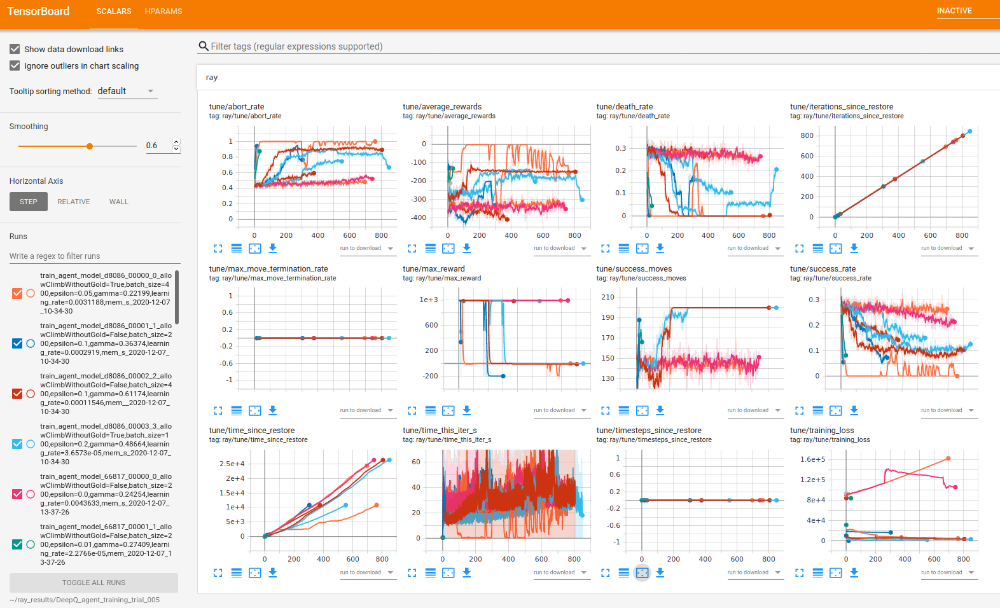

Given more time, and more experiments, the hyperparameter space affect of training performance could be analyzed, as seen below.

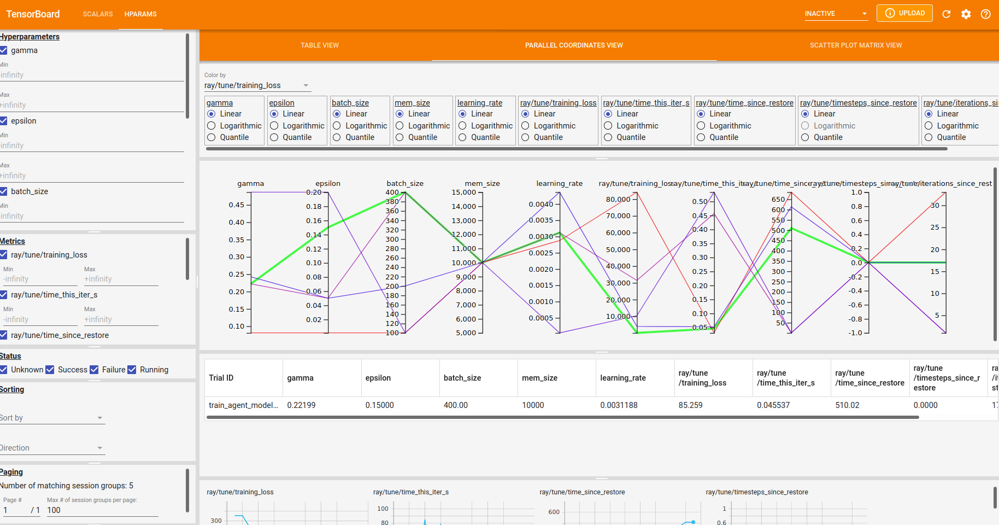

# Conclusion
It seems that with the proper tuning of hyperparameters, reinforcement learning with the DeepQ learning approach is probably possible.  However, it probably requires careful selection of hyperparameters.

Using a more sophisitcated hyperparameter tuning approach, including schedulers that allow for automatic early stopping, in addition to more computational resources, would probably be the best way to extend this excercise.

Lastly, if I were to do this again, I would probably store a wider variety of statistical measurements on the agent's performance.  The experiments are expensive, and I think correlating how hyperparameter selection affects the model performance requires more statistical metrics on the agent's performance.  